In [1]:
from PIL import Image, ImageDraw
import random
import seaborn as sns
import cProfile
import pstats
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

def matrix(string):
    return np.array(list(map(int, string.replace('\xa0','0').split(','))))

class Nonogram:
    def __init__(self, height = 30, width = 30, step_size = 25):
        
        image = Image.new(mode='L', size=(height* step_size, width * step_size), color=255)

        # Draw some lines
        draw = ImageDraw.Draw(image)
        y_start = 0
        y_end = image.height

        for x in range(0, image.width, step_size):
            line = ((x, y_start), (x, y_end))
            draw.line(line, fill=128)

        x_start = 0
        x_end = image.width

        for y in range(0, image.height, step_size):
            line = ((x_start, y), (x_end, y))
            draw.line(line, fill=128)
        
        self.step_size = step_size
        self.imgdraw = ImageDraw.Draw(image)
        self.image = image  
        
    def color(self,i,j):        
        self.imgdraw.rectangle([(i * self.step_size, j * self.step_size),((i + 1) * self.step_size,(j + 1) *self.step_size)], fill = 0)
    

    def draw(self,i,j,text):
        i= (i + 0.4) * self.step_size
        j= (j + 0.3) * self.step_size
        self.imgdraw.text((i,j), text, fill =0)

    def matrixdraw(self,M, start = (0,0)):
        for i, m in enumerate(M):
            for j, v in enumerate(m):
                self.draw(i + start[0],j + start[1],str(v) if v != 0 else '')


class Matrix(Nonogram):
    def __init__(self,data):
        size = (data['sizeCol'],data['sizeRow'])
        c = matrix(data['colClues']).reshape(size[0],-1).T
        r = matrix(data['rowClues']).reshape(-1,size[1]).T
        super().__init__(r.shape[0] + c.shape[0],r.shape[1] + c.shape[1])
        self.matrixdraw(r, start = (c.shape[0],0))
        self.matrixdraw(c, start = (0,r.shape[1]))
        self.emptyshape = (c.shape[0],r.shape[1])
        self.c = c.T
        self.r = r
        self.difficulty = data['difficulty']
        self.shape = (c.shape[1],r.shape[0])
        self.solution = data['solution']
        self.imagecopy = self.image.copy()
        self.R = [{'len':len([c for c in r if c!=0]),
                 'sum': sum(r),
                 'entity':np.array([[c] for c in r if c!=0])} for r in self.r]
        self.C = [{'len':len([c for c in r if c!=0]),
                 'sum': sum(r),
                 'entity':np.array([[c] for c in r if c!=0])} for r in self.c]
        
    def Mdraw(self,M = None):
        if(M is None):
            M = np.zeros(self.shape)
            
        self.image = self.imagecopy.copy()
        self.imgdraw = ImageDraw.Draw(self.image)
        M = M.T
        for i, m in enumerate(M):
            for j, v in enumerate(m):
                if(v):
                    self.color(i + self.emptyshape[0],j + self.emptyshape[1])
        return self.image
                    



In [4]:
df = pd.read_csv('nonogram.csv')
df.iloc[300]['solution']

'http://static.nonograms.org/files/nonograms/large/fialki10_12_1_1p.png'

In [113]:
def Stats(f):
    profile = cProfile.Profile()
    profile.runcall(f)
    ps = pstats.Stats(profile)
    ps.print_stats()

In [114]:
class AIC:
    def __init__(self, M):
        mask = np.ones(M.shape,dtype=bool)
        nmask = np.ones(M.shape,dtype=bool)
        for i,c in enumerate(M.C):
            if(1-c['sum']):
             mask[i][-c['sum']+1:] = False
            nmask[i][c['len']:] = False
        self.mask = mask
        self.nmask = nmask      
        self.M = M
        self.shape = M.shape
        
    def generate(self):
        R = (np.argsort(1-np.random.rand(*self.shape)*self.mask)+1) * self.nmask
        g = np.zeros(self.shape, dtype = bool)
        for i,r in enumerate(R):
            for j in r:
                if(j):
                     g[i][j-1] = True
        return g
            
        
    def binify(arr,n):
        return (np.array([*np.binary_repr(arr).zfill(n)]) == '1')[::-1]
    
    def unmaskop(row, arr):
        (iones,) = np.where(row)
        shift = np.roll(arr,1)
        shift[0] = 0
        iones = 2**(iones +np.cumsum(shift) )      
        return AIC.binify(np.sum((2**(arr)-1)*iones),len(row))
    
    def unmask(self,M):
        return np.vstack([AIC.unmaskop(m,n[n!=0]) for m,n in zip(M,self.M.c)])


    def crossover(self,M1,M2):
        X = M1 ^ M2
        R = np.argsort(1-(np.random.rand(*self.shape)*X))        
        g = np.zeros(self.shape, dtype = bool)
        for i,(m,r) in enumerate(zip(np.sum(X,1)//2,R)):
            for j in r[:m]:
              g[i,j] = True
                
        return g | (M1 & M2)        
    
    
    def scmutate(c,nm):
        (one,) = np.nonzero(c)
        if(nm > len(one)):
            return c
        m = np.random.choice(np.arange(len(one)),nm,replace=False)
        k = (random.random()>0.5)*2-1
        c[one[m]] = False
        c[one[m]+ k] = True
        
        return c
    
    def vscmutate(mask,c,*args,**kwargs):
        m = AIC.scmutate(np.copy(c),*args,**kwargs) & mask
        if np.sum(m)!=np.sum(c): return c        
        return m
    
    def mutate(self,A,mrate = 0.95,mstd=1):        
        while True:
            if(random.random() > mrate):
                break
            i = np.random.choice(np.arange(len(A)))
            A[i] = AIC.vscmutate(self.mask[i],A[i],np.abs(int(np.random.normal(0,mstd)))+1)
        return A
    
    def costmatrix(self):
        def LC(n,k):
            def LF(n):
                return np.sum(np.log(np.arange(1,n+1)))
            """
            logarithm of n choose k
            """
            return LF(n)-LF(k)-LF(n-k)
        
        

    
class AIR(AIC):
    def __init__(self, M):
        shape = (M.shape[1],M.shape[0])
        mask = np.ones(shape,dtype=bool)
        nmask = np.ones(shape,dtype=bool)
        for i,c in enumerate(M.R):
            if(1-c['sum']):
             mask[i][-c['sum']+1:] = False
            nmask[i][c['len']:] = False
        self.mask = mask
        self.nmask = nmask      
        self.M = M
        self.shape = M.shape

    def unmask(self,M):
        return np.vstack([AIC.unmaskop(m,n[n!=0]) for m,n in zip(M,self.M.r)])
    
    
    
    

In [115]:
def LC(n,k):
    def LF(n):
        return np.sum(np.log(np.arange(1,n+1)))
    """
    logarithm of n choose k
    """
    return LF(n)-LF(k)-LF(n-k)


In [119]:
class Fitness:
    def setup(aic,air):
        C = np.array([LC(n,k) for n,k in zip(np.sum(aic.mask,1),np.sum(aic.nmask,1))])
        R = np.array([LC(n,k) for n,k in zip(np.sum(air.mask,1),np.sum(air.nmask,1))])
        FM = (C.reshape(-1,1) @ R.reshape(1,-1))
        FM[FM == 0] = 1/np.sum(FM)            
        Fitness.matrix = 1/FM
        
    def goal():
        return np.sum(Fitness.matrix)
        
    def fitness(ai):
        return np.sum((~(ai.R ^ ai.C))* Fitness.matrix)    
    
class AI:
    def __init__(self,M,aic,air):
        self.M = M
        self.aic = aic
        self.air = air
        self._C = aic.generate()
        self._R = air.generate()
        self.goal = Fitness.goal()
        
    @property
    def C(self):
        return self.aic.unmask(self._C)
    
    @property
    def R(self):
        return self.air.unmask(self._R).T   
    
    @property
    def fitness(self):
        return Fitness.fitness(self)
    
    def copy(self):
        ai =  AI(self.M,self.aic,self.air)
        ai._C = np.copy(self._C)
        ai._R = np.copy(self._R)
        return ai
    
    @np.vectorize
    def crossover(self, ai2, mrate = 0.95):        
        child = AI(self.M,self.aic,self.air)
        
        
        C = self.aic.crossover(self._C,ai2._C)
        R = self.air.crossover(self._R,ai2._R)
        C,R = self.aic.mutate(C,mrate = mrate),self.air.mutate(R,mrate = mrate)
        child._R = R 
        child._C = C
        
        return child
        
        

In [120]:
df = pd.read_csv('nonogram.csv')
M = Matrix(df.iloc[300])
M.solution,M.difficulty
aic = AIC(M)
air = AIR(M)

***goal**** 
29.388346740700616
max fitness:  18.609165269681526 10.77918147101909


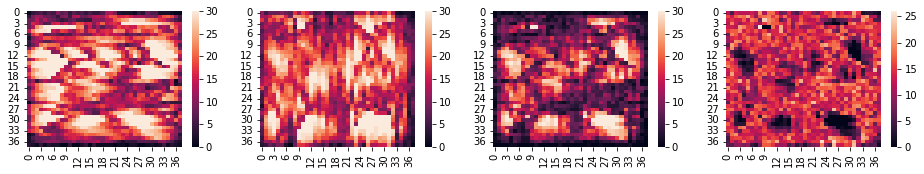

max fitness:  18.672861095901922 10.715485644798694
max fitness:  18.630070159546182 10.758276581154433
max fitness:  18.824008721464125 10.56433801923649
max fitness:  18.96966576686942 10.418680973831197
max fitness:  18.77199694128979 10.616349799410827
max fitness:  19.267443351790952 10.120903388909664
max fitness:  19.63848921589037 9.749857524810245
max fitness:  19.492666690268116 9.8956800504325
max fitness:  19.436521942004283 9.951824798696332
max fitness:  19.680944048308092 9.707402692392524
max fitness:  19.507376192922422 9.880970547778194
max fitness:  19.47407036464184 9.914276376058776
max fitness:  19.374108070488703 10.014238670211913
max fitness:  19.643227653575632 9.745119087124984
max fitness:  19.681728433117158 9.706618307583458
max fitness:  19.917809343415534 9.470537397285081
max fitness:  19.647772216459682 9.740574524240934
max fitness:  19.718028024160255 9.670318716540361
max fitness:  20.20781242672281 9.180534313977805
max fitness:  20.218433044059235

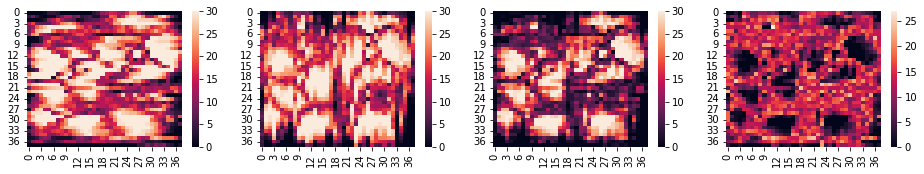

max fitness:  20.695333059806156 8.69301368089446
max fitness:  20.512257255676946 8.87608948502367
max fitness:  20.586331372932346 8.80201536776827
max fitness:  20.921170297609475 8.467176443091141
max fitness:  20.94870680486158 8.439639935839036
max fitness:  21.12574812679172 8.262598613908896
max fitness:  20.74694475457168 8.641401986128937
max fitness:  21.007533372628295 8.380813368072321
max fitness:  20.80089252602034 8.587454214680275
max fitness:  21.033830684781577 8.354516055919039
max fitness:  20.87647730096179 8.511869439738827
max fitness:  21.034824766039154 8.353521974661462
max fitness:  21.180836495748014 8.207510244952601
max fitness:  21.19199109736946 8.196355643331156
max fitness:  20.980035519562094 8.408311221138522
max fitness:  20.946882528469818 8.441464212230798
max fitness:  20.852696119399116 8.5356506213015
max fitness:  20.962594257636326 8.42575248306429
max fitness:  21.12518509351208 8.263161647188536
max fitness:  21.146146035415182 8.242200705

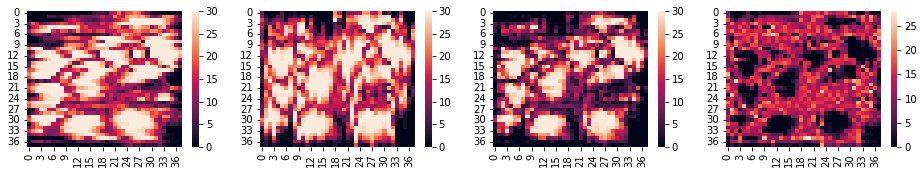

max fitness:  21.060326510416893 8.328020230283723
max fitness:  21.129960208702606 8.25838653199801
max fitness:  21.156266304951274 8.232080435749342
max fitness:  21.049557013696027 8.338789727004588
max fitness:  21.117743826875945 8.270602913824671
max fitness:  21.14589126820873 8.242455472491887
max fitness:  21.225742999409896 8.16260374129072
max fitness:  21.298328406499245 8.090018334201371
max fitness:  21.19972949493962 8.188617245760994
max fitness:  21.322892189595315 8.0654545511053
max fitness:  21.728836025372004 7.6595107153286115
max fitness:  21.405207062943404 7.983139677757212
max fitness:  21.129829083374915 8.2585176573257
max fitness:  21.338496471365573 8.049850269335042
max fitness:  21.49560134609079 7.892745394609825
max fitness:  21.378210599618725 8.01013614108189
max fitness:  21.384455776794347 8.003890963906269
max fitness:  21.41245516703644 7.975891573664175
max fitness:  21.356621970129908 8.031724770570708
max fitness:  21.586076789443066 7.802269

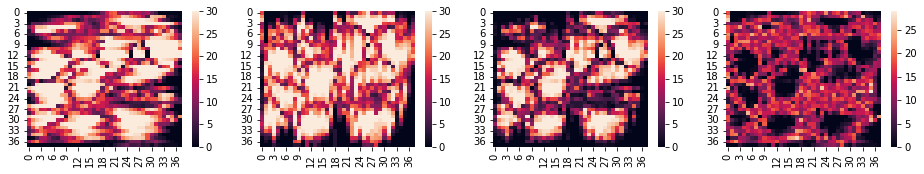

max fitness:  21.509959625421462 7.878387115279153
max fitness:  21.837269475297788 7.551077265402828
max fitness:  21.65783535438372 7.730511386316895
max fitness:  21.60188789199787 7.786458848702747
max fitness:  21.248706537009802 8.139640203690814
max fitness:  21.507035871288256 7.88131086941236
max fitness:  21.651625574820134 7.736721165880482
max fitness:  21.72017240870333 7.668174331997285
max fitness:  21.549284450200645 7.839062290499971
max fitness:  21.337093210143347 8.051253530557268
max fitness:  21.47803606531594 7.910310675384675
max fitness:  21.448311572093715 7.940035168606901
max fitness:  21.66445721504777 7.723889525652847
max fitness:  21.39517322933031 7.993173511370305
max fitness:  21.517359697648423 7.870987043052192
max fitness:  21.402034213545633 7.986312527154983
max fitness:  21.383130520914893 8.005216219785723
max fitness:  21.578557112360382 7.8097896283402335
max fitness:  21.499168170514835 7.889178570185781
max fitness:  21.40637388126531 7.981

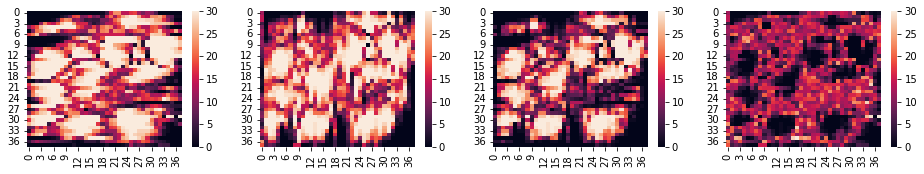

max fitness:  21.47091962271545 7.9174271179851665
max fitness:  21.47022243691186 7.918124303788755
max fitness:  21.477433775412216 7.9109129652884
max fitness:  21.840422069597217 7.547924671103399
max fitness:  21.55741851162903 7.830928229071585
max fitness:  21.56688485430322 7.8214618863973975
max fitness:  21.433146657031507 7.955200083669109
max fitness:  21.47987697943126 7.908469761269355
max fitness:  21.47386896219384 7.914477778506775
max fitness:  21.410001558350906 7.97834518234971
max fitness:  21.502643189807287 7.885703550893329
max fitness:  21.405122704039613 7.983224036661003
max fitness:  21.44766288685981 7.940683853840806
max fitness:  21.47395971993888 7.914387020761737
max fitness:  21.726486961064964 7.661859779635652
max fitness:  21.627832092013634 7.760514648686982
max fitness:  21.402040732683737 7.986306008016879
max fitness:  21.543726734843293 7.8446200058573226
max fitness:  21.590654392305407 7.797692348395209
max fitness:  21.430500451757094 7.9578

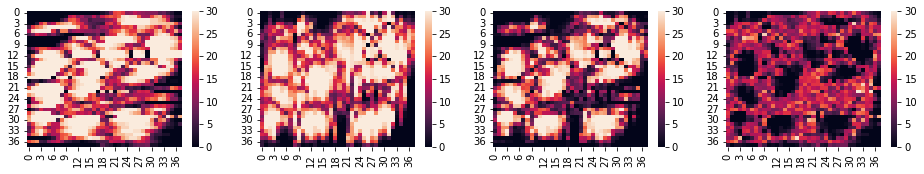

max fitness:  21.766663701073416 7.6216830396272
max fitness:  21.83593369219222 7.552413048508395
max fitness:  21.881209608853936 7.5071371318466795
max fitness:  21.7229026077804 7.665444132920214
max fitness:  21.60761099871958 7.780735741981037
max fitness:  21.643409084199615 7.744937656501001
max fitness:  21.64938182604904 7.738964914651575
max fitness:  21.647019731142763 7.741327009557853
max fitness:  21.667739488919672 7.720607251780944
max fitness:  21.754867992239298 7.633478748461318
max fitness:  21.892163192792147 7.496183547908469
max fitness:  21.83907301987461 7.549273720826005
max fitness:  21.772821963889275 7.615524776811341
max fitness:  21.619507165053243 7.768839575647373
max fitness:  21.941734004712682 7.446612735987934
max fitness:  21.655985181482798 7.732361559217818
max fitness:  21.77450700202423 7.613839738676386
max fitness:  21.790471458898026 7.59787528180259
max fitness:  21.763986297888675 7.624360442811941
max fitness:  21.67082192874973 7.717524

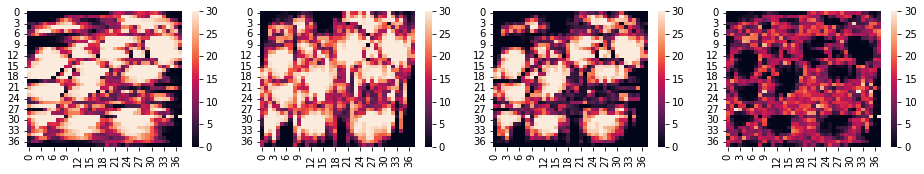

max fitness:  21.758378611328286 7.62996812937233
max fitness:  21.661578834757165 7.726767905943451
max fitness:  21.85560600746582 7.532740733234796
max fitness:  21.798590569626924 7.589756171073692
max fitness:  21.860847238662622 7.527499502037994
max fitness:  21.737230399291782 7.651116341408834
max fitness:  21.952075717804703 7.436271022895912
max fitness:  21.96282685690412 7.425519883796497
max fitness:  21.702607629439576 7.685739111261039
max fitness:  21.660427747767514 7.727918992933102
max fitness:  21.739044361841565 7.649302378859051
max fitness:  21.713958860069383 7.674387880631233
max fitness:  21.821457196188213 7.566889544512403
max fitness:  21.85896634064537 7.529380400055246
max fitness:  21.986236985557642 7.402109755142973
max fitness:  22.263087344416157 7.125259396284459
max fitness:  21.97772907426767 7.410617666432945
max fitness:  21.998325194418197 7.390021546282419
max fitness:  21.897863343697118 7.490483397003498
max fitness:  21.912927328882887 7.4

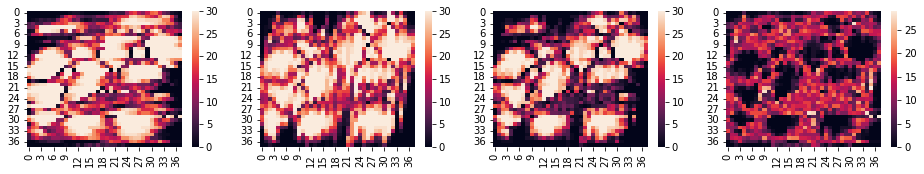

max fitness:  22.073026512100107 7.315320228600509
max fitness:  21.687486675708683 7.700860064991932
max fitness:  21.91473093212467 7.473615808575946
max fitness:  21.961627325766614 7.426719414934002
max fitness:  21.720850290264604 7.667496450436012
max fitness:  22.187267439481754 7.201079301218861
max fitness:  21.85818262714649 7.530164113554125
max fitness:  21.612638478104138 7.775708262596478
max fitness:  21.813910017403998 7.574436723296618
max fitness:  21.666972704644362 7.721374036056254
max fitness:  21.666845633497168 7.721501107203448
max fitness:  21.66460672966557 7.723740011035044
max fitness:  21.712118529991415 7.676228210709201
max fitness:  21.689132884645026 7.699213856055589
max fitness:  21.660877062792714 7.7274696779079015
max fitness:  21.695609554586643 7.692737186113973
max fitness:  21.81597773124738 7.5723690094532365
max fitness:  21.62223641307324 7.766110327627377
max fitness:  21.726156757139123 7.662189983561493
max fitness:  21.733907067978713 7

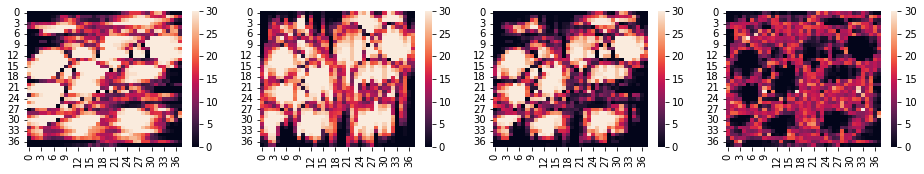

max fitness:  21.52668777020555 7.861658970495064
max fitness:  21.620753521559497 7.767593219141119
max fitness:  21.73707519898972 7.651271541710894
max fitness:  21.470200035291995 7.9181467054086205
max fitness:  21.665624821263243 7.722721919437372
max fitness:  21.719771810556594 7.668574930144022
max fitness:  21.38638759176443 8.001959148936187
max fitness:  21.56448305946406 7.823863681236556
max fitness:  21.653408023157553 7.734938717543063
max fitness:  21.396989974805535 7.99135676589508
max fitness:  21.551410151024605 7.836936589676011
max fitness:  21.22697521073127 8.161371529969347
max fitness:  21.57696981565951 7.811376925041106
max fitness:  21.27696149629635 8.111385244404264
max fitness:  21.407273853422737 7.981072887277879
max fitness:  21.573602127882094 7.814744612818522
max fitness:  21.26521955780587 8.123127182894745
max fitness:  21.648792472553538 7.739554268147078
max fitness:  21.50757818032114 7.880768560379476
max fitness:  21.424913185486524 7.96343

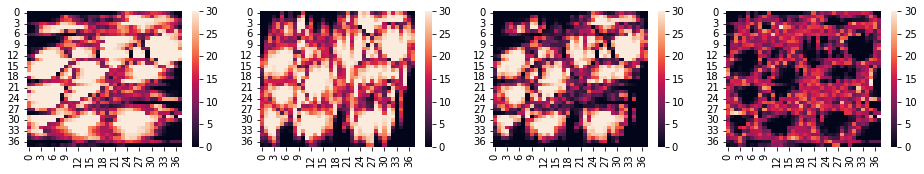

max fitness:  21.55914596238545 7.829200778315165
max fitness:  21.594470240173273 7.793876500527343
max fitness:  21.50153740802152 7.886809332679096
max fitness:  21.40478699997352 7.983559740727095
max fitness:  21.88573533193891 7.502611408761705
max fitness:  21.575586509799972 7.812760230900643
max fitness:  21.48193609659033 7.906410644110284
max fitness:  21.471908839558292 7.916437901142324
max fitness:  21.65785188375701 7.730494856943604
max fitness:  21.67599911904758 7.712347621653034
max fitness:  21.605152100049335 7.783194640651281
max fitness:  21.673949484991535 7.7143972557090805
max fitness:  21.82819811399947 7.560148626701146
max fitness:  21.847323504027084 7.5410232366735315
max fitness:  21.524458844092678 7.863887896607938
max fitness:  21.673178060884865 7.715168679815751
max fitness:  21.824111240185324 7.5642355005152915
max fitness:  21.723396847496907 7.664949893203708
max fitness:  21.509748976267865 7.878597764432751
max fitness:  21.49629021857269 7.89

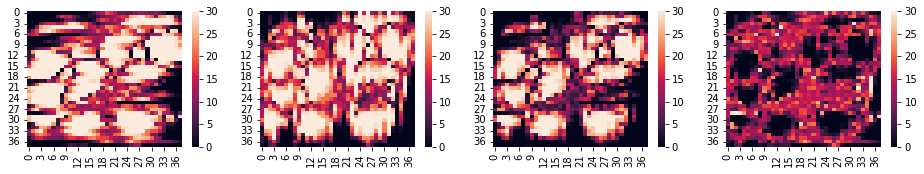

max fitness:  21.74875042178633 7.639596318914286
max fitness:  21.7240173952583 7.664329345442315
max fitness:  21.87310902867756 7.515237712023055
max fitness:  21.899439269109635 7.488907471590981
max fitness:  21.82697504759294 7.561371693107677
max fitness:  21.755663190951115 7.632683549749501
max fitness:  21.715822128805186 7.67252461189543
max fitness:  21.793008769006768 7.595337971693848
max fitness:  21.91023073883305 7.478116001867566
max fitness:  21.805130759427954 7.583215981272662
max fitness:  21.81734890224218 7.570997838458435
max fitness:  21.86459953839771 7.523747202302907
max fitness:  22.18664169512702 7.201705045573597
max fitness:  22.176236465401388 7.212110275299228
max fitness:  21.82802832995671 7.560318410743907
max fitness:  21.788981183892705 7.599365556807911
max fitness:  21.80066727221159 7.587679468489025
max fitness:  22.024473838854846 7.36387290184577
max fitness:  21.89200637463501 7.496340366065606
max fitness:  21.86376763770132 7.52457910299

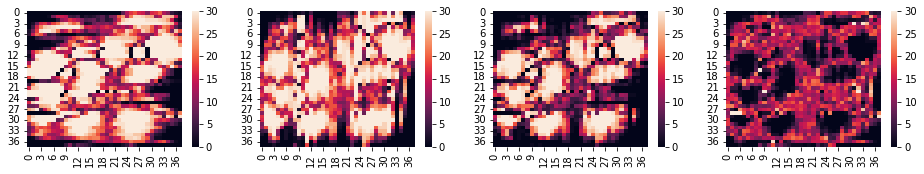

max fitness:  22.06650214505506 7.321844595645555
max fitness:  21.90063119505298 7.487715545647635
max fitness:  21.720159880638313 7.668186860062303
max fitness:  21.765539049460365 7.622807691240251
max fitness:  21.91402239348154 7.474324347219074
max fitness:  21.80338178751463 7.584964953185985
max fitness:  21.984388115633003 7.403958625067613
max fitness:  22.305526186040115 7.0828205546605005
max fitness:  22.272442970094765 7.1159037706058506
max fitness:  22.134919256122224 7.253427484578392
max fitness:  22.234244075176015 7.154102665524601
max fitness:  22.181730299503183 7.206616441197433
max fitness:  22.028373925327926 7.359972815372689
max fitness:  22.19271672977609 7.195630010924525
max fitness:  22.103187281070866 7.2851594596297495
max fitness:  22.024790473134235 7.363556267566381
max fitness:  22.007584088556104 7.3807626521445115
max fitness:  21.91424075629181 7.474105984408805
max fitness:  22.24237753476841 7.145969205932207
max fitness:  22.124090546653328 7

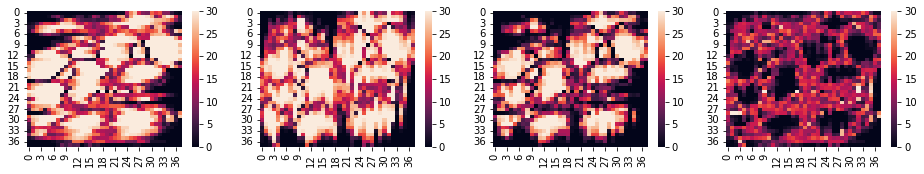

max fitness:  21.84059530169074 7.547751439009875
max fitness:  21.8271524902069 7.561194250493717
max fitness:  21.905325559480154 7.483021181220462
max fitness:  21.80859381773204 7.579752922968577
max fitness:  21.763814100974372 7.624532639726244
max fitness:  21.79505579286233 7.5932909478382875
max fitness:  22.007898386044495 7.380448354656121
max fitness:  22.00407808777677 7.384268652923847
max fitness:  21.984997186579 7.403349554121615
max fitness:  22.10449013908812 7.283856601612495
max fitness:  21.80388472603624 7.584462014664375
max fitness:  21.771861374712074 7.616485365988542
max fitness:  21.683211297128555 7.705135443572061
max fitness:  21.719960712379674 7.668386028320942
max fitness:  21.685297292039124 7.703049448661492
max fitness:  21.98677042728834 7.401576313412274
max fitness:  21.809697855343096 7.57864888535752
max fitness:  21.97396744994573 7.414379290754887
max fitness:  22.015690649954855 7.37265609074576
max fitness:  22.338545692376922 7.0498010483

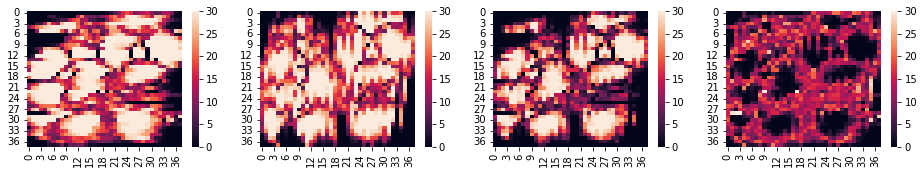

max fitness:  21.614129899452585 7.77421684124803
max fitness:  21.818898954248056 7.56944778645256
max fitness:  21.884694984175983 7.503651756524633
max fitness:  22.116459466307987 7.271887274392629
max fitness:  21.98554324892133 7.402803491779284
max fitness:  21.99831835490596 7.390028385794654
max fitness:  22.042953081856158 7.345393658844458
max fitness:  21.91960580769946 7.468740933001154
max fitness:  22.01620524820041 7.372141492500205
max fitness:  22.348540964964258 7.039805775736358
max fitness:  21.979157444732827 7.4091892959677885
max fitness:  22.10980703444178 7.278539706258837
max fitness:  22.072379042004528 7.315967698696088
max fitness:  21.895472992571626 7.492873748128989
max fitness:  22.016217255531117 7.3721294851694985
max fitness:  22.15404495784271 7.234301782857905
max fitness:  22.052734353063947 7.335612387636669
max fitness:  22.05327016313775 7.335076577562866
max fitness:  21.744435736241414 7.643911004459202
max fitness:  21.635988604980284 7.752

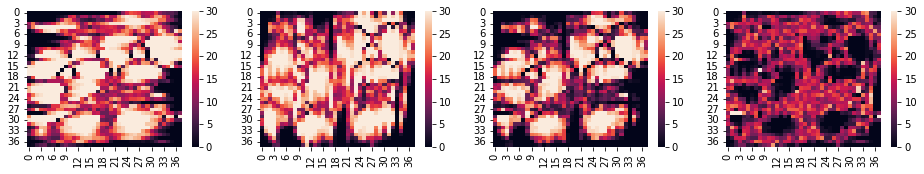

max fitness:  21.919002644041065 7.469344096659551
max fitness:  21.824977635683414 7.563369105017202
max fitness:  21.853199997949755 7.535146742750861
max fitness:  22.128715790747748 7.259630949952868
max fitness:  21.685028038934703 7.703318701765912
max fitness:  21.857363527351296 7.5309832133493195
max fitness:  21.5959316264808 7.792415114219814
max fitness:  22.015385483377223 7.372961257323393
max fitness:  21.686426934472195 7.701919806228421
max fitness:  22.033054387133166 7.3552923535674495
max fitness:  21.990105032765833 7.398241707934783
max fitness:  21.836718000512526 7.5516287401880895
max fitness:  21.788272192720637 7.600074547979979
max fitness:  21.85623102788182 7.532115712818797
max fitness:  21.983641034085363 7.404705706615253
max fitness:  21.878112258113074 7.510234482587542
max fitness:  21.910641737198308 7.477705003502308
max fitness:  22.108946924434143 7.279399816266473
max fitness:  21.93231512169679 7.456031619003827
max fitness:  21.866688586831806

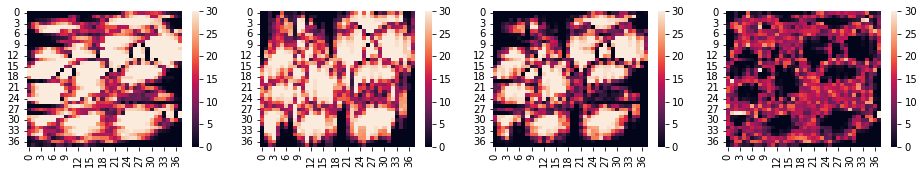

max fitness:  22.042455727782503 7.345891012918113
max fitness:  21.989457429942426 7.3988893107581895
max fitness:  21.92880246273782 7.459544277962795
max fitness:  22.119719570347286 7.26862717035333
max fitness:  21.987602539825147 7.400744200875469
max fitness:  21.85324199820748 7.535104742493136
max fitness:  21.88064400111174 7.507702739588876
max fitness:  22.185599810591942 7.202746930108674
max fitness:  21.906892462202613 7.481454278498003
max fitness:  22.070929260182055 7.317417480518561
max fitness:  22.06687934764168 7.321467393058935
max fitness:  21.733735583225425 7.654611157475191
max fitness:  21.85897075779502 7.529375982905595
max fitness:  22.03568046879333 7.352666271907285
max fitness:  21.859677585660407 7.528669155040209
max fitness:  22.22988600492977 7.158460735770845
max fitness:  21.941602201077714 7.446744539622902
max fitness:  21.691566606171094 7.696780134529522
max fitness:  22.003152161810917 7.385194578889699
max fitness:  21.994439103768876 7.393

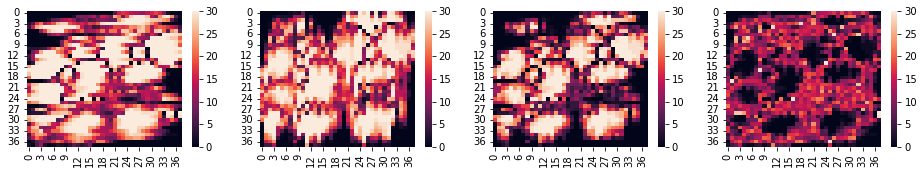

max fitness:  21.699752881811715 7.6885938588889005
max fitness:  21.654922267099668 7.733424473600948
max fitness:  21.828646757608862 7.559699983091754
max fitness:  21.750194325771893 7.638152414928722
max fitness:  21.658208872158035 7.730137868542581
max fitness:  21.66346096664911 7.724885774051504
max fitness:  21.963960584634215 7.424386156066401
max fitness:  21.752222467754496 7.63612427294612
max fitness:  21.75542071396611 7.632926026734506
max fitness:  21.883898346633778 7.504448394066838
max fitness:  21.87336550078254 7.514981239918075
max fitness:  21.90891565000056 7.479431090700057
max fitness:  21.911890110362243 7.476456630338372
max fitness:  21.876540279282565 7.51180646141805
max fitness:  21.821202666011263 7.567144074689352
max fitness:  21.953716136061665 7.434630604638951
max fitness:  21.777673407427145 7.610673333273471
max fitness:  21.731570858141474 7.656775882559142
max fitness:  22.038908573540247 7.349438167160368
max fitness:  21.996673756410736 7.3

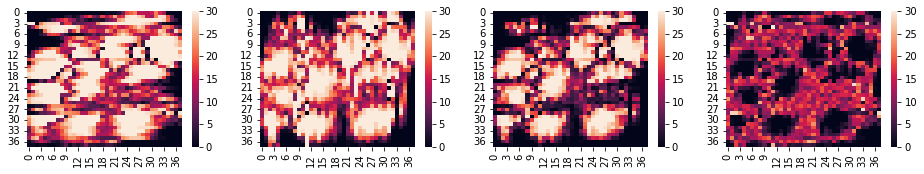

max fitness:  22.069523141068025 7.318823599632591
max fitness:  22.33578373915138 7.052563001549235
max fitness:  21.762921151840917 7.625425588859699
max fitness:  22.01607885567195 7.372267885028666
max fitness:  21.942186667324677 7.446160073375939
max fitness:  21.796945045317187 7.5914016953834285
max fitness:  22.01981041620423 7.368536324496386
max fitness:  21.682108274493253 7.706238466207363
max fitness:  21.922615953463996 7.46573078723662
max fitness:  21.623102213860754 7.7652445268398615
max fitness:  21.447305966340558 7.941040774360058
max fitness:  21.839856456442078 7.548490284258538
max fitness:  21.5275916265408 7.860755114159815
max fitness:  21.779591315419353 7.608755425281263
max fitness:  21.60791389284937 7.780432847851245
max fitness:  21.558869985275344 7.829476755425272
max fitness:  21.605401254892826 7.78294548580779
max fitness:  21.579412131329867 7.808934609370748
max fitness:  21.62824371418178 7.760103026518834
max fitness:  21.83821136228935 7.5501

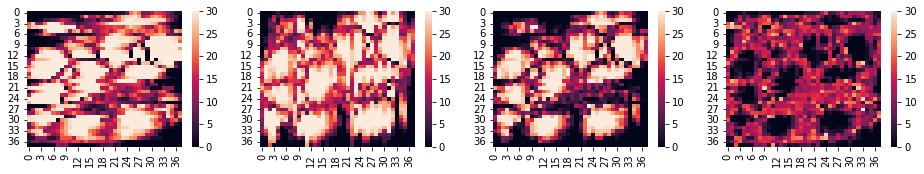

max fitness:  21.973665168200483 7.4146815725001325
max fitness:  21.950226341414652 7.438120399285964
max fitness:  21.693603194427457 7.694743546273159
max fitness:  21.807460452289686 7.58088628841093
max fitness:  21.78635388521707 7.6019928554835445
max fitness:  21.763377048684433 7.624969692016183
max fitness:  21.612854173928085 7.775492566772531
max fitness:  21.853607981195143 7.534738759505473
max fitness:  21.695771893121467 7.692574847579149
max fitness:  21.82915083786267 7.559195902837946
max fitness:  21.690561473935173 7.697785266765443
max fitness:  21.870894799271785 7.517451941428831
max fitness:  21.685911745062658 7.702434995637958
max fitness:  22.04055893589858 7.347787804802035
max fitness:  21.617767938654715 7.7705788020459
max fitness:  21.7253794008032 7.662967339897417
max fitness:  21.9907655397669 7.397581200933715
max fitness:  21.66518473255268 7.723162008147934
max fitness:  21.41976989376665 7.968576846933967
max fitness:  21.56145035248737 7.8268963

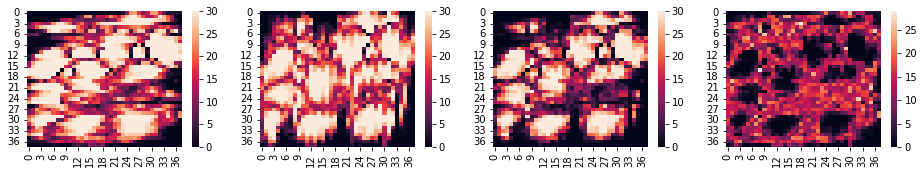

max fitness:  21.858000110828847 7.530346629871769
max fitness:  21.64453496825957 7.743811772441045
max fitness:  21.70589370442167 7.682453036278947
max fitness:  21.87578536685504 7.512561373845575
max fitness:  21.760952737681237 7.627394003019379
max fitness:  21.840853932872452 7.547492807828164
max fitness:  21.72590765091472 7.662439089785895
max fitness:  21.599201603380685 7.789145137319931
max fitness:  21.786102982278507 7.602243758422109
max fitness:  21.64950092596484 7.738845814735775
max fitness:  21.623320045331848 7.765026695368768
max fitness:  21.65928695339941 7.729059787301207
max fitness:  21.982413892788472 7.405932847912144
max fitness:  22.01294638162213 7.375400359078487
max fitness:  21.839100049216746 7.549246691483869
max fitness:  21.58084473871076 7.807502001989857
max fitness:  21.506708435210133 7.881638305490483
max fitness:  21.696752131182677 7.691594609517939
max fitness:  21.74516290414506 7.643183836555554
max fitness:  21.623067757914953 7.76527

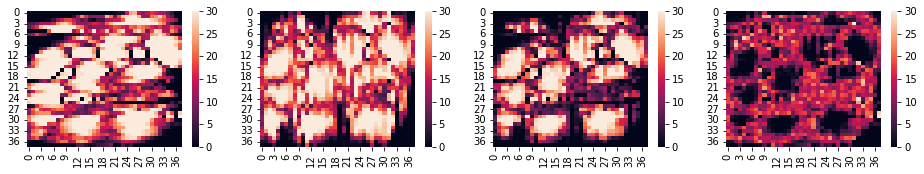

max fitness:  21.68614896229274 7.702197778407875
max fitness:  21.51187339380562 7.876473346894997
max fitness:  21.528320095956353 7.860026644744263
max fitness:  21.695090001527564 7.6932567391730515
max fitness:  21.61434526200924 7.774001478691375
max fitness:  21.6375694742177 7.750777266482917
max fitness:  21.45925182677985 7.929094913920764
max fitness:  21.439105022406167 7.949241718294449
max fitness:  21.567785492446795 7.820561248253821
max fitness:  22.129483098256564 7.258863642444052
max fitness:  21.935867704126615 7.452479036574001
max fitness:  21.801504613437295 7.586842127263321
max fitness:  22.03173360422172 7.356613136478895
max fitness:  22.154678810083723 7.2336679306168925
max fitness:  21.996022887639903 7.392323853060713
max fitness:  21.83026139361069 7.558085347089925
max fitness:  21.963550297346025 7.424796443354591
max fitness:  21.838212387396275 7.55013435330434
max fitness:  21.87659554094509 7.511751199755526
max fitness:  21.724908826310575 7.6634

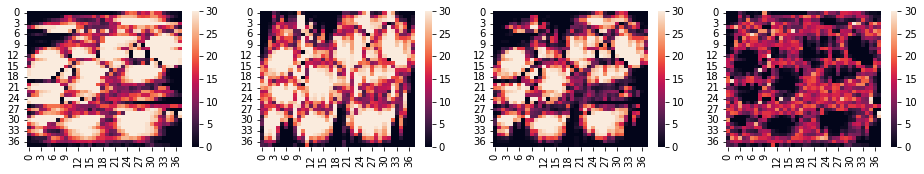

max fitness:  21.90268426449928 7.4856624762013375
max fitness:  21.906185809080526 7.48216093162009
max fitness:  22.020835984527125 7.367510756173491
max fitness:  21.910634085005473 7.477712655695143
max fitness:  22.028669327026336 7.35967741367428
max fitness:  21.97660994378345 7.411736796917165
max fitness:  21.77921608941803 7.609130651282587
max fitness:  21.815582665313954 7.572764075386662
max fitness:  21.95357116560625 7.434775575094367
max fitness:  22.015882451432823 7.372464289267793
max fitness:  21.89393095903889 7.494415781661726
max fitness:  21.977680509179155 7.410666231521461
max fitness:  21.732073768000706 7.6562729726999095
max fitness:  21.871934327868985 7.516412412831631
max fitness:  21.46045379885439 7.927892941846224
max fitness:  21.618176985878293 7.770169754822323
max fitness:  21.674753833042466 7.71359290765815
max fitness:  21.59203615650148 7.796310584199137
max fitness:  21.595945935850704 7.792400804849912
max fitness:  21.637758019370782 7.7505

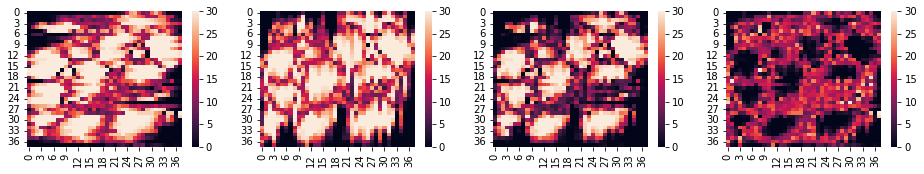

max fitness:  21.47556397223584 7.912782768464776
max fitness:  21.80117265674592 7.587174083954697
max fitness:  21.939882544039442 7.448464196661174
max fitness:  21.7006974141203 7.687649326580317
max fitness:  21.85784114717385 7.530505593526765
max fitness:  21.789693853848796 7.59865288685182
max fitness:  21.795753550270422 7.592593190430193
max fitness:  21.72616730646419 7.662179434236425
max fitness:  21.682511163102987 7.705835577597629
max fitness:  21.646857611927818 7.741489128772798
max fitness:  21.738715203714705 7.649631536985911
max fitness:  21.6825382431227 7.705808497577916
max fitness:  21.80901611605358 7.579330624647035
max fitness:  21.668118758436098 7.720227982264518
max fitness:  21.643241808075004 7.745104932625612
max fitness:  21.45805135759511 7.930295383105506
max fitness:  21.552593706486988 7.835753034213628
max fitness:  21.790649601861002 7.597697138839614
max fitness:  21.73177202288521 7.656574717815406
max fitness:  21.46799016870185 7.920356571

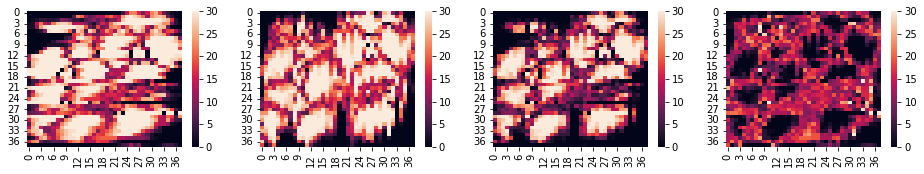

max fitness:  21.697797247726413 7.690549492974203
max fitness:  21.761014968780138 7.627331771920478
max fitness:  21.78759378028441 7.600752960416205
max fitness:  21.6530569911572 7.735289749543416
max fitness:  21.778644215351672 7.609702525348943
max fitness:  21.95478080624578 7.433565934454837
max fitness:  21.785677612896947 7.602669127803669
max fitness:  21.600636357899752 7.787710382800864
max fitness:  21.530194196992724 7.858152543707892
max fitness:  21.828905002268705 7.559441738431911
max fitness:  21.923368432328125 7.4649783083724905
max fitness:  21.7317947547162 7.656551985984414
max fitness:  21.675241755076918 7.713104985623698
max fitness:  21.672002036076265 7.716344704624351
max fitness:  21.794574160374772 7.593772580325844
max fitness:  21.72020468926862 7.668142051431996
max fitness:  21.496048977749947 7.892297762950669
max fitness:  21.585601503623785 7.802745237076831
max fitness:  21.76159010773014 7.626756632970476
max fitness:  21.77761086027556 7.6107

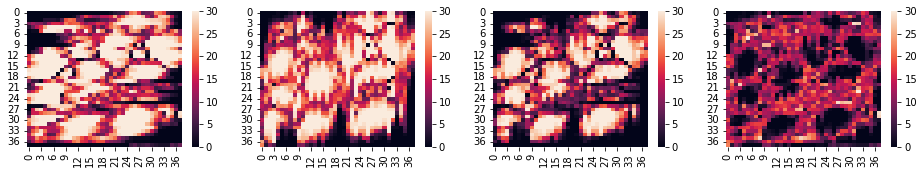

max fitness:  21.583870980272117 7.804475760428499
max fitness:  21.635349016125964 7.7529977245746515
max fitness:  21.829076790158545 7.55926995054207
max fitness:  21.66287925547781 7.725467485222804
max fitness:  21.882372111557 7.505974629143616
max fitness:  21.895658878061756 7.49268786263886
max fitness:  21.92173402598093 7.4666127147196875
max fitness:  21.732823223505463 7.655523517195153
max fitness:  21.787781063740297 7.6005656769603185
max fitness:  22.07198580105457 7.316360939646046
max fitness:  21.776419121889123 7.611927618811492
max fitness:  21.932247283356602 7.456099457344013
max fitness:  22.024178186803184 7.364168553897432
max fitness:  21.99180418915947 7.396542551541145
max fitness:  21.949360731357864 7.438986009342752
max fitness:  22.095542531138364 7.292804209562252
max fitness:  21.978873939326114 7.409472801374502
max fitness:  22.110784303158546 7.27756243754207
max fitness:  21.88240684789116 7.5059398928094545
max fitness:  21.639404471519832 7.748

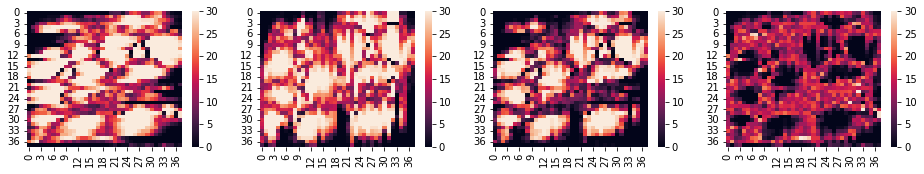

max fitness:  21.721574860609767 7.666771880090849
max fitness:  21.753291717539977 7.635055023160639
max fitness:  21.757140120881157 7.631206619819459
max fitness:  21.48317362409238 7.9051731166082355
max fitness:  21.552347795380996 7.83599894531962
max fitness:  21.805461560818586 7.58288517988203
max fitness:  21.659665840847495 7.728680899853121
max fitness:  22.03112890895651 7.357217831744105
max fitness:  21.782589098427227 7.605757642273389
max fitness:  21.608575000129896 7.77977174057072
max fitness:  21.730305081289693 7.658041659410923
max fitness:  21.924873592191823 7.463473148508793
max fitness:  21.930026399360194 7.458320341340421
max fitness:  21.622356325684102 7.765990415016514
max fitness:  21.601641987642033 7.786704753058583
max fitness:  21.644616816356276 7.74372992434434
max fitness:  21.65926393565445 7.729082805046165
max fitness:  21.511897910608194 7.876448830092421
max fitness:  21.727562314476838 7.660784426223778
max fitness:  21.78425299608388 7.604

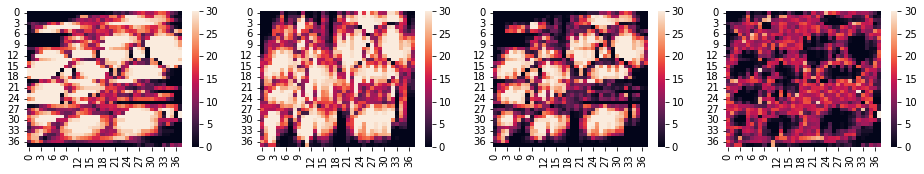

max fitness:  21.788536522264387 7.599810218436229
max fitness:  21.912156383035786 7.47619035766483
max fitness:  21.705965897920017 7.682380842780599
max fitness:  21.646203220892087 7.742143519808529
max fitness:  21.933882276039824 7.454464464660791
max fitness:  22.195081036137214 7.193265704563402
max fitness:  21.749743206088734 7.638603534611882
max fitness:  21.66690726015662 7.721439480543996
max fitness:  21.648130900016493 7.740215840684122
max fitness:  21.562138889687777 7.826207851012839
max fitness:  21.63733483097853 7.751011909722084
max fitness:  21.493357630632527 7.894989110068089
max fitness:  21.667724328236183 7.720622412464433
max fitness:  21.53382666262806 7.854520078072557
max fitness:  21.590532953130346 7.79781378757027
max fitness:  21.68415363489393 7.704193105806684
max fitness:  21.903768171999648 7.484578568700968
max fitness:  21.993162846322278 7.395183894378338
max fitness:  21.616889080148617 7.771457660551999
max fitness:  21.635061978547093 7.75

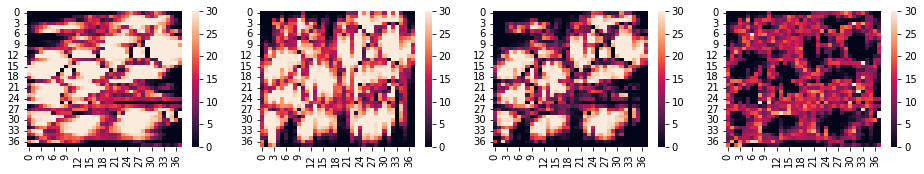

max fitness:  21.85325245824951 7.535094282451105
max fitness:  22.097067178865615 7.291279561835001
max fitness:  21.84972776242614 7.538618978274474
max fitness:  21.96517133890612 7.423175401794495
max fitness:  21.875312352947567 7.5130343877530485
max fitness:  22.026211867198796 7.3621348735018195
max fitness:  21.856898023826336 7.53144871687428
max fitness:  22.02736050812432 7.360986232576295
max fitness:  22.297432287979465 7.090914452721151
max fitness:  21.981589067188516 7.4067576735121
max fitness:  21.919281168622902 7.469065572077714
max fitness:  21.96533800647502 7.423008734225597
max fitness:  21.893010325854696 7.495336414845919
max fitness:  21.71325342640926 7.675093314291356
max fitness:  21.920259926812356 7.4680868138882595
max fitness:  21.927453141623698 7.460893599076918
max fitness:  21.8630684163507 7.525278324349916
max fitness:  21.880966811736528 7.507379928964088
max fitness:  22.04839627623805 7.339950464462564
max fitness:  21.91054472870382 7.477802

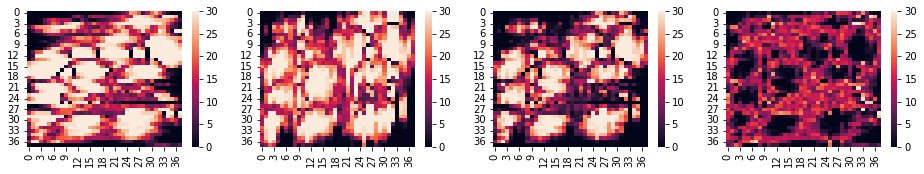

max fitness:  22.28185822532153 7.1064885153790875
max fitness:  21.783563330464325 7.604783410236291
max fitness:  21.772354024567782 7.615992716132833
max fitness:  21.84657935811395 7.5417673825866665
max fitness:  21.788161045668836 7.600185695031779
max fitness:  21.759359027645253 7.628987713055363
max fitness:  21.669750507968224 7.718596232732391
max fitness:  21.760374846842826 7.62797189385779
max fitness:  21.483257287299963 7.905089453400652
max fitness:  21.802299003756012 7.586047736944604
max fitness:  21.549602908386085 7.838743832314531
max fitness:  21.8388609912111 7.5494857494895165
max fitness:  21.723037919011503 7.665308821689113
max fitness:  22.065406432452555 7.322940308248061
max fitness:  22.404460237373556 6.98388650332706
max fitness:  22.00130156023961 7.387045180461005
max fitness:  21.95410309587063 7.434243644829987
max fitness:  21.86362392909786 7.524722811602757
max fitness:  21.92343757463992 7.464909166060696
max fitness:  21.991628876446004 7.396

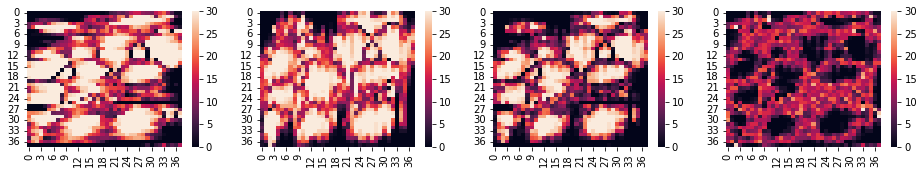

max fitness:  21.924553873999766 7.4637928667008495
max fitness:  21.758877580814854 7.629469159885762
max fitness:  21.912111007875737 7.476235732824879
max fitness:  21.849843552970185 7.538503187730431
max fitness:  22.004097003784906 7.384249736915709
max fitness:  21.648937100818323 7.739409639882293
max fitness:  22.014691750752633 7.373654989947983
max fitness:  22.0924212607975 7.295925479903115
max fitness:  21.85664667309471 7.531700067605907
max fitness:  21.91471006241194 7.473636678288674
max fitness:  21.67298328919942 7.715363451501197
max fitness:  21.760830282239983 7.627516458460633
max fitness:  22.072083133004053 7.316263607696563
max fitness:  22.015991823597382 7.372354917103234
max fitness:  21.668891648312382 7.719455092388234
max fitness:  21.753673515046234 7.634673225654382
max fitness:  21.605683141456396 7.78266359924422
max fitness:  22.051706824024812 7.336639916675804
max fitness:  21.771798821514352 7.616547919186264
max fitness:  21.60961072039545 7.77

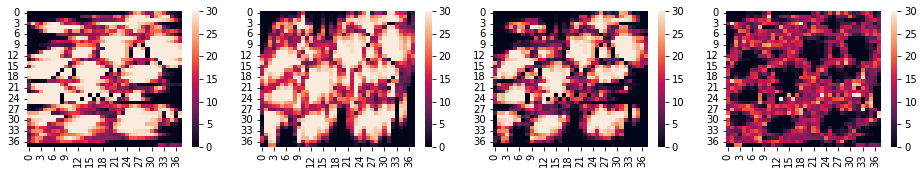

max fitness:  21.993937349481143 7.394409391219472
max fitness:  22.091160126523853 7.297186614176763
max fitness:  21.757986638855677 7.630360101844939
max fitness:  22.38354368126055 7.004803059440064
max fitness:  22.043266306963524 7.345080433737092
max fitness:  22.016814721650103 7.3715320190505125
max fitness:  21.953710610830278 7.434636129870338
max fitness:  21.670736104386883 7.717610636313733
max fitness:  21.7359824747742 7.6523642659264155
max fitness:  21.840678925066246 7.5476678156343695
max fitness:  21.686723744035746 7.70162299666487
max fitness:  21.822967839660123 7.565378901040493
max fitness:  21.805940196532838 7.582406544167778
max fitness:  21.678718723749874 7.709628016950742
max fitness:  21.91190478126783 7.476441959432787
max fitness:  21.55307058171757 7.835276158983046
max fitness:  21.91543663973862 7.472910100961997
max fitness:  21.81845148994816 7.569895250752456
max fitness:  21.824717701266888 7.563629039433728
max fitness:  21.655653759489525 7.7

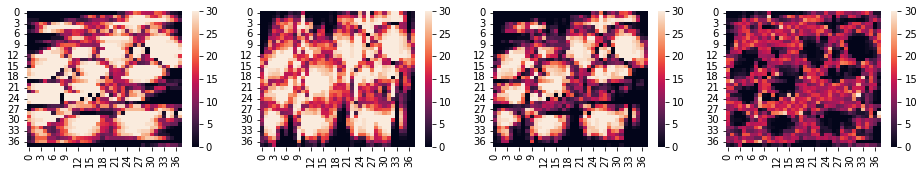

max fitness:  21.805659277746607 7.582687462954009
max fitness:  21.494949056463575 7.893397684237041
max fitness:  21.642912728151664 7.745434012548952
max fitness:  21.70447513276224 7.683871607938375
max fitness:  21.69678172192717 7.691565018773446
max fitness:  21.7588564820042 7.629490258696414
max fitness:  21.580545570134326 7.8078011705662895
max fitness:  21.823091343880016 7.5652553968206
max fitness:  21.597987054128467 7.790359686572149
max fitness:  21.767559093061504 7.620787647639112
max fitness:  21.84043182953945 7.547914911161165
max fitness:  21.831870746372736 7.556475994327879
max fitness:  21.695298428260294 7.693048312440322
max fitness:  21.769127737919447 7.619219002781168
max fitness:  21.564985267181427 7.8233614735191885
max fitness:  21.714584097651368 7.673762643049248
max fitness:  21.884483113671678 7.503863627028938
max fitness:  21.764522494175406 7.62382424652521
max fitness:  21.82551268543895 7.562834055261664
max fitness:  21.826758339714722 7.561

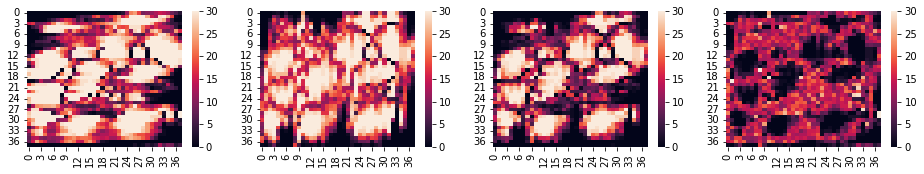

max fitness:  21.985341823196684 7.403004917503932
max fitness:  22.060943767702774 7.327402972997842
max fitness:  21.817232102265592 7.571114638435024
max fitness:  21.894968559455464 7.493378181245152
max fitness:  21.984186991074058 7.404159749626558
max fitness:  22.022887429516445 7.365459311184171
max fitness:  21.897201347710055 7.4911453929905605
max fitness:  22.196703828333867 7.191642912366749
max fitness:  22.38916938987133 6.999177350829285
max fitness:  22.112723275883198 7.275623464817418
max fitness:  21.99221832696663 7.396128413733987
max fitness:  21.977044437200625 7.4113023034999905
max fitness:  22.06304554286118 7.325301197839437
max fitness:  22.116876354821365 7.271470385879251
max fitness:  22.004446099486618 7.383900641213998
max fitness:  22.06890844752043 7.319438293180188
max fitness:  22.07092244913419 7.317424291566425
max fitness:  21.92078981099332 7.467556929707296
max fitness:  22.25313101670337 7.135215723997245
max fitness:  21.966512297179516 7.4

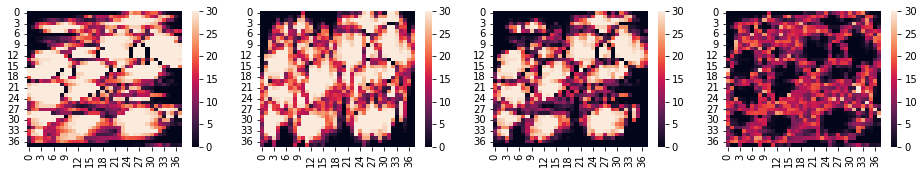

max fitness:  22.070605847996433 7.317740892704183
max fitness:  22.29515262762586 7.093194113074755
max fitness:  22.311705447728237 7.076641292972379
max fitness:  22.173972249788672 7.214374490911943
max fitness:  21.942280028622722 7.446066712077894
max fitness:  22.25622034693174 7.132126393768875
max fitness:  22.064918811099446 7.32342792960117
max fitness:  22.252505243454735 7.135841497245881
max fitness:  22.041035677749377 7.347311062951238
max fitness:  22.06037577671507 7.327970963985546
max fitness:  21.977922623429606 7.41042411727101
max fitness:  22.106651421439455 7.281695319261161
max fitness:  22.05104979217994 7.337296948520677
max fitness:  22.00888705504076 7.379459685659857
max fitness:  22.036591411575895 7.351755329124721
max fitness:  22.01677655031306 7.371570190387555
max fitness:  22.10769127080195 7.280655469898665
max fitness:  21.946319233367888 7.442027507332728
max fitness:  22.100984082469616 7.287362658231
max fitness:  22.03909259444706 7.349254146

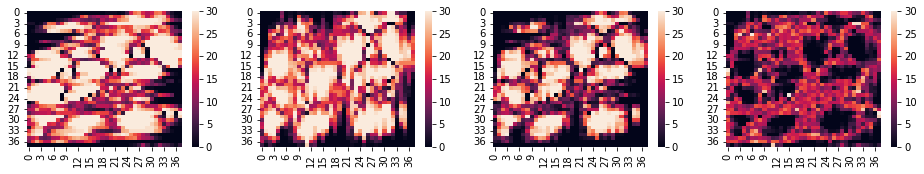

max fitness:  21.753991623500433 7.634355117200183
max fitness:  22.061754038193563 7.326592702507053
max fitness:  21.88915617436644 7.499190566334175
max fitness:  22.058684693491642 7.3296620472089735
max fitness:  22.087308909283916 7.3010378314167
max fitness:  22.13886032508661 7.249486415614005
max fitness:  22.015451886495338 7.372894854205278
max fitness:  22.133059885929022 7.255286854771594
max fitness:  22.077457537952668 7.310889202747948
max fitness:  21.980990698457944 7.407356042242672
max fitness:  21.999507902571708 7.388838838128908
max fitness:  21.614825069501368 7.773521671199248
max fitness:  21.679811249134662 7.708535491565954
max fitness:  21.742166344189023 7.646180396511593
max fitness:  21.64209554849417 7.746251192206447
max fitness:  21.45703523559084 7.931311505109775
max fitness:  21.508953620035093 7.879393120665522
max fitness:  21.67591357196984 7.712433168730776
max fitness:  21.79878059756576 7.5895661431348564
max fitness:  21.64696263065836 7.741

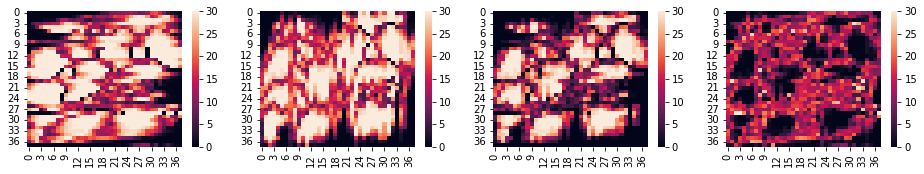

max fitness:  21.58005267711182 7.8082940635887965
max fitness:  21.761092731407835 7.6272540092927805
max fitness:  21.927569920981803 7.460776819718813
max fitness:  21.71043310362325 7.677913637077367
max fitness:  21.925254513956347 7.463092226744269
max fitness:  21.664103223102465 7.7242435175981505
max fitness:  21.66538942080119 7.722957319899425
max fitness:  21.706467886285594 7.681878854415022
max fitness:  21.549497637469567 7.838849103231048
max fitness:  21.642436163760365 7.7459105769402505
max fitness:  21.523245156970788 7.865101583729828
max fitness:  21.709596693563533 7.678750047137083
max fitness:  21.70666224945855 7.681684491242066
max fitness:  21.604916823613546 7.783429917087069
max fitness:  21.82914397730265 7.559202763397966
max fitness:  21.792163793514572 7.596182947186044
max fitness:  21.710893911633768 7.677452829066848
max fitness:  21.633335081962862 7.755011658737754
max fitness:  21.714127248237716 7.6742194924629
max fitness:  21.774204943479738 7

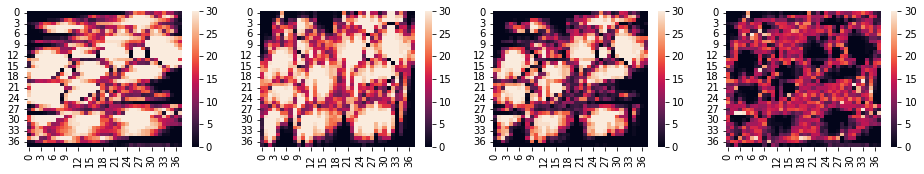

max fitness:  21.560637227561962 7.827709513138654
max fitness:  21.663950742120516 7.7243959985801
max fitness:  21.542222652812534 7.846124087888082
max fitness:  21.936414699773295 7.451932040927321
max fitness:  21.668116962239225 7.720229778461391
max fitness:  21.535807548090652 7.852539192609964
max fitness:  21.88427784633997 7.504068894360646
max fitness:  21.800328791508413 7.588017949192203
max fitness:  21.902476263435 7.4858704772656175
max fitness:  21.810476693615524 7.577870047085092
max fitness:  21.75439287062283 7.633953870077786
max fitness:  22.10294344515262 7.285403295547997
max fitness:  21.80735569165923 7.580991049041387
max fitness:  21.49905882238373 7.889287918316885
max fitness:  21.761237655817265 7.627109084883351
max fitness:  21.874147199273878 7.514199541426738
max fitness:  21.742189554430652 7.6461571862699635
max fitness:  21.925143100956255 7.463203639744361
max fitness:  21.84082181001834 7.547524930682275
max fitness:  21.829835282703392 7.55851

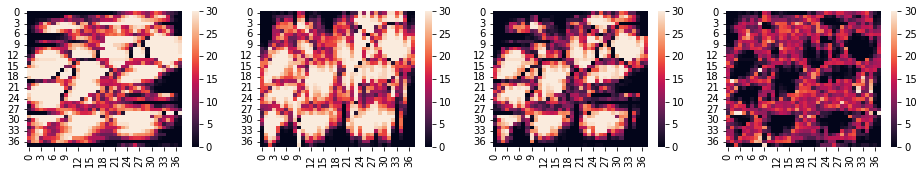

max fitness:  21.86721032799379 7.521136412706827
max fitness:  21.89115692213292 7.497189818567694
max fitness:  21.72415737331847 7.664189367382146
max fitness:  21.90633815134479 7.482008589355825
max fitness:  21.854266387233018 7.534080353467598
max fitness:  21.73406296436346 7.654283776337156
max fitness:  21.979955460041165 7.408391280659451
max fitness:  22.061436806378275 7.326909934322341
max fitness:  21.70206405184489 7.6862826888557265
max fitness:  22.023397272835886 7.364949467864729
max fitness:  21.94819693391684 7.440149806783776
max fitness:  21.889774361464323 7.498572379236293
max fitness:  21.824389686068187 7.563957054632429
max fitness:  22.051292587625163 7.337054153075453
max fitness:  22.355096415265404 7.033250325435212
max fitness:  21.998935483354437 7.389411257346179
max fitness:  21.909681068722648 7.478665671977968
max fitness:  22.0844144574817 7.303932283218916
max fitness:  21.881581174345698 7.506765566354918
max fitness:  21.946008167101887 7.4423

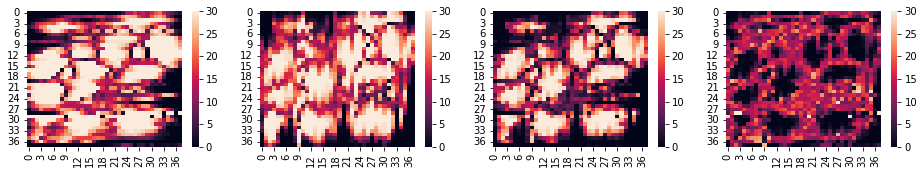

max fitness:  22.030997331586278 7.357349409114338
max fitness:  21.928572291554943 7.459774449145673
max fitness:  21.859015160669337 7.529331580031279
max fitness:  21.867936068740878 7.520410671959738
max fitness:  22.06437727243543 7.323969468265187
max fitness:  22.19386961473813 7.194477125962486
max fitness:  21.975321859424675 7.413024881275941
max fitness:  21.9952871330021 7.393059607698515
max fitness:  22.134025215498017 7.254321525202599
max fitness:  21.78456420282183 7.603782537878786
max fitness:  21.622400867094726 7.76594587360589
max fitness:  21.740307873208693 7.648038867491923
max fitness:  21.93776275763146 7.450583983069155
max fitness:  21.89959945296232 7.4887472877382955
max fitness:  21.982013998073466 7.40633274262715
max fitness:  22.19109934284847 7.197247397852145
max fitness:  21.798858584223666 7.58948815647695
max fitness:  22.044919338236365 7.3434274024642505
max fitness:  21.68022211805131 7.708124622649304
max fitness:  21.839028797879227 7.549317

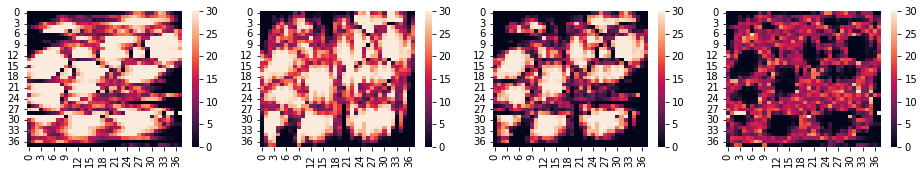

max fitness:  21.70260021177525 7.6857465289253675
max fitness:  21.63228461174654 7.756062128954074
max fitness:  21.756584357034164 7.631762383666452
max fitness:  21.655361745636064 7.732984995064552
max fitness:  21.744227447309555 7.644119293391061
max fitness:  21.808028085472785 7.580318655227831
max fitness:  21.56909268197655 7.819254058724066
max fitness:  21.656410793453382 7.7319359472472335
max fitness:  21.721261438405506 7.66708530229511
max fitness:  21.803806129307517 7.584540611393098
max fitness:  21.698907176296757 7.689439564403859
max fitness:  21.741246349262703 7.647100391437913
max fitness:  21.95865242831017 7.4296943123904455
max fitness:  22.15407458363386 7.234272157066755
max fitness:  21.955376713398422 7.4329700273021935
max fitness:  21.970902470840798 7.417444269859818
max fitness:  21.88030088476655 7.508045855934064
max fitness:  22.09679259998937 7.291554140711245
max fitness:  21.694975910702397 7.693370829998219
max fitness:  22.0454835785381 7.34

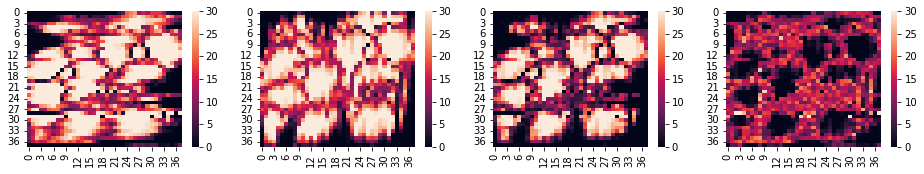

max fitness:  22.09744240316327 7.290904337537345
max fitness:  21.781251225416245 7.607095515284371
max fitness:  21.828738937702767 7.559607802997849
max fitness:  22.469837418840257 6.918509321860359
max fitness:  21.792107652308875 7.596239088391741
max fitness:  21.7177790618646 7.670567678836015
max fitness:  21.84304431302127 7.545302427679346
max fitness:  22.12615436789286 7.262192372807757
max fitness:  21.919930438007697 7.468416302692919
max fitness:  21.983980534092353 7.4043662066082625
max fitness:  21.921536423057397 7.466810317643219
max fitness:  22.03433629688915 7.354010443811465
max fitness:  22.001718870477468 7.386627870223148
max fitness:  21.78145428657819 7.606892454122427
max fitness:  21.899434772189288 7.488911968511328
max fitness:  21.971926442857708 7.416420297842908
max fitness:  22.059932224923145 7.328414515777471
max fitness:  21.979934279765047 7.408412460935569
max fitness:  22.04128539997715 7.347061340723467
max fitness:  21.788072020198573 7.600

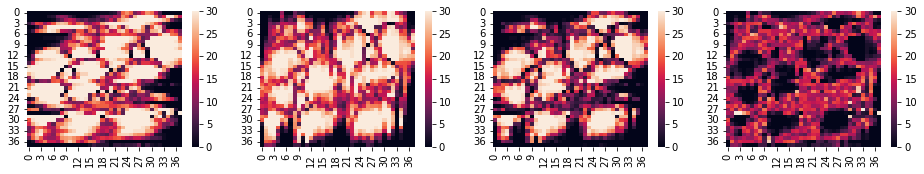

max fitness:  22.129598608489196 7.258748132211419
max fitness:  22.170748026455566 7.2175987142450495
max fitness:  22.242117663170106 7.14622907753051
max fitness:  21.850747653245406 7.5375990874552095
max fitness:  21.663631315051685 7.724715425648931
max fitness:  21.890988525548348 7.497358215152268
max fitness:  21.73930425777224 7.649042482928376
max fitness:  21.84180214829623 7.546544592404384
max fitness:  22.04368062926672 7.344666111433895
max fitness:  21.99093399759237 7.397412743108244
max fitness:  21.806049599082048 7.582297141618568
max fitness:  21.90478495339682 7.483561787303795
max fitness:  21.90032931291065 7.488017427789966
max fitness:  22.194484405018652 7.193862335681963
max fitness:  21.8970503918827 7.491296348817915
max fitness:  22.126072151300875 7.262274589399741
max fitness:  21.99013051370973 7.398216226990886
max fitness:  22.157316600646 7.231030140054617
max fitness:  21.707814189893845 7.68053255080677
max fitness:  21.829248069846397 7.55909867

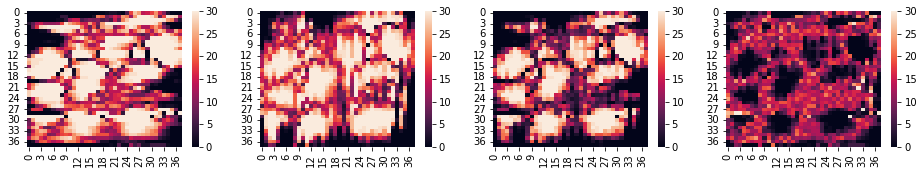

max fitness:  21.86638872472684 7.521958015973777
max fitness:  21.77869053648582 7.609656204214797
max fitness:  21.815280288594018 7.573066452106598
max fitness:  21.867793072709922 7.5205536679906935
max fitness:  21.77705800113096 7.611288739569655
max fitness:  22.138411726325124 7.249935014375492
max fitness:  22.330676672017255 7.057670068683361
max fitness:  21.977921258626857 7.410425482073759
max fitness:  22.050922007868742 7.337424732831874
max fitness:  21.97240461877986 7.415942121920757
max fitness:  22.14877553420473 7.239571206495885
max fitness:  21.95295522370565 7.435391516994965
max fitness:  22.180099378820977 7.208247361879639
max fitness:  21.81837304171102 7.569973698989596
max fitness:  21.930899259692502 7.4574474810081135
max fitness:  21.745579271231605 7.64276746946901
max fitness:  21.705254013054514 7.683092727646102
max fitness:  21.88281209549222 7.505534645208396
max fitness:  21.84548581833695 7.542860922363666
max fitness:  22.10922318767291 7.27912

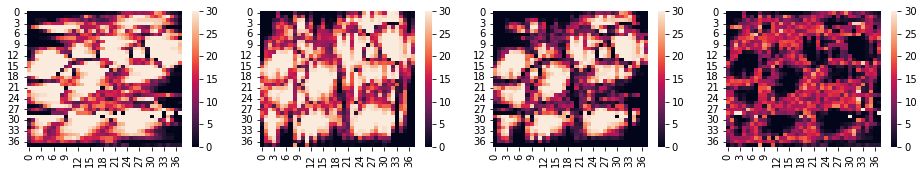

max fitness:  21.786987702521174 7.601359038179442
max fitness:  21.809447773185 7.578898967515617
max fitness:  21.708310351874538 7.680036388826078
max fitness:  21.809191640711926 7.579155099988689
max fitness:  21.80565346558927 7.582693275111346
max fitness:  21.699544743210957 7.688801997489659
max fitness:  21.80754977271917 7.5807969679814455
max fitness:  21.681658812235774 7.7066879284648415
max fitness:  21.971934696434026 7.41641204426659
max fitness:  21.9870336012203 7.401313139480315
max fitness:  21.79000769869824 7.598339042002376
max fitness:  22.025430652879383 7.362916087821233
max fitness:  21.811685836199274 7.576660904501342
max fitness:  21.947514024734126 7.44083271596649
max fitness:  21.866933382956418 7.521413357744198
max fitness:  21.82808759000519 7.560259150695426
max fitness:  21.965305303509485 7.423041437191131
max fitness:  21.750010845271227 7.638335895429389
max fitness:  21.829480831505858 7.558865909194758
max fitness:  21.817932633608528 7.57041

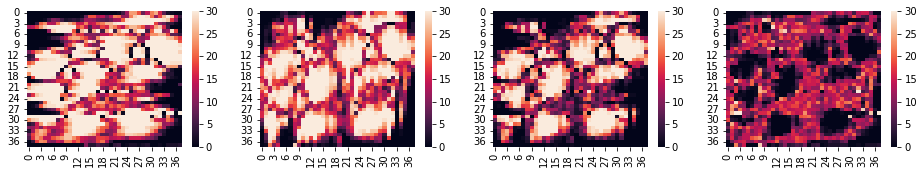

max fitness:  21.964201987716383 7.424144752984233
max fitness:  21.917853553097927 7.470493187602688
max fitness:  22.11634792936621 7.271998811334406
max fitness:  22.151057388653868 7.237289352046748
max fitness:  22.23815556488671 7.150191175813905
max fitness:  21.783980477980656 7.60436626271996
max fitness:  21.98111125676363 7.4072354839369865
max fitness:  21.77117532306826 7.617171417632356
max fitness:  21.86789453184958 7.520452208851037
max fitness:  21.919352652693096 7.46899408800752
max fitness:  21.86703348410291 7.521313256597704
max fitness:  22.087285825633955 7.30106091506666
max fitness:  22.133008483916882 7.255338256783734
max fitness:  21.860044059688413 7.528302681012203
max fitness:  22.26842985343747 7.119916887263145
max fitness:  21.871712952793068 7.516633787907548
max fitness:  22.043559169615307 7.344787571085309
max fitness:  21.868038685124585 7.520308055576031
max fitness:  21.84306244650227 7.545284294198346
max fitness:  22.07171091877539 7.3166358

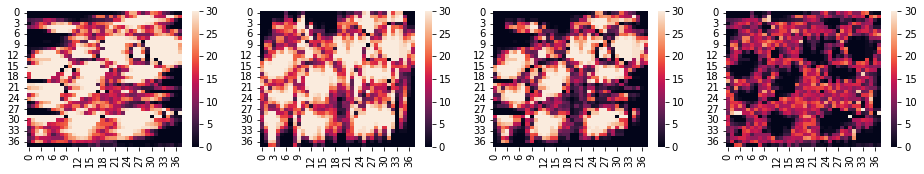

max fitness:  22.024003386024077 7.364343354676539
max fitness:  21.981856514461008 7.406490226239608
max fitness:  21.705487131657904 7.682859609042712
max fitness:  22.249281560245322 7.139065180455294
max fitness:  22.02683481161054 7.361511929090074
max fitness:  21.879555887341233 7.508790853359383
max fitness:  21.90578591836829 7.482560822332324
max fitness:  22.01195572891335 7.376391011787266
max fitness:  21.789287488680213 7.599059252020403
max fitness:  22.107229009834334 7.281117730866281
max fitness:  22.231395780691713 7.156950960008903
max fitness:  22.168087489151183 7.220259251549432
max fitness:  22.100411955242002 7.287934785458614
max fitness:  21.997792312659573 7.3905544280410425
max fitness:  21.977877269652055 7.410469471048561
max fitness:  21.922318418588432 7.466028322112184
max fitness:  22.126068028894984 7.262278711805632
max fitness:  21.70273064775096 7.685616092949655
max fitness:  21.9870015355938 7.401345205106814
max fitness:  21.825357738521518 7.5

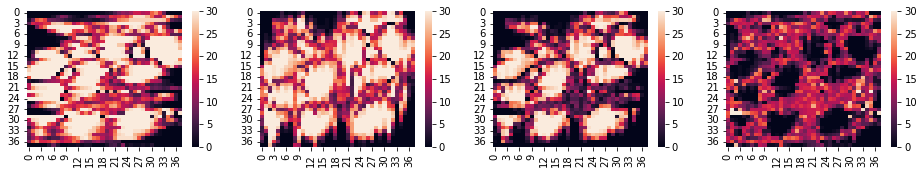

max fitness:  21.99076294954057 7.397583791160045
max fitness:  22.12995364522863 7.2583930954719875
max fitness:  22.157280647471126 7.23106609322949
max fitness:  21.895370916400985 7.492975824299631
max fitness:  21.99510223442315 7.393244506277465
max fitness:  21.950977484414793 7.437369256285823
max fitness:  22.033608431165582 7.354738309535033
max fitness:  21.855549892893592 7.532796847807024
max fitness:  21.972883694523084 7.415463046177532
max fitness:  21.808706865843053 7.579639874857563
max fitness:  21.867254424927708 7.521092315772908
max fitness:  21.847312440172814 7.5410343005278015
max fitness:  22.145729046899156 7.24261769380146
max fitness:  22.165296945615985 7.223049795084631
max fitness:  21.909760275149196 7.47858646555142
max fitness:  21.790274772448377 7.598071968252238
max fitness:  21.904841758117918 7.483504982582698
max fitness:  21.772808332754874 7.615538407945742
max fitness:  22.04215242409977 7.346194316600847
max fitness:  21.866977852072353 7.5

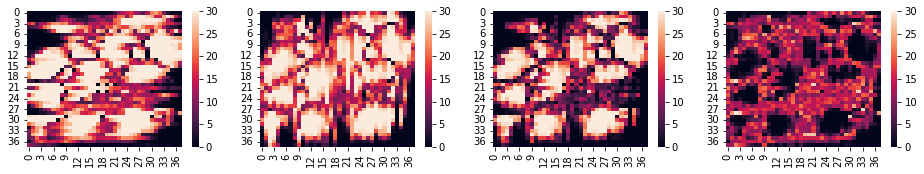

max fitness:  22.095946253520346 7.29240048718027
max fitness:  21.94017743035306 7.448169310347556
max fitness:  22.010902434112914 7.377444306587702
max fitness:  22.310979797547446 7.077366943153169
max fitness:  21.810705071041063 7.5776416696595525
max fitness:  22.044830381835176 7.34351635886544
max fitness:  22.07087445176254 7.317472288938077
max fitness:  21.878528440447965 7.50981830025265
max fitness:  21.982611033053274 7.405735707647342
max fitness:  22.318990549304225 7.069356191396391
max fitness:  21.99034616204898 7.3980005786516365
max fitness:  21.831889786711876 7.556456953988739
max fitness:  22.183105129113336 7.2052416115872795
max fitness:  21.791757594989573 7.596589145711043
max fitness:  22.060256147854084 7.328090592846532
max fitness:  22.13281042669629 7.255536314004324
max fitness:  22.06920815124826 7.319138589452354
max fitness:  21.95701354834875 7.431333192351865
max fitness:  22.149580682008448 7.238766058692168
max fitness:  22.02144394280571 7.366

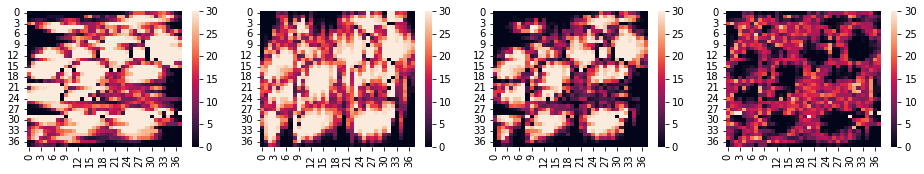

max fitness:  21.94431848081925 7.444028259881367
max fitness:  21.747453323817027 7.640893416883589
max fitness:  21.74727557947374 7.641071161226876
max fitness:  21.902641375960542 7.485705364740074
max fitness:  21.965134092549334 7.4232126481512815
max fitness:  21.74805214997962 7.640294590720995
max fitness:  21.94541679236434 7.442929948336275
max fitness:  21.966133187530847 7.422213553169769
max fitness:  22.525255189326103 6.863091551374513
max fitness:  21.872887518770526 7.51545922193009
max fitness:  21.733062365737762 7.655284374962854
max fitness:  21.949809169265016 7.4385375714355995
max fitness:  21.740878216987397 7.6474685237132185
max fitness:  21.94899123853549 7.4393555021651245
max fitness:  21.980589404720845 7.40775733597977
max fitness:  22.130535323771234 7.257811416929382
max fitness:  22.11564753819312 7.272699202507496
max fitness:  21.887023307730388 7.501323432970228
max fitness:  22.038876178792133 7.349470561908483
max fitness:  22.01547491675676 7.3

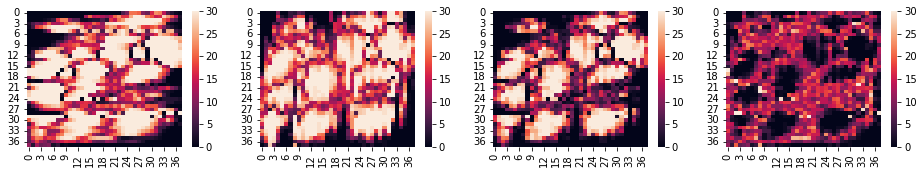

max fitness:  21.985108114731972 7.403238625968644
max fitness:  22.2456694972648 7.142677243435816
max fitness:  21.970007657336012 7.418339083364604
max fitness:  22.287061916815787 7.1012848238848285
max fitness:  21.853402695807517 7.534944044893098
max fitness:  22.23498443341916 7.153362307281455
max fitness:  22.169094123759916 7.2192526169407
max fitness:  22.23577800069313 7.152568740007485
max fitness:  21.921950309439474 7.466396431261142
max fitness:  22.11841578636063 7.269930954339987
max fitness:  22.37830879904662 7.010037941653994
max fitness:  22.261026956039675 7.127319784660941
max fitness:  21.928421849665007 7.459924891035609
max fitness:  21.957485879734072 7.430860860966543
max fitness:  22.08009094733361 7.308255793367007
max fitness:  22.168023896671627 7.220322844028988
max fitness:  22.019387323063782 7.368959417636834
max fitness:  22.137462447204467 7.250884293496149
max fitness:  21.927495887960475 7.4608508527401405
max fitness:  21.880224729757096 7.508

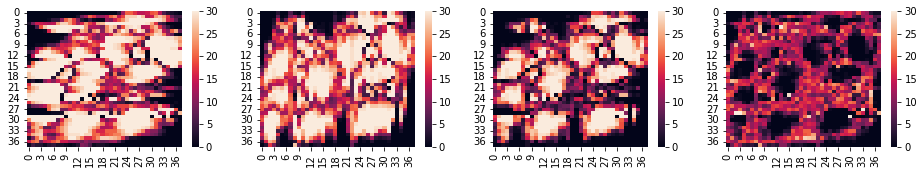

max fitness:  22.136564596806817 7.251782143893799
max fitness:  21.947698935160684 7.440647805539932
max fitness:  21.913439025205395 7.47490771549522
max fitness:  22.096114253488153 7.292232487212463
max fitness:  21.867310663092223 7.521036077608393
max fitness:  21.962796035676288 7.425550705024328
max fitness:  21.9634766219447 7.424870118755916
max fitness:  22.175026622044527 7.213320118656089
max fitness:  22.15487593273611 7.233470807964505
max fitness:  21.95979765903796 7.428549081662656
max fitness:  21.90277713870405 7.485569601996566
max fitness:  22.034706530257914 7.353640210442702
max fitness:  22.189879552034135 7.198467188666481
max fitness:  22.210835131989754 7.177511608710862
max fitness:  22.010660859414322 7.377685881286293
max fitness:  21.79986107996214 7.588485660738474
max fitness:  22.429030126436743 6.959316614263873
max fitness:  22.12922484971677 7.259121890983845
max fitness:  22.056744797201183 7.331601943499432
max fitness:  22.168207133993697 7.2201

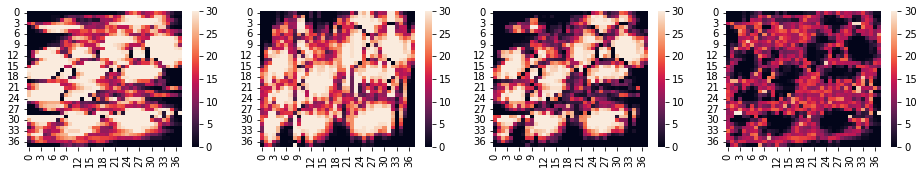

max fitness:  21.99715361165836 7.391193129042257
max fitness:  21.961456525061152 7.426890215639464
max fitness:  21.79393826743532 7.594408473265297
max fitness:  22.059482674693463 7.328864066007153
max fitness:  22.15793046889383 7.230416271806785
max fitness:  22.515367517882225 6.87297922281839
max fitness:  21.895357697234424 7.492989043466192
max fitness:  22.208345923503742 7.180000817196873
max fitness:  21.872502784642812 7.515843956057804
max fitness:  21.963243716134485 7.4251030245661305
max fitness:  21.783446061668727 7.604900679031889
max fitness:  21.829221635248082 7.559125105452534
max fitness:  21.89943908865204 7.4889076520485744
max fitness:  21.85118622496845 7.537160515732165
max fitness:  21.97382365293261 7.414523087768007
max fitness:  22.4439496407229 6.944397099977717
max fitness:  21.94816537885602 7.440181361844594
max fitness:  21.794175074083828 7.594171666616788
max fitness:  22.19845168392593 7.189895056774684
max fitness:  22.02031338621586 7.368033

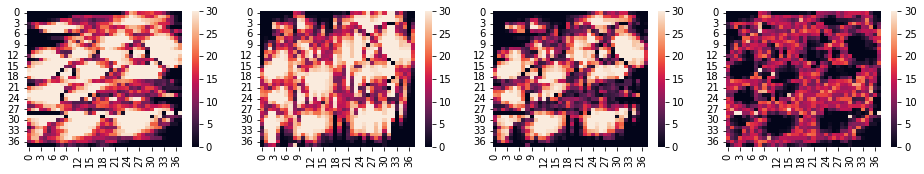

max fitness:  22.092357755178725 7.295988985521891
max fitness:  21.769080610531443 7.619266130169173
max fitness:  21.8088903766306 7.579456364070015
max fitness:  21.950112859796494 7.4382338809041215
max fitness:  21.901319578783266 7.48702716191735
max fitness:  21.55311901675593 7.835227723944687
max fitness:  21.79268544491498 7.595661295785636
max fitness:  21.90997537086173 7.478371369838886
max fitness:  21.85391015610685 7.534436584593767
max fitness:  21.85209074962284 7.536255991077777
max fitness:  21.787473165860238 7.600873574840378
max fitness:  21.747477479621523 7.640869261079093
max fitness:  21.628811878988493 7.7595348617121225
max fitness:  21.577257402964207 7.811089337736409
max fitness:  21.743902398770658 7.644444341929958
max fitness:  21.994257561651985 7.394089179048631
max fitness:  21.71982059083232 7.6685261498682955
max fitness:  21.615711955191365 7.772634785509251
max fitness:  22.136007059286662 7.252339681413954
max fitness:  21.763877187861677 7.62

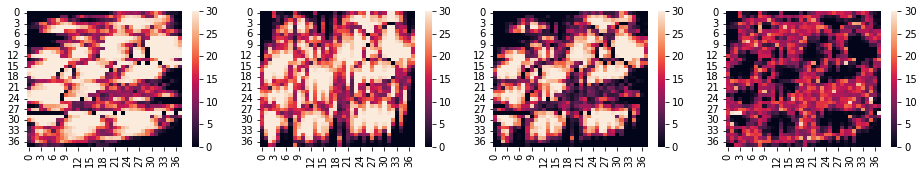

max fitness:  21.968896790943624 7.4194499497569915
max fitness:  21.778645448072783 7.6097012926278325
max fitness:  21.817448404027182 7.570898336673434
max fitness:  21.7139302291868 7.674416511513815
max fitness:  21.729523579055744 7.658823161644872
max fitness:  21.61625431996717 7.772092420733447
max fitness:  21.93613522728415 7.452211513416465
max fitness:  21.76727874759949 7.621067993101125
max fitness:  21.96857221348987 7.419774527210745
max fitness:  21.732395072432546 7.65595166826807
max fitness:  21.71242836162925 7.675918379071366
max fitness:  21.675569234871617 7.712777505828999
max fitness:  21.634115438438172 7.754231302262443
max fitness:  21.637696575607272 7.750650165093344
max fitness:  21.704831131699073 7.683515609001542
max fitness:  21.952218963685706 7.43612777701491
max fitness:  21.801903807999146 7.58644293270147
max fitness:  21.8272495277822 7.5610972129184155
max fitness:  22.051634039864943 7.3367127008356725
max fitness:  21.84545455934054 7.54289

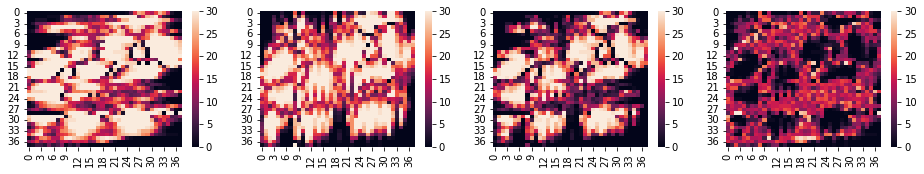

max fitness:  21.848931559855593 7.5394151808450225
max fitness:  22.155560883994866 7.23278585670575
max fitness:  21.735776112475747 7.652570628224868
max fitness:  22.084650595990276 7.30369614471034
max fitness:  22.00009506915541 7.388251671545206
max fitness:  21.958261702981268 7.430085037719348
max fitness:  21.862415029612627 7.525931711087988
max fitness:  22.18564224445214 7.202704496248476
max fitness:  22.185661571986046 7.20268516871457
max fitness:  21.96349010151654 7.424856639184075
max fitness:  21.87224669762208 7.516100043078534
max fitness:  22.125436882627067 7.262909858073549
max fitness:  22.4448178999111 6.943528840789515
max fitness:  21.949252578702428 7.439094161998188
max fitness:  22.150086963172626 7.23825977752799
max fitness:  22.0489798970808 7.339366843619814
max fitness:  22.233847155128004 7.154499585572612
max fitness:  22.12380695650119 7.264539784199425
max fitness:  21.766314477201895 7.6220322634987205
max fitness:  21.813191637793814 7.5751551

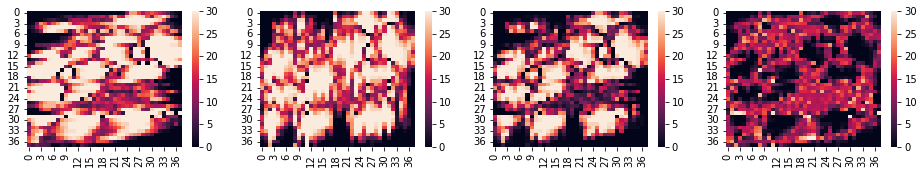

max fitness:  21.820699504852072 7.567647235848543
max fitness:  21.776246962505738 7.612099778194878
max fitness:  21.795576317403672 7.592770423296944
max fitness:  22.019930961992713 7.368415778707902
max fitness:  22.25682623167017 7.1315205090304445
max fitness:  21.736445131593058 7.651901609107558
max fitness:  22.12412337927166 7.264223361428957
max fitness:  21.99402412808784 7.3943226126127755
max fitness:  21.836440119833476 7.55190662086714
max fitness:  21.8499317434395 7.538414997261114
max fitness:  21.77273954863052 7.615607192070097
max fitness:  21.8665670867246 7.521779653976015
max fitness:  22.15263382202825 7.235712918672366
max fitness:  21.858469225563248 7.529877515137368
max fitness:  21.95982118157005 7.428525559130566
max fitness:  21.68616546743217 7.702181273268447
max fitness:  21.959560792225176 7.42878594847544
max fitness:  21.94509917674084 7.443247563959776
max fitness:  21.9011107667494 7.487235973951215
max fitness:  22.046788025899886 7.3415587148

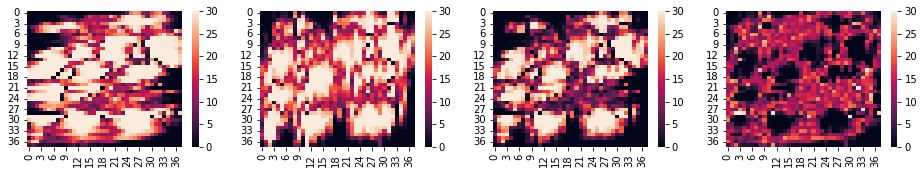

max fitness:  22.02977391864071 7.358572822059905
max fitness:  21.922070309804695 7.46627643089592
max fitness:  22.1919928389309 7.196353901769715
max fitness:  22.179838759452124 7.208507981248491
max fitness:  21.82120015049727 7.567146590203347
max fitness:  22.089264652092055 7.299082088608561
max fitness:  21.91741675060997 7.470929990090646
max fitness:  21.989680919955973 7.398665820744643
max fitness:  21.985978279952917 7.402368460747699
max fitness:  21.913302887224816 7.4750438534758
max fitness:  22.073570239865703 7.314776500834913
max fitness:  21.94257551470715 7.4457712259934645
max fitness:  22.11528118926858 7.273065551432037
max fitness:  21.87434438689618 7.514002353804436
max fitness:  22.118277206546416 7.270069534154199
max fitness:  22.058287802670847 7.330058938029769
max fitness:  22.16694294321897 7.221403797481646
max fitness:  22.008245335285807 7.380101405414809
max fitness:  22.025612549411235 7.3627341912893804
max fitness:  22.003882968496587 7.384463

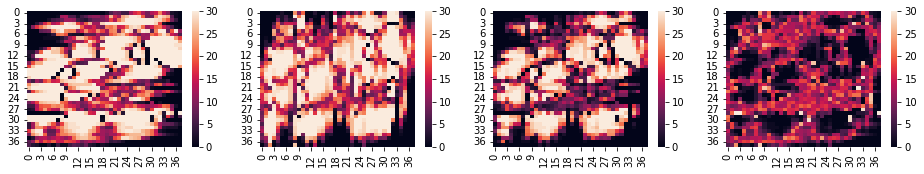

max fitness:  22.064334296304907 7.324012444395709
max fitness:  22.071377356750478 7.316969383950138
max fitness:  21.894628502826983 7.493718237873633
max fitness:  22.201477200050064 7.186869540650552
max fitness:  22.065014848179153 7.3233318925214625
max fitness:  21.91572797857343 7.472618762127187
max fitness:  21.926582695198654 7.461764045501962
max fitness:  22.057087675722634 7.331259064977981
max fitness:  22.077306208564565 7.311040532136051
max fitness:  22.19220435702104 7.196142383679575
max fitness:  22.2502018404835 7.138144900217117
max fitness:  22.358279596568664 7.0300671441319516
max fitness:  22.17631221231334 7.212034528387274
max fitness:  22.271916815675663 7.116429925024953
max fitness:  21.872340355372312 7.5160063853283035
max fitness:  22.209959059023156 7.17838768167746
max fitness:  22.217118082797274 7.171228657903342
max fitness:  21.90389573907629 7.4844510016243255
max fitness:  21.957381371195094 7.430965369505522
max fitness:  22.020629517742663 7

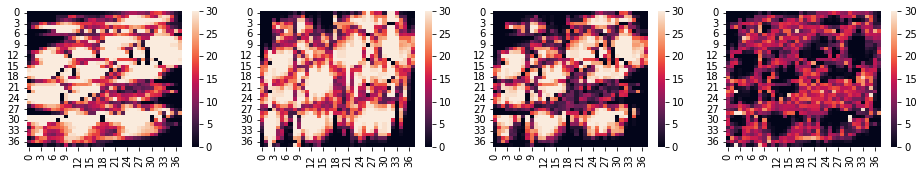

max fitness:  22.144496291246455 7.243850449454161
max fitness:  22.123203197398325 7.26514354330229
max fitness:  22.02901002555312 7.359336715147496
max fitness:  22.075610188448213 7.312736552252403
max fitness:  22.089932292960803 7.2984144477398125
max fitness:  22.119686495021103 7.268660245679513
max fitness:  22.090994896583656 7.29735184411696
max fitness:  22.116425046378833 7.271921694321783
max fitness:  22.24821251942577 7.140134221274845
max fitness:  22.348725886867562 7.039620853833053
max fitness:  22.29729032352953 7.091056417171085
max fitness:  22.185112603025317 7.203234137675299
max fitness:  22.04536237420804 7.342984366492576
max fitness:  22.178400610933775 7.209946129766841
max fitness:  22.10231924505964 7.286027495640976
max fitness:  21.90202884543841 7.486317895262207
max fitness:  22.338257218466616 7.050089522234
max fitness:  22.24805615679113 7.140290583909486
max fitness:  22.094502862511938 7.293843878188678
max fitness:  21.93086914168127 7.45747759

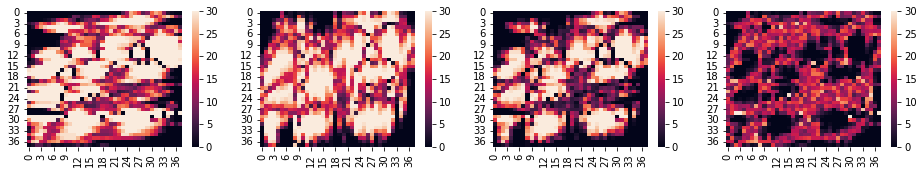

max fitness:  22.288505202779323 7.099841537921293
max fitness:  22.187835488211903 7.200511252488713
max fitness:  22.133180479822606 7.25516626087801
max fitness:  21.90293968254359 7.485407058157026
max fitness:  22.101646066927692 7.286700673772923
max fitness:  22.052975458630772 7.335371282069843
max fitness:  22.068747481513377 7.319599259187239
max fitness:  21.921544598197514 7.466802142503102
max fitness:  22.048885859517206 7.33946088118341
max fitness:  22.453275696808944 6.935071043891671
max fitness:  22.09741247180579 7.290934268894826
max fitness:  22.147611620220413 7.240735120480203
max fitness:  22.202332452134883 7.186014288565733
max fitness:  22.255939226348445 7.13240751435217
max fitness:  22.12924149800056 7.2591052427000555
max fitness:  21.947979993989847 7.440366746710769
max fitness:  22.158314850028702 7.230031890671913
max fitness:  21.972829122434156 7.41551761826646
max fitness:  22.093448681503922 7.294898059196694
max fitness:  21.97889402123183 7.409

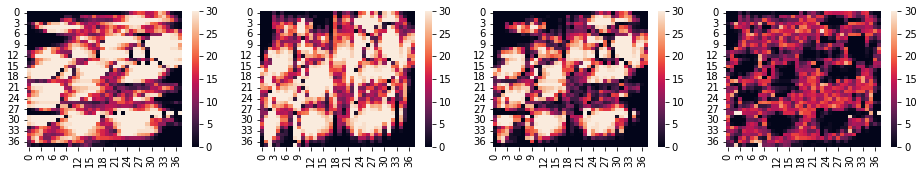

max fitness:  22.243961400826763 7.144385339873853
max fitness:  22.087593550988945 7.300753189711671
max fitness:  22.153405023174408 7.234941717526208
max fitness:  22.148769897292283 7.239576843408333
max fitness:  21.892405011368297 7.495941729332319
max fitness:  22.030400815852268 7.357945924848348
max fitness:  22.28933570447552 7.099011036225097
max fitness:  22.298317333653955 7.090029407046661
max fitness:  22.262117230358314 7.126229510342302
max fitness:  22.18575599123355 7.202590749467067
max fitness:  22.075607251796228 7.312739488904388
max fitness:  22.242637780500708 7.145708960199908
max fitness:  22.151226623226272 7.237120117474344
max fitness:  21.899934555313965 7.48841218538665
max fitness:  21.992793680948097 7.395553059752519
max fitness:  22.150137636431676 7.23820910426894
max fitness:  21.929316138892304 7.459030601808312
max fitness:  22.25954442937143 7.128802311329185
max fitness:  21.963712178937747 7.424634561762868
max fitness:  22.124368986316007 7.2

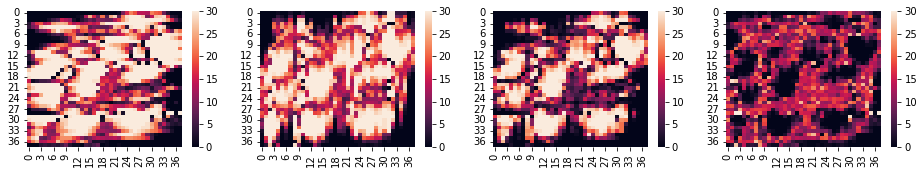

max fitness:  22.12265331488706 7.265693425813556
max fitness:  22.0421325649111 7.346214175789516
max fitness:  22.20544977774287 7.182896962957745
max fitness:  22.119368653370103 7.268978087330513
max fitness:  21.986539768516046 7.40180697218457
max fitness:  21.97182222042347 7.416524520277147
max fitness:  21.93433318160056 7.454013559100055
max fitness:  22.074838678880454 7.313508061820162
max fitness:  21.951808916539306 7.436537824161309
max fitness:  22.058122846188056 7.33022389451256
max fitness:  22.215351049444642 7.172995691255974
max fitness:  21.942733835926873 7.445612904773743
max fitness:  21.836429663976357 7.5519170767242585
max fitness:  22.186959030787364 7.201387709913252
max fitness:  21.86967477711364 7.518671963586975
max fitness:  21.94158387876984 7.446762861930775
max fitness:  21.972730109567735 7.415616631132881
max fitness:  21.859110630949132 7.5292361097514835
max fitness:  22.118834699334815 7.2695120413658
max fitness:  22.33223770632004 7.0561090

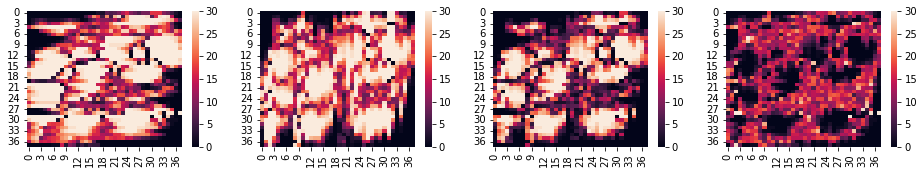

max fitness:  21.959559362534847 7.428787378165769
max fitness:  22.002146079173045 7.386200661527571
max fitness:  22.032674920809335 7.355671819891281
max fitness:  21.926389109435465 7.46195763126515
max fitness:  22.009561950494323 7.378784790206293
max fitness:  22.237754137162643 7.150592603537973
max fitness:  21.785937051529366 7.60240968917125
max fitness:  21.95098982477073 7.437356915929886
max fitness:  22.052130072605287 7.336216668095329
max fitness:  21.936739099997542 7.451607640703074
max fitness:  21.924764920211746 7.463581820488869
max fitness:  21.961417800349373 7.426928940351242
max fitness:  21.934903015652967 7.453443725047649
max fitness:  21.858960851229693 7.529385889470923
max fitness:  21.861981607395904 7.5263651333047115
max fitness:  22.039028756858748 7.349317983841868
max fitness:  21.665953342020224 7.722393398680392
max fitness:  21.810548317688305 7.577798423012311
max fitness:  21.814701672948758 7.573645067751858
max fitness:  21.91428649069701 7

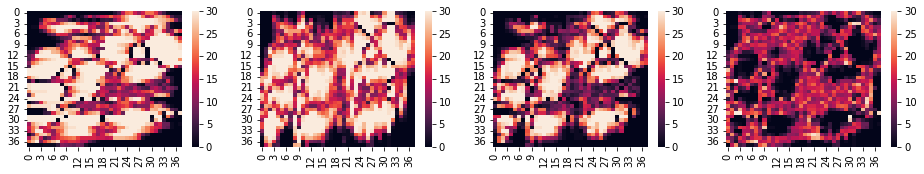

max fitness:  22.206501449939367 7.181845290761249
max fitness:  22.117801984112106 7.27054475658851
max fitness:  21.793053393452855 7.595293347247761
max fitness:  22.02055865475455 7.367788085946067
max fitness:  21.96722242874681 7.4211243119538075
max fitness:  21.962749518896572 7.425597221804043
max fitness:  22.264233107962 7.1241136327386165
max fitness:  22.24592630026173 7.142420440438887
max fitness:  22.523438130869202 6.864908609831414
max fitness:  22.122348374517145 7.265998366183471
max fitness:  22.193219760930464 7.195126979770151
max fitness:  22.026006126220523 7.362340614480093
max fitness:  22.171202209404107 7.217144531296508
max fitness:  21.923609439585853 7.464737301114763
max fitness:  22.427619463424158 6.960727277276458
max fitness:  22.25744757252243 7.1308991681781855
max fitness:  22.15015394201647 7.238192798684146
max fitness:  22.039376107854736 7.34897063284588
max fitness:  21.932653685792747 7.455693054907869
max fitness:  22.038340624829242 7.350

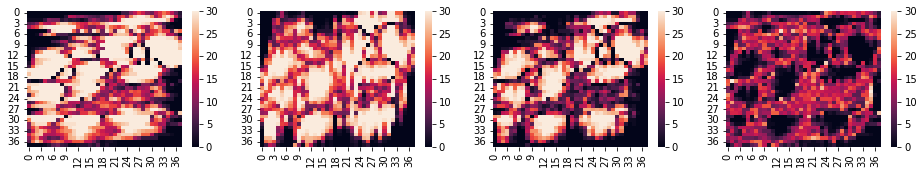

max fitness:  21.958310920435913 7.4300358202647026
max fitness:  21.80610453039695 7.582242210303665
max fitness:  21.914386827367807 7.473959913332809
max fitness:  21.83623475841826 7.552111982282355
max fitness:  22.05935085506816 7.328995885632455
max fitness:  22.07606847925215 7.312278261448466
max fitness:  22.148011371164074 7.240335369536542
max fitness:  21.856702741447968 7.531643999252648
max fitness:  22.10576940438368 7.282577336316937
max fitness:  21.86643536766598 7.521911373034637
max fitness:  21.793312669588538 7.595034071112078
max fitness:  21.79944536911774 7.588901371582875
max fitness:  21.910145752361835 7.478200988338781
max fitness:  22.006030287288343 7.3823164534122725
max fitness:  21.696140751700852 7.692205988999763
max fitness:  21.978727928930404 7.409618811770212
max fitness:  22.213802899819395 7.1745438408812205
max fitness:  21.92365647722928 7.464690263471336
max fitness:  21.90304616640102 7.485300574299597
max fitness:  22.17082087581428 7.217

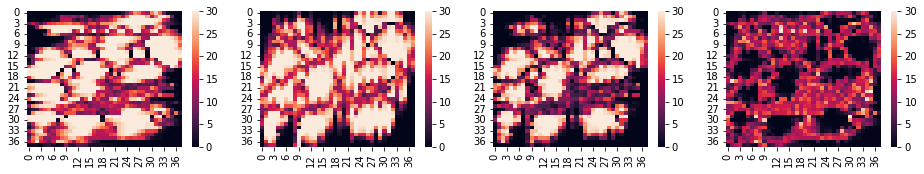

max fitness:  21.853378507758677 7.534968232941939
max fitness:  22.021646510553133 7.366700230147483
max fitness:  22.168291835313696 7.22005490538692
max fitness:  21.92845897364987 7.459887767050745
max fitness:  22.113483442302847 7.274863298397769
max fitness:  21.867943141805434 7.520403598895182
max fitness:  21.857815083025805 7.5305316576748105
max fitness:  22.2758393183887 7.112507422311914
max fitness:  22.10443692584768 7.283909814852937
max fitness:  22.177774552079526 7.210572188621089
max fitness:  22.141128540842686 7.2472181998579295
max fitness:  22.250777811676002 7.137568929024614
max fitness:  22.042806130542647 7.345540610157968
max fitness:  22.078810374171518 7.309536366529098
max fitness:  21.911180005700125 7.477166735000491
max fitness:  22.013152515945624 7.375194224754992
max fitness:  22.142501364856344 7.245845375844272
max fitness:  21.945542466581138 7.442804274119478
max fitness:  21.872864247375205 7.515482493325411
max fitness:  22.06248112220029 7.

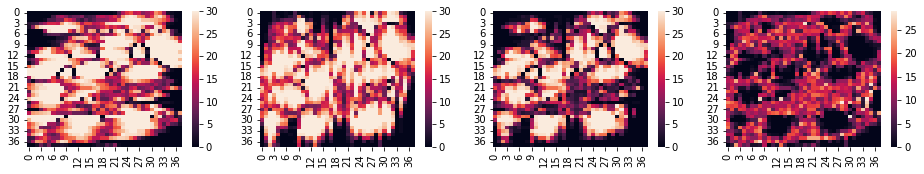

max fitness:  22.025789234665666 7.36255750603495
max fitness:  22.06102600438128 7.3273207363193364
max fitness:  22.018650079247678 7.369696661452938
max fitness:  22.570723918702384 6.817622821998231
max fitness:  22.160930416831825 7.227416323868791
max fitness:  22.08830203089384 7.300044709806777
max fitness:  21.93108454406861 7.457262196632005
max fitness:  21.95335719678677 7.434989543913847
max fitness:  22.056409289244698 7.331937451455918
max fitness:  22.247696340906682 7.140650399793934
max fitness:  22.209518746331277 7.178827994369339
max fitness:  22.05941512844821 7.328931612252404
max fitness:  22.12560669069467 7.262740050005945
max fitness:  22.025228868590204 7.363117872110411
max fitness:  22.161283834015315 7.227062906685301
max fitness:  22.110175153526214 7.278171587174402
max fitness:  22.359137925483243 7.029208815217373
max fitness:  21.86548589120096 7.522860849499654
max fitness:  22.2485519152633 7.139794825437317
max fitness:  22.029569572888878 7.35877

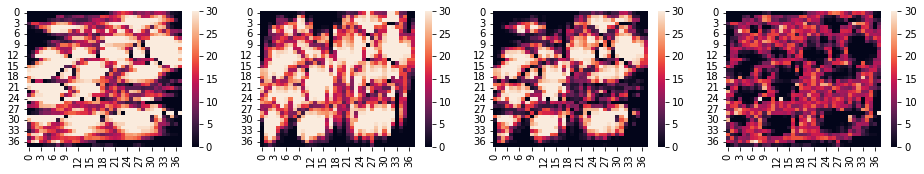

max fitness:  22.28238547343254 7.105961267268075
max fitness:  22.124528012631146 7.26381872806947
max fitness:  22.1320359312809 7.256310809419716
max fitness:  22.101489066849474 7.2868576738511415
max fitness:  22.159618275863473 7.228728464837143
max fitness:  22.24423347017533 7.144113270525285
max fitness:  22.160599361645314 7.227747379055302
max fitness:  21.997766033093043 7.3905807076075725
max fitness:  22.31676218119472 7.071584559505897
max fitness:  21.916664549735536 7.47168219096508
max fitness:  22.321025572513133 7.067321168187483
max fitness:  22.240222924483284 7.148123816217332
max fitness:  22.21727026977315 7.171076470927467
max fitness:  22.22454865626112 7.163798084439495
max fitness:  22.14551798815191 7.242828752548707
max fitness:  21.923567562424637 7.464779178275979
max fitness:  22.179916860096817 7.2084298806037985
max fitness:  22.22011100845873 7.168235732241886
max fitness:  22.10630678117376 7.2820399595268555
max fitness:  22.211003156816034 7.1773

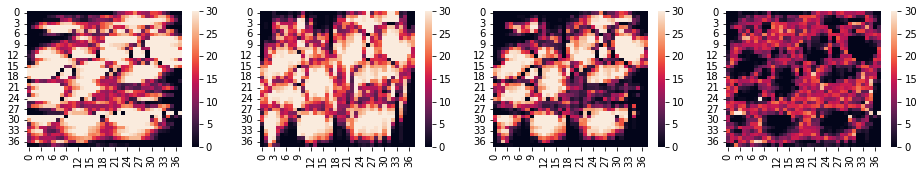

max fitness:  22.039851066452222 7.348495674248394
max fitness:  21.919661479375012 7.468685261325604
max fitness:  22.10481031837168 7.283536422328936
max fitness:  22.10402398717079 7.284322753529825
max fitness:  22.39681918982601 6.991527550874604
max fitness:  22.004307523915298 7.384039216785318
max fitness:  22.274853168178787 7.113493572521829
max fitness:  22.16213190037312 7.226214840327497
max fitness:  22.37509791807789 7.0132488226227245
max fitness:  22.4449525321378 6.943394208562815
max fitness:  22.167844670708078 7.220502069992538
max fitness:  22.225858524768903 7.162488215931713
max fitness:  22.432847390888746 6.95549934981187
max fitness:  22.265150726245768 7.123196014454848
max fitness:  21.8776450503004 7.510701690400214
max fitness:  21.94287217351522 7.445474567185396
max fitness:  22.118569706104495 7.269777034596121
max fitness:  21.962851327406113 7.425495413294502
max fitness:  22.137956657024283 7.250390083676333
max fitness:  22.14542485487285 7.2429218

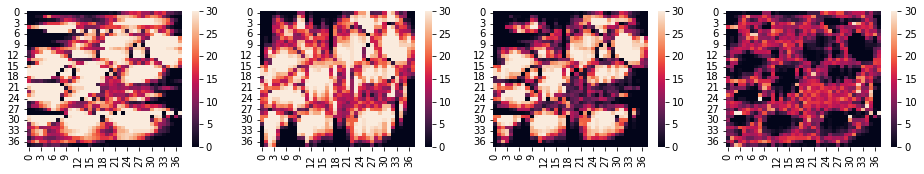

max fitness:  22.2823613882927 7.105985352407917
max fitness:  21.867764011451058 7.520582729249558
max fitness:  21.988635493071676 7.3997112476289395
max fitness:  21.957997883965646 7.43034885673497
max fitness:  21.95496599007356 7.433380750627055
max fitness:  22.01866292507409 7.3696838156265265
max fitness:  22.145395272749 7.242951467951617
max fitness:  22.094133366042797 7.294213374657819
max fitness:  22.37112208140131 7.0172246592993055
max fitness:  22.04923448284329 7.339112257857327
max fitness:  22.35585193119364 7.032494809506975
max fitness:  22.139997260167565 7.248349480533051
max fitness:  22.088311329493315 7.3000354112073005
max fitness:  21.804516232682538 7.583830508018078
max fitness:  22.084033433827727 7.3043133068728885
max fitness:  21.783294978912554 7.6050517617880615
max fitness:  22.048767226337052 7.339579514363564
max fitness:  22.141580661489016 7.2467660792116
max fitness:  22.006445550970902 7.381901189729714
max fitness:  22.150602586249498 7.237

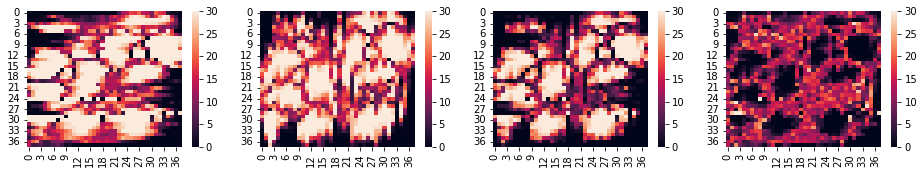

max fitness:  22.229040217215267 7.159306523485348
max fitness:  21.99652182237812 7.391824918322495
max fitness:  22.195573542456806 7.19277319824381
max fitness:  22.00892257048098 7.379424170219636
max fitness:  22.174593435056032 7.213753305644584
max fitness:  21.93075821903996 7.457588521660657
max fitness:  22.470359730286184 6.917987010414432
max fitness:  22.09450050652048 7.293846234180137
max fitness:  22.268708856461178 7.119637884239438
max fitness:  22.067030179755605 7.321316560945011
max fitness:  22.049680207613953 7.338666533086663
max fitness:  22.082255007968378 7.306091732732238
max fitness:  22.166596974273446 7.22174976642717
max fitness:  22.09689118474045 7.291455555960166
max fitness:  22.176385546784502 7.211961193916114
max fitness:  22.27393985176898 7.1144068889316365
max fitness:  22.070605922992748 7.317740817707868
max fitness:  22.049044912652484 7.339301828048132
max fitness:  22.291711353131916 7.0966353875687
max fitness:  21.898046942507214 7.49029

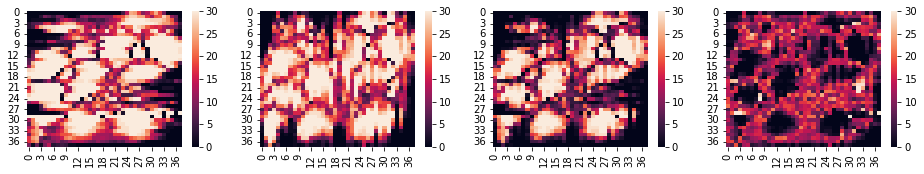

max fitness:  22.7230918666296 6.665254874071017
max fitness:  21.914709605577002 7.473637135123614
max fitness:  21.680986271008933 7.707360469691682
max fitness:  21.844293339270724 7.544053401429892
max fitness:  21.96855395018951 7.4197927905111065
max fitness:  21.942264926210953 7.446081814489663
max fitness:  22.046483663031076 7.34186307766954
max fitness:  22.071455232552072 7.316891508148544
max fitness:  21.801130690558594 7.587216050142022
max fitness:  21.827875966739803 7.560470773960812
max fitness:  22.10848134020093 7.279865400499684
max fitness:  21.937554090681502 7.450792650019114
max fitness:  22.09155624661984 7.296790494080774
max fitness:  22.307715104940495 7.0806316357601204
max fitness:  22.09668897766627 7.2916577630343475
max fitness:  22.00331772778054 7.385029012920075
max fitness:  22.07517978677496 7.313166953925656
max fitness:  22.185281280815616 7.203065459885
max fitness:  22.021280060987834 7.3670666797127815
max fitness:  22.255804843401357 7.1325

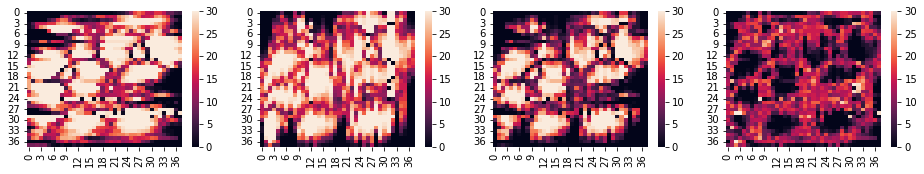

max fitness:  21.75170546264193 7.636641278058686
max fitness:  21.595695463713007 7.792651276987609
max fitness:  21.7201564274097 7.668190313290914
max fitness:  21.61723041899763 7.771116321702987
max fitness:  21.948748235928 7.439598504772615
max fitness:  21.780144050622116 7.6082026900785
max fitness:  21.847848735242284 7.540498005458332
max fitness:  21.938208775055884 7.450137965644732
max fitness:  21.763469709773183 7.624877030927433
max fitness:  21.958488300314897 7.429858440385718
max fitness:  21.71114767559332 7.677199065107295
max fitness:  22.063634200308464 7.324712540392152
max fitness:  22.012285095406977 7.376061645293639
max fitness:  21.950933404053515 7.437413336647101
max fitness:  21.88100966522604 7.507337075474577
max fitness:  22.21664362009674 7.171703120603876
max fitness:  21.72096065619216 7.667386084508454
max fitness:  21.765395026968747 7.622951713731869
max fitness:  21.743111383747028 7.645235356953588
max fitness:  22.08301209788604 7.3053346428

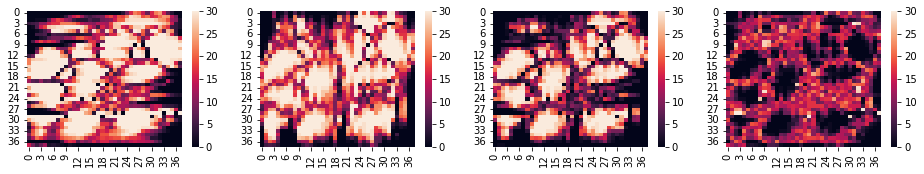

max fitness:  21.82252475969974 7.565821981000877
max fitness:  22.052042048314412 7.336304692386204
max fitness:  21.93537785797966 7.452968882720956
max fitness:  22.127374682963378 7.260972057737238
max fitness:  22.130898398582065 7.2574483421185505
max fitness:  22.05992273347704 7.328424007223575
max fitness:  21.888524573547173 7.499822167153443
max fitness:  22.56917806409455 6.819168676606065
max fitness:  22.017712195426473 7.370634545274143
max fitness:  21.936783122074914 7.451563618625702
max fitness:  21.861922822727244 7.526423917973371
max fitness:  22.04194482167997 7.346401919020646
max fitness:  22.03789823447307 7.350448506227547
max fitness:  21.949475248767616 7.438871491933
max fitness:  21.89860637019768 7.489740370502936
max fitness:  21.962061938445633 7.426284802254983
max fitness:  22.109162791647982 7.2791839490526336
max fitness:  22.077901520196285 7.310445220504331
max fitness:  21.964110967177483 7.424235773523133
max fitness:  22.29669853019269 7.09164

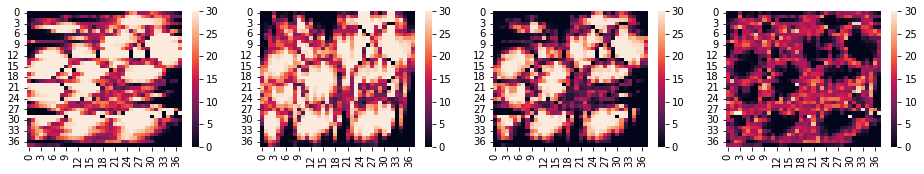

max fitness:  22.088378186374907 7.299968554325709
max fitness:  21.717479763836657 7.670866976863959
max fitness:  21.7291934245695 7.659153316131114
max fitness:  22.028626693714422 7.359720046986194
max fitness:  21.83150851986752 7.556838220833097
max fitness:  21.97622177585076 7.4121249648498555
max fitness:  21.893723537107032 7.494623203593584
max fitness:  21.86215016237537 7.526196578325244
max fitness:  21.7083305147971 7.680016225903515
max fitness:  21.860173703655768 7.528173037044848
max fitness:  22.035889786206358 7.352456954494258
max fitness:  21.977284391711564 7.411062348989052
max fitness:  21.887630355501464 7.500716385199151
max fitness:  21.8275594168644 7.560787323836216
max fitness:  22.215724360805837 7.172622379894779
max fitness:  21.71407385524204 7.674272885458574
max fitness:  21.806486545615204 7.581860195085412
max fitness:  21.60461976789532 7.783726972805297
max fitness:  21.698671772223037 7.689674968477579
max fitness:  21.903561687539103 7.484785

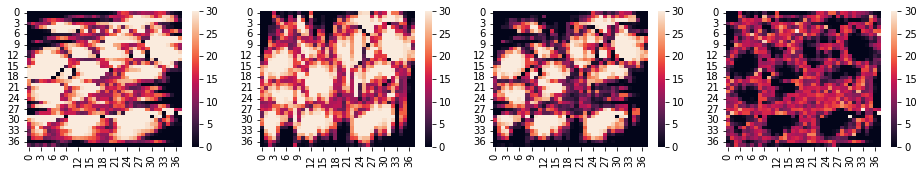

max fitness:  21.949683705750562 7.4386630349500535
max fitness:  22.04222284064239 7.3461239000582275
max fitness:  21.8818249602774 7.506521780423217
max fitness:  21.916560188344786 7.47178655235583
max fitness:  21.994725086441605 7.393621654259011
max fitness:  21.72327719077473 7.665069549925885
max fitness:  21.831969736971025 7.55637700372959
max fitness:  21.864559114187426 7.52378762651319
max fitness:  21.751543016079104 7.636803724621512
max fitness:  21.779055409039145 7.6092913316614705
max fitness:  21.92343575629151 7.464910984409105
max fitness:  21.99543920829029 7.392907532410327
max fitness:  21.822965012343246 7.565381728357369
max fitness:  21.782415161940634 7.605931578759982
max fitness:  21.915240686427033 7.4731060542735825
max fitness:  22.096307147986913 7.292039592713703
max fitness:  21.719208879161137 7.669137861539479
max fitness:  21.775753733297257 7.612593007403358
max fitness:  21.8797364053073 7.508610335393318
max fitness:  21.842032602236287 7.546

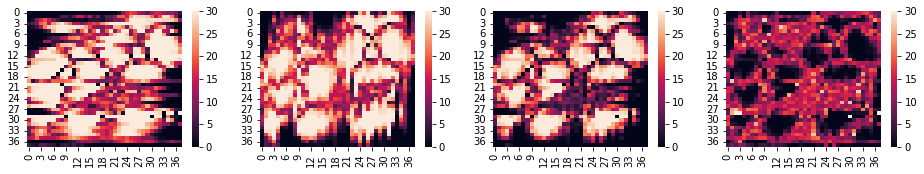

max fitness:  21.763909775046763 7.624436965653853
max fitness:  22.066833871252708 7.321512869447908
max fitness:  21.746794468118473 7.6415522725821425
max fitness:  21.753185855638364 7.635160885062252
max fitness:  21.754662894216505 7.633683846484111
max fitness:  21.57928863327134 7.809058107429276
max fitness:  21.666603554818067 7.7217431858825485
max fitness:  21.899393416370764 7.488953324329852
max fitness:  21.764610634390014 7.623736106310602
max fitness:  21.80932940332519 7.579017337375426
max fitness:  21.735019430484684 7.653327310215932
max fitness:  21.956483348530917 7.431863392169699
max fitness:  21.62340756147288 7.764939179227735
max fitness:  21.651308118446718 7.737038622253898
max fitness:  21.899149544390696 7.48919719630992
max fitness:  21.611845952019614 7.776500788681002
max fitness:  21.75966319771425 7.628683542986366
max fitness:  21.82674332296891 7.561603417731707
max fitness:  21.986607458718346 7.40173928198227
max fitness:  21.877700528361707 7.5

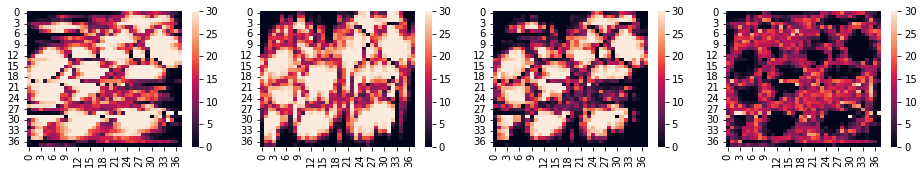

max fitness:  22.02754429706045 7.360802443640164
max fitness:  22.14738364804439 7.2409630926562265
max fitness:  22.07917305998756 7.309173680713055
max fitness:  21.73852404465206 7.649822696048556
max fitness:  21.85560823741467 7.532738503285945
max fitness:  21.79676651897954 7.5915802217210775
max fitness:  21.73571069957834 7.652636041122275
max fitness:  22.122588982447 7.265757758253617
max fitness:  21.577694130723494 7.810652609977122
max fitness:  21.96348528272292 7.424861457977695
max fitness:  21.907859212610237 7.480487528090379
max fitness:  22.0551998983467 7.333146842353916
max fitness:  22.00052312018262 7.387823620517995
max fitness:  21.829550981829165 7.558795758871451
max fitness:  21.913210358745257 7.475136381955359
max fitness:  21.671599985940787 7.7167467547598285
max fitness:  21.663739825189637 7.724606915510979
max fitness:  21.9582827183537 7.430064022346915
max fitness:  21.885813150277873 7.502533590422743
max fitness:  21.853609103431335 7.534737637

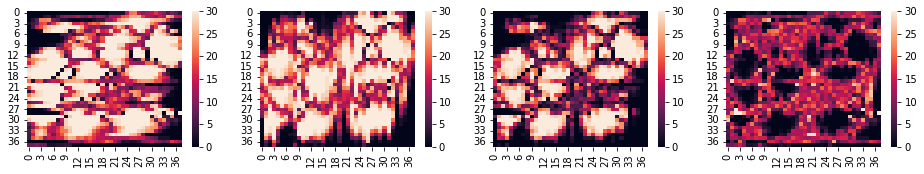

max fitness:  21.81674540161417 7.571601339086445
max fitness:  21.936530931055707 7.451815809644909
max fitness:  22.000272558514652 7.388074182185964
max fitness:  22.239304837375283 7.149041903325333
max fitness:  22.071148003275706 7.31719873742491
max fitness:  22.021327011082803 7.367019729617812
max fitness:  21.79809884055983 7.590247900140785
max fitness:  21.99840916125482 7.389937579445796
max fitness:  21.9813025402569 7.407044200443718
max fitness:  21.927787422469944 7.460559318230672
max fitness:  21.9378241080122 7.450522632688415
max fitness:  21.95461160642681 7.433735134273807
max fitness:  22.043892901829913 7.344453838870702
max fitness:  21.949086860959973 7.439259879740643
max fitness:  22.000253212650758 7.388093528049858
max fitness:  21.960759684213876 7.42758705648674
max fitness:  21.949440292658263 7.438906448042353
max fitness:  21.93284188535776 7.455504855342856
max fitness:  22.16446261687632 7.223884123824295
max fitness:  22.094256733889008 7.29409000

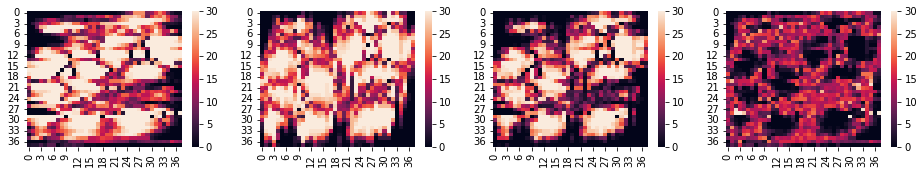

max fitness:  22.156011067503925 7.23233567319669
max fitness:  21.86852548430775 7.519821256392866
max fitness:  21.861804295188087 7.526542445512529
max fitness:  22.084231264725094 7.304115475975522
max fitness:  21.89063791397738 7.497708826723237
max fitness:  22.44016537824348 6.9481813624571345
max fitness:  22.121028484896698 7.267318255803918
max fitness:  21.864314980258598 7.524031760442018
max fitness:  22.039988367162625 7.348358373537991
max fitness:  21.604170838401593 7.7841759022990225
max fitness:  21.760263425316726 7.62808331538389
max fitness:  21.905814938058406 7.48253180264221
max fitness:  21.5822408040907 7.806105936609917
max fitness:  22.01343683380526 7.374909906895354
max fitness:  21.936833121651997 7.451513619048619
max fitness:  21.895575114501753 7.492771626198863
max fitness:  22.0466518434266 7.341694897274017
max fitness:  21.63901110703719 7.749335633663424
max fitness:  21.954672454820365 7.433674285880251
max fitness:  21.81346002380415 7.5748867

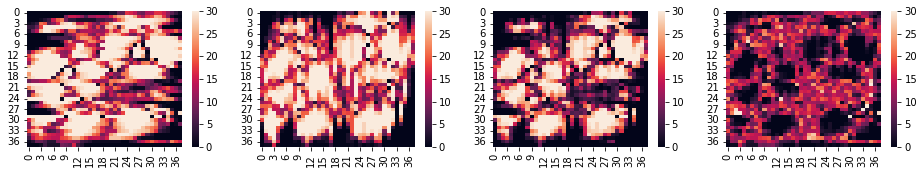

max fitness:  22.126957435660557 7.261389305040058
max fitness:  21.831377593333517 7.556969147367099
max fitness:  21.867464721171885 7.520882019528731
max fitness:  22.053659896547035 7.33468684415358
max fitness:  22.273490001667696 7.11485673903292
max fitness:  22.02031513523934 7.368031605461276
max fitness:  21.852434791611643 7.535911949088973
max fitness:  21.994724502741192 7.393622237959423
max fitness:  21.932298674467148 7.456048066233468
max fitness:  21.950326016175467 7.438020724525149
max fitness:  21.79898140387723 7.589365336823384
max fitness:  22.033950747222875 7.354395993477741
max fitness:  21.82325844007639 7.565088300624225
max fitness:  21.998704583899997 7.389642156800619
max fitness:  21.697264827695633 7.691081913004982
max fitness:  21.75900114902923 7.629345591671385
max fitness:  21.988560443938255 7.399786296762361
max fitness:  21.90898977822507 7.479356962475546
max fitness:  22.153271665630513 7.235075075070103
max fitness:  22.038507650717946 7.349

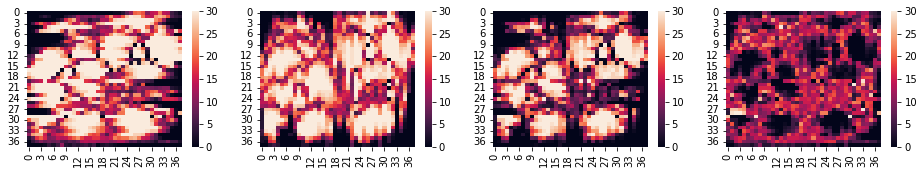

max fitness:  21.658221365055844 7.730125375644771
max fitness:  21.94604968409506 7.4422970566055575
max fitness:  21.77253290303562 7.615813837664994
max fitness:  21.724838711135686 7.66350802956493
max fitness:  21.971032881337106 7.41731385936351
max fitness:  22.03840094372757 7.349945796973046
max fitness:  22.000728077953745 7.3876186627468705
max fitness:  21.94809019597491 7.440256544725706
max fitness:  21.78493350864227 7.603413232058347
max fitness:  22.106162208078878 7.282184532621738
max fitness:  21.600293352172244 7.788053388528372
max fitness:  21.59005447422517 7.798292266475446
max fitness:  21.83347068272497 7.5548760579756475
max fitness:  22.007375700053814 7.380971040646802
max fitness:  22.08647828888041 7.301868451820205
max fitness:  21.934193645207255 7.454153095493361
max fitness:  21.87803526942315 7.510311471277465
max fitness:  21.99295277056475 7.395393970135867
max fitness:  21.90342877709067 7.484917963609945
max fitness:  21.910007945355666 7.478338

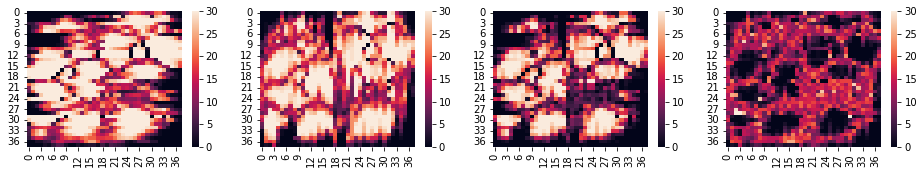

max fitness:  21.82391584456244 7.564430896138177
max fitness:  21.99017360535355 7.398173135347065
max fitness:  21.872952207165476 7.51539453353514
max fitness:  21.98745192182619 7.400894818874427
max fitness:  21.965636367948054 7.422710372752562
max fitness:  21.83318091580918 7.555165824891436
max fitness:  21.888461385233462 7.499885355467153
max fitness:  21.713907926891157 7.674438813809459
max fitness:  21.735364560794274 7.652982179906342
max fitness:  21.77901225593206 7.6093344847685565
max fitness:  21.8120873825942 7.576259358106416
max fitness:  21.961302060166698 7.427044680533918
max fitness:  21.639096567347643 7.749250173352973
max fitness:  21.876925517728896 7.51142122297172
max fitness:  21.85120269809695 7.537144042603664
max fitness:  21.791793289457875 7.596553451242741
max fitness:  21.837401665901496 7.55094507479912
max fitness:  22.038529281660065 7.349817459040551
max fitness:  21.974777230996445 7.413569509704171
max fitness:  21.831291730240586 7.557055

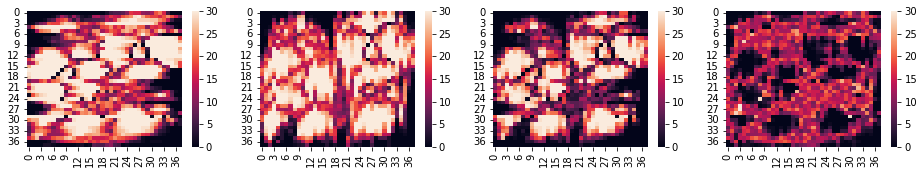

max fitness:  21.729390477122962 7.658956263577654
max fitness:  21.639866003730685 7.748480736969931
max fitness:  21.782700816081352 7.605645924619264
max fitness:  21.643987966748256 7.74435877395236
max fitness:  21.919300845274044 7.4690458954265715
max fitness:  21.62573131113131 7.762615429569305
max fitness:  22.05272898266375 7.3356177580368644
max fitness:  21.800264041687306 7.5880826990133095
max fitness:  21.857032721504936 7.53131401919568
max fitness:  22.062671415619004 7.325675325081612
max fitness:  21.932035947939156 7.45631079276146
max fitness:  21.94562863715445 7.4427181035461665
max fitness:  21.833534239606436 7.55481250109418
max fitness:  21.788115335467104 7.600231405233512
max fitness:  21.902543175344423 7.485803565356193
max fitness:  21.823584212639098 7.564762528061518
max fitness:  21.65194632085116 7.736400419849456
max fitness:  21.73675375848599 7.651592982214627
max fitness:  22.04781100749665 7.340535733203964
max fitness:  21.607091606843003 7.78

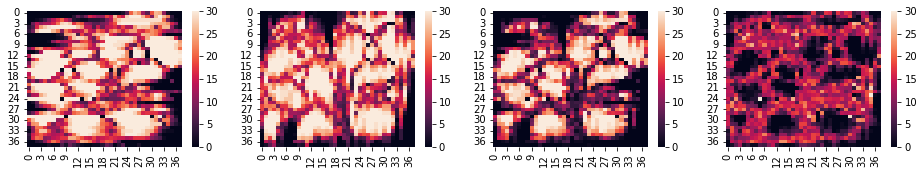

max fitness:  22.00261784993653 7.385728890764085
max fitness:  21.54149229227589 7.846854448424725
max fitness:  21.55967460993596 7.828672130764655
max fitness:  21.617154160898306 7.77119257980231
max fitness:  21.77080974098201 7.617536999718606
max fitness:  21.911504288295063 7.476842452405553
max fitness:  21.839017036781684 7.549329703918932
max fitness:  21.87662796170874 7.511718778991877
max fitness:  21.863843776966583 7.524502963734033
max fitness:  21.594965056874322 7.7933816838262935
max fitness:  21.619501662941452 7.768845077759163
max fitness:  21.708191656763745 7.680155083936871
max fitness:  22.100628026261532 7.287718714439084
max fitness:  21.933376637070523 7.454970103630092
max fitness:  21.907920300700972 7.480426439999643
max fitness:  21.58873624066791 7.799610500032706
max fitness:  21.716138204664247 7.6722085360363685
max fitness:  21.57336742453377 7.814979316166845
max fitness:  21.849681540259574 7.5386652004410415
max fitness:  21.8268234798068 7.561

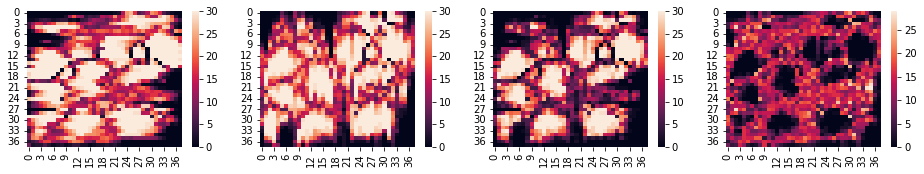

max fitness:  21.924131594195853 7.464215146504763
max fitness:  21.868482710140583 7.519864030560033
max fitness:  22.007775073854425 7.3805716668461905
max fitness:  22.084171577490473 7.304175163210143
max fitness:  22.021962764217577 7.366383976483039
max fitness:  21.76807854314588 7.620268197554736
max fitness:  21.994153562432754 7.394193178267862
max fitness:  21.93154486395367 7.4568018767469475
max fitness:  21.757478176016342 7.630868564684274
max fitness:  21.84474635087023 7.5436003898303845
max fitness:  22.059642845975056 7.32870389472556
max fitness:  22.008685738788827 7.3796610019117885
max fitness:  21.886260328784992 7.502086411915624
max fitness:  21.89462313917514 7.493723601525478
max fitness:  22.114215028860897 7.274131711839718
max fitness:  22.226439750285788 7.161906990414828
max fitness:  22.142325264021963 7.246021476678653
max fitness:  21.954850727954355 7.433496012746261
max fitness:  21.932636385643367 7.455710355057249
max fitness:  21.949335319905373

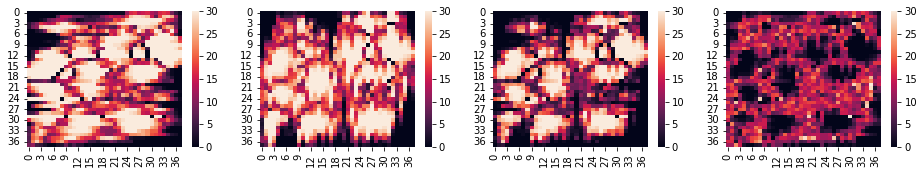

max fitness:  21.676687023993114 7.711659716707501
max fitness:  21.80672473524966 7.581622005450956
max fitness:  21.88852727775855 7.499819462942067
max fitness:  21.720843709157275 7.66750303154334
max fitness:  21.740222327721284 7.648124412979332
max fitness:  21.75506184932446 7.633284891376157
max fitness:  22.197047925132267 7.191298815568349
max fitness:  21.84764945034204 7.540697290358576
max fitness:  21.96873328147789 7.419613459222727
max fitness:  21.84269075739672 7.545655983303895
max fitness:  21.82743490853507 7.560911832165544
max fitness:  21.772768041940786 7.61557869875983
max fitness:  21.999804665914958 7.388542074785658
max fitness:  22.065398658403467 7.322948082297149
max fitness:  22.13948194609913 7.248864794601484
max fitness:  21.888470333822355 7.499876406878261
max fitness:  22.27727339193204 7.111073348768574
max fitness:  21.84889120945671 7.539455531243906
max fitness:  21.674667034553565 7.713679706147051
max fitness:  21.78289628319603 7.605450457

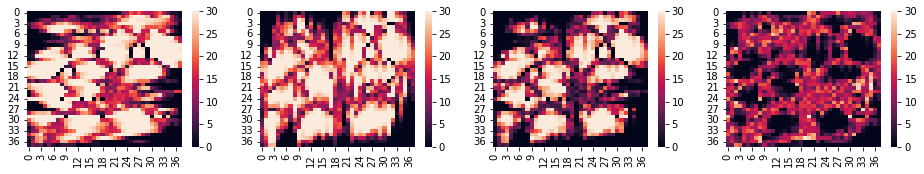

max fitness:  21.866783650905894 7.521563089794721
max fitness:  21.93059124325903 7.457755497441585
max fitness:  22.06182834401711 7.3265183966835075
max fitness:  21.839101316667072 7.549245424033543
max fitness:  21.806562854870034 7.581783885830582
max fitness:  21.969466486339925 7.41888025436069
max fitness:  21.924159563493923 7.464187177206693
max fitness:  21.999018069034094 7.389328671666522
max fitness:  22.00995986467044 7.378386876030177
max fitness:  21.94025813928134 7.4480886014192755
max fitness:  22.15977335074593 7.228573389954686
max fitness:  21.913139562068473 7.475207178632143
max fitness:  22.02473818560732 7.363608555093297
max fitness:  21.898098049197287 7.490248691503329
max fitness:  21.844627881793453 7.543718858907162
max fitness:  21.881611772818395 7.50673496788222
max fitness:  22.050121038111538 7.338225702589078
max fitness:  22.04247072978692 7.345876010913695
max fitness:  22.064111120881766 7.32423561981885
max fitness:  22.116668252829484 7.2716

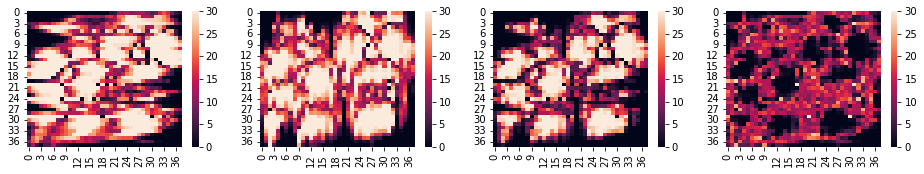

max fitness:  22.11278307540435 7.275563665296264
max fitness:  21.984865811589636 7.40348092911098
max fitness:  22.005430231005594 7.382916509695022
max fitness:  22.00338619227559 7.384960548425028
max fitness:  22.007767854737153 7.3805788859634625
max fitness:  21.909508519543657 7.478838221156959
max fitness:  21.928012227617902 7.460334513082714
max fitness:  21.946593926466644 7.441752814233972
max fitness:  21.74663283857315 7.641713902127467
max fitness:  21.671482744544996 7.71686399615562
max fitness:  21.896327447033265 7.492019293667351
max fitness:  21.90647644085347 7.481870299847145
max fitness:  21.845585835488578 7.542760905212038
max fitness:  21.871334525294614 7.517012215406002
max fitness:  22.022958176541223 7.365388564159392
max fitness:  21.978140804859116 7.4102059358415
max fitness:  21.762526091715362 7.625820648985254
max fitness:  22.071856352466657 7.316490388233959
max fitness:  22.03805064643329 7.350296094267325
max fitness:  21.97205010763247 7.41629

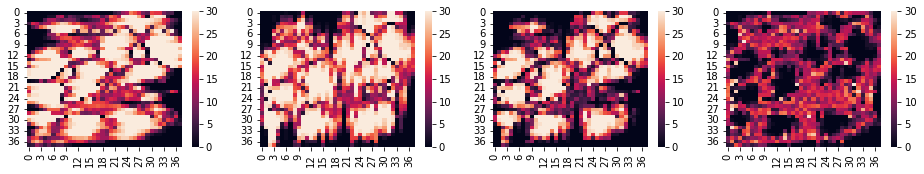

max fitness:  22.153825799838348 7.234520940862268
max fitness:  21.90041400128188 7.487932739418735
max fitness:  22.32083997869829 7.067506762002324
max fitness:  22.03870780384461 7.349638936856007
max fitness:  22.0210904951287 7.367256245571916
max fitness:  22.154590051901028 7.233756688799588
max fitness:  21.846149188579083 7.542197552121532
max fitness:  22.011831192622353 7.376515548078263
max fitness:  22.288805492072363 7.0995412486282525
max fitness:  21.832513603912226 7.55583313678839
max fitness:  22.043335707317844 7.345011033382772
max fitness:  21.891860335122473 7.496486405578143
max fitness:  22.245688806197617 7.142657934502999
max fitness:  21.779853368985684 7.608493371714932
max fitness:  22.00818821580892 7.380158524891694
max fitness:  22.036504844878763 7.3518418958218525
max fitness:  21.84384374769946 7.5445029930011565
max fitness:  22.028598316738872 7.359748423961744
max fitness:  22.116128092958757 7.272218647741859
max fitness:  22.42166588717502 6.96

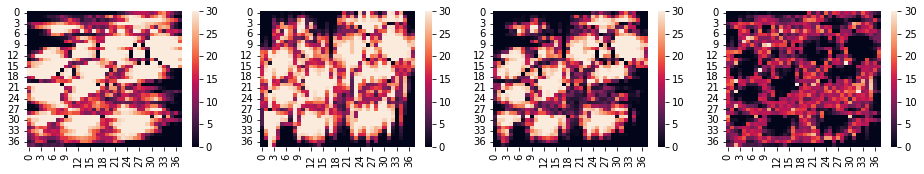

max fitness:  21.916586789764303 7.471759950936313
max fitness:  21.888559807068155 7.4997869336324605
max fitness:  22.044907403234365 7.3434393374662505
max fitness:  21.99075822423132 7.397588516469295
max fitness:  21.991831659776224 7.396515080924392
max fitness:  21.92263912922761 7.465707611473007
max fitness:  21.806134409283917 7.582212331416699
max fitness:  21.7143922870548 7.673954453645816
max fitness:  22.118386096055165 7.269960644645451
max fitness:  21.893791072722316 7.4945556679783
max fitness:  21.83465648704425 7.553690253656367
max fitness:  21.849209433137702 7.539137307562914
max fitness:  21.88645784359095 7.501888897109666
max fitness:  22.05082681499322 7.337519925707397
max fitness:  22.043616588836272 7.3447301518643435
max fitness:  21.850902578826926 7.53744416187369
max fitness:  21.95173689242345 7.436609848277165
max fitness:  22.11426749250308 7.274079248197534
max fitness:  22.17789682875445 7.210449911946167
max fitness:  21.863724955390012 7.524621

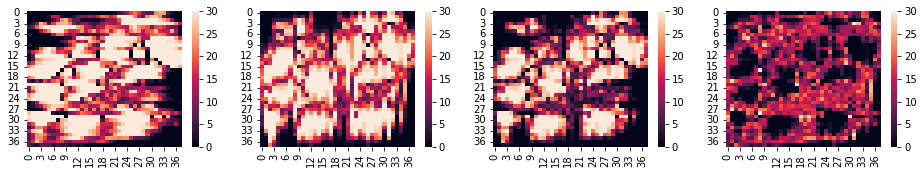

max fitness:  22.00140260663848 7.386944134062137
max fitness:  21.941165878538484 7.447180862162131
max fitness:  22.218427649150858 7.169919091549758
max fitness:  22.01957646829497 7.368770272405644
max fitness:  22.309454749466862 7.078891991233753
max fitness:  21.804726123774024 7.583620616926591
max fitness:  21.817411502528007 7.570935238172609
max fitness:  21.945691200832808 7.442655539867808
max fitness:  22.137534684381123 7.250812056319493
max fitness:  22.023965616955735 7.364381123744881
max fitness:  22.3434845422488 7.044862198451817
max fitness:  21.979743296108268 7.408603444592348
max fitness:  21.921896974562355 7.466449766138261
max fitness:  22.105757966271803 7.282588774428813
max fitness:  22.040344478806425 7.348002261894191
max fitness:  22.02214540184081 7.366201338859806
max fitness:  22.044765906799572 7.3435808339010435
max fitness:  21.923096530010877 7.465250210689739
max fitness:  22.09808570349655 7.290261037204065
max fitness:  21.936910806653046 7.4

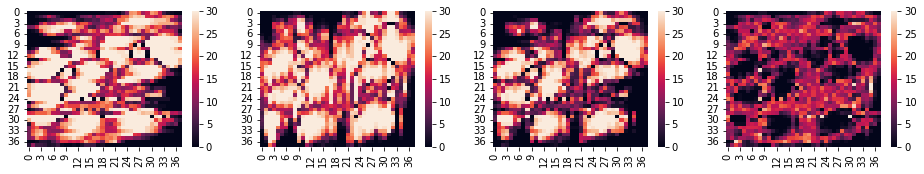

max fitness:  21.74592198310669 7.6424247575939255
max fitness:  22.05395109953902 7.334395641161596
max fitness:  22.219039738437328 7.169307002263288
max fitness:  22.080553179132465 7.30779356156815
max fitness:  21.632463587984326 7.75588315271629
max fitness:  21.777539117206082 7.610807623494534
max fitness:  22.10616822422877 7.282178516471845
max fitness:  21.955982542621925 7.432364198078691
max fitness:  21.870929230722076 7.517417509978539
max fitness:  22.171552622711605 7.216794117989011
max fitness:  21.940729236715523 7.447617503985093
max fitness:  21.927506339590543 7.460840401110072
max fitness:  21.713491710568746 7.674855030131869
max fitness:  21.665205228422753 7.723141512277863
max fitness:  21.746524657574753 7.641822083125863
max fitness:  21.77755259059805 7.610794150102567
max fitness:  21.718147882919737 7.670198857780878
max fitness:  21.778999830686836 7.60934691001378
max fitness:  22.131614935472413 7.256731805228203
max fitness:  21.964022984360973 7.42

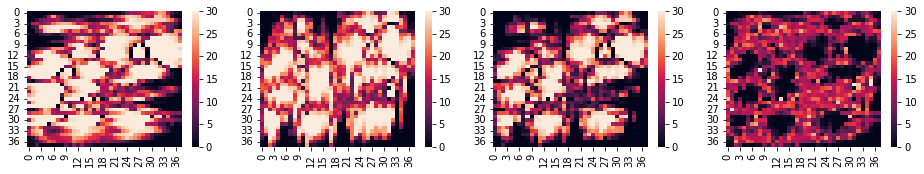

max fitness:  22.054846368438696 7.33350037226192
max fitness:  21.634573492996367 7.753773247704249
max fitness:  21.80390202760371 7.584444713096907
max fitness:  21.91403210839978 7.474314632300835
max fitness:  21.869425937197324 7.518920803503292
max fitness:  21.765427930792995 7.62291880990762
max fitness:  21.773393302936675 7.6149534377639405
max fitness:  22.03832937556296 7.350017365137656
max fitness:  21.85860728533442 7.529739455366197
max fitness:  22.014293360623586 7.374053380077029
max fitness:  21.824220722407286 7.564126018293329
max fitness:  21.851762078126075 7.5365846625745405
max fitness:  21.87298703943344 7.515359701267176
max fitness:  21.949573150413446 7.43877359028717
max fitness:  21.642751972797853 7.745594767902762
max fitness:  21.982499989166495 7.405846751534121
max fitness:  22.02538926413619 7.362957476564425
max fitness:  21.823375122484947 7.564971618215669
max fitness:  21.821047938518056 7.56729880218256
max fitness:  22.2634017773306 7.124944

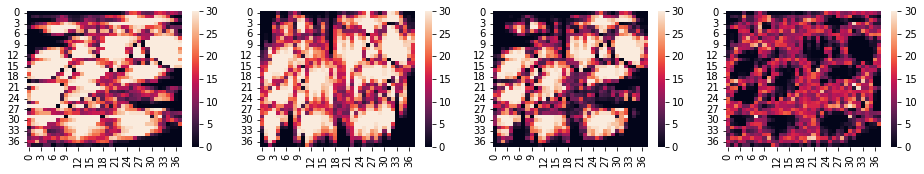

max fitness:  21.739851473726183 7.648495266974432
max fitness:  22.00847741586965 7.379869324830967
max fitness:  21.78167148444637 7.6066752562542455
max fitness:  21.782241580516803 7.606105160183812
max fitness:  22.01655357496436 7.371793165736257
max fitness:  22.25365018210999 7.134696558590626
max fitness:  22.06346328358728 7.324883457113337
max fitness:  22.054721958532134 7.3336247821684815
max fitness:  21.888082239579305 7.500264501121311
max fitness:  21.90273952337096 7.485607217329655
max fitness:  22.153528252318274 7.234818488382341
max fitness:  21.951465070761266 7.43688166993935
max fitness:  22.198343771552008 7.190002969148608
max fitness:  22.050803560489896 7.337543180210719
max fitness:  22.09104328806221 7.297303452638406
max fitness:  22.112991815440424 7.275354925260192
max fitness:  21.924552113569973 7.463794627130643
max fitness:  22.024231321470392 7.364115419230224
max fitness:  21.99895536255029 7.389391378150325
max fitness:  21.773635078336845 7.614

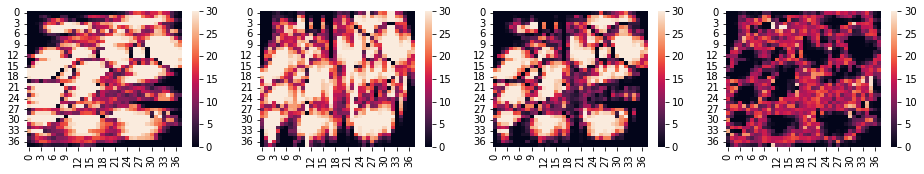

max fitness:  21.772281385546826 7.61606535515379
max fitness:  21.872829016778503 7.5155177239221125
max fitness:  22.408177012523307 6.980169728177309
max fitness:  21.919600139821732 7.468746600878884
max fitness:  21.759651856986917 7.628694883713699
max fitness:  21.811075746039243 7.577270994661372
max fitness:  22.176387414747474 7.211959325953142
max fitness:  21.700658285550016 7.6876884551505995
max fitness:  21.795136711790505 7.593210028910111
max fitness:  21.993015322112903 7.395331418587713
max fitness:  21.943958614836628 7.444388125863988
max fitness:  22.17845123169194 7.209895509008675
max fitness:  21.912101569865243 7.476245170835373
max fitness:  21.897695137668602 7.490651603032013
max fitness:  21.852640522536195 7.535706218164421
max fitness:  22.149970192206077 7.238376548494539
max fitness:  22.00064139490298 7.3877053457976345
max fitness:  21.874538216404826 7.51380852429579
max fitness:  21.84286913191324 7.545477608787376
max fitness:  21.95078544697844 7

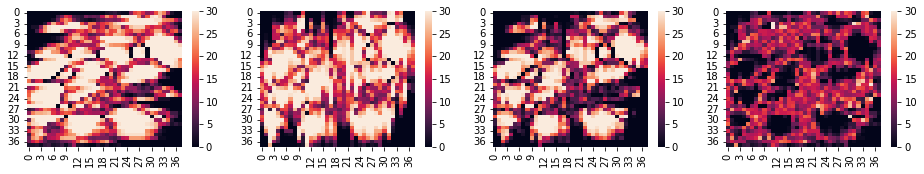

max fitness:  21.80275914013839 7.585587600562224
max fitness:  21.83329300732161 7.555053733379005
max fitness:  21.78941994143253 7.598926799268085
max fitness:  22.06237463663518 7.3259721040654355
max fitness:  22.201266310684343 7.187080430016273
max fitness:  21.891911684546752 7.496435056153864
max fitness:  22.13361578220919 7.254730958491425
max fitness:  21.756475659959413 7.6318710807412025
max fitness:  22.133874894885366 7.2544718458152495
max fitness:  21.972763547401534 7.415583193299081
max fitness:  22.06892161025703 7.319425130443587
max fitness:  21.968151721359188 7.420195019341428
max fitness:  21.959487621508345 7.428859119192271
max fitness:  21.811890583301185 7.576456157399431
max fitness:  22.025328692832815 7.363018047867801
max fitness:  21.95412661403974 7.434220126660875
max fitness:  21.79162823972724 7.5967185009733775
max fitness:  21.918945152031398 7.469401588669218
max fitness:  22.0366812936769 7.351665447023716
max fitness:  21.720723855914283 7.66

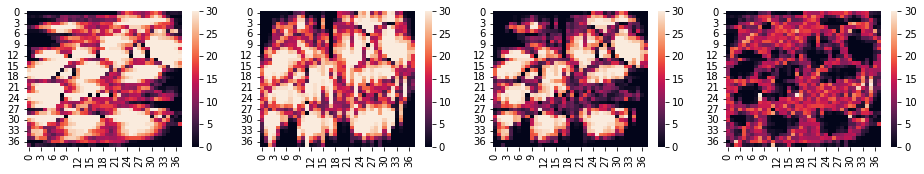

max fitness:  21.76216899951946 7.626177741181156
max fitness:  21.742674814735413 7.645671925965203
max fitness:  21.755750382460967 7.632596358239649
max fitness:  21.76355207895975 7.624794661740864
max fitness:  21.884201326661966 7.50414541403865
max fitness:  21.764254789589057 7.624091951111559
max fitness:  22.136715255552623 7.251631485147993
max fitness:  21.89663849901327 7.491708241687345
max fitness:  21.87903956949998 7.509307171200636
max fitness:  21.76396928744677 7.624377453253846
max fitness:  21.907970636290635 7.480376104409981
max fitness:  21.89722670612702 7.491120034573594
max fitness:  21.884273563416528 7.504073177284088
max fitness:  21.88835189721637 7.499994843484245
max fitness:  21.77336480719127 7.614981933509345
max fitness:  21.97934670964353 7.4090000310570865
max fitness:  21.94737588225612 7.440970858444494
max fitness:  21.774108622845993 7.614238117854622
max fitness:  21.792048853846737 7.596297886853879
max fitness:  21.870567172451178 7.517779

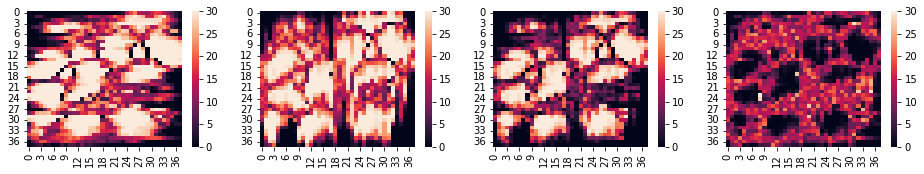

max fitness:  21.769677110146354 7.618669630554262
max fitness:  22.24594856131781 7.1423981793828055
max fitness:  21.820249925703536 7.56809681499708
max fitness:  21.744185353855066 7.64416138684555
max fitness:  21.82494146524184 7.563405275458777
max fitness:  22.18758101024376 7.200765730456855
max fitness:  21.742716474873557 7.645630265827059
max fitness:  21.788159439493768 7.600187301206848
max fitness:  21.92357043482782 7.464776305872796
max fitness:  22.171826125718063 7.216520614982553
max fitness:  22.106431386108028 7.281915354592588
max fitness:  22.145071267859738 7.243275472840878
max fitness:  21.95878353374745 7.429563206953166
max fitness:  21.85692355002096 7.531423190679657
max fitness:  22.253073816266184 7.135272924434432
max fitness:  22.143040937500572 7.2453058032000435
max fitness:  22.04283864829364 7.345508092406977
max fitness:  21.948808666722563 7.439538073978053
max fitness:  22.142743311986465 7.245603428714151
max fitness:  21.922919845956123 7.465

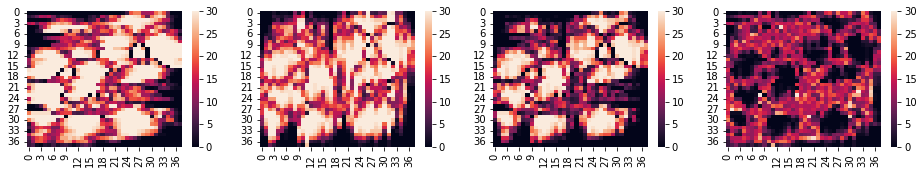

max fitness:  22.107552266554308 7.280794474146308
max fitness:  21.99380248259643 7.394544258104187
max fitness:  21.944005579704168 7.444341160996448
max fitness:  21.903216468292683 7.4851302724079325
max fitness:  22.189212227103436 7.19913451359718
max fitness:  21.87612842083071 7.5122183198699055
max fitness:  21.83653630881308 7.551810431887535
max fitness:  21.802953982651253 7.5853927580493625
max fitness:  21.934048463593697 7.454298277106918
max fitness:  22.12528698144282 7.263059759257796
max fitness:  22.03477257520504 7.353574165495576
max fitness:  21.92253266315169 7.465814077548927
max fitness:  22.165842884314117 7.222503856386499
max fitness:  22.038197780596978 7.350148960103638
max fitness:  21.80430452138997 7.584042219310646
max fitness:  21.991750870591222 7.396595870109394
max fitness:  22.006958427644143 7.381388313056473
max fitness:  21.972221340155944 7.416125400544672
max fitness:  22.081308167803734 7.307038572896882
max fitness:  22.019965720044304 7.3

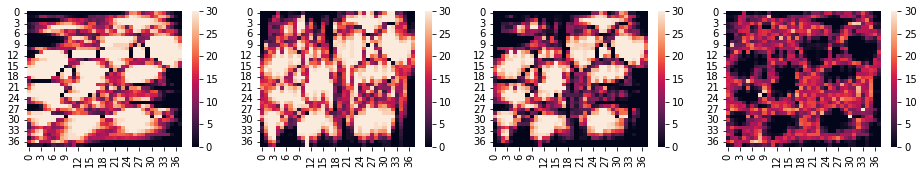

max fitness:  22.468884375291715 6.919462365408901
max fitness:  21.98008157089272 7.408265169807894
max fitness:  21.99028319947736 7.398063541223255
max fitness:  22.09641508786664 7.291931652833977
max fitness:  22.061302586735835 7.327044153964781
max fitness:  22.077582839462835 7.310763901237781
max fitness:  22.0626467348399 7.325700005860718
max fitness:  22.047720874122213 7.340625866578403
max fitness:  21.94777305182234 7.440573688878274
max fitness:  22.034162803593013 7.354183937107603
max fitness:  22.181384682431506 7.206962058269109
max fitness:  22.157135036356852 7.231211704343764
max fitness:  22.258564525078178 7.129782215622438
max fitness:  22.346688393986152 7.041658346714463
max fitness:  22.40460173656095 6.983745004139667
max fitness:  22.35357396850761 7.034772772193005
max fitness:  22.330132737643304 7.058214003057312
max fitness:  22.386895790910277 7.001450949790339
max fitness:  22.39725094022641 6.991095800474206
max fitness:  22.15362425175285 7.234722

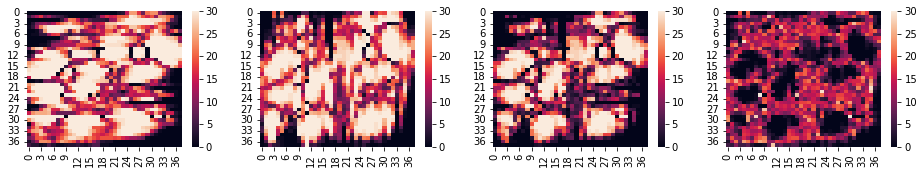

max fitness:  22.50791139099133 6.880435349709284
max fitness:  22.133075679895413 7.255271060805203
max fitness:  22.18029477255267 7.208051968147945
max fitness:  22.018233426579886 7.370113314120729
max fitness:  22.203510010204592 7.1848367304960234
max fitness:  22.208789169351803 7.179557571348813
max fitness:  22.15698817160432 7.231358569096297
max fitness:  22.082571059710574 7.305775680990042
max fitness:  22.002253226461413 7.386093514239203
max fitness:  22.28448901116586 7.103857729534756
max fitness:  21.947553062778592 7.440793677922024
max fitness:  21.949533881024603 7.438812859676013
max fitness:  21.952628107637448 7.435718633063168
max fitness:  22.194988078844993 7.193358661855623
max fitness:  22.20771345576504 7.180633284935574
max fitness:  22.004774745056093 7.383571995644523
max fitness:  21.988927698838285 7.3994190418623305
max fitness:  22.006944323933006 7.38140241676761
max fitness:  21.979564298809752 7.408782441890864
max fitness:  21.75290474802168 7.6

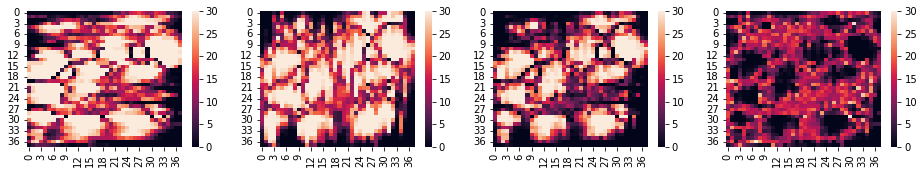

max fitness:  22.15465838807401 7.233688352626604
max fitness:  22.096546116500775 7.2918006241998405
max fitness:  21.925078804592488 7.463267936108128
max fitness:  22.135925827085597 7.252420913615019
max fitness:  22.040764377148815 7.347582363551801
max fitness:  21.958634722417496 7.429712018283119
max fitness:  21.883186585579107 7.505160155121509
max fitness:  21.888821759465934 7.499524981234682
max fitness:  22.4103921323957 6.977954608304916
max fitness:  22.044890003167787 7.343456737532829
max fitness:  21.98475801715806 7.403588723542555
max fitness:  22.074746303046574 7.313600437654042
max fitness:  22.053567554160203 7.334779186540413
max fitness:  22.1625869971284 7.225759743572215
max fitness:  22.09701232679563 7.291334413904984
max fitness:  22.152146928959915 7.2361998117407005
max fitness:  22.18198531981878 7.206361420881837
max fitness:  21.923558980179514 7.4647877605211015
max fitness:  22.167378846141446 7.22096789455917
max fitness:  22.078534738051108 7.30

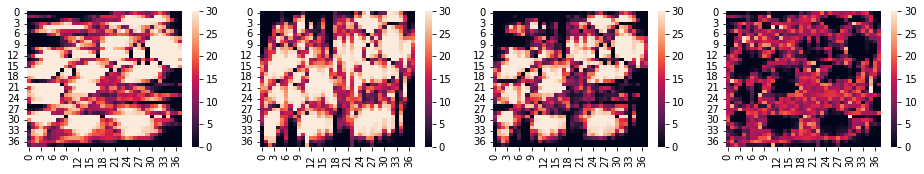

max fitness:  22.071307977074728 7.317038763625888
max fitness:  22.356035695341127 7.032311045359489
max fitness:  22.0596471776014 7.328699563099217
max fitness:  22.22792771975977 7.1604190209408465
max fitness:  22.171348966384304 7.216997774316312
max fitness:  21.934454050693702 7.453892690006914
max fitness:  22.1756387497473 7.212707990953316
max fitness:  22.356857761118654 7.031488979581962
max fitness:  22.271987584512193 7.116359156188423
max fitness:  22.053324840132753 7.335021900567863
max fitness:  22.239162589016047 7.149184151684569
max fitness:  22.123608522603526 7.26473821809709
max fitness:  22.32881313320755 7.059533607493066
max fitness:  22.299903409166536 7.08844333153408
max fitness:  22.30988006594069 7.078466674759927
max fitness:  22.30701634767479 7.0813303930258265
max fitness:  22.550492441603907 6.837854299096708
max fitness:  22.377143546176033 7.011203194524583
max fitness:  22.424330704528437 6.964016036172179
max fitness:  22.208932111028176 7.1794

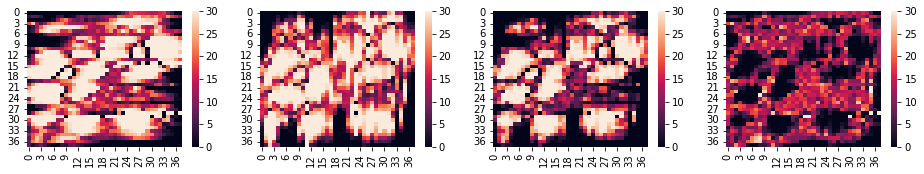

max fitness:  22.23947395449407 7.148872786206546
max fitness:  22.153840515181997 7.2345062255186185
max fitness:  21.880958454024917 7.507388286675699
max fitness:  22.255489547669768 7.132857193030848
max fitness:  22.014630686434288 7.373716054266328
max fitness:  22.137186814205517 7.251159926495099
max fitness:  22.235577126861045 7.15276961383957
max fitness:  21.902260691407278 7.486086049293338
max fitness:  21.813777958427757 7.574568782272859
max fitness:  22.110377589015325 7.277969151685291
max fitness:  21.934526646249708 7.453820094450908
max fitness:  21.905026532571767 7.483320208128848
max fitness:  21.784932518913728 7.603414221786888
max fitness:  21.5789747734492 7.8093719672514155
max fitness:  21.643228028240973 7.745118712459643
max fitness:  21.89487229652992 7.4934744441706975
max fitness:  21.92662021584952 7.461726524851095
max fitness:  21.8336888862355 7.554657854465116
max fitness:  22.134456575457826 7.25389016524279
max fitness:  22.195170983987158 7.19

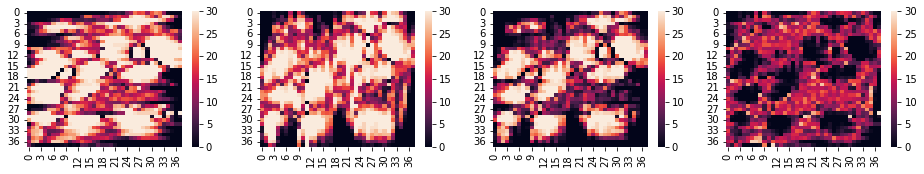

max fitness:  21.896108666292477 7.492238074408139
max fitness:  21.868962143176468 7.519384597524148
max fitness:  22.03874392330655 7.349602817394064
max fitness:  22.290977916048597 7.097368824652019
max fitness:  21.904035043848197 7.484311696852419
max fitness:  21.91210762925138 7.476239111449235
max fitness:  21.78368998372852 7.604656756972094
max fitness:  21.84860136116931 7.539745379531304
max fitness:  21.854243715673917 7.534103025026699
max fitness:  21.911974661552744 7.476372079147872
max fitness:  21.77366499260158 7.614681748099034
max fitness:  21.982755152067437 7.405591588633179
max fitness:  21.932632857801842 7.455713882898774
max fitness:  22.272601615509956 7.11574512519066
max fitness:  22.330807235843373 7.0575395048572425
max fitness:  22.03252223458485 7.355824506115766
max fitness:  21.739198230968558 7.649148509732058
max fitness:  21.813200888439624 7.575145852260992
max fitness:  21.89771472586986 7.490632014830755
max fitness:  21.913822262825995 7.474

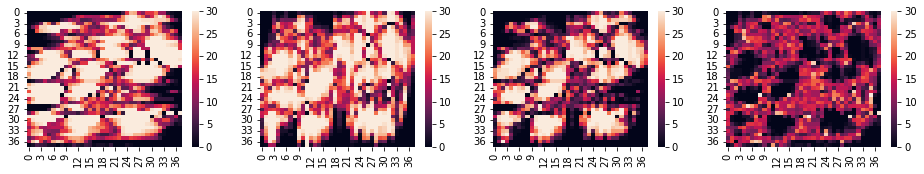

max fitness:  22.053550959843257 7.334795780857359
max fitness:  21.943189029491386 7.44515771120923
max fitness:  22.13479559785695 7.253551142843666
max fitness:  21.74560601535999 7.6427407253406265
max fitness:  21.769671728814576 7.61867501188604
max fitness:  21.83612329709921 7.552223443601406
max fitness:  21.817977372109546 7.57036936859107
max fitness:  21.765382357304176 7.62296438339644
max fitness:  22.10682475822965 7.2815219824709665
max fitness:  22.154876338113176 7.2334704025874395
max fitness:  22.073976059339536 7.31437068136108
max fitness:  22.226989344687926 7.16135739601269
max fitness:  22.03768517943947 7.350661561261145
max fitness:  22.110908049936953 7.277438690763663
max fitness:  22.190780114555956 7.19756662614466
max fitness:  22.131718243898725 7.256628496801891
max fitness:  21.744311385157943 7.644035355542673
max fitness:  21.803439671596948 7.584907069103668
max fitness:  22.061168787382137 7.327177953318479
max fitness:  21.83215505870361 7.556191

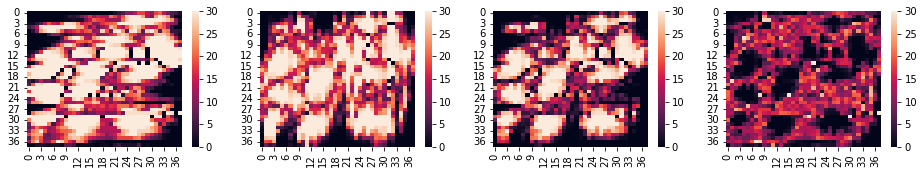

max fitness:  22.1712942446051 7.217052496095516
max fitness:  21.756863496272487 7.631483244428129
max fitness:  22.039652521545946 7.34869421915467
max fitness:  22.02193882846867 7.366407912231946
max fitness:  21.993835003953006 7.39451173674761
max fitness:  21.85596652779746 7.532380212903156
max fitness:  21.788321844690977 7.600024896009639
max fitness:  21.91755132766582 7.470795413034796
max fitness:  22.05688026291211 7.331466477788506
max fitness:  21.77371725190694 7.614629488793675
max fitness:  21.835543328320508 7.552803412380108
max fitness:  21.98675327062913 7.401593470071486
max fitness:  21.77706513813642 7.611281602564194
max fitness:  21.99546253471432 7.392884205986295
max fitness:  21.87197788907443 7.516368851626186
max fitness:  21.82447096618862 7.563875774511995
max fitness:  22.009660811503952 7.3786859291966636
max fitness:  21.914189713675967 7.474157027024649
max fitness:  22.00346584785319 7.384880892847427
max fitness:  22.222530826249915 7.1658159144

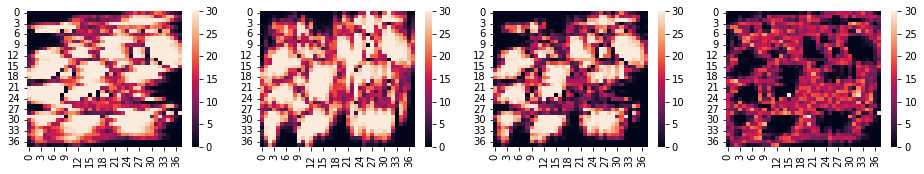

max fitness:  21.697830121111867 7.690516619588749
max fitness:  21.674846308124927 7.713500432575689
max fitness:  21.812775374629965 7.575571366070651
max fitness:  22.154633209586976 7.23371353111364
max fitness:  21.78449548655053 7.6038512541500864
max fitness:  21.748438804195604 7.639907936505011
max fitness:  21.870126630721874 7.518220109978742
max fitness:  22.015660614678694 7.372686126021922
max fitness:  21.976540082351832 7.411806658348784
max fitness:  21.953919345679928 7.434427395020688
max fitness:  21.809086357677455 7.579260383023161
max fitness:  21.913478090823283 7.474868649877333
max fitness:  21.683046859138976 7.70529988156164
max fitness:  21.906868930330006 7.48147781037061
max fitness:  21.909895293358492 7.478451447342124
max fitness:  21.99570980416103 7.392636936539585
max fitness:  21.759848429432527 7.628498311268089
max fitness:  21.78966044982777 7.598686290872845
max fitness:  21.768240589909944 7.620106150790672
max fitness:  21.737365964367942 7.6

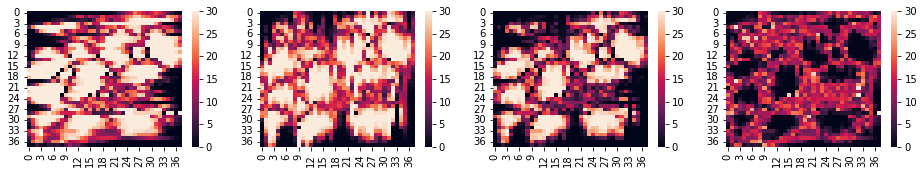

max fitness:  22.125914520613126 7.26243222008749
max fitness:  22.228479045668525 7.159867695032091
max fitness:  22.159324112012687 7.229022628687929
max fitness:  22.182638825721927 7.205707914978689
max fitness:  22.10441695691022 7.283929783790395
max fitness:  21.8058989697291 7.582447770971516
max fitness:  21.73492662388475 7.653420116815866
max fitness:  21.9429073812782 7.445439359422416
max fitness:  21.684806872236372 7.703539868464244
max fitness:  21.940732636416826 7.44761410428379
max fitness:  21.810728453936356 7.57761828676426
max fitness:  21.650243403789613 7.738103336911003
max fitness:  21.738656730051652 7.649690010648964
max fitness:  21.90938636426632 7.478960376434294
max fitness:  21.63633578098601 7.752010959714607
max fitness:  21.765459287084525 7.622887453616091
max fitness:  21.751422342923348 7.636924397777268
max fitness:  21.964020440161796 7.424326300538819
max fitness:  21.86752551224033 7.520821228460285
max fitness:  21.825430439429354 7.56291630

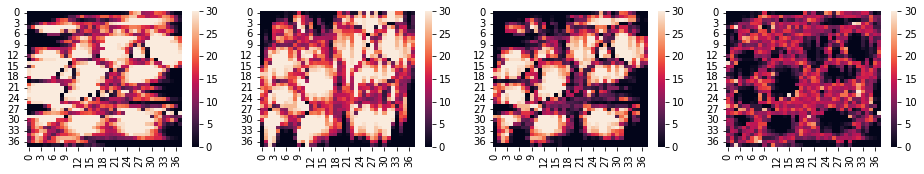

max fitness:  21.766951201157323 7.621395539543293
max fitness:  22.042656014215737 7.345690726484879
max fitness:  21.77284390309923 7.615502837601387
max fitness:  21.986371763903943 7.401974976796673
max fitness:  21.78629443048736 7.6020523102132564
max fitness:  21.623313345310272 7.765033395390343
max fitness:  22.004781802168367 7.383564938532249
max fitness:  21.676616871066102 7.711729869634514
max fitness:  21.98633390042196 7.402012840278655
max fitness:  21.699904677417727 7.6884420632828885
max fitness:  22.00387715251372 7.384469588186896
max fitness:  21.87458089009135 7.513765850609264
max fitness:  21.70339231633216 7.684954424368456
max fitness:  21.8448891092579 7.543457631442717
max fitness:  22.150100115323504 7.238246625377112
max fitness:  22.114942886321785 7.273403854378831
max fitness:  22.125820687229588 7.262526053471028
max fitness:  21.984314422526015 7.4040323181746
max fitness:  21.824500835212206 7.56384590548841
max fitness:  21.998673440751695 7.38967

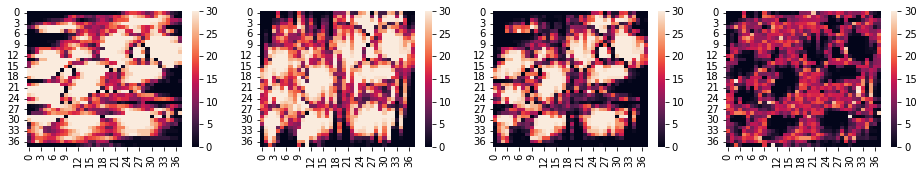

max fitness:  21.815569675943966 7.57277706475665
max fitness:  22.09326416908662 7.295082571613996
max fitness:  21.90538190391638 7.482964836784237
max fitness:  21.94239291682769 7.445953823872927
max fitness:  22.030890955286555 7.357455785414061
max fitness:  22.048117422982486 7.34022931771813
max fitness:  21.955123980109764 7.433222760590851
max fitness:  22.304967972193975 7.083378768506641
max fitness:  22.334640094681667 7.053706646018949
max fitness:  21.96688724053294 7.421459500167675
max fitness:  21.930181066610302 7.4581656740903135
max fitness:  22.11699327518302 7.2713534655175955
max fitness:  22.096841339924346 7.29150540077627
max fitness:  21.897217846463978 7.491128894236638
max fitness:  21.979060001350124 7.409286739350492
max fitness:  21.842081145715696 7.54626559498492
max fitness:  21.890830860935704 7.4975158797649115
max fitness:  22.019310652416 7.369036088284616
max fitness:  22.024800187698816 7.3635465530018
max fitness:  21.917713399983374 7.4706333

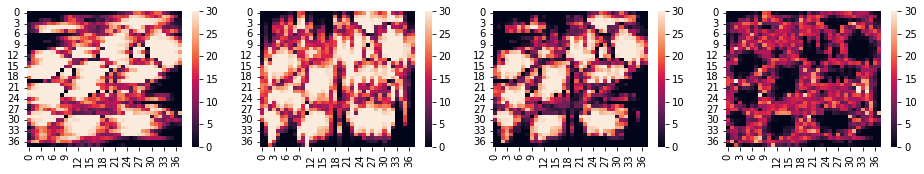

max fitness:  22.015193211822357 7.373153528878259
max fitness:  21.79845419262635 7.589892548074264
max fitness:  21.85020083981374 7.5381459008868745
max fitness:  21.921112133172336 7.46723460752828
max fitness:  21.745953357817783 7.642393382882833
max fitness:  21.735176982006166 7.65316975869445
max fitness:  21.960051944954927 7.428294795745689
max fitness:  21.776988014130133 7.611358726570483
max fitness:  21.855945860574437 7.532400880126179
max fitness:  21.718771531229724 7.669575209470892
max fitness:  21.84064076205567 7.547705978644945
max fitness:  21.64926459983014 7.739082140870476
max fitness:  21.76564452978738 7.622702210913236
max fitness:  21.896651140530786 7.49169560016983
max fitness:  21.88019459582834 7.508152144872277
max fitness:  21.847402192744994 7.540944547955622
max fitness:  21.868977382396153 7.519369358304463
max fitness:  21.656869184608993 7.7314775560916225
max fitness:  21.673660324824226 7.71468641587639
max fitness:  21.67876954181153 7.70957

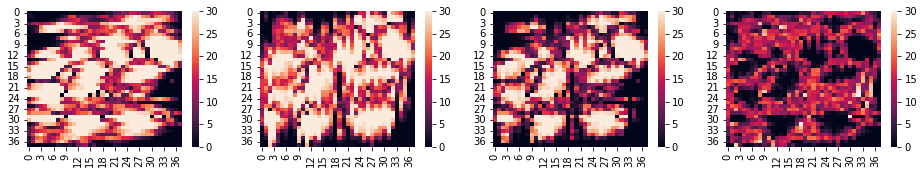

max fitness:  21.705975353979724 7.682371386720892
max fitness:  21.753612417096992 7.634734323603624
max fitness:  22.082084606406525 7.306262134294091
max fitness:  21.888558565241397 7.499788175459219
max fitness:  21.971637554074235 7.416709186626381
max fitness:  21.75853430285749 7.629812437843125
max fitness:  21.879018923762548 7.509327816938068
max fitness:  21.800803342058828 7.587543398641788
max fitness:  21.85017867818444 7.538168062516174
max fitness:  21.688146477032312 7.700200263668304
max fitness:  21.598023861798744 7.790322878901872
max fitness:  21.77661978333319 7.611726957367427
max fitness:  21.791567214649675 7.596779526050941
max fitness:  21.854319106526248 7.534027634174368
max fitness:  21.905476110376377 7.482870630324239
max fitness:  21.668399004581083 7.719947736119533
max fitness:  21.608674528812287 7.779672211888329
max fitness:  21.600215919275342 7.788130821425273
max fitness:  21.822823774849713 7.565522965850903
max fitness:  21.667195328147752 7

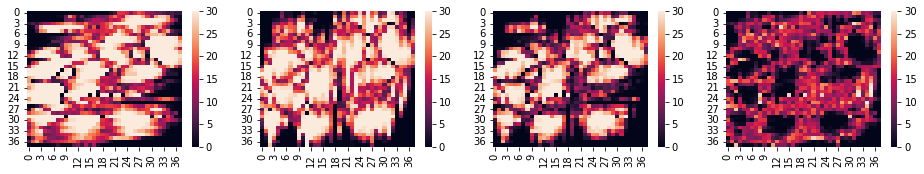

max fitness:  21.74744259431528 7.640904146385335
max fitness:  22.14887197588594 7.239474764814677
max fitness:  21.98645951414146 7.4018872265591575
max fitness:  21.949383589626326 7.43896315107429
max fitness:  21.92488349187228 7.463463248828337
max fitness:  21.935736428690088 7.452610312010528
max fitness:  22.21423460434775 7.174112136352864
max fitness:  22.031653477193395 7.356693263507221
max fitness:  22.041436904680435 7.346909836020181
max fitness:  22.033963357455423 7.354383383245192
max fitness:  22.44548436045388 6.942862380246737
max fitness:  22.088553441580622 7.299793299119994
max fitness:  21.962817320591483 7.425529420109132
max fitness:  21.86373456056193 7.524612180138686
max fitness:  21.97276420404869 7.415582536651925
max fitness:  22.04949397444537 7.338852766255247
max fitness:  21.856099369037107 7.532247371663509
max fitness:  22.099447919721307 7.288898820979309
max fitness:  22.021090442562212 7.367256298138404
max fitness:  22.124939082294556 7.26340

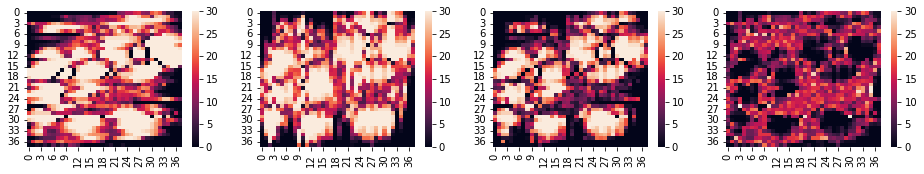

max fitness:  22.17727474121697 7.2110719994836465
max fitness:  21.82358803255621 7.5647587081444065
max fitness:  22.19346748567215 7.194879255028464
max fitness:  22.037626883265602 7.350719857435013
max fitness:  22.039858512318517 7.348488228382099
max fitness:  21.914701802587118 7.473644938113498
max fitness:  22.03036709598864 7.357979644711975
max fitness:  22.244591214753893 7.143755525946723
max fitness:  22.07819354720452 7.310153193496095
max fitness:  21.81306623686035 7.575280503840265
max fitness:  21.87167610358432 7.516670637116295
max fitness:  22.202614590099124 7.185732150601492
max fitness:  22.20864607419353 7.179700666507085
max fitness:  22.29586632200847 7.092480418692144
max fitness:  22.115652575488816 7.272694165211799
max fitness:  21.912288074805332 7.476058665895284
max fitness:  21.761222624770916 7.6271241159297
max fitness:  21.91824533145913 7.470101409241487
max fitness:  22.000840557859938 7.387506182840678
max fitness:  21.9271527936236 7.46119394

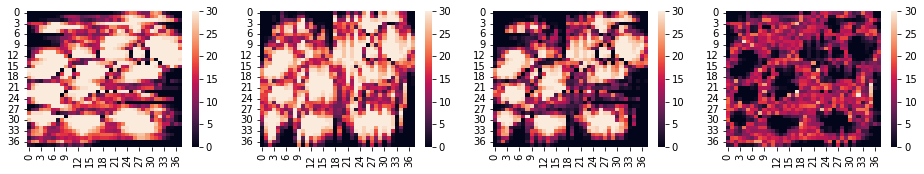

max fitness:  22.074202412458373 7.314144328242243
max fitness:  21.875726945157393 7.512619795543223
max fitness:  22.0314522171035 7.356894523597116
max fitness:  21.744429098620714 7.643917642079902
max fitness:  21.887899257776184 7.500447482924432
max fitness:  21.926631281908527 7.461715458792089
max fitness:  21.867662103826532 7.520684636874083
max fitness:  21.972413709920787 7.415933030779829
max fitness:  22.014491271918224 7.373855468782391
max fitness:  22.037056301636593 7.351290439064023
max fitness:  22.143508754768977 7.244837985931639
max fitness:  22.05631821577341 7.332028524927207
max fitness:  22.290097913366626 7.09824882733399
max fitness:  22.16320363037077 7.225143110329846
max fitness:  22.125619618774287 7.2627271219263285
max fitness:  22.067758095021073 7.320588645679543
max fitness:  22.21764297509219 7.170703765608426
max fitness:  22.227388067645723 7.160958673054893
max fitness:  22.152955009078937 7.235391731621679
max fitness:  22.083349097862083 7.3

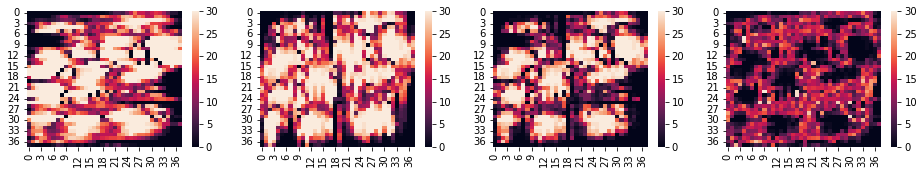

max fitness:  22.148431034535783 7.239915706164833
max fitness:  22.227057225562714 7.161289515137902
max fitness:  22.131227762712456 7.25711897798816
max fitness:  21.93921591640484 7.449130824295775
max fitness:  21.950493099806543 7.4378536408940725
max fitness:  21.79463495847794 7.593711782222677
max fitness:  21.984813272744184 7.403533467956432
max fitness:  21.911464165877064 7.476882574823552
max fitness:  22.18030462711159 7.208042113589027
max fitness:  21.80334565751103 7.585001083189585
max fitness:  21.944484656169585 7.44386208453103
max fitness:  21.927002026678643 7.461344714021973
max fitness:  22.12343704543536 7.264909695265256
max fitness:  22.033332074145015 7.355014666555601
max fitness:  21.89229869802628 7.496048042674335
max fitness:  21.800564911444887 7.587781829255729
max fitness:  22.059173942251995 7.329172798448621
max fitness:  22.123839586277654 7.264507154422962
max fitness:  21.817769661468528 7.570577079232088
max fitness:  22.083961158692958 7.304

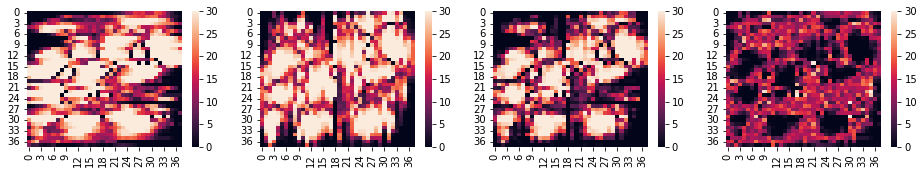

max fitness:  21.941686189600688 7.446660551099928
max fitness:  22.07925820510738 7.3090885355932365
max fitness:  22.08730015805537 7.301046582645245
max fitness:  21.889366975116914 7.498979765583702
max fitness:  21.961242785612306 7.42710395508831
max fitness:  22.097707855605904 7.290638885094712
max fitness:  21.964497152924892 7.423849587775724
max fitness:  22.109105648085766 7.27924109261485
max fitness:  22.042470809199408 7.345875931501208
max fitness:  22.23246522691188 7.155881513788735
max fitness:  22.05438008269936 7.3339666580012555
max fitness:  22.081857363444875 7.30648937725574
max fitness:  22.030117849524625 7.35822889117599
max fitness:  22.071925794033316 7.3164209466673
max fitness:  22.328896957355354 7.059449783345261
max fitness:  22.552774169332338 6.835572571368278
max fitness:  22.243480698816562 7.144866041884054
max fitness:  22.13815307982913 7.250193660871485
max fitness:  22.481946046737512 6.9064006939631035
max fitness:  22.2745169029683 7.113829

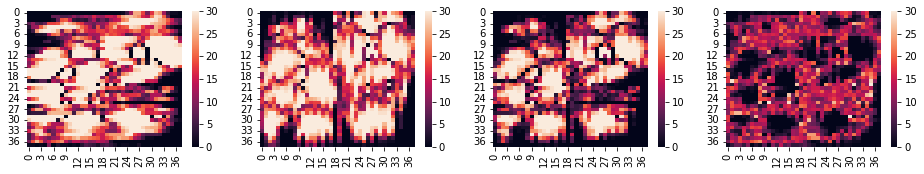

max fitness:  21.929017117788693 7.459329622911923
max fitness:  21.794042417521766 7.59430432317885
max fitness:  21.888621545058776 7.49972519564184
max fitness:  21.80924146965561 7.579105271045005
max fitness:  21.921043624323865 7.467303116376751
max fitness:  21.933766029113016 7.4545807115875995
max fitness:  21.995004266503898 7.393342474196718
max fitness:  21.866680682316282 7.5216660583843336
max fitness:  21.88093689868211 7.507409842018507
max fitness:  22.03882538535624 7.3495213553443755
max fitness:  21.899108030956658 7.489238709743958
max fitness:  21.969690627003487 7.4186561136971285
max fitness:  21.841591102893492 7.546755637807124
max fitness:  21.866131395884196 7.52221534481642
max fitness:  21.916900602070953 7.471446138629663
max fitness:  21.84584915680699 7.542497583893624
max fitness:  22.08232671289948 7.306020027801136
max fitness:  22.064338421284113 7.324008319416503
max fitness:  22.21445931107865 7.173887429621967
max fitness:  22.04638005873063 7.34

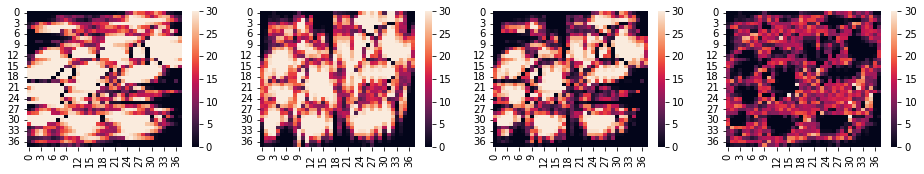

max fitness:  22.15875698547452 7.2295897552260975
max fitness:  22.131214846376626 7.25713189432399
max fitness:  22.33076859767882 7.0575781430217965
max fitness:  21.98600139330881 7.402345347391805
max fitness:  22.125382936352178 7.262963804348438
max fitness:  22.16115354191951 7.227193198781105
max fitness:  22.134140780726717 7.254205959973898
max fitness:  22.164607845056583 7.223738895644033
max fitness:  22.090440602032338 7.297906138668278
max fitness:  22.0228661427861 7.365480597914516
max fitness:  21.964706979131996 7.423639761568619
max fitness:  22.169167029631755 7.219179711068861
max fitness:  22.33127329763457 7.057073443066045
max fitness:  22.26027063027834 7.128076110422274
max fitness:  22.301023253838242 7.087323486862374
max fitness:  21.936518096815917 7.451828643884699
max fitness:  22.267070926623603 7.121275814077013
max fitness:  21.909328099485577 7.479018641215038
max fitness:  21.84531721529141 7.543029525409207
max fitness:  21.873895979445436 7.5144

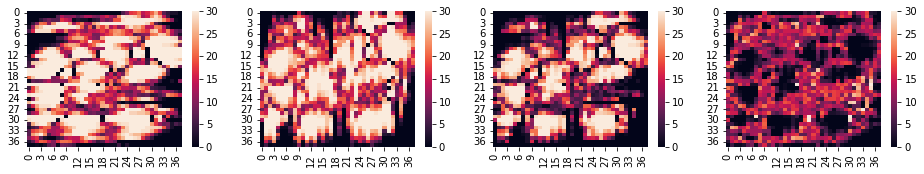

max fitness:  21.993734163399413 7.394612577301203
max fitness:  22.26304899268474 7.125297748015875
max fitness:  21.986520586592007 7.401826154108608
max fitness:  21.929922628453095 7.4584241122475206
max fitness:  21.99780205323266 7.390544687467955
max fitness:  21.983790354873634 7.404556385826982
max fitness:  21.709792308593016 7.6785544321076
max fitness:  21.827200684162406 7.56114605653821
max fitness:  21.91374166405083 7.474605076649787
max fitness:  22.044753556085734 7.343593184614882
max fitness:  21.744933106123604 7.643413634577012
max fitness:  21.85384636441812 7.5345003762824945
max fitness:  21.768093377752415 7.620253362948201
max fitness:  21.877422955104137 7.5109237855964786
max fitness:  22.021096164139834 7.367250576560782
max fitness:  21.93158868116449 7.456758059536124
max fitness:  21.67190406826997 7.716442672430645
max fitness:  21.825788163457872 7.5625585772427435
max fitness:  21.724774669661922 7.663572071038693
max fitness:  21.795863791331694 7.5

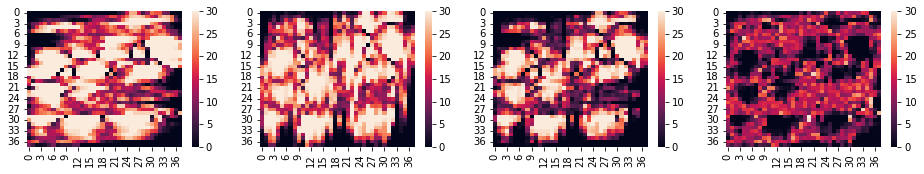

max fitness:  21.74908356678538 7.639263173915236
max fitness:  21.86454548367962 7.523801257020995
max fitness:  21.657959170183982 7.730387570516633
max fitness:  21.67692018602235 7.711426554678265
max fitness:  21.646054422112634 7.742292318587982
max fitness:  21.85349109199522 7.5348556487053955
max fitness:  21.929810954145857 7.458535786554759
max fitness:  21.89820607222508 7.4901406684755365
max fitness:  21.892249040239935 7.49609770046068
max fitness:  21.983420928940603 7.4049258117600125
max fitness:  21.721581346209497 7.666765394491119
max fitness:  21.807818329814964 7.580528410885652
max fitness:  21.927231823367066 7.46111491733355
max fitness:  21.926810110226157 7.461536630474459
max fitness:  21.978017669171855 7.410329071528761
max fitness:  21.875634507096496 7.51271223360412
max fitness:  21.958168623592115 7.4301781171085
max fitness:  22.00957985349423 7.378766887206385
max fitness:  22.214822305396027 7.173524435304589
max fitness:  22.458907745078356 6.9294

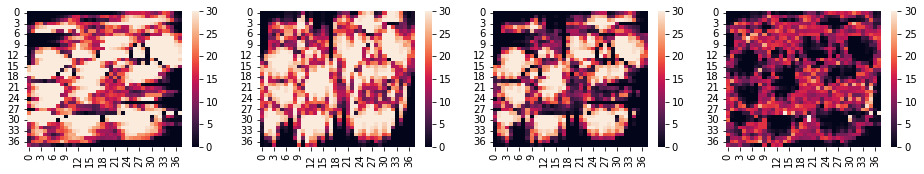

max fitness:  22.13960179143094 7.248744949269675
max fitness:  21.934367747542694 7.4539789931579215
max fitness:  21.895198627412178 7.493148113288438
max fitness:  22.228743796929784 7.159602943770832
max fitness:  21.779093663834168 7.609253076866448
max fitness:  21.91283953911043 7.475507201590187
max fitness:  21.96683521040964 7.421511530290974
max fitness:  22.141158506827693 7.247188233872922
max fitness:  22.01246140459219 7.375885336108425
max fitness:  22.317315753992666 7.0710309867079495
max fitness:  22.00514073711806 7.383206003582554
max fitness:  22.17742867208442 7.210918068616195
max fitness:  21.97336183012795 7.414984910572667
max fitness:  22.098432089641282 7.289914651059334
max fitness:  22.048189804921503 7.340156935779113
max fitness:  22.044140067894233 7.344206672806383
max fitness:  22.04287898682799 7.345467753872626
max fitness:  22.081667718091524 7.306679022609092
max fitness:  22.1091954442144 7.279151296486216
max fitness:  22.18247665349147 7.20587

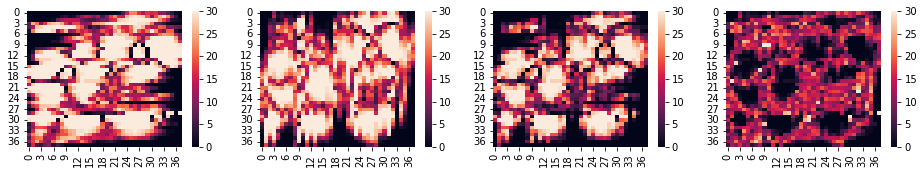

max fitness:  21.87035551462629 7.517991226074326
max fitness:  22.104699985186365 7.283646755514251
max fitness:  22.00466031656359 7.383686424137025
max fitness:  22.26174739614875 7.126599344551867
max fitness:  22.084767480582226 7.30357926011839
max fitness:  22.34620516368581 7.042141577014807
max fitness:  21.99508458206155 7.3932621586390646
max fitness:  22.131882496154667 7.256464244545949
max fitness:  22.046260708622842 7.342086032077773
max fitness:  22.00991410576804 7.378432634932576
max fitness:  22.31415065518758 7.074196085513037
max fitness:  22.242339381449852 7.146007359250763
max fitness:  22.056056324010527 7.332290416690089
max fitness:  22.23171524197741 7.156631498723208
max fitness:  22.319099985129863 7.069246755570752
max fitness:  21.911793842761945 7.476552897938671
max fitness:  22.28905453212473 7.099292208575886
max fitness:  22.00847265005029 7.3798740906503255
max fitness:  22.02002915817798 7.368317582522636
max fitness:  21.944618273198834 7.443728

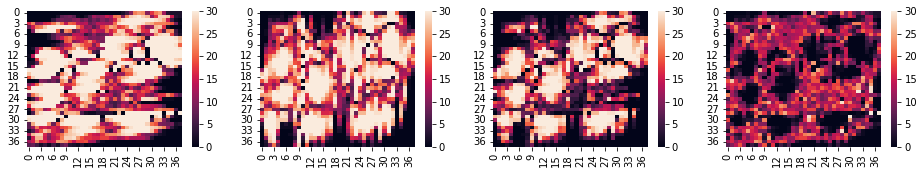

max fitness:  22.025946444669614 7.3624002960310015
max fitness:  22.450643569655888 6.937703171044728
max fitness:  21.986671821521412 7.401674919179204
max fitness:  22.04435001844323 7.343996722257387
max fitness:  22.195315109488277 7.193031631212339
max fitness:  21.886725979752455 7.50162076094816
max fitness:  22.011580948830225 7.37676579187039
max fitness:  22.018796049192552 7.3695506915080635
max fitness:  22.031061318580214 7.357285422120402
max fitness:  22.032785476988945 7.355561263711671
max fitness:  21.95311287761966 7.435233863080956
max fitness:  21.949686345281435 7.438660395419181
max fitness:  22.011847292617915 7.376499448082701
max fitness:  21.803909028406128 7.584437712294488
max fitness:  21.75729504698089 7.631051693719726
max fitness:  21.928956770559722 7.459389970140894
max fitness:  21.976310241326082 7.412036499374533
max fitness:  21.759960964632057 7.6283857760685585
max fitness:  21.860960441548805 7.527386299151811
max fitness:  21.770021004857576 

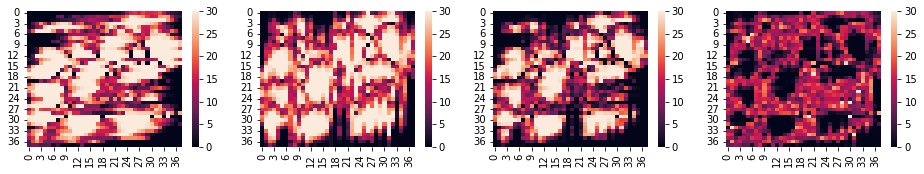

max fitness:  21.98759906915331 7.4007476715473075
max fitness:  21.751885364577262 7.6364613761233535
max fitness:  21.86827636635877 7.520070374341845
max fitness:  21.98703421937593 7.401312521324687
max fitness:  21.93907000941146 7.449276731289157
max fitness:  21.891041921870674 7.497304818829942
max fitness:  22.038094210926577 7.350252529774039
max fitness:  21.847438547396006 7.54090819330461
max fitness:  21.81014215018459 7.578204590516027
max fitness:  21.99760651266717 7.390740228033447
max fitness:  21.70400784097425 7.684338899726367
max fitness:  21.894835537391362 7.493511203309254
max fitness:  21.758016665554663 7.630330075145952
max fitness:  21.83369237934341 7.554654361357205
max fitness:  21.67386060084754 7.714486139853076
max fitness:  21.909356460073532 7.478990280627084
max fitness:  21.85739152271259 7.530955217988026
max fitness:  22.04683073916928 7.341516001531335
max fitness:  21.9870258981213 7.401320842579317
max fitness:  22.123544059729145 7.26480268

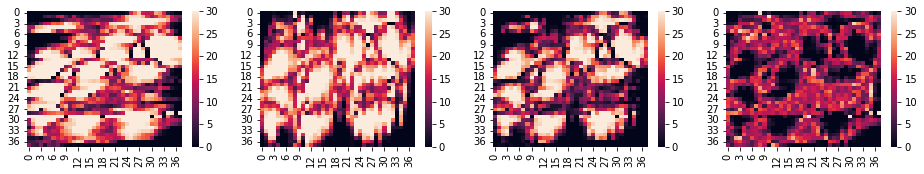

max fitness:  21.92518165780296 7.463165082897657
max fitness:  21.943435323699486 7.44491141700113
max fitness:  21.74931829877235 7.639028441928264
max fitness:  21.85860354939528 7.529743191305336
max fitness:  21.820220648258655 7.568126092441961
max fitness:  21.91782307190053 7.470523668800087
max fitness:  21.85849871290731 7.529848027793307
max fitness:  22.067397627900547 7.3209491128000685
max fitness:  21.93849672960136 7.4498500110992545
max fitness:  21.762887015087887 7.625459725612728
max fitness:  22.01027228857278 7.378074452127837
max fitness:  21.70353120727932 7.684815533421297
max fitness:  21.750408722415724 7.637938018284892
max fitness:  21.957357327890826 7.43098941280979
max fitness:  21.814615758426594 7.5737309822740215
max fitness:  21.755902341635867 7.632444399064749
max fitness:  21.961297351226307 7.427049389474309
max fitness:  21.946060360845983 7.442286379854632
max fitness:  21.900666732891228 7.487680007809388
max fitness:  21.99788274671883 7.3904

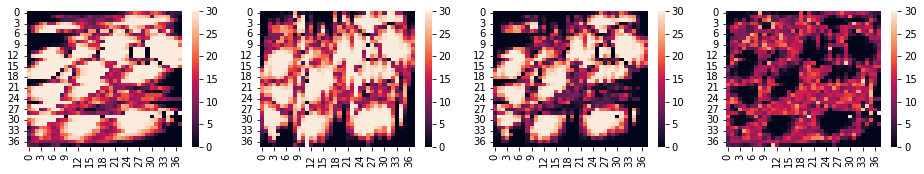

max fitness:  22.10711178863334 7.281234952067276
max fitness:  22.322885074285807 7.065461666414809
max fitness:  22.2516070481717 7.136739692528916
max fitness:  21.940753590969102 7.447593149731514
max fitness:  22.082175439881222 7.306171300819393
max fitness:  22.030070752112195 7.358275988588421
max fitness:  22.060107314150308 7.328239426550308
max fitness:  22.155888738771107 7.232458001929508
max fitness:  22.222844249660355 7.165502491040261
max fitness:  21.942632252590286 7.44571448811033
max fitness:  21.853133993937583 7.535212746763033
max fitness:  21.854569260450575 7.533777480250041
max fitness:  21.878771558619714 7.509575182080901
max fitness:  21.897985661619373 7.490361079081243
max fitness:  21.83895862153545 7.549388119165165
max fitness:  21.95268818799704 7.4356585527035755
max fitness:  21.960103119370057 7.428243621330559
max fitness:  21.955988106138598 7.432358634562018
max fitness:  21.87820839012273 7.510138350577886
max fitness:  22.270260335052505 7.11

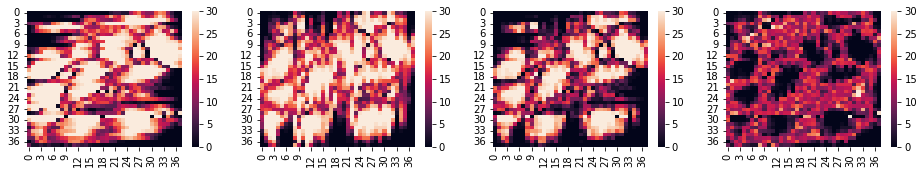

max fitness:  21.557474548753778 7.830872191946838
max fitness:  21.577492331337638 7.810854409362978
max fitness:  21.880815806576866 7.50753093412375
max fitness:  21.631919911296976 7.75642682940364
max fitness:  21.89311835849378 7.495228382206836
max fitness:  21.95165056826296 7.436696172437657
max fitness:  21.79357400046695 7.594772740233665
max fitness:  21.903920533665083 7.484426207035533
max fitness:  21.860582805711896 7.5277639349887195
max fitness:  21.653758884451147 7.734587856249469
max fitness:  21.759876702664254 7.628470038036362
max fitness:  21.83120844590469 7.5571382947959265
max fitness:  21.759363436257523 7.628983304443093
max fitness:  21.663381349092766 7.724965391607849
max fitness:  21.987197568254246 7.40114917244637
max fitness:  21.62865679851357 7.759689942187045
max fitness:  21.856036604930868 7.532310135769748
max fitness:  21.82810458099668 7.560242159703936
max fitness:  21.660599796013134 7.727746944687482
max fitness:  21.804203959092803 7.584

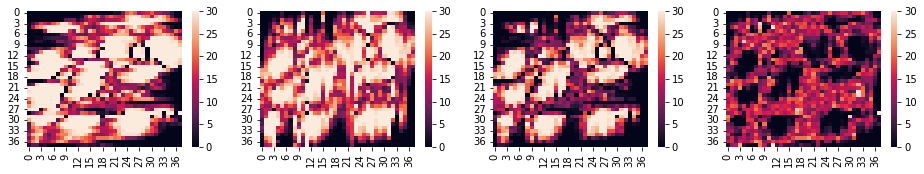

max fitness:  21.655159751365755 7.733186989334861
max fitness:  21.8842470615242 7.5040996791764165
max fitness:  21.838431089197993 7.549915651502623
max fitness:  21.745988038467182 7.642358702233434
max fitness:  21.969956587814487 7.418390152886129
max fitness:  22.17688798230991 7.211458758390705
max fitness:  21.800501389791812 7.587845350908804
max fitness:  21.995395558911525 7.3929511817890905
max fitness:  21.805208804599857 7.5831379361007585
max fitness:  21.652104446221394 7.736242294479222
max fitness:  21.834882125547814 7.5534646151528015
max fitness:  21.84549086491963 7.542855875780987
max fitness:  21.70142030239159 7.686926438309026
max fitness:  21.741713887443638 7.646632853256978
max fitness:  21.8919620952122 7.4963846454884155
max fitness:  21.795041998341294 7.593304742359322
max fitness:  21.875316373039016 7.5130303676615995
max fitness:  21.933078013563133 7.455268727137483
max fitness:  21.852199096774456 7.53614764392616
max fitness:  21.799417425773868 

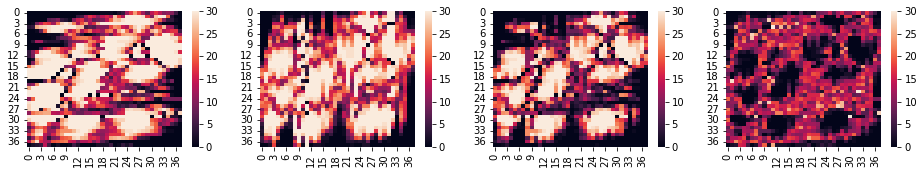

max fitness:  22.113217374623584 7.2751293660770315
max fitness:  21.81017103174996 7.578175708950656
max fitness:  22.266293287021664 7.1220534536789515
max fitness:  21.96438314771706 7.423963592983554
max fitness:  22.17708317567213 7.211263565028485
max fitness:  22.143304532532245 7.245042208168371
max fitness:  22.264121902474827 7.124224838225789
max fitness:  22.109956074202444 7.278390666498172
max fitness:  22.033069677428763 7.355277063271853
max fitness:  22.023039064740615 7.3653076759600005
max fitness:  22.045818987942834 7.342527752757782
max fitness:  22.027418831141738 7.360927909558878
max fitness:  22.22506580842184 7.163280932278777
max fitness:  21.83543732953646 7.552909411164155
max fitness:  21.893091928946966 7.49525481175365
max fitness:  22.194993747052585 7.1933529936480305
max fitness:  22.170715725026845 7.217631015673771
max fitness:  21.937612532723737 7.450734207976879
max fitness:  22.04915086196285 7.339195878737765
max fitness:  21.900188435969664 7

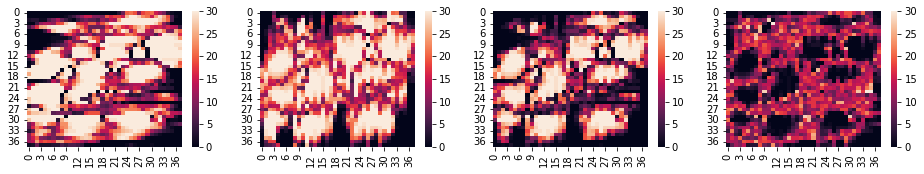

max fitness:  21.998893055347157 7.389453685353459
max fitness:  21.791900247307574 7.596446493393042
max fitness:  21.64709454907321 7.741252191627407
max fitness:  21.711301154225918 7.677045586474698
max fitness:  21.79502091485412 7.593325825846495
max fitness:  21.919024661672452 7.469322079028164
max fitness:  21.952292543514005 7.4360541971866105
max fitness:  21.883369824174544 7.504976916526072
max fitness:  21.82625726503458 7.562089475666035
max fitness:  21.985876980559112 7.4024697601415035
max fitness:  21.889309464036756 7.499037276663859
max fitness:  21.64333062977606 7.745016110924556
max fitness:  21.775943611819145 7.612403128881471
max fitness:  21.77565118866359 7.6126955520370245
max fitness:  21.706885020535406 7.68146172016521
max fitness:  21.975056508026505 7.413290232674111
max fitness:  21.728067756283153 7.660278984417463
max fitness:  22.083108794622596 7.3052379460780195
max fitness:  21.955205571353893 7.433141169346722
max fitness:  21.827996790867815 

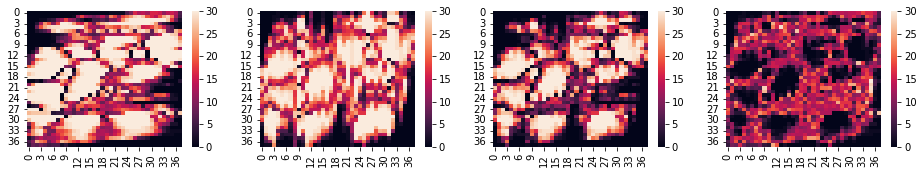

max fitness:  21.966145019892213 7.422201720808403
max fitness:  21.79423592234095 7.594110818359667
max fitness:  21.81636887453392 7.571977866166694
max fitness:  21.865698073573032 7.522648667127584
max fitness:  21.714467370013047 7.673879370687569
max fitness:  21.86345392028545 7.524892820415165
max fitness:  21.782907092469905 7.6054396482307105
max fitness:  21.648006527222773 7.740340213477843
max fitness:  21.784113161577796 7.60423357912282
max fitness:  22.016160282200232 7.372186458500384
max fitness:  21.9784834375451 7.409863303155515
max fitness:  21.867605953926297 7.520740786774319
max fitness:  22.045094358594394 7.343252382106222
max fitness:  21.959875133554455 7.428471607146161
max fitness:  22.06261796906374 7.325728771636875
max fitness:  22.06086730879421 7.327479431906404
max fitness:  21.82221646445309 7.566130276247527
max fitness:  22.013903704934947 7.374443035765669
max fitness:  21.929123068580594 7.459223672120022
max fitness:  21.709291816967674 7.6790

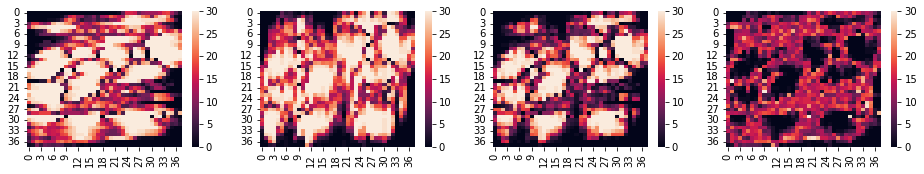

max fitness:  21.890664986168122 7.497681754532493
max fitness:  22.223611944030935 7.164734796669681
max fitness:  22.006675793320383 7.381670947380233
max fitness:  22.437804770265664 6.950541970434951
max fitness:  22.160106328783364 7.228240411917252
max fitness:  21.926508186960497 7.461838553740119
max fitness:  22.13043575750357 7.257910983197046
max fitness:  22.034279284932182 7.354067455768433
max fitness:  21.914108177092857 7.474238563607759
max fitness:  21.955574783244497 7.432771957456119
max fitness:  22.015553624589167 7.372793116111449
max fitness:  21.805401199266285 7.582945541434331
max fitness:  21.984307751772153 7.404038988928463
max fitness:  22.076057660519687 7.312289080180928
max fitness:  22.27049238934478 7.1178543513558346
max fitness:  22.181897395173877 7.206449345526739
max fitness:  21.969272464749285 7.419074275951331
max fitness:  21.727127771771364 7.661218968929251
max fitness:  22.0586375079771 7.329709232723516
max fitness:  21.743334444564695 7

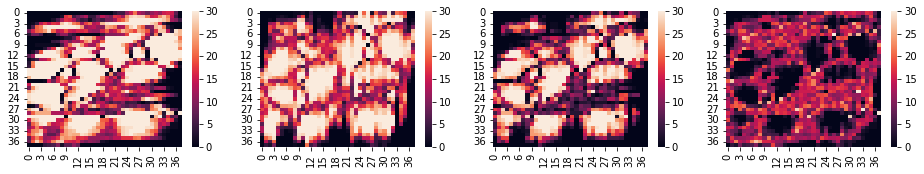

max fitness:  22.2337562268835 7.154590513817116
max fitness:  21.881824608070197 7.506522132630419
max fitness:  22.060867029534514 7.327479711166102
max fitness:  22.1829364415023 7.205410299198316
max fitness:  22.127831006539008 7.260515734161608
max fitness:  21.886773395911646 7.501573344788969
max fitness:  22.038864354946504 7.349482385754111
max fitness:  21.96287238156932 7.425474359131297
max fitness:  21.946007730078257 7.442339010622359
max fitness:  22.014949988252347 7.373396752448269
max fitness:  21.9524478730984 7.435898867602216
max fitness:  21.900877115379693 7.487469625320923
max fitness:  22.028153288704384 7.360193451996231
max fitness:  21.95132480678327 7.437021933917347
max fitness:  21.977955540007667 7.410391200692949
max fitness:  21.864750958371914 7.523595782328702
max fitness:  21.801535130988388 7.586811609712228
max fitness:  21.89405617629354 7.494290564407077
max fitness:  21.82134626300899 7.567000477691625
max fitness:  21.955739322480774 7.432607

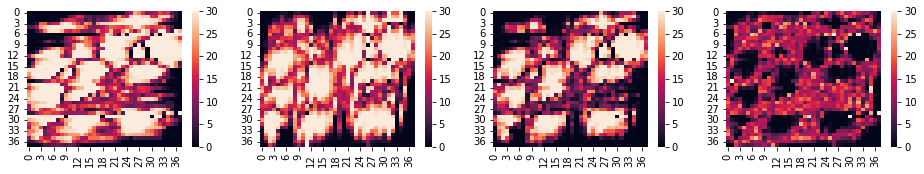

max fitness:  22.02292630505157 7.365420435649046
max fitness:  22.057768001394415 7.330578739306201
max fitness:  22.50316395365661 6.885182787044005
max fitness:  21.89632129804786 7.492025442652757
max fitness:  22.003869554445394 7.384477186255221
max fitness:  21.96196435566675 7.426382385033865
max fitness:  22.075883210693437 7.312463530007179
max fitness:  21.973081120613873 7.415265620086743
max fitness:  22.068463075674526 7.31988366502609
max fitness:  21.914706588371892 7.4736401523287235
max fitness:  21.91834824150566 7.469998499194954
max fitness:  22.20501886037894 7.183327880321677
max fitness:  21.7631037172063 7.625243023494317
max fitness:  22.214874195870564 7.173472544830052
max fitness:  21.975763559209394 7.412583181491222
max fitness:  22.09119438976149 7.297152350939125
max fitness:  21.92413674974906 7.464209990951556
max fitness:  21.96028078747582 7.428065953224795
max fitness:  21.79379959008078 7.594547150619835
max fitness:  22.15847446376708 7.229872276

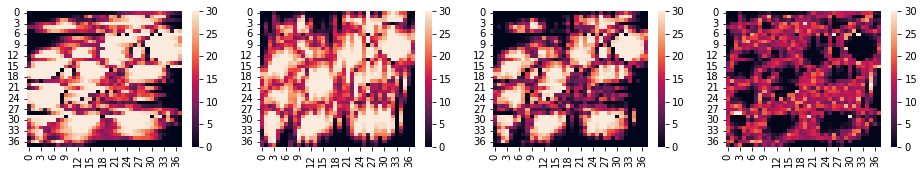

max fitness:  21.572757979649868 7.815588761050748
max fitness:  21.620774307477546 7.767572433223069
max fitness:  21.794192302902907 7.594154437797709
max fitness:  21.84443785222239 7.543908888478224
max fitness:  21.689160710901156 7.69918602979946
max fitness:  21.913331678850827 7.475015061849788
max fitness:  21.603110553819278 7.785236186881338
max fitness:  21.754529263257524 7.633817477443092
max fitness:  22.02704449919417 7.361302241506447
max fitness:  21.74333052928279 7.6450162114178255
max fitness:  21.747631064050083 7.640715676650533
max fitness:  22.032945457898272 7.355401282802344
max fitness:  21.91638508279467 7.471961657905947
max fitness:  22.00603363414387 7.382313106556747
max fitness:  21.79321810662004 7.595128634080577
max fitness:  21.74929971492785 7.639047025772765
max fitness:  21.8021195850589 7.586227155641716
max fitness:  21.6188073014147 7.769539439285914
max fitness:  21.68092326647293 7.707423474227685
max fitness:  21.73907414032226 7.649272600

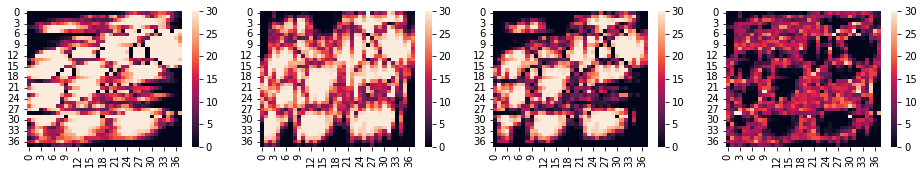

max fitness:  22.19399560523263 7.194351135467986
max fitness:  22.038239239025668 7.350107501674948
max fitness:  22.1184657655051 7.269880975195516
max fitness:  22.03258811093653 7.355758629764086
max fitness:  22.169019262756144 7.219327477944471
max fitness:  21.9637840810406 7.424562659660015
max fitness:  22.033104931273172 7.355241809427444
max fitness:  22.19912801730179 7.189218723398827
max fitness:  22.32196458202302 7.066382158677595
max fitness:  22.002570247591056 7.38577649310956
max fitness:  22.23866927535955 7.1496774653410675
max fitness:  22.47926628627362 6.909080454426995
max fitness:  21.971589807161877 7.416756933538739
max fitness:  22.1888631600792 7.199483580621415
max fitness:  21.934531669717998 7.453815070982618
max fitness:  22.10655698433048 7.281789756370134
max fitness:  22.203792481120146 7.1845542595804694
max fitness:  22.11312638856896 7.2752203521316545
max fitness:  22.066359358009173 7.321987382691443
max fitness:  22.414081793759614 6.97426494

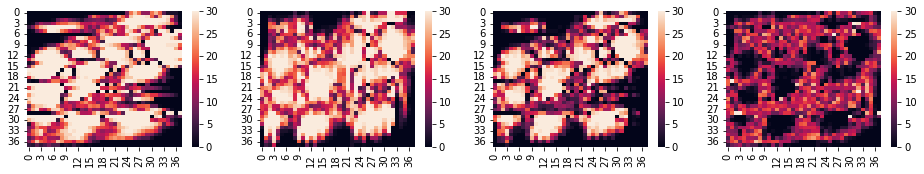

max fitness:  22.39176882891814 6.996577911782477
max fitness:  21.955294314931592 7.433052425769024
max fitness:  21.842660058695685 7.545686682004931
max fitness:  21.908468878062266 7.47987786263835
max fitness:  22.024009173923336 7.36433756677728
max fitness:  21.881726006646197 7.506620734054419
max fitness:  21.88308021572382 7.505266524976797
max fitness:  22.074993388880188 7.313353351820428
max fitness:  22.24085008173989 7.147496658960726
max fitness:  22.014818709902613 7.373528030798003
max fitness:  22.022762108189596 7.36558463251102
max fitness:  21.79576496788632 7.592581772814295
max fitness:  22.23862360972524 7.149723130975374
max fitness:  21.968945365209294 7.419401375491322
max fitness:  21.993943905606088 7.394402835094528
max fitness:  22.064296022959034 7.3240507177415815
max fitness:  22.268990470957263 7.119356269743353
max fitness:  22.132147412418167 7.256199328282449
max fitness:  22.101467542097282 7.286879198603334
max fitness:  22.18583329287376 7.2025

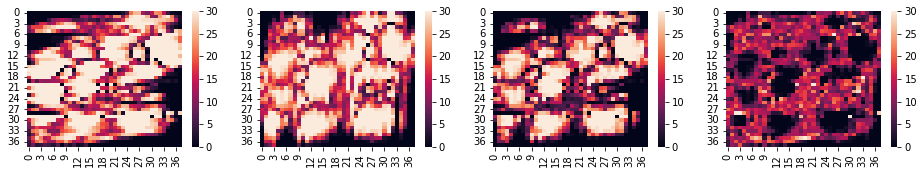

max fitness:  22.332640023755218 7.055706716945398
max fitness:  21.980516758309538 7.407829982391078
max fitness:  21.96844895352782 7.419897787172797
max fitness:  21.879121932818805 7.509224807881811
max fitness:  21.907779102283822 7.480567638416794
max fitness:  22.161086999143684 7.2272597415569315
max fitness:  22.276067168385374 7.112279572315241
max fitness:  21.953816143920225 7.434530596780391
max fitness:  21.81194940981596 7.576397330884657
max fitness:  21.81711410607584 7.571232634624774
max fitness:  22.394929883162213 6.993416857538403
max fitness:  21.78670259935264 7.601644141347975
max fitness:  21.75978897916761 7.628557761533006
max fitness:  21.94542082642483 7.442925914275786
max fitness:  21.873019879664078 7.515326861036538
max fitness:  21.900825763887937 7.487520976812679
max fitness:  22.1434390783919 7.244907662308716
max fitness:  22.00937155824728 7.378975182453335
max fitness:  22.23796759001476 7.150379150685854
max fitness:  21.91706086639011 7.471285

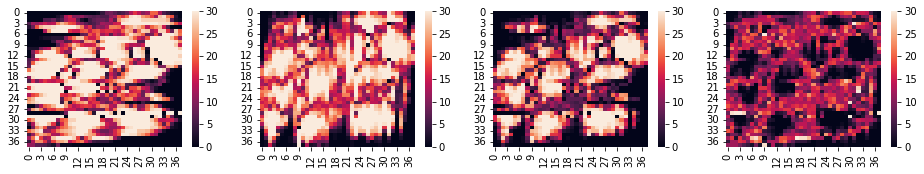

max fitness:  21.61032609324946 7.778020647451157
max fitness:  21.65044735092704 7.7378993897735775
max fitness:  21.6986170296078 7.6897297110928164
max fitness:  21.743108991608736 7.64523774909188
max fitness:  21.784953227082386 7.603393513618229
max fitness:  21.70196993132986 7.686376809370756
max fitness:  21.72552908919624 7.662817651504376
max fitness:  21.83838798154891 7.549958759151707
max fitness:  21.797735782587694 7.590610958112922
max fitness:  21.735925140588552 7.6524216001120635
max fitness:  21.519890969476613 7.868455771224003
max fitness:  21.71642846298217 7.671918277718447
max fitness:  21.736070582849116 7.6522761578514995
max fitness:  21.79897834846261 7.589368392238004
max fitness:  21.88072003076352 7.507626709937096
max fitness:  21.78042654111543 7.6079201995851875
max fitness:  22.002122756294458 7.386223984406158
max fitness:  21.669781444507514 7.718565296193102
max fitness:  21.640467021447293 7.747879719253323
max fitness:  21.584567546512403 7.803

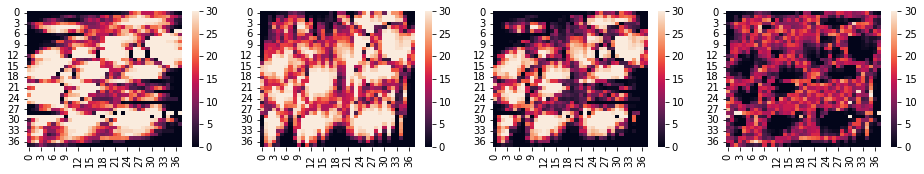

max fitness:  21.618369743713 7.769976996987616
max fitness:  21.63299575873579 7.755350981964824
max fitness:  21.688138198647536 7.70020854205308
max fitness:  21.663562827561286 7.72478391313933
max fitness:  21.654344081018152 7.734002659682464
max fitness:  21.988265561355696 7.4000811793449195
max fitness:  21.7043040326076 7.684042708093017
max fitness:  21.75732642122803 7.6310203194725865
max fitness:  21.671453747180202 7.716892993520414
max fitness:  21.894765261563265 7.493581479137351
max fitness:  21.654629374682177 7.733717366018439
max fitness:  21.75788827854849 7.630458462152127
max fitness:  21.97792137457873 7.410425366121885
max fitness:  21.79321177215001 7.595134968550607
max fitness:  21.777084780783728 7.611261959916888
max fitness:  21.739360236363822 7.6489865043367935
max fitness:  21.73687154611072 7.651475194589896
max fitness:  21.728996661408026 7.65935007929259
max fitness:  21.80708907015648 7.581257670544137
max fitness:  22.125987445913516 7.26235929

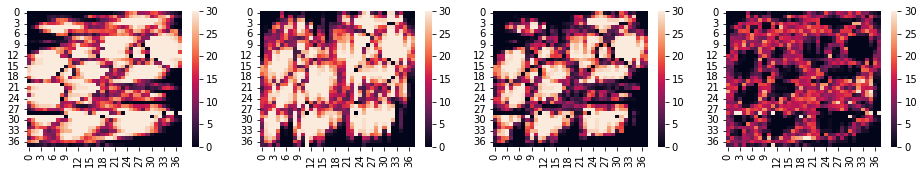

max fitness:  22.247442877251952 7.1409038634486635
max fitness:  22.201210136664443 7.187136604036173
max fitness:  22.15807996269328 7.230266778007337
max fitness:  22.260326614869584 7.128020125831032
max fitness:  22.226708026325927 7.161638714374689
max fitness:  21.943804503369606 7.44454223733101
max fitness:  21.895221308428717 7.493125432271899
max fitness:  22.067483140104418 7.320863600596198
max fitness:  22.465228792221282 6.923117948479334
max fitness:  21.916971298209646 7.47137544249097
max fitness:  21.96291223561458 7.425434505086034
max fitness:  22.429146199616397 6.959200541084218
max fitness:  22.229219386044193 7.159127354656423
max fitness:  22.153113141638254 7.2352335990623615
max fitness:  21.977690208590538 7.410656532110078
max fitness:  22.183375098477555 7.204971642223061
max fitness:  22.04697317006226 7.341373570638357
max fitness:  22.20303085491405 7.185315885786565
max fitness:  22.105248376649676 7.2830983640509395
max fitness:  21.89708711392999 7.

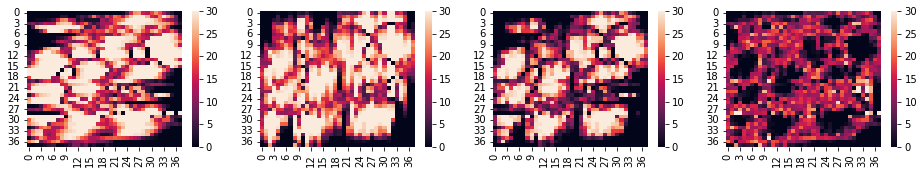

max fitness:  22.016350899121107 7.371995841579508
max fitness:  21.923042862728945 7.465303877971671
max fitness:  21.74711689677591 7.641229843924705
max fitness:  21.78950375854288 7.598842982157734
max fitness:  21.69475970712322 7.693587033577394
max fitness:  21.79129201767329 7.597054723027327
max fitness:  21.842298115869728 7.546048624830888
max fitness:  21.896071216786332 7.492275523914284
max fitness:  22.06423547404121 7.324111266659404
max fitness:  21.935779018383172 7.452567722317443
max fitness:  21.739568276796824 7.648778463903792
max fitness:  21.8558812444762 7.532465496224415
max fitness:  21.643187506891174 7.745159233809442
max fitness:  21.72802331868467 7.660323422015946
max fitness:  21.47070304947197 7.917643691228644
max fitness:  21.853132924257466 7.53521381644315
max fitness:  21.716070784512898 7.672275956187718
max fitness:  21.40965156587223 7.978695174828385
max fitness:  21.848720329376526 7.53962641132409
max fitness:  21.605679775158656 7.78266696

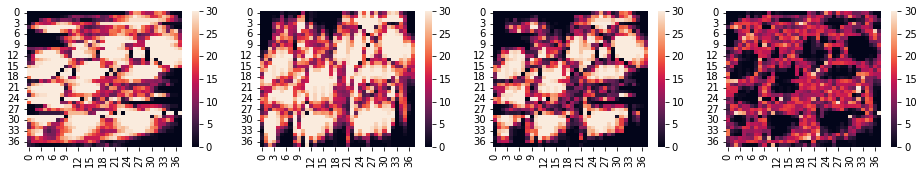

max fitness:  21.946116490988906 7.442230249711709
max fitness:  22.00729498619775 7.381051754502867
max fitness:  22.05467084547007 7.333675895230545
max fitness:  21.777034523141776 7.61131221755884
max fitness:  21.927479043981666 7.46086769671895
max fitness:  21.85979188544897 7.528554855251645
max fitness:  22.069467201731136 7.31887953896948
max fitness:  21.760421229178537 7.627925511522079
max fitness:  21.88720743434972 7.501139306350897
max fitness:  22.041504777983455 7.346841962717161
max fitness:  22.03543572238383 7.352911018316785
max fitness:  21.987517680887606 7.4008290598130095
max fitness:  21.783724372253843 7.604622368446773
max fitness:  22.069939950195383 7.318406790505232
max fitness:  22.05310531548647 7.3352414252141465
max fitness:  21.8628648072665 7.525481933434115
max fitness:  22.122597686714414 7.265749053986202
max fitness:  22.136693476392235 7.251653264308381
max fitness:  22.07180511027837 7.316541630422247
max fitness:  22.288373246723804 7.099973

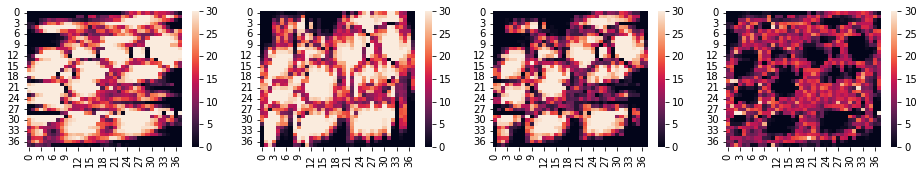

max fitness:  21.864301991205707 7.524044749494909
max fitness:  21.820849229112774 7.567497511587842
max fitness:  21.974681527460334 7.413665213240282
max fitness:  21.91412142415863 7.474225316541986
max fitness:  21.826068622153503 7.562278118547113
max fitness:  21.979652704952752 7.408694035747864
max fitness:  22.05876340486154 7.329583335839075
max fitness:  22.17672670930996 7.211620031390655
max fitness:  21.959675853572747 7.428670887127868
max fitness:  22.036146553570063 7.352200187130553
max fitness:  21.92327041125216 7.465076329448454
max fitness:  22.006529355778326 7.3818173849222894
max fitness:  21.740427765624688 7.647918975075928
max fitness:  21.819151171655655 7.569195569044961
max fitness:  21.783804625943198 7.604542114757418
max fitness:  21.729740855590645 7.658605885109971
max fitness:  22.176590313921714 7.211756426778901
max fitness:  21.951935115715163 7.436411624985453
max fitness:  22.03720977438825 7.351136966312367
max fitness:  21.877981379118793 7.

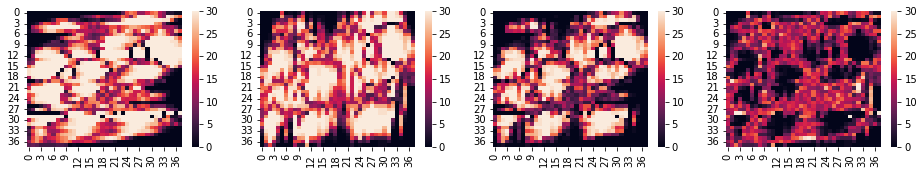

max fitness:  22.068808628210597 7.319538112490019
max fitness:  21.72124071267637 7.6671060280242465
max fitness:  21.987435266874577 7.400911473826039
max fitness:  21.768766046013475 7.619580694687141
max fitness:  21.789410705274527 7.598936035426089
max fitness:  21.824830532674063 7.563516208026552
max fitness:  21.679814500080962 7.708532240619654
max fitness:  21.60922585205767 7.779120888642947
max fitness:  21.971507176263472 7.416839564437144
max fitness:  21.807985076238648 7.580361664461968
max fitness:  21.822521454847962 7.565825285852654
max fitness:  21.64731892644525 7.741027814255364
max fitness:  21.817079582385098 7.571267158315518
max fitness:  21.866791531007408 7.521555209693208
max fitness:  22.05619876787626 7.332147972824355
max fitness:  22.150043237258025 7.238303503442591
max fitness:  21.71722735822999 7.671119382470625
max fitness:  22.27172516874989 7.116621571950727
max fitness:  21.706840809660743 7.681505931039872
max fitness:  22.02954116198819 7.35

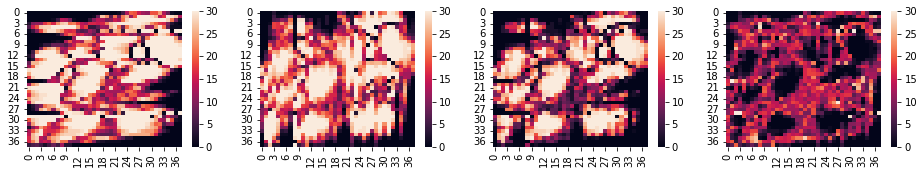

max fitness:  22.15508560056191 7.233261140138705
max fitness:  22.263421248246765 7.124925492453851
max fitness:  22.082146082768546 7.30620065793207
max fitness:  22.305478551471957 7.082868189228659
max fitness:  22.00165487303297 7.386691867667647
max fitness:  22.558017371433568 6.830329369267048
max fitness:  22.13160814626586 7.256738594434754
max fitness:  21.96484123732949 7.423505503371125
max fitness:  21.9520034185355 7.436343322165115
max fitness:  21.948327675939936 7.44001906476068
max fitness:  22.138437562590028 7.249909178110588
max fitness:  22.179530870647255 7.20881587005336
max fitness:  21.881364750223934 7.506981990476682
max fitness:  21.978954890961123 7.409391849739492
max fitness:  21.929369440700448 7.458977300000168
max fitness:  21.960700366034835 7.42764637466578
max fitness:  22.0156441501151 7.372702590585515
max fitness:  22.20044051833721 7.187906222363406
max fitness:  22.019717020455438 7.368629720245178
max fitness:  21.871464286172547 7.516882454

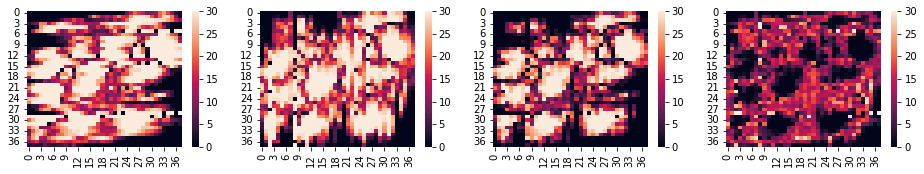

max fitness:  21.8715732676745 7.516773473026117
max fitness:  21.82091343126413 7.567433309436485
max fitness:  22.040561963076 7.347784777624614
max fitness:  21.98273559933709 7.405611141363526
max fitness:  21.900648202576328 7.487698538124288
max fitness:  22.012315985311037 7.3760307553895785
max fitness:  21.841423742392802 7.546922998307814
max fitness:  21.90769573515358 7.480651005547035
max fitness:  22.08447598708162 7.303870753618995
max fitness:  21.95492795678857 7.433418783912046
max fitness:  22.136018551889194 7.252328188811422
max fitness:  22.108808551487876 7.27953818921274
max fitness:  22.045757401605808 7.342589339094808
max fitness:  21.942187256656894 7.446159484043722
max fitness:  22.113471891117968 7.274874849582648
max fitness:  22.215259395952216 7.173087344748399
max fitness:  22.176399046587733 7.211947694112883
max fitness:  21.895606518026437 7.492740222674179
max fitness:  21.95592387662934 7.4324228640712775
max fitness:  22.19801970534227 7.1903270

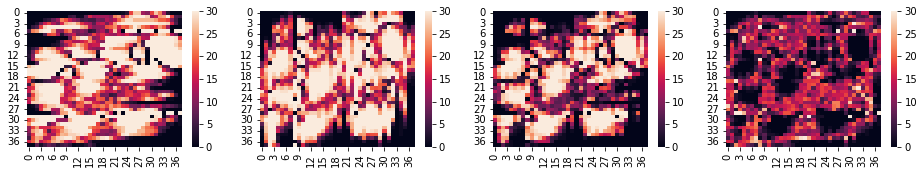

max fitness:  22.38481533886677 7.003531401833847
max fitness:  22.653298065902774 6.7350486747978415
max fitness:  21.878298918927896 7.510047821772719
max fitness:  22.302063153253208 7.086283587447408
max fitness:  22.038161287261005 7.350185453439611
max fitness:  22.21441225859024 7.173934482110376
max fitness:  21.954689792943658 7.433656947756958
max fitness:  22.03144023703261 7.356906503668007
max fitness:  21.89616411390967 7.492182626790946
max fitness:  22.099390220877577 7.288956519823039
max fitness:  22.147731173031467 7.240615567669149
max fitness:  21.979246615402467 7.409100125298149
max fitness:  22.11958235321318 7.268764387487437
max fitness:  22.031868240899165 7.356478499801451
max fitness:  21.923658281977573 7.464688458723042
max fitness:  21.776107619225378 7.612239121475238
max fitness:  21.98830121043042 7.400045530270194
max fitness:  21.96359623101113 7.424750509689485
max fitness:  22.002609217429246 7.38573752327137
max fitness:  21.868708226001846 7.519

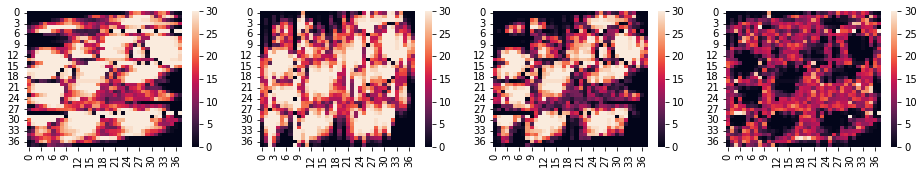

max fitness:  21.69167969840182 7.696667042298795
max fitness:  21.851158191509644 7.537188549190972
max fitness:  21.863082756549037 7.525263984151579
max fitness:  21.883376197531653 7.504970543168962
max fitness:  21.62817169488703 7.760175045813586
max fitness:  21.72386223367154 7.664484507029076
max fitness:  21.687092466497575 7.701254274203041
max fitness:  21.98070885847288 7.407637882227736
max fitness:  21.891902562388168 7.496444178312448
max fitness:  21.743657500762374 7.644689239938241
max fitness:  21.90897007039118 7.479376670309435
max fitness:  21.843180630448835 7.545166110251781
max fitness:  21.892673429561192 7.495673311139424
max fitness:  21.705838511443773 7.682508229256843
max fitness:  21.79202880986139 7.596317930839227
max fitness:  21.716792439073544 7.671554301627072
max fitness:  21.996374419412767 7.391972321287849
max fitness:  21.94919067037599 7.439156070324625
max fitness:  21.78687002744219 7.601476713258425
max fitness:  21.541834243346848 7.8465

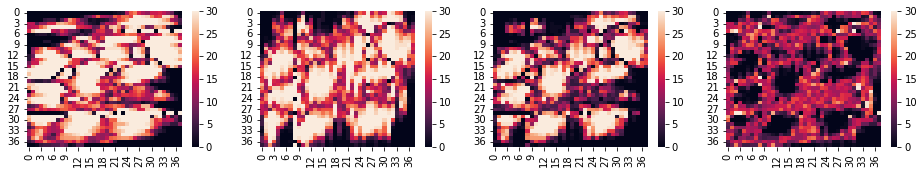

max fitness:  21.694986878596524 7.693359862104092
max fitness:  21.809735724046725 7.578611016653891
max fitness:  21.713016943919257 7.675329796781359
max fitness:  21.891553601143745 7.496793139556871
max fitness:  21.744781312309804 7.643565428390811
max fitness:  22.040364161161964 7.347982579538652
max fitness:  21.96211693612557 7.426229804575044
max fitness:  21.856419345053347 7.531927395647269
max fitness:  21.675285586330084 7.713061154370532
max fitness:  21.892686417662425 7.495660323038191
max fitness:  21.85155548342682 7.536791257273794
max fitness:  21.698878961764862 7.689467778935754
max fitness:  21.744322846270702 7.644023894429914
max fitness:  21.884272602976925 7.504074137723691
max fitness:  21.939212728574923 7.449134012125693
max fitness:  22.118733678395333 7.269613062305282
max fitness:  21.965140047944406 7.42320669275621
max fitness:  22.076866815484667 7.311479925215949
max fitness:  21.89895237998421 7.489394360716407
max fitness:  21.981733519994034 7.

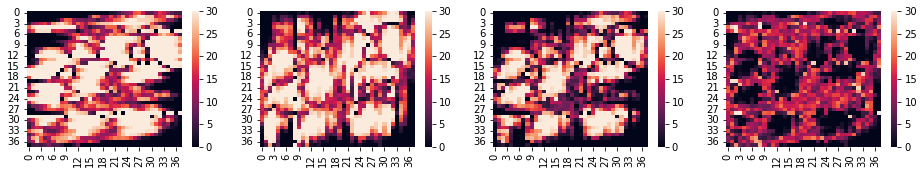

max fitness:  21.8607176176534 7.527629123047216
max fitness:  21.90590531784412 7.482441422856496
max fitness:  21.932789276884588 7.455557463816028
max fitness:  22.242786105601702 7.145560635098914
max fitness:  21.83646563364766 7.551881107052957
max fitness:  22.168729450859644 7.219617289840972
max fitness:  22.095362337662436 7.292984403038179
max fitness:  21.817841176738852 7.570505563961763
max fitness:  21.950149201699503 7.438197539001113
max fitness:  21.959644860917436 7.42870187978318
max fitness:  21.869484064369548 7.518862676331068
max fitness:  22.037490824555658 7.350855916144958
max fitness:  22.114936718238162 7.273410022462453
max fitness:  21.85824783340153 7.5300989072990845
max fitness:  22.164662872265694 7.223683868434922
max fitness:  22.11712739258374 7.271219348116876
max fitness:  21.84265913148844 7.545687609212177
max fitness:  22.04745971799067 7.340887022709946
max fitness:  21.897275375948063 7.491071364752553
max fitness:  22.007699968112355 7.3806

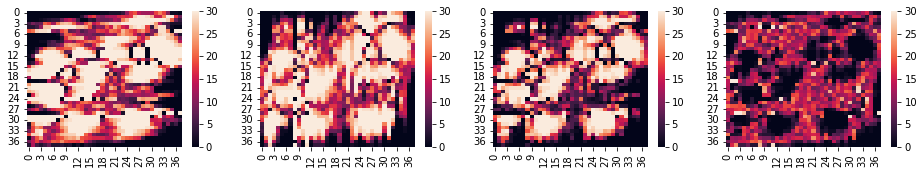

max fitness:  22.052657369090227 7.335689371610389
max fitness:  21.959268333060578 7.429078407640038
max fitness:  22.144999084629703 7.243347656070913
max fitness:  21.99365385939919 7.394692881301427
max fitness:  22.343091328278582 7.0452554124220335
max fitness:  22.121974663009436 7.26637207769118
max fitness:  22.321833382214717 7.066513358485899
max fitness:  22.0880873076712 7.300259433029417
max fitness:  22.199127405323523 7.189219335377093
max fitness:  22.087714369685816 7.3006323710148
max fitness:  22.11703720884786 7.271309531852754
max fitness:  21.97330429995064 7.415042440749975
max fitness:  21.757098691766934 7.631248048933681
max fitness:  21.802326335649497 7.586020405051119
max fitness:  22.20582040660954 7.182526334091076
max fitness:  22.02523014192656 7.363116598774056
max fitness:  22.568156139734544 6.820190600966072
max fitness:  22.074849586275455 7.313497154425161
max fitness:  22.42904989595018 6.959296844750437
max fitness:  22.145895199531036 7.242451

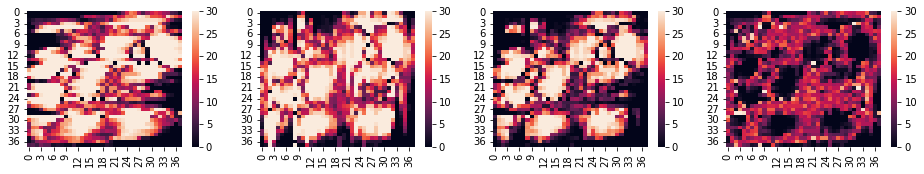

max fitness:  21.984439627568328 7.403907113132288
max fitness:  22.041520579275513 7.346826161425103
max fitness:  22.205175433142635 7.183171307557981
max fitness:  22.231857260805484 7.156489479895132
max fitness:  21.81457673584703 7.573770004853586
max fitness:  22.045278838149894 7.343067902550722
max fitness:  22.142741117613962 7.245605623086654
max fitness:  21.958629580497444 7.429717160203172
max fitness:  22.027960507465046 7.36038623323557
max fitness:  22.22527279646335 7.163073944237265
max fitness:  22.24061496533568 7.147731775364935
max fitness:  22.16222842048237 7.226118320218244
max fitness:  22.08381130072455 7.304535439976068
max fitness:  21.994753754958445 7.3935929857421705
max fitness:  21.903625479664548 7.484721261036068
max fitness:  21.954403071314555 7.4339436693860605
max fitness:  21.880882121098026 7.50746461960259
max fitness:  21.67847137516984 7.7098753655307775
max fitness:  21.949536908296878 7.438809832403738
max fitness:  21.911785706769074 7.4

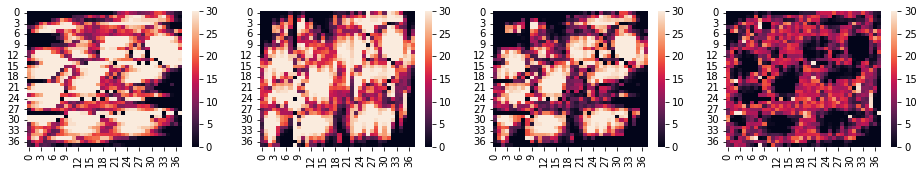

max fitness:  22.00906623028659 7.379280510414027
max fitness:  22.065168502562386 7.3231782381382295
max fitness:  21.896463723391825 7.4918830173087905
max fitness:  22.02241956109653 7.3659271796040855
max fitness:  21.921940752769626 7.46640598793099
max fitness:  21.88973177787785 7.498614962822767
max fitness:  21.9617623060981 7.426584434602514
max fitness:  22.048018529006946 7.34032821169367
max fitness:  21.956464042218613 7.431882698482003
max fitness:  22.165919622886044 7.222427117814572
max fitness:  21.85238234101368 7.535964399686936
max fitness:  21.870642809842792 7.517703930857824
max fitness:  21.867059038238665 7.521287702461951
max fitness:  21.702629909532043 7.685716831168573
max fitness:  21.993112842611687 7.395233898088929
max fitness:  22.14566782318589 7.242678917514727
max fitness:  21.962534031960526 7.425812708740089
max fitness:  22.022895219108204 7.365451521592412
max fitness:  21.988771005824923 7.399575734875693
max fitness:  22.074624126563897 7.31

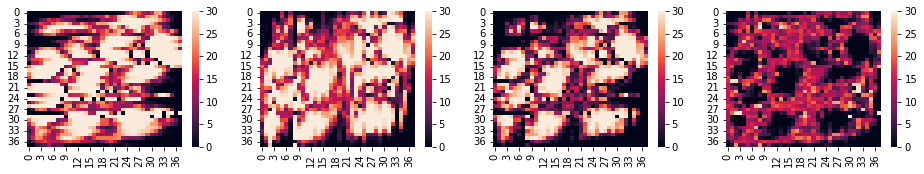

max fitness:  21.960118967541597 7.428227773159019
max fitness:  22.307031040939677 7.081315699760939
max fitness:  22.06677087412912 7.3215758665714965
max fitness:  21.830094469531584 7.558252271169032
max fitness:  21.95993284458697 7.428413896113646
max fitness:  22.03406053516973 7.354286205530887
max fitness:  22.07090534866453 7.317441392036084
max fitness:  22.216815519714697 7.171531220985919
max fitness:  21.896301592050044 7.492045148650572
max fitness:  21.95573082640094 7.432615914299674
max fitness:  22.157481506749008 7.230865233951608
max fitness:  21.865054771323948 7.523291969376668
max fitness:  21.769295422663554 7.619051318037062
max fitness:  21.930852762108213 7.457493978592403
max fitness:  22.12100339025058 7.267343350450037
max fitness:  21.858415345473297 7.529931395227319
max fitness:  21.888393975528256 7.49995276517236
max fitness:  21.97219172082489 7.416155019875728
max fitness:  22.159929427721874 7.228417312978742
max fitness:  22.11199625808913 7.2763

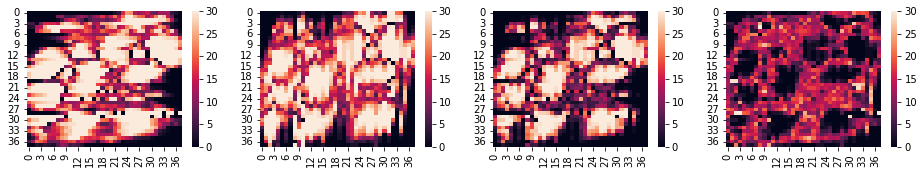

max fitness:  22.06925532686471 7.319091413835906
max fitness:  22.06079134353356 7.327555397167057
max fitness:  21.9499228765239 7.438423864176716
max fitness:  21.961678922185552 7.426667818515064
max fitness:  21.80127968796753 7.587067052733087
max fitness:  21.939861393284204 7.448485347416412
max fitness:  22.010166727116022 7.378180013584593
max fitness:  21.828628288938397 7.559718451762219
max fitness:  22.210096055221566 7.17825068547905
max fitness:  21.899599503994477 7.488747236706139
max fitness:  22.019003312664797 7.369343428035819
max fitness:  22.164956661513042 7.223390079187574
max fitness:  21.973273131680422 7.415073609020194
max fitness:  21.991325527265985 7.3970212134346305
max fitness:  21.80512951031301 7.583217230387607
max fitness:  21.961305542454728 7.427041198245888
max fitness:  21.907204297577245 7.481142443123371
max fitness:  21.947446624708014 7.440900115992601
max fitness:  21.833996103123678 7.554350637576938
max fitness:  21.67360351924481 7.714

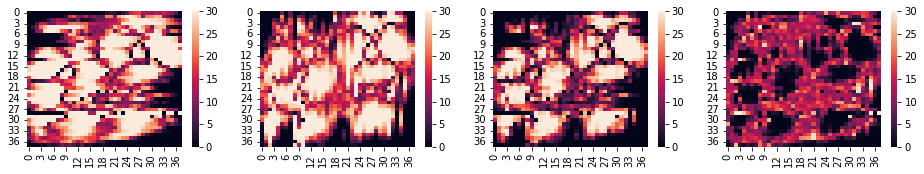

max fitness:  22.02335699538091 7.364989745319704
max fitness:  21.764602489902718 7.623744250797898
max fitness:  21.770841380444878 7.617505360255738
max fitness:  21.94760965207264 7.4407370886279764
max fitness:  21.723694181100086 7.66465255960053
max fitness:  22.057367661607728 7.330979079092888
max fitness:  22.015540140379958 7.372806600320658
max fitness:  21.897390813540646 7.49095592715997
max fitness:  21.757383761254847 7.630962979445769
max fitness:  21.777471443063185 7.610875297637431
max fitness:  21.703500805018926 7.68484593568169
max fitness:  22.05575064458197 7.332596096118646
max fitness:  22.03745117500805 7.350895565692564
max fitness:  21.903274063124 7.485072677576614
max fitness:  22.08869522654105 7.299651514159567
max fitness:  21.9328776915112 7.455469049189414
max fitness:  21.823251075467294 7.565095665233322
max fitness:  21.72406639367683 7.664280347023787
max fitness:  21.836334286553885 7.55201245414673
max fitness:  22.094152593053856 7.2941941476

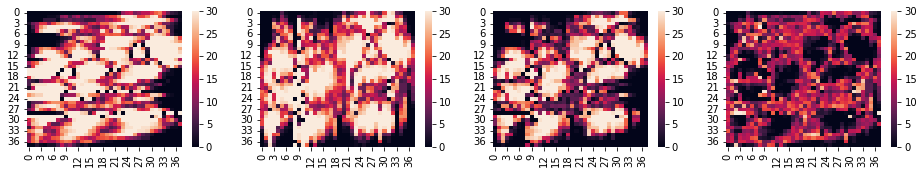

max fitness:  22.06170367674504 7.326643063955576
max fitness:  22.04964496013821 7.338701780562406
max fitness:  22.360727806028926 7.02761893467169
max fitness:  22.1295911741369 7.258755566563718
max fitness:  22.121757394178 7.266589346522615
max fitness:  22.023861940990884 7.364484799709732
max fitness:  22.01616685179114 7.372179888909475
max fitness:  22.173400662741045 7.214946077959571
max fitness:  22.087630893819483 7.300715846881133
max fitness:  21.987753402946325 7.400593337754291
max fitness:  21.966407623463134 7.421939117237482
max fitness:  21.85654798741942 7.531798753281194
max fitness:  21.88556404576377 7.5027826949368475
max fitness:  22.453579025817206 6.93476771488341
max fitness:  22.15537764445031 7.232969096250304
max fitness:  21.882238314819283 7.506108425881333
max fitness:  21.8804068746591 7.507939866041514
max fitness:  22.031988756933778 7.356357983766838
max fitness:  21.924561558491824 7.463785182208792
max fitness:  21.757334618231305 7.6310121224

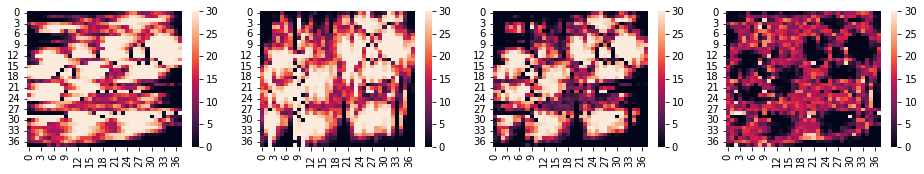

max fitness:  21.839790919560937 7.548555821139679
max fitness:  22.21847435067393 7.169872390026686
max fitness:  21.962626362956293 7.425720377744323
max fitness:  21.976184768702186 7.4121619719984295
max fitness:  21.801306157203527 7.587040583497089
max fitness:  22.221747304212442 7.166599436488173
max fitness:  22.074876935501145 7.313469805199471
max fitness:  21.931172227809817 7.4571745128907985
max fitness:  21.997129580639694 7.391217160060922
max fitness:  21.906789422687744 7.481557318012872
max fitness:  21.9722437750824 7.416102965618215
max fitness:  21.780886733207417 7.607460007493199
max fitness:  21.88644425836927 7.501902482331346
max fitness:  22.160663967093498 7.227682773607118
max fitness:  22.152478993859035 7.235867746841581
max fitness:  21.848983803475143 7.539362937225473
max fitness:  22.20085760893676 7.187489131763854
max fitness:  21.993747842651906 7.394598898048709
max fitness:  21.853559636857824 7.534787103842792
max fitness:  22.01323178117713 7.

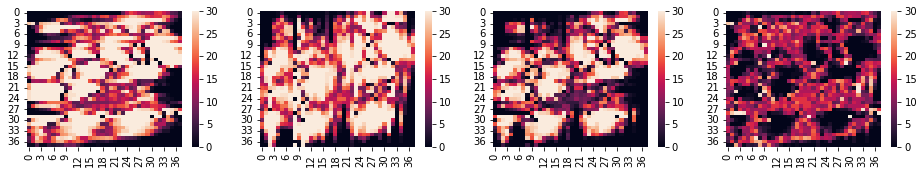

max fitness:  21.85847389912793 7.529872841572686
max fitness:  21.931727957389562 7.456618783311054
max fitness:  22.013480527350644 7.374866213349971
max fitness:  22.024283102135342 7.364063638565273
max fitness:  22.147683979472276 7.240662761228339
max fitness:  22.2795426035386 7.108804137162014
max fitness:  22.145362028622966 7.24298471207765
max fitness:  22.404874149937505 6.98347259076311
max fitness:  22.039038869172607 7.3493078715280085
max fitness:  22.227151841334106 7.16119489936651
max fitness:  22.118719127971797 7.269627612728819
max fitness:  22.229088717764014 7.159258022936601
max fitness:  22.096513085095356 7.291833655605259
max fitness:  22.140247056726018 7.248099683974598
max fitness:  22.080927911611987 7.307418829088629
max fitness:  22.14633246169541 7.2420142790052076
max fitness:  22.01233861973789 7.376008120962727
max fitness:  22.072645605838574 7.315701134862042
max fitness:  22.190872290078968 7.197474450621648
max fitness:  21.92203990978827 7.466

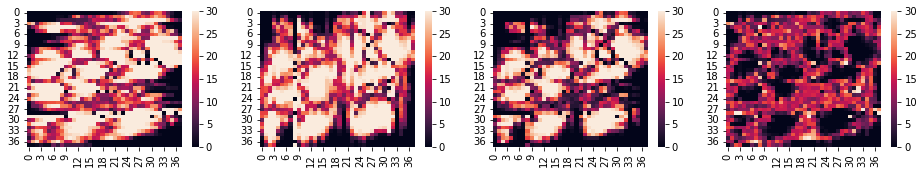

max fitness:  22.07889246670246 7.309454273998156
max fitness:  22.18542414164945 7.202922599051167
max fitness:  22.158073476240197 7.230273264460418
max fitness:  21.914177992748215 7.474168747952401
max fitness:  22.14572072378371 7.242626016916905
max fitness:  22.159447736612083 7.228899004088532
max fitness:  22.025263804054944 7.363082936645672
max fitness:  22.180676272424428 7.207670468276188
max fitness:  22.1073572066981 7.280989534002515
max fitness:  22.07137317819143 7.316973562509187
max fitness:  22.21862963381112 7.169717106889497
max fitness:  22.12308386945017 7.265262871250446
max fitness:  22.10339736690016 7.284949373800455
max fitness:  21.91399196493134 7.4743547757692745
max fitness:  22.003335417205207 7.385011323495409
max fitness:  21.99525970718264 7.3930870335179755
max fitness:  21.91090065950158 7.477446081199037
max fitness:  21.981871396677285 7.406475344023331
max fitness:  21.81644607825124 7.5719006624493765
max fitness:  21.950338824224843 7.438007

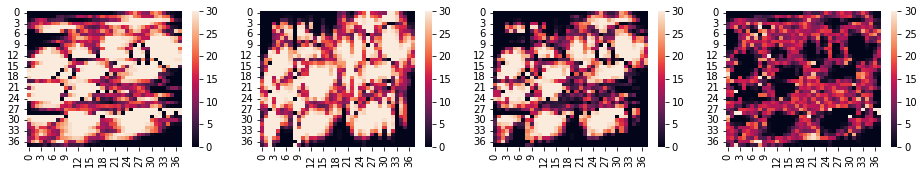

max fitness:  21.98482755142794 7.403519189272675
max fitness:  22.092981047893794 7.295365692806822
max fitness:  22.061642199509237 7.326704541191379
max fitness:  22.055567042816328 7.332779697884288
max fitness:  22.24527676417751 7.143069976523105
max fitness:  22.0039879280328 7.384358812667816
max fitness:  22.122340386934585 7.266006353766031
max fitness:  21.830428701753604 7.557918038947012
max fitness:  22.270741193047247 7.117605547653369
max fitness:  22.131977242971885 7.2563694977287305
max fitness:  22.043925623373802 7.344421117326814
max fitness:  22.149406220819237 7.238940519881378
max fitness:  22.076464257112633 7.311882483587983
max fitness:  21.999313997322282 7.389032743378333
max fitness:  21.905197557264074 7.483149183436542
max fitness:  22.0345533612356 7.353793379465017
max fitness:  21.96969382811134 7.418652912589277
max fitness:  21.99181502541647 7.396531715284144
max fitness:  21.966741391636763 7.421605349063853
max fitness:  21.997740169470738 7.390

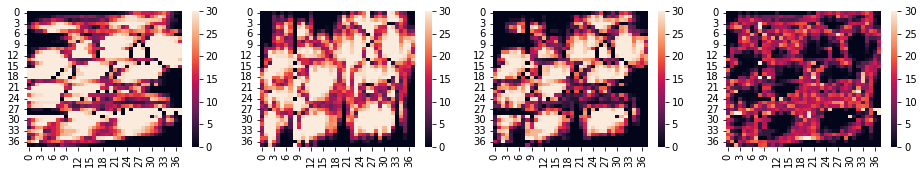

max fitness:  22.158806775018796 7.22953996568182
max fitness:  22.112357552328668 7.275989188371948
max fitness:  22.392159274187975 6.996187466512641
max fitness:  22.297445912456936 7.090900828243679
max fitness:  22.087357291965766 7.30098944873485
max fitness:  22.22964733440771 7.158699406292907
max fitness:  21.960219654260605 7.428127086440011
max fitness:  22.178799262241476 7.20954747845914
max fitness:  22.053823839432575 7.334522901268041
max fitness:  21.955461845378835 7.432884895321781
max fitness:  21.96207591289432 7.426270827806295
max fitness:  22.13675270947455 7.251594031226066
max fitness:  22.000487651575362 7.387859089125254
max fitness:  22.156793799708744 7.231552940991872
max fitness:  22.19138050571334 7.196966234987276
max fitness:  22.350279733685195 7.038067007015421
max fitness:  22.021874923268854 7.366471817431762
max fitness:  22.379703876676196 7.00864286402442
max fitness:  22.26769816849601 7.120648572204605
max fitness:  22.235467185143037 7.15287

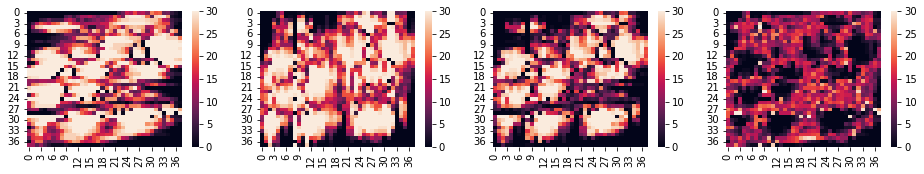

max fitness:  22.19795148452086 7.190395256179755
max fitness:  21.789451169591327 7.5988955711092885
max fitness:  22.146656097350693 7.241690643349923
max fitness:  21.925434993540385 7.462911747160231
max fitness:  21.82467621663081 7.563670524069806
max fitness:  21.91363357429178 7.474713166408836
max fitness:  22.149318222682204 7.2390285180184115
max fitness:  21.779413253268295 7.608933487432321
max fitness:  21.765315133550622 7.6230316071499935
max fitness:  21.96424140452697 7.424105336173646
max fitness:  21.933089522105103 7.455257218595513
max fitness:  21.78892209635938 7.599424644341237
max fitness:  21.934998771152113 7.453347969548503
max fitness:  22.24099434757115 7.1473523931294665
max fitness:  21.896337167667536 7.49200957303308
max fitness:  21.92647557117595 7.461871169524667
max fitness:  21.872414025379573 7.515932715321043
max fitness:  21.738413784263656 7.64993295643696
max fitness:  21.81044696168873 7.5778997790118865
max fitness:  21.83178629494097 7.55

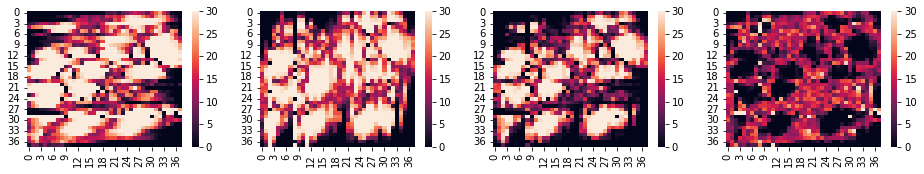

max fitness:  22.004488933131938 7.383857807568678
max fitness:  21.909099603612745 7.479247137087871
max fitness:  21.767832317260485 7.620514423440131
max fitness:  21.893037286022384 7.495309454678232
max fitness:  21.81240202696758 7.575944713733037
max fitness:  22.077844724451882 7.3105020162487335
max fitness:  22.043618721957856 7.34472801874276
max fitness:  21.878384605029737 7.509962135670879
max fitness:  22.085182179981974 7.303164560718642
max fitness:  22.09539379594743 7.292952944753186
max fitness:  22.064616057856263 7.323730682844353
max fitness:  21.990763150052423 7.397583590648193
max fitness:  22.05551637027004 7.332830370430575
max fitness:  21.82876719691441 7.559579543786207
max fitness:  21.955952672415812 7.432394068284804
max fitness:  22.059974549277314 7.328372191423302
max fitness:  22.058468464714153 7.329878275986463
max fitness:  22.123581933888943 7.264764806811673
max fitness:  22.120966957703786 7.26737978299683
max fitness:  21.7738350596089 7.614

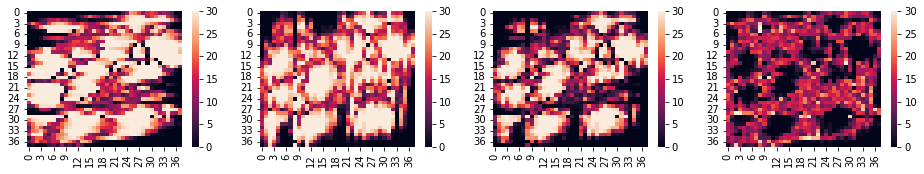

max fitness:  21.919529611793465 7.468817128907151
max fitness:  22.035414463351046 7.35293227734957
max fitness:  21.82334487377227 7.565001866928345
max fitness:  21.823445155866374 7.564901584834242
max fitness:  21.95165768879361 7.436689051907006
max fitness:  21.89690497347418 7.491441767226437
max fitness:  21.922229025725684 7.466117714974931
max fitness:  21.664934751529096 7.72341198917152
max fitness:  21.98995298978998 7.3983937509106354
max fitness:  21.721231847477927 7.6671148932226885
max fitness:  21.876582429313032 7.511764311387584
max fitness:  21.7955295432065 7.592817197494117
max fitness:  22.00718804037661 7.381158700324004
max fitness:  21.61371691076559 7.7746298299350265
max fitness:  21.549254906443508 7.839091834257108
max fitness:  21.934497950480775 7.4538487902198405
max fitness:  21.84023398074212 7.548112759958496
max fitness:  21.657210651029814 7.731136089670802
max fitness:  21.51776717403458 7.870579566666034
max fitness:  21.713272259132523 7.6750

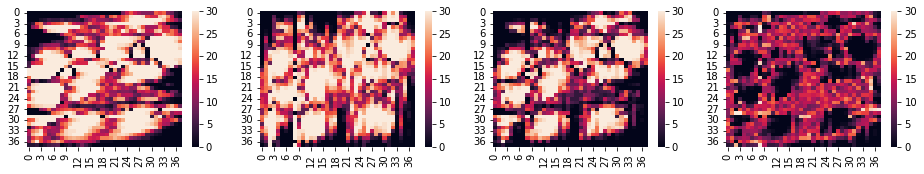

max fitness:  21.705207489593533 7.683139251107082
max fitness:  21.968840644005947 7.419506096694668
max fitness:  21.775060702383314 7.613286038317302
max fitness:  21.9380802859869 7.4502664547137165
max fitness:  21.623490872197706 7.764855868502909
max fitness:  21.981726743252217 7.406619997448399
max fitness:  21.930777567303274 7.457569173397342
max fitness:  21.745696388158002 7.6426503525426135
max fitness:  21.687958369810794 7.700388370889822
max fitness:  21.768569661746547 7.619777078954069
max fitness:  21.933041672814124 7.455305067886492
max fitness:  21.92364808145549 7.464698659245126
max fitness:  22.03201365309487 7.356333087605744
max fitness:  21.66249247831167 7.725854262388946
max fitness:  22.161468041541337 7.226878699159279
max fitness:  21.802740546538836 7.58560619416178
max fitness:  21.714064237258278 7.674282503442338
max fitness:  21.779325917666892 7.609020823033724
max fitness:  21.834109248933203 7.554237491767413
max fitness:  21.949542205584443 7.

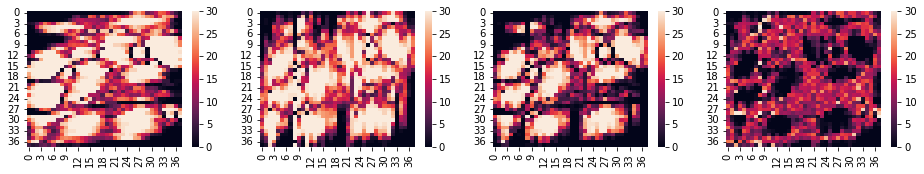

max fitness:  21.799756259598038 7.588590481102578
max fitness:  21.92926668471845 7.459080055982167
max fitness:  21.684488519804134 7.703858220896482
max fitness:  21.75999390721158 7.628352833489036
max fitness:  22.00739858525587 7.380948155444745
max fitness:  22.056166782775033 7.332179957925582
max fitness:  22.012895761994287 7.375450978706329
max fitness:  21.97348190835907 7.4148648323415465
max fitness:  21.795893302434997 7.592453438265618
max fitness:  22.01760024260396 7.370746498096654
max fitness:  21.938375173038576 7.44997156766204
max fitness:  22.133264956693843 7.255081784006773
max fitness:  22.364759265059593 7.023587475641023
max fitness:  22.033341635660996 7.35500510503962
max fitness:  22.059584302195383 7.328762438505233
max fitness:  22.084315719158074 7.304031021542542
max fitness:  22.189396575215248 7.198950165485368
max fitness:  22.13715237552838 7.2511943651722355
max fitness:  22.128452629613832 7.259894111086783
max fitness:  22.119216086328226 7.26

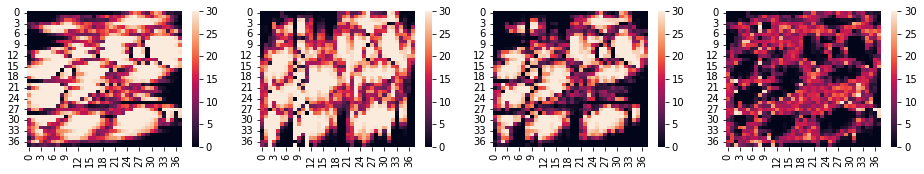

max fitness:  21.88237608632431 7.505970654376306
max fitness:  22.257502672082847 7.130844068617769
max fitness:  22.16683822361233 7.221508517088285
max fitness:  22.071776611631122 7.316570129069493
max fitness:  22.068800731254278 7.319546009446338
max fitness:  22.381928658386265 7.006418082314351
max fitness:  22.02413763188654 7.364209108814077
max fitness:  22.23255608784965 7.155790652850964
max fitness:  22.169270087538496 7.219076653162119
max fitness:  22.16224088561848 7.226105855082135
max fitness:  22.144828883905397 7.2435178567952185
max fitness:  21.95715176871853 7.431194971982087
max fitness:  22.186235735956178 7.202111004744438
max fitness:  22.21997420349886 7.168372537201755
max fitness:  22.03749029044423 7.350856450256387
max fitness:  22.14106576411599 7.247280976584626
max fitness:  22.078779401476886 7.3095673392237295
max fitness:  22.282692538018985 7.105654202681631
max fitness:  22.17855998088546 7.209786759815156
max fitness:  22.097061969787255 7.2912

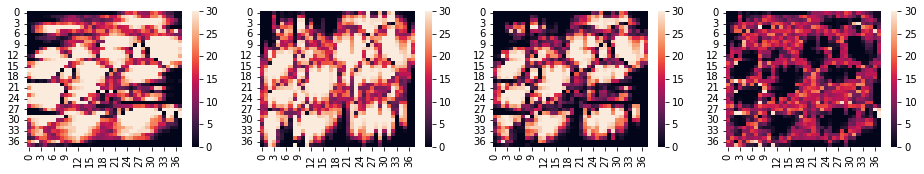

max fitness:  21.926426386714716 7.461920353985899
max fitness:  22.089566555292002 7.298780185408614
max fitness:  22.00337020660662 7.3849765340939975
max fitness:  22.242337442144645 7.1460092985559704
max fitness:  22.194401993883734 7.193944746816882
max fitness:  22.236121691914114 7.152225048786502
max fitness:  21.888141096463794 7.5002056442368215
max fitness:  22.363833657248506 7.02451308345211
max fitness:  22.18799531492727 7.200351425773345
max fitness:  22.339437950292787 7.048908790407829
max fitness:  21.97785442243768 7.410492318262936
max fitness:  22.058441384842702 7.329905355857914
max fitness:  22.09570170132018 7.292645039380435
max fitness:  22.128200106512253 7.260146634188363
max fitness:  21.968766590548967 7.419580150151649
max fitness:  22.544152601919592 6.844194138781024
max fitness:  21.849418628838976 7.53892811186164
max fitness:  21.67219230379385 7.716154436906766
max fitness:  21.855108247718864 7.533238492981752
max fitness:  21.85168568806047 7.5

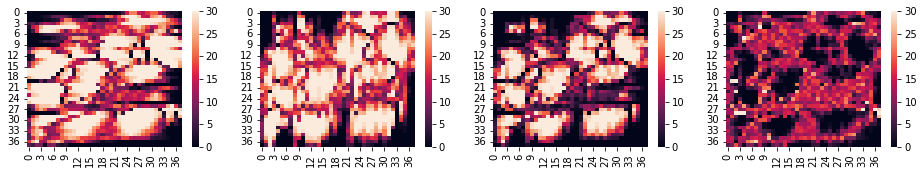

max fitness:  21.666386859933937 7.721959880766679
max fitness:  21.88219602783405 7.506150712866567
max fitness:  21.575118176904724 7.813228563795892
max fitness:  21.647781319756515 7.740565420944101
max fitness:  22.05433501753501 7.334011723165606
max fitness:  21.7073813664845 7.680965374216115
max fitness:  21.70386192225609 7.684484818444528
max fitness:  21.941600343576148 7.446746397124468
max fitness:  21.780259660147152 7.608087080553464
max fitness:  21.830702762069635 7.557643978630981
max fitness:  21.744273187039703 7.644073553660913
max fitness:  21.698586516690046 7.68976022401057
max fitness:  22.05519681470934 7.333149925991275
max fitness:  21.678212860280524 7.710133880420091
max fitness:  21.853847809416603 7.534498931284013
max fitness:  22.117842485158857 7.270504255541759
max fitness:  21.881429652389155 7.506917088311461
max fitness:  21.698136966702833 7.690209773997783
max fitness:  21.806274584683106 7.58207215601751
max fitness:  21.78707874009309 7.60126

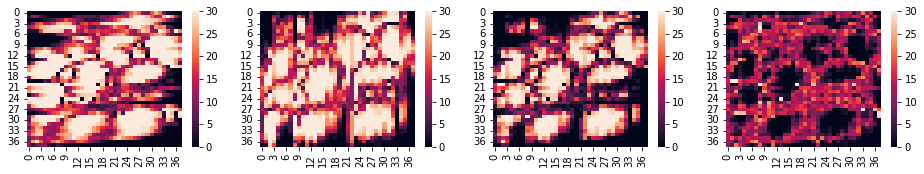

max fitness:  22.0619993892984 7.326347351402216
max fitness:  21.89224723522718 7.496099505473435
max fitness:  21.77403493440967 7.614311806290946
max fitness:  21.872462474124017 7.515884266576599
max fitness:  21.612882238346224 7.775464502354392
max fitness:  21.71095547148332 7.677391269217296
max fitness:  21.67869160550078 7.709655135199835
max fitness:  21.72079333405442 7.667553406646196
max fitness:  21.669354208157394 7.718992532543222
max fitness:  21.67726197184642 7.711084768854196
max fitness:  21.92741858860353 7.460928152097086
max fitness:  21.76112750927806 7.627219231422554
max fitness:  21.837694070850034 7.550652669850582
max fitness:  21.992905048006346 7.39544169269427
max fitness:  21.9478019518382 7.4405447888624145
max fitness:  21.893761038108458 7.494585702592158
max fitness:  21.67620429170742 7.712142448993195
max fitness:  21.697635850660348 7.690710890040268
max fitness:  21.76168744886172 7.6266592918388945
max fitness:  21.965588468440338 7.422758272

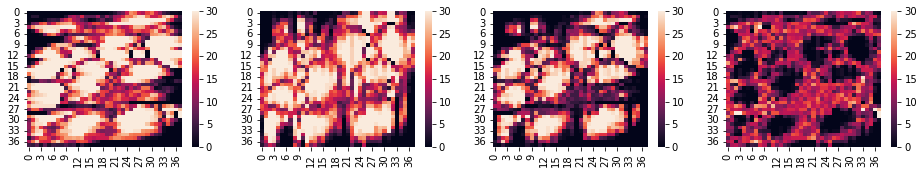

max fitness:  21.701226830907295 7.687119909793321
max fitness:  21.62284936982644 7.765497370874176
max fitness:  21.988291709778515 7.4000550309221005
max fitness:  21.871982861450746 7.5163638792498695
max fitness:  21.945304830421463 7.4430419102791525
max fitness:  21.87925125860367 7.509095482096946
max fitness:  21.864545033707333 7.523801706993282
max fitness:  22.1578925740218 7.230454166678815
max fitness:  21.77131264135494 7.617034099345677
max fitness:  21.908602057835637 7.479744682864979
max fitness:  21.956087021055303 7.432259719645312
max fitness:  21.952568198839995 7.435778541860621
max fitness:  22.060995952002955 7.327350788697661
max fitness:  21.7711308192601 7.617215921440515
max fitness:  21.812898455874507 7.575448284826109
max fitness:  21.807229956043166 7.58111678465745
max fitness:  22.002531772542866 7.385814968157749
max fitness:  21.696932420494264 7.691414320206352
max fitness:  21.968720652912637 7.419626087787979
max fitness:  21.895974674472654 7.4

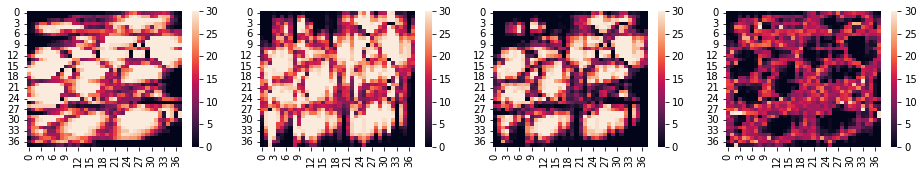

max fitness:  21.930953568780986 7.45739317191963
max fitness:  21.816879059259634 7.571467681440982
max fitness:  21.92547192221074 7.462874818489876
max fitness:  21.718311604492904 7.670035136207712
max fitness:  21.798917969001284 7.589428771699332
max fitness:  21.943078403429848 7.445268337270768
max fitness:  21.710325041630163 7.678021699070452
max fitness:  21.778365193399154 7.609981547301462
max fitness:  21.60578723881317 7.7825595018874445
max fitness:  21.764282826928188 7.624063913772428
max fitness:  21.745346063933976 7.64300067676664
max fitness:  21.908170924130797 7.480175816569819
max fitness:  22.28812987516355 7.100216865537067
max fitness:  21.737626717542227 7.650720023158389
max fitness:  21.889313637325866 7.4990331033747495
max fitness:  21.766193933778716 7.6221528069219
max fitness:  21.94306293320247 7.4452838074981464
max fitness:  21.87419502609401 7.514151714606605
max fitness:  21.755494067551368 7.632852673149248
max fitness:  21.82572255815776 7.562

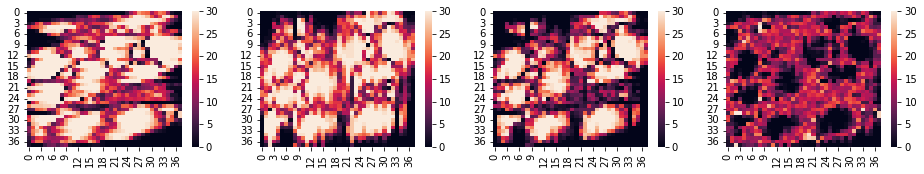

max fitness:  21.760617716669273 7.627729024031343
max fitness:  21.614754869727832 7.773591870972783
max fitness:  21.925256264559664 7.463090476140952
max fitness:  21.911584165055814 7.476762575644802
max fitness:  22.08378941611773 7.304557324582884
max fitness:  22.046281798022598 7.342064942678018
max fitness:  21.740813955307082 7.647532785393533
max fitness:  22.023071767188714 7.365274973511902
max fitness:  22.30276820280996 7.085578537890655
max fitness:  21.854233030278106 7.53411371042251
max fitness:  21.93993694162885 7.448409799071765
max fitness:  22.230522691504454 7.1578240491961616
max fitness:  22.106730645919292 7.281616094781324
max fitness:  22.112804610109656 7.27554213059096
max fitness:  21.99023834721978 7.398108393480836
max fitness:  22.01558754241319 7.372759198287426
max fitness:  21.693235353885875 7.695111386814741
max fitness:  21.855673194874154 7.532673545826462
max fitness:  21.94145648201821 7.446890258682405
max fitness:  22.29121271876958 7.0971

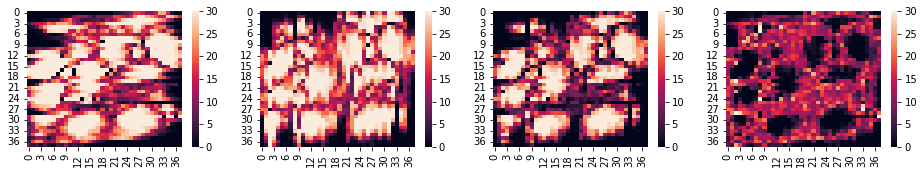

max fitness:  22.089440654569884 7.2989060861307316
max fitness:  22.05157504277103 7.336771697929585
max fitness:  21.830308936438392 7.558037804262224
max fitness:  22.182904388534332 7.205442352166283
max fitness:  21.812159908282545 7.57618683241807
max fitness:  22.04352559264523 7.344821148055384
max fitness:  21.715906499533894 7.672440241166722
max fitness:  21.915742723067336 7.47260401763328
max fitness:  21.77777698545899 7.610569755241627
max fitness:  21.85530485869462 7.533041882005996
max fitness:  22.083450942212174 7.304895798488442
max fitness:  21.848116348716783 7.540230391983833
max fitness:  21.78161600470839 7.606730735992226
max fitness:  21.74304587920954 7.6453008614910765
max fitness:  21.999150946175476 7.38919579452514
max fitness:  21.823538949522778 7.564807791177838
max fitness:  21.79380060303169 7.5945461376689245
max fitness:  21.881517463568898 7.506829277131718
max fitness:  21.80799183521414 7.580354905486477
max fitness:  21.964956863971018 7.4233

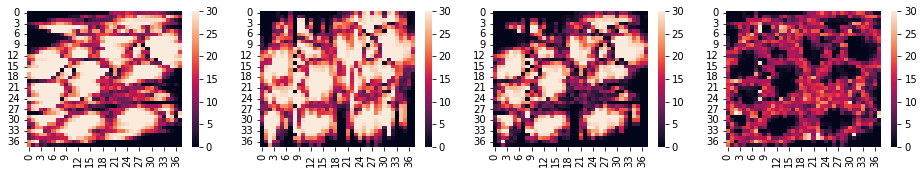

max fitness:  21.87740868822891 7.510938052471705
max fitness:  22.050514135001034 7.337832605699582
max fitness:  22.14562384800081 7.242722892699806
max fitness:  21.645909631268665 7.74243710943195
max fitness:  21.71565149536237 7.672695245338247
max fitness:  21.538945113583985 7.849401627116631
max fitness:  21.610812851574018 7.777533889126598
max fitness:  21.51577683555182 7.872569905148797
max fitness:  21.667469663874765 7.72087707682585
max fitness:  21.637501723967368 7.750845016733248
max fitness:  21.512085975274683 7.876260765425933
max fitness:  21.882613000183117 7.505733740517499
max fitness:  21.588719252308508 7.799627488392108
max fitness:  22.07964010324971 7.308706637450907
max fitness:  21.582950743526972 7.805395997173644
max fitness:  21.762108861258216 7.6262378794423995
max fitness:  22.17843400589322 7.209912734807396
max fitness:  21.665745004211963 7.722601736488652
max fitness:  21.584527815756417 7.803818924944199
max fitness:  21.968768682029506 7.419

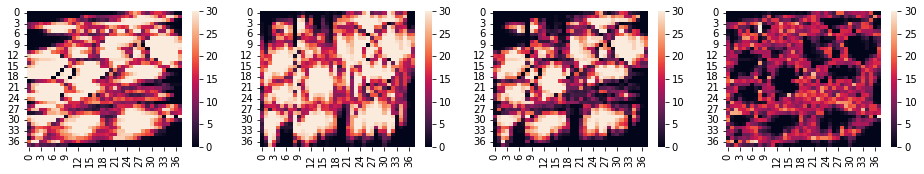

max fitness:  21.90674965455418 7.4815970861464365
max fitness:  22.403575122799758 6.984771617900858
max fitness:  21.839295907295295 7.549050833405321
max fitness:  21.716810475781315 7.6715362649193
max fitness:  21.997431285106693 7.390915455593923
max fitness:  21.918556830409706 7.46978991029091
max fitness:  21.82289486293808 7.565451877762534
max fitness:  22.102368337370386 7.28597840333023
max fitness:  22.136301161746715 7.252045578953901
max fitness:  22.201876222182776 7.18647051851784
max fitness:  21.865744975390754 7.522601765309862
max fitness:  21.95341811191844 7.434928628782174
max fitness:  21.98433955964754 7.404007181053075
max fitness:  22.131756595886067 7.256590144814549
max fitness:  21.83791524148775 7.550431499212866
max fitness:  21.88488463917706 7.5034621015235565
max fitness:  21.828935953507973 7.559410787192643
max fitness:  21.8905425826978 7.497804158002815
max fitness:  21.68767764661031 7.700669094090305
max fitness:  21.7099824236656 7.6783643170

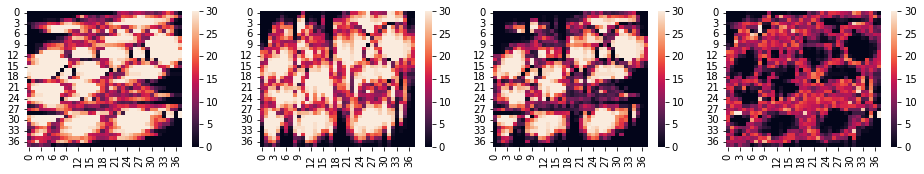

max fitness:  21.624368452829195 7.763978287871421
max fitness:  21.72324749050411 7.665099250196505
max fitness:  21.876803450267985 7.5115432904326305
max fitness:  21.80037575160479 7.587970989095826
max fitness:  21.72729451457903 7.661052226121587
max fitness:  21.669478702780452 7.7188680379201635
max fitness:  21.64567533192922 7.742671408771397
max fitness:  21.93736996751733 7.450976773183285
max fitness:  21.997812172093973 7.390534568606643
max fitness:  21.949504629990848 7.438842110709768
max fitness:  21.811136299277337 7.577210441423279
max fitness:  21.993262343038126 7.39508439766249
max fitness:  21.976775411341894 7.411571329358722
max fitness:  21.923998095749845 7.464348644950771
max fitness:  21.71425488043876 7.674091860261857
max fitness:  21.87483793441746 7.513508806283156
max fitness:  21.789568018937498 7.598778721763118
max fitness:  22.015454692580697 7.372892048119919
max fitness:  21.90822182515548 7.480124915545137
max fitness:  21.969442736533264 7.418

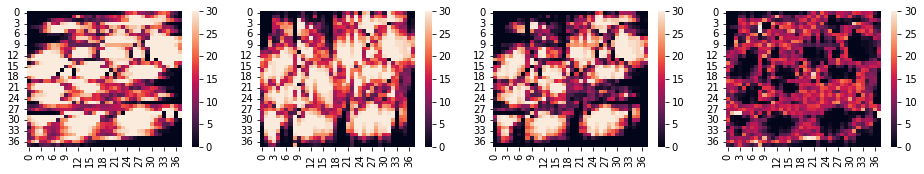

max fitness:  21.923439732141716 7.4649070085588995
max fitness:  21.91589024979016 7.4724564909104565
max fitness:  21.83971356820427 7.548633172496345
max fitness:  22.060699332085765 7.327647408614851
max fitness:  21.684781745109035 7.703564995591581
max fitness:  21.657708672665848 7.730638068034768
max fitness:  21.924421422075014 7.463925318625602
max fitness:  21.929272292330893 7.459074448369723
max fitness:  22.13077370464039 7.257573036060226
max fitness:  22.208511962542723 7.179834778157893
max fitness:  21.907585402918404 7.480761337782212
max fitness:  21.890377375001812 7.497969365698804
max fitness:  21.888835379635154 7.499511361065462
max fitness:  21.78540463214496 7.602942108555656
max fitness:  22.0680584981774 7.320288242523215
max fitness:  21.914226113374944 7.4741206273256715
max fitness:  22.239752476175042 7.148594264525574
max fitness:  22.17781986046136 7.210526880239257
max fitness:  22.02612965865958 7.362217082041035
max fitness:  21.86837793238711 7.51

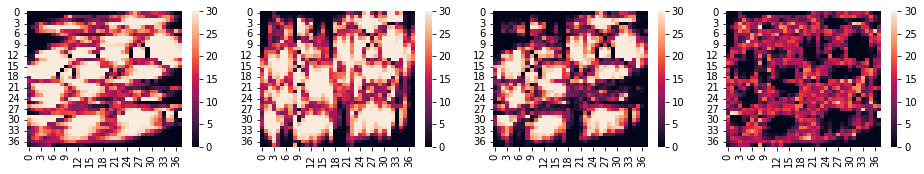

max fitness:  21.925847863256173 7.4624988774444425
max fitness:  21.87028709625213 7.518059644448485
max fitness:  22.054874030797624 7.333472709902992
max fitness:  22.057619874273154 7.330726866427462
max fitness:  21.8858062173583 7.502540523342315
max fitness:  22.00903529421208 7.379311446488536
max fitness:  22.209342069624174 7.1790046710764415
max fitness:  22.04468509693919 7.3436616437614255
max fitness:  22.044709080286633 7.343637660413982
max fitness:  22.023507266955523 7.364839473745093
max fitness:  22.108125276084714 7.280221464615902
max fitness:  21.789985646929832 7.598361093770784
max fitness:  22.00268587526639 7.385660865434225
max fitness:  22.045841266312195 7.342505474388421
max fitness:  21.968722643932303 7.419624096768313
max fitness:  21.97383141783974 7.414515322860876
max fitness:  22.39708582136222 6.991260919338394
max fitness:  22.082859745823498 7.305486994877118
max fitness:  22.07724858214538 7.311098158555236
max fitness:  22.03980967295099 7.348

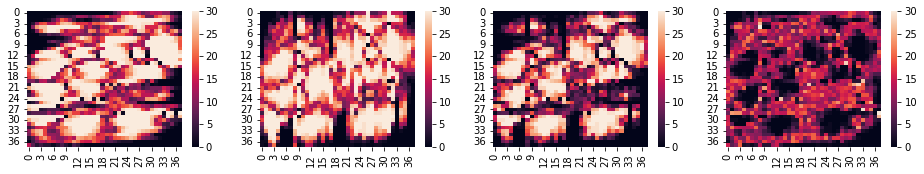

max fitness:  21.943141448385383 7.445205292315233
max fitness:  22.25357971396655 7.1347670267340675
max fitness:  21.94487841597666 7.4434683247239555
max fitness:  22.31132618922487 7.077020551475744
max fitness:  22.217277891890028 7.171068848810588
max fitness:  22.11436952351572 7.273977217184896
max fitness:  22.150679811823206 7.23766692887741
max fitness:  21.99927846777136 7.389068272929254
max fitness:  21.959955325551874 7.428391415148742
max fitness:  21.905491828171662 7.482854912528953
max fitness:  22.09595411247097 7.292392628229646
max fitness:  22.241480633472506 7.14686610722811
max fitness:  21.957749275177605 7.430597465523011
max fitness:  22.140034679975955 7.248312060724661
max fitness:  22.24727041317272 7.141076327527895
max fitness:  22.008658110525808 7.379688630174808
max fitness:  21.765253664075537 7.623093076625079
max fitness:  22.00821917575417 7.380127564946445
max fitness:  22.038694018431322 7.349652722269294
max fitness:  22.148909151011594 7.2394

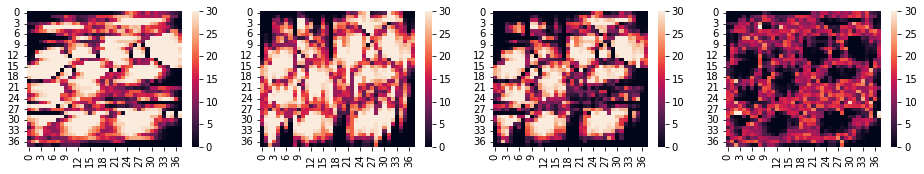

max fitness:  21.896734376815736 7.4916123638848795
max fitness:  21.966416613028194 7.421930127672422
max fitness:  22.07096154035598 7.317385200344635
max fitness:  22.274552354236686 7.11379438646393
max fitness:  22.031622175447993 7.356724565252623
max fitness:  22.07802345680677 7.3103232838938474
max fitness:  21.90916063736215 7.479186103338467
max fitness:  21.927113540489565 7.461233200211051
max fitness:  21.914961522347983 7.473385218352632
max fitness:  21.998645978125978 7.389700762574638
max fitness:  21.954503513760045 7.433843226940571
max fitness:  21.922168542282094 7.466178198418522
max fitness:  21.987150783959066 7.4011959567415495
max fitness:  21.843609777001113 7.544736963699503
max fitness:  21.810008440870163 7.5783382998304525
max fitness:  21.7601295379298 7.628217202770816
max fitness:  22.30754109088388 7.080805649816735
max fitness:  21.75234348319718 7.636003257503436
max fitness:  22.264981913296367 7.123364827404249
max fitness:  21.9450234576354 7.44

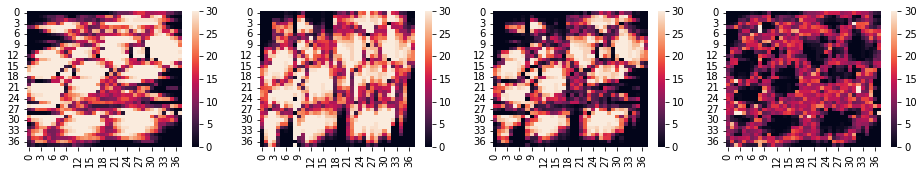

max fitness:  21.937082262204452 7.451264478496164
max fitness:  22.070953191490155 7.317393549210461
max fitness:  22.182576235399747 7.205770505300869
max fitness:  21.767563252499652 7.6207834882009635
max fitness:  21.988531579395868 7.399815161304748
max fitness:  21.833602327072782 7.554744413627834
max fitness:  21.96294352873545 7.425403211965165
max fitness:  21.870537190996465 7.51780954970415
max fitness:  21.923763605187876 7.46458313551274
max fitness:  21.759545967119998 7.628800773580618
max fitness:  21.762710860275376 7.625635880425239
max fitness:  21.76557211998467 7.622774620715944
max fitness:  22.04708982755488 7.341256913145735
max fitness:  21.791159586852125 7.597187153848491
max fitness:  21.958422243547783 7.429924497152832
max fitness:  21.82817419142603 7.560172549274586
max fitness:  21.5665972260995 7.821749514601116
max fitness:  22.016284264451496 7.37206247624912
max fitness:  21.831982858111157 7.556363882589459
max fitness:  21.8110260414853 7.577320

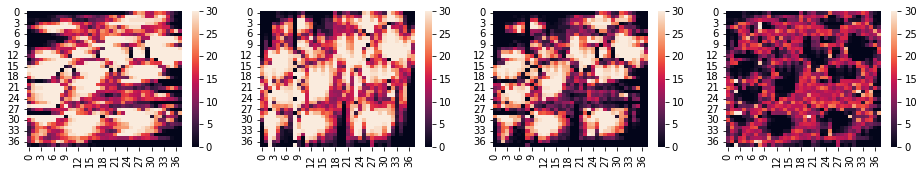

max fitness:  22.16149845657351 7.2268482841271044
max fitness:  21.649534399258382 7.738812341442234
max fitness:  21.812031334227772 7.576315406472844
max fitness:  21.91660409570595 7.4717426449946664
max fitness:  22.204207768119836 7.184138972580779
max fitness:  21.70692022739251 7.681426513308107
max fitness:  21.97419828719533 7.4141484535052875
max fitness:  21.875402057508072 7.5129446831925435
max fitness:  21.631356712429383 7.7569900282712325
max fitness:  21.858758436294437 7.529588304406179
max fitness:  21.889560930151752 7.498785810548863
max fitness:  21.915501439912177 7.472845300788439
max fitness:  21.827480368398067 7.560866372302549
max fitness:  21.7767053318658 7.611641408834817
max fitness:  21.94810748507804 7.440239255622576
max fitness:  22.16504963291657 7.223297107784045
max fitness:  21.959597146904034 7.4287495937965815
max fitness:  21.890152097708132 7.498194642992484
max fitness:  21.897912865833817 7.490433874866799
max fitness:  22.06182179778574 7

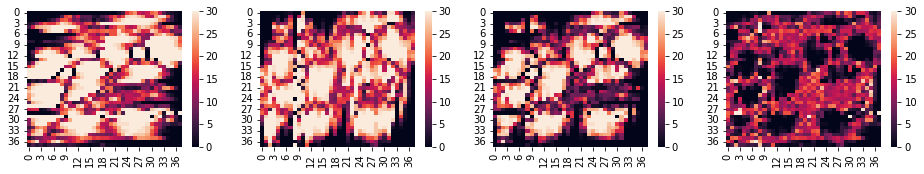

max fitness:  22.059153728873625 7.329193011826991
max fitness:  21.990870555937406 7.39747618476321
max fitness:  22.0439440355707 7.344402705129916
max fitness:  22.129817877406015 7.2585288632946
max fitness:  22.132076595016418 7.256270145684198
max fitness:  21.92486774020893 7.4634790004916844
max fitness:  21.998654005518866 7.38969273518175
max fitness:  22.20069899217028 7.187647748530335
max fitness:  21.953104406273503 7.435242334427112
max fitness:  22.1044559886397 7.283890752060916
max fitness:  22.155045807354284 7.233300933346332
max fitness:  22.16909670618883 7.219250034511784
max fitness:  22.02899107944958 7.359355661251037
max fitness:  22.379860928092334 7.008485812608281
max fitness:  22.150626520392063 7.237720220308553
max fitness:  22.089065538790592 7.2992812019100235
max fitness:  22.008103229376225 7.380243511324391
max fitness:  21.8972946529866 7.491052087714017
max fitness:  21.987081634864857 7.401265105835758
max fitness:  22.128609422804736 7.25973731

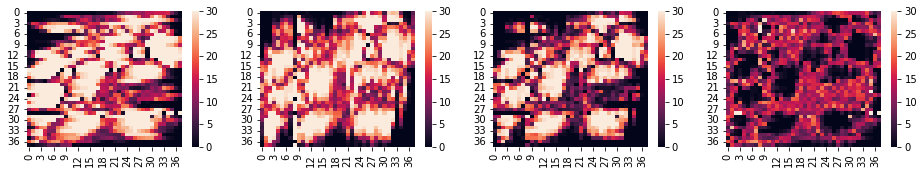

max fitness:  21.946137022236996 7.442209718463619
max fitness:  21.940748089517704 7.447598651182911
max fitness:  21.660419902842804 7.727926837857812
max fitness:  21.54367232673043 7.844674413970186
max fitness:  21.615753431577513 7.772593309123103
max fitness:  21.6307234902918 7.757623250408816
max fitness:  21.998429890861217 7.389916849839398
max fitness:  21.807037794995697 7.581308945704919
max fitness:  21.90552955021992 7.482817190480695
max fitness:  21.849925283008417 7.538421457692198
max fitness:  21.807647949963375 7.580698790737241
max fitness:  21.957168177179305 7.431178563521311
max fitness:  21.844646942290964 7.543699798409651
max fitness:  21.953390756085863 7.434955984614753
max fitness:  21.804604405138168 7.583742335562448
max fitness:  21.94905607392619 7.439290666774426
max fitness:  21.804526783368402 7.583819957332214
max fitness:  21.862598571229896 7.52574816947072
max fitness:  21.6632697925391 7.725076948161515
max fitness:  21.89938460041152 7.48896

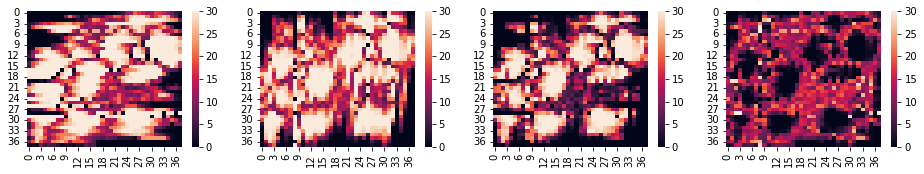

max fitness:  22.029036597920964 7.359310142779652
max fitness:  22.588072965600354 6.800273775100262
max fitness:  22.027737074196768 7.360609666503848
max fitness:  21.96253471322248 7.425812027478134
max fitness:  21.881573025098756 7.5067737156018595
max fitness:  21.838080548372314 7.550266192328301
max fitness:  22.12937117216102 7.258975568539597
max fitness:  21.82201530529016 7.566331435410454
max fitness:  21.914920235813995 7.473426504886621
max fitness:  22.08703671903406 7.301310021666556
max fitness:  22.037830383788734 7.350516356911882
max fitness:  22.109029816213766 7.279316924486849
max fitness:  21.856916588469968 7.531430152230648
max fitness:  22.020912393867654 7.367434346832962
max fitness:  22.02137153313977 7.366975207560845
max fitness:  21.947668904722306 7.44067783597831
max fitness:  22.124919050120024 7.263427690580592
max fitness:  21.89607228211403 7.492274458586586
max fitness:  22.035762541047635 7.352584199652981
max fitness:  22.007364897575016 7.38

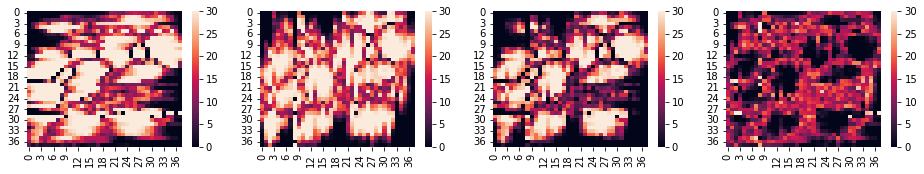

max fitness:  21.995938384579826 7.392408356120789
max fitness:  22.07331762080579 7.315029119894827
max fitness:  22.084863425367192 7.303483315333423
max fitness:  22.06344560354906 7.324901137151556
max fitness:  21.940801419394997 7.447545321305618
max fitness:  22.10848957232305 7.279857168377564
max fitness:  22.070650100658895 7.317696640041721
max fitness:  22.163613654046745 7.22473308665387
max fitness:  22.023187733345708 7.365159007354908
max fitness:  21.83526603437796 7.553080706322657
max fitness:  22.0194449757062 7.3689017649944155
max fitness:  21.944769747490874 7.443576993209742
max fitness:  22.426734455523217 6.961612285177399
max fitness:  21.844703851577457 7.543642889123159
max fitness:  22.07281143458082 7.315535306119795
max fitness:  21.636802501231216 7.7515442394694
max fitness:  21.89254114699131 7.495805593709306
max fitness:  21.662413602240328 7.725933138460288
max fitness:  21.68782286891522 7.700523871785396
max fitness:  21.71690538998261 7.67144135

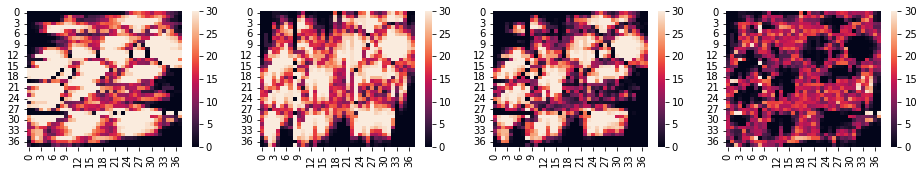

max fitness:  21.677724154370296 7.71062258633032
max fitness:  21.864713687729704 7.5236330529709115
max fitness:  22.01262747569926 7.375719265001354
max fitness:  22.136939371327145 7.251407369373471
max fitness:  21.848559532217834 7.539787208482782
max fitness:  21.9140310708462 7.474315669854416
max fitness:  21.96967387425779 7.418672866442826
max fitness:  21.85656168064221 7.531785060058407
max fitness:  21.918552375049153 7.469794365651463
max fitness:  22.15598064614117 7.2323660945594455
max fitness:  21.948651488358188 7.439695252342428
max fitness:  22.034687097678074 7.353659643022542
max fitness:  22.066375233083548 7.321971507617068
max fitness:  21.799646997377415 7.5886997433232
max fitness:  21.927953404452 7.460393336248615
max fitness:  21.829956465253055 7.558390275447561
max fitness:  22.094585729027038 7.293761011673578
max fitness:  21.85951752948992 7.528829211210695
max fitness:  22.126623001369005 7.261723739331611
max fitness:  21.935511140826996 7.4528355

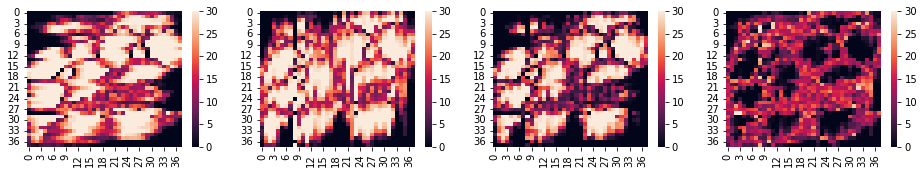

max fitness:  22.032140653359722 7.356206087340894
max fitness:  22.135048349162226 7.25329839153839
max fitness:  22.13757096755409 7.250775773146525
max fitness:  22.09345895418102 7.294887786519595
max fitness:  21.978747696134803 7.409599044565812
max fitness:  22.03123754758259 7.357109193118024
max fitness:  22.473516907681418 6.914829833019198
max fitness:  22.01653365034989 7.371813090350727
max fitness:  22.005535272673256 7.382811468027359
max fitness:  21.923942585021436 7.46440415567918
max fitness:  21.895977970332066 7.49236877036855
max fitness:  21.99266838250845 7.395678358192164
max fitness:  21.792566042619455 7.59578069808116
max fitness:  21.822445728884887 7.565901011815729
max fitness:  21.995320246053392 7.3930264946472235
max fitness:  21.995333104665775 7.393013636034841
max fitness:  22.078671669096966 7.30967507160365
max fitness:  22.079248487778873 7.309098252921743
max fitness:  22.102977153331217 7.285369587369399
max fitness:  21.87755224879904 7.510794

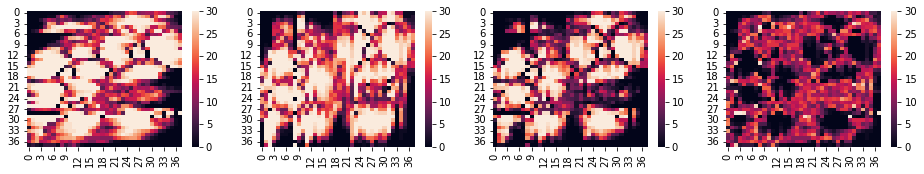

max fitness:  22.11952404689334 7.268822693807277
max fitness:  22.110078477858067 7.278268262842548
max fitness:  22.470887268813215 6.917459471887401
max fitness:  21.85651260591863 7.531834134781985
max fitness:  21.794046353935045 7.594300386765571
max fitness:  21.875966543902027 7.512380196798588
max fitness:  21.731530677748466 7.656816062952149
max fitness:  21.810963085156814 7.577383655543802
max fitness:  21.994091304677443 7.3942554360231725
max fitness:  22.24995441980737 7.138392320893246
max fitness:  22.03310803325226 7.355238707448354
max fitness:  22.05148088405132 7.336865856649297
max fitness:  22.08251394921112 7.305832791489497
max fitness:  22.261499513786735 7.126847226913881
max fitness:  22.149910253185624 7.238436487514992
max fitness:  21.873451398757368 7.514895341943248
max fitness:  22.372523495296726 7.01582324540389
max fitness:  22.138287294239287 7.250059446461329
max fitness:  22.21688268814866 7.171464052551954
max fitness:  21.7873566438474 7.60099

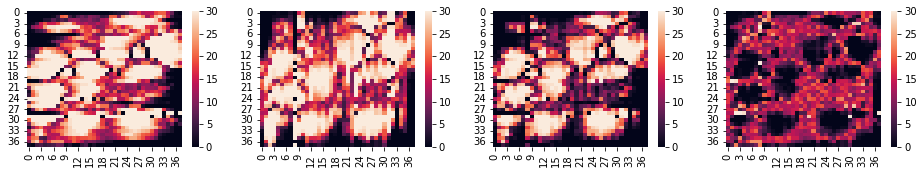

max fitness:  22.10112170751114 7.2872250331894755
max fitness:  22.242971000134908 7.145375740565708
max fitness:  21.892275811513713 7.496070929186903
max fitness:  22.04365248119792 7.344694259502695
max fitness:  22.44675836269066 6.941588378009957
max fitness:  22.036559507434156 7.35178723326646
max fitness:  22.03338568419048 7.354961056510135
max fitness:  22.014499638628557 7.373847102072059
max fitness:  21.845918726638622 7.5424280140619935
max fitness:  22.066211087410203 7.322135653290413
max fitness:  22.202012983734257 7.186333756966359
max fitness:  21.972914291343816 7.4154324493568
max fitness:  22.163738043145052 7.2246086975555635
max fitness:  22.24894361247405 7.139403128226565
max fitness:  22.246045635855523 7.142301104845092
max fitness:  22.194563151484928 7.193783589215688
max fitness:  22.218679594495192 7.169667146205423
max fitness:  22.402019451306078 6.986327289394538
max fitness:  22.133269211065276 7.25507752963534
max fitness:  22.133751138018795 7.25

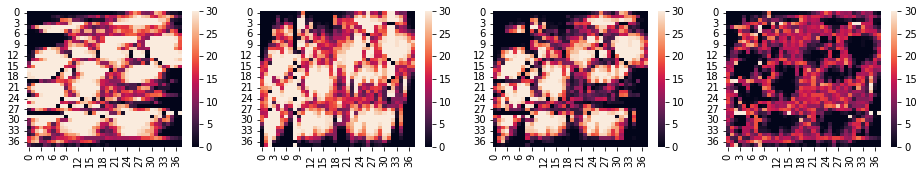

max fitness:  22.061266080770345 7.327080659930271
max fitness:  22.12848703831231 7.2598597023883045
max fitness:  21.84777669866247 7.540570042038144
max fitness:  21.902791088339473 7.485555652361143
max fitness:  22.090891834686566 7.29745490601405
max fitness:  22.154945773441533 7.233400967259083
max fitness:  22.163642262273036 7.224704478427579
max fitness:  22.080790679334523 7.307556061366093
max fitness:  22.03585304989285 7.352493690807766
max fitness:  22.17463778390161 7.213708956799007
max fitness:  22.087344365057152 7.301002375643463
max fitness:  22.06311083912256 7.325235901578054
max fitness:  21.938401278687458 7.449945462013158
max fitness:  22.125216683768315 7.263130056932301
max fitness:  21.930150319534825 7.458196421165791
max fitness:  22.06967060738324 7.318676133317375
max fitness:  22.3290176871417 7.0593290535589155
max fitness:  22.0213435806018 7.367003160098815
max fitness:  22.069225036787138 7.319121703913478
max fitness:  21.97781997385225 7.410526

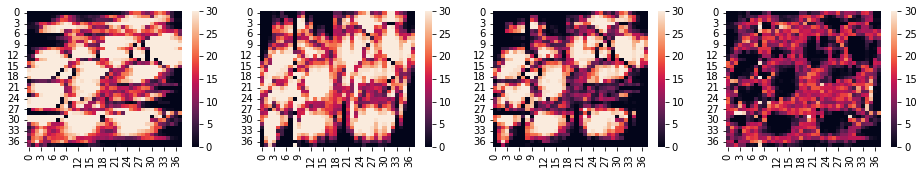

max fitness:  22.21791575473211 7.170430985968505
max fitness:  22.13739248005333 7.250954260647287
max fitness:  22.121460839935065 7.266885900765551
max fitness:  22.11195857273029 7.276388167970325
max fitness:  21.87935584807882 7.508990892621796
max fitness:  22.31095600827553 7.077390732425087
max fitness:  22.356766932492107 7.031579808208509
max fitness:  22.07565187288271 7.312694867817907
max fitness:  22.059334611299352 7.329012129401264
max fitness:  22.217226583584626 7.17112015711599
max fitness:  22.286882986871994 7.101463753828622
max fitness:  22.033588646931168 7.354758093769448
max fitness:  22.296369759864675 7.091976980835941
max fitness:  22.255096052182726 7.13325068851789
max fitness:  22.070074415091597 7.318272325609019
max fitness:  22.073744156097593 7.314602584603023
max fitness:  21.977348704360985 7.410998036339631
max fitness:  22.587981239094482 6.800365501606134
max fitness:  21.883389589020293 7.504957151680323
max fitness:  22.439865048390306 6.9484

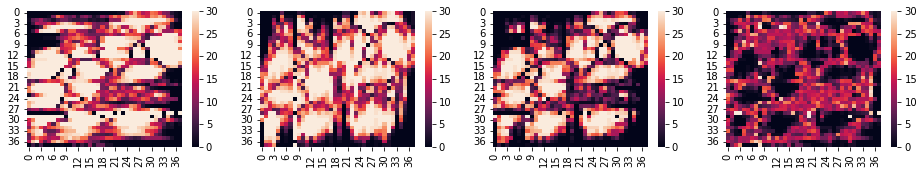

max fitness:  22.137261099537113 7.2510856411635025
max fitness:  22.335630971924544 7.052715768776071
max fitness:  22.305465610442397 7.082881130258219
max fitness:  22.245659363029745 7.142687377670871
max fitness:  22.368618727937857 7.019728012762759
max fitness:  22.15341172110088 7.234935019599735
max fitness:  22.349371076606403 7.038975664094213
max fitness:  22.32556662265574 7.062780118044877
max fitness:  22.20256255115366 7.185784189546954
max fitness:  22.218473816278742 7.169872924421874
max fitness:  22.26154001072962 7.126806729970994
max fitness:  22.166422140196815 7.221924600503801
max fitness:  22.195614391509345 7.192732349191271
max fitness:  22.217926092656878 7.170420648043738
max fitness:  22.13320139034176 7.255145350358855
max fitness:  22.153583963352062 7.234762777348553
max fitness:  22.137717619799847 7.2506291209007685
max fitness:  22.061753215139092 7.326593525561524
max fitness:  22.422140169245136 6.96620657145548
max fitness:  22.609494846589897 6.

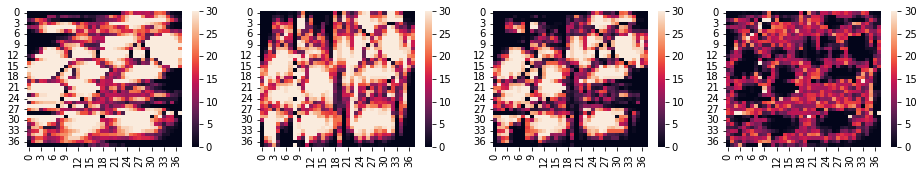

max fitness:  22.036442892169028 7.351903848531588
max fitness:  21.995534278559642 7.392812462140974
max fitness:  22.171211854361736 7.217134886338879
max fitness:  21.76877200956145 7.619574731139167
max fitness:  21.8139967111986 7.574350029502014
max fitness:  21.85918298111465 7.529163759585966
max fitness:  21.967871013132637 7.420475727567979
max fitness:  21.911013417251933 7.477333323448683
max fitness:  21.85806175968895 7.530284981011665
max fitness:  21.823925337778107 7.564421402922509
max fitness:  22.060488661838605 7.327858078862011
max fitness:  22.058717354487534 7.329629386213082
max fitness:  21.776204419049904 7.612142321650712
max fitness:  21.792212201335044 7.596134539365572
max fitness:  21.747687588699762 7.640659152000854
max fitness:  21.86014735987544 7.528199380825175
max fitness:  21.702069326029218 7.686277414671398
max fitness:  21.710544015143032 7.677802725557584
max fitness:  21.741449071831457 7.646897668869158
max fitness:  21.801768113067858 7.58

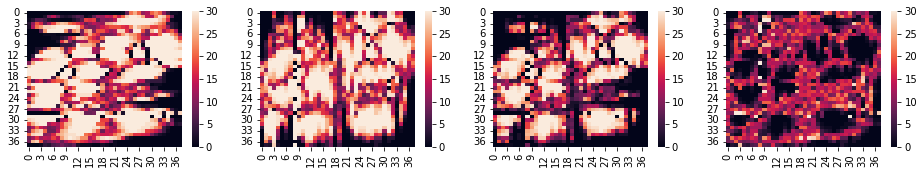

max fitness:  21.777452425925556 7.610894314775059
max fitness:  21.961327201406377 7.427019539294239
max fitness:  22.054963033357993 7.333383707342623
max fitness:  22.07156472020042 7.316782020500195
max fitness:  21.79196291891615 7.5963838217844675
max fitness:  22.145370957389126 7.24297578331149
max fitness:  21.801087932492635 7.587258808207981
max fitness:  21.855556993252037 7.532789747448579
max fitness:  22.105165947132924 7.283180793567691
max fitness:  21.854003249527537 7.534343491173079
max fitness:  21.751294722797454 7.637052017903162
max fitness:  21.770720889493553 7.6176258512070625
max fitness:  21.808449635833707 7.579897104866909
max fitness:  21.78948472583755 7.598862014863066
max fitness:  22.146451953086753 7.241894787613862
max fitness:  21.877627619178977 7.510719121521639
max fitness:  22.22253489892308 7.165811841777536
max fitness:  22.21839143266172 7.169955308038897
max fitness:  22.13982466574499 7.248522074955627
max fitness:  21.880859409734285 7.5

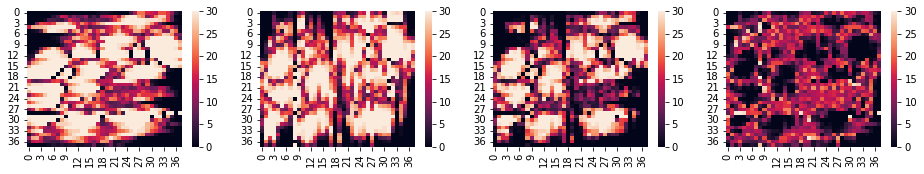

max fitness:  22.11351000782669 7.274836732873926
max fitness:  21.929248056981102 7.459098683719514
max fitness:  22.09580621654149 7.292540524159126
max fitness:  22.24171796163772 7.1466287790628975
max fitness:  21.987944619826703 7.400402120873913
max fitness:  22.129958787650942 7.258387953049674
max fitness:  22.024759977868847 7.363586762831769
max fitness:  22.213110210030372 7.175236530670244
max fitness:  21.9704237378579 7.417923002842716
max fitness:  21.958316161498153 7.430030579202462
max fitness:  22.028693661743354 7.359653078957262
max fitness:  22.061626373737948 7.326720366962668
max fitness:  21.868759471697473 7.519587269003143
max fitness:  21.784365088867723 7.603981651832893
max fitness:  22.072100062894314 7.316246677806301
max fitness:  22.071925154184463 7.316421586516153
max fitness:  22.03479089470264 7.3535558459979775
max fitness:  22.09850009546057 7.289846645240047
max fitness:  21.940518629487162 7.447828111213454
max fitness:  22.170113104020587 7.2

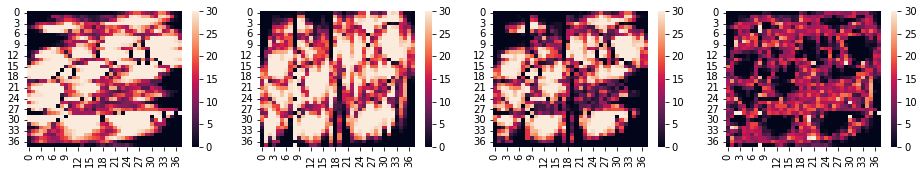

max fitness:  22.0481407530431 7.340205987657516
max fitness:  22.068744474056885 7.319602266643731
max fitness:  22.20318440413874 7.185162336561877
max fitness:  22.236580624941773 7.151766115758843
max fitness:  22.05186471642962 7.336482024270996
max fitness:  21.897123882341184 7.491222858359432
max fitness:  22.019132495601554 7.369214245099062
max fitness:  22.067377302990167 7.320969437710449
max fitness:  22.2084660775881 7.179880663112517
max fitness:  22.115698435187063 7.2726483055135525
max fitness:  22.199040858739636 7.18930588196098
max fitness:  22.126919360114858 7.261427380585758
max fitness:  21.84845589160978 7.539890849090835
max fitness:  21.883781071333637 7.504565669366979
max fitness:  22.239961605744995 7.148385134955621
max fitness:  22.227557612985912 7.160789127714704
max fitness:  22.267487975844247 7.120858764856369
max fitness:  22.30501906894916 7.083327671751455
max fitness:  22.187076651829774 7.201270088870842
max fitness:  21.945421350166853 7.4429

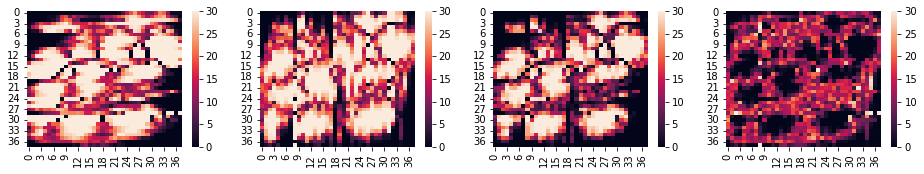

max fitness:  22.18164846472684 7.206698275973775
max fitness:  22.40307735335992 6.985269387340697
max fitness:  22.256881882586324 7.131464858114292
max fitness:  22.26054082330478 7.127805917395836
max fitness:  22.15156808832412 7.236778652376497
max fitness:  22.151983111575937 7.2363636291246785
max fitness:  22.072254653747887 7.316092086952729
max fitness:  22.167672747669773 7.220673993030843
max fitness:  21.945950651179565 7.442396089521051
max fitness:  22.11808771435283 7.270259026347787
max fitness:  22.105200412069806 7.28314632863081
max fitness:  22.33278458449529 7.055562156205326
max fitness:  22.448623306728024 6.939723433972592
max fitness:  22.03360485086796 7.354741889832656
max fitness:  21.99125726623624 7.3970894744643765
max fitness:  22.174014135557037 7.2143326051435785
max fitness:  22.04460530149098 7.343741439209637
max fitness:  22.155958983212585 7.232387757488031
max fitness:  21.99463379453446 7.393712946166154
max fitness:  21.955634053532243 7.4327

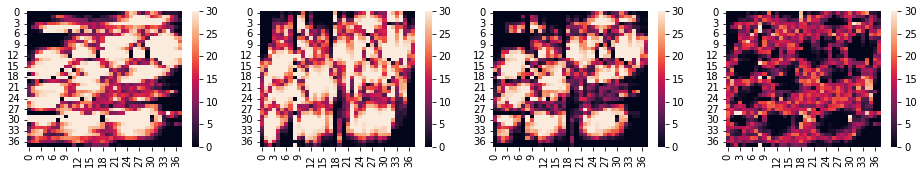

max fitness:  21.91026437887247 7.478082361828147
max fitness:  22.15221352395185 7.236133216748765
max fitness:  21.86036364301104 7.5279830976895745
max fitness:  21.832376854368466 7.55596988633215
max fitness:  22.0103191246943 7.378027616006317
max fitness:  21.824716965864944 7.563629774835672
max fitness:  21.992223296834794 7.396123443865822
max fitness:  21.839122409068292 7.549224331632324
max fitness:  22.106697358358694 7.2816493823419215
max fitness:  21.939816717313875 7.448530023386741
max fitness:  21.969496605490672 7.418850135209944
max fitness:  22.429565738491966 6.958781002208649
max fitness:  21.80596330910616 7.5823834315944545
max fitness:  22.089910902800643 7.298435837899973
max fitness:  21.731466790903966 7.65687994979665
max fitness:  21.932364404874733 7.455982335825883
max fitness:  21.98197940979484 7.406367330905777
max fitness:  22.077704823610013 7.310641917090603
max fitness:  21.950057216007956 7.43828952469266
max fitness:  21.93212590529197 7.4562

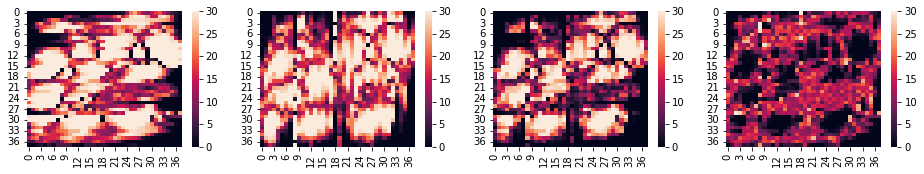

max fitness:  21.88753352081305 7.500813219887565
max fitness:  21.997077908474925 7.391268832225691
max fitness:  21.92366686116567 7.464679879534945
max fitness:  21.85565910508358 7.532687635617037
max fitness:  21.925473922669596 7.46287281803102
max fitness:  22.032711429687943 7.355635311012673
max fitness:  22.09089234128927 7.297454399411347
max fitness:  22.038144524495024 7.3502022162055916
max fitness:  21.924611658894293 7.463735081806323
max fitness:  21.907142135890552 7.481204604810063
max fitness:  22.334688758405118 7.053657982295498
max fitness:  21.952922078680253 7.435424662020363
max fitness:  21.984741899710492 7.403604840990123
max fitness:  21.966023802835345 7.422322937865271
max fitness:  22.071034168261384 7.317312572439231
max fitness:  21.87000922578573 7.5183375149148866
max fitness:  21.950312143996655 7.438034596703961
max fitness:  22.030188133337425 7.35815860736319
max fitness:  21.777826050042325 7.610520690658291
max fitness:  21.876748970444325 7.5

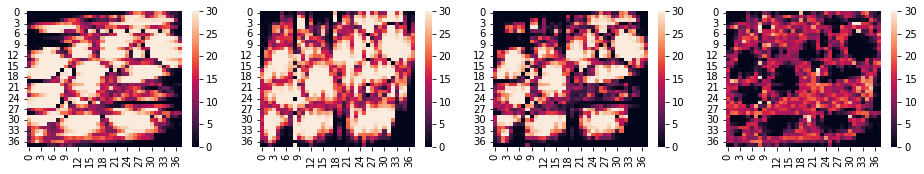

max fitness:  22.222074374055843 7.1662723666447725
max fitness:  21.92103425285341 7.467312487847206
max fitness:  22.054885043934995 7.333461696765621
max fitness:  22.11246400431365 7.275882736386965
max fitness:  22.03569178184492 7.352654958855695
max fitness:  22.120012434047794 7.268334306652822
max fitness:  21.942945086094163 7.445401654606453
max fitness:  21.92756609860324 7.460780642097376
max fitness:  22.380764178308226 7.00758256239239
max fitness:  21.860723844188723 7.527622896511893
max fitness:  21.942225730468422 7.4461210102321935
max fitness:  21.876748866201886 7.5115978744987295
max fitness:  22.034869789183404 7.353476951517212
max fitness:  22.18456030444107 7.203786436259545
max fitness:  22.014112712427305 7.37423402827331
max fitness:  22.097036856758564 7.291309883942052
max fitness:  22.115738037017437 7.272608703683179
max fitness:  22.048529630828547 7.339817109872069
max fitness:  22.16393519120061 7.2244115495000045
max fitness:  22.113622523589733 7.

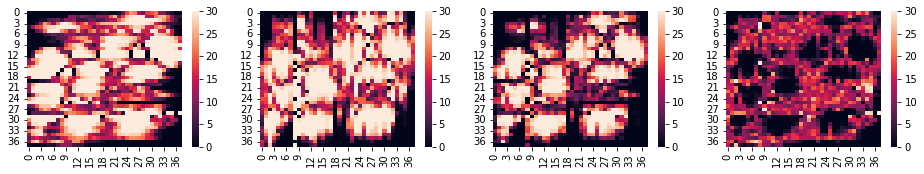

max fitness:  22.202366414854406 7.185980325846209
max fitness:  22.319924761816 7.068421978884615
max fitness:  22.44995830318699 6.938388437513627
max fitness:  22.53085558783205 6.857491152868565
max fitness:  22.252956638097807 7.135390102602809
max fitness:  22.119732830349456 7.26861391035116
max fitness:  22.172600392518994 7.2157463481816215
max fitness:  22.20766745560214 7.180679285098474
max fitness:  22.16848335178926 7.219863388911357
max fitness:  22.3275655775221 7.060781163178515
max fitness:  22.43198503983423 6.956361700866385
max fitness:  22.1853706170723 7.202976123628314
max fitness:  22.052528375998296 7.33581836470232
max fitness:  22.05918945907515 7.329157281625466
max fitness:  22.3740540010701 7.014292739630516
max fitness:  22.103024194141554 7.285322546559062
max fitness:  22.152714045960444 7.235632694740172
max fitness:  22.142404165921505 7.245942574779111
max fitness:  22.107752187312784 7.280594553387832
max fitness:  22.039698740348463 7.348648000352

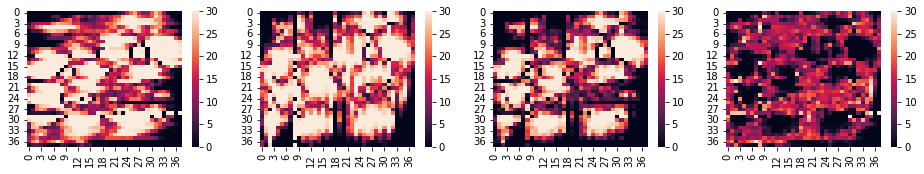

max fitness:  22.138465946487464 7.249880794213151
max fitness:  22.012223651190887 7.376123089509729
max fitness:  22.15426699529653 7.234079745404085
max fitness:  22.129564683275596 7.2587820574250195
max fitness:  22.101925691627258 7.286421049073358
max fitness:  22.40046964062234 6.987877100078276
max fitness:  22.226062184068333 7.162284556632283
max fitness:  22.187338689783985 7.201008050916631
max fitness:  22.373175203911213 7.015171536789403
max fitness:  22.120431590502083 7.267915150198533
max fitness:  22.046017524530292 7.342329216170324
max fitness:  22.162899034591536 7.22544770610908
max fitness:  22.170187315570296 7.21815942513032
max fitness:  22.27757289021919 7.110773850481426
max fitness:  22.24628751684665 7.142059223853966
max fitness:  22.179854137509352 7.208492603191264
max fitness:  22.091834615447056 7.29651212525356
max fitness:  22.227531150374677 7.160815590325939
max fitness:  22.11319068006582 7.275156060634796
max fitness:  22.17231957448354 7.2160

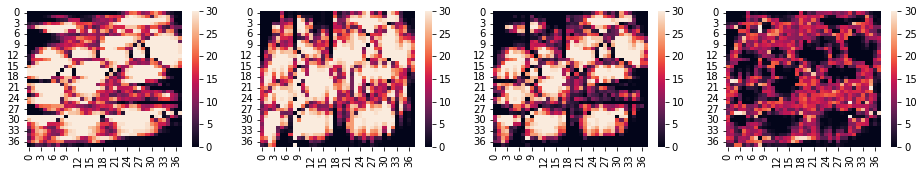

max fitness:  22.16568396873007 7.222662771970544
max fitness:  22.37398847834404 7.014358262356577
max fitness:  22.021684034266666 7.366662706433949
max fitness:  22.181932487848762 7.206414252851854
max fitness:  21.94744488856596 7.440901852134655
max fitness:  21.833938110272115 7.554408630428501
max fitness:  22.134629756958805 7.2537169837418105
max fitness:  21.957227410911443 7.431119329789173
max fitness:  22.003892483753415 7.384454256947201
max fitness:  22.075340584522774 7.313006156177842
max fitness:  21.86347655815026 7.524870182550355
max fitness:  21.988315034522067 7.400031706178549
max fitness:  22.055887338778838 7.332459401921778
max fitness:  21.965717850904582 7.422628889796034
max fitness:  22.40185450938113 6.986492231319485
max fitness:  22.13940134246063 7.248945398239986
max fitness:  21.922829224237187 7.465517516463429
max fitness:  22.05141419184215 7.336932548858467
max fitness:  22.137059316166233 7.251287424534382
max fitness:  22.015282912327663 7.37

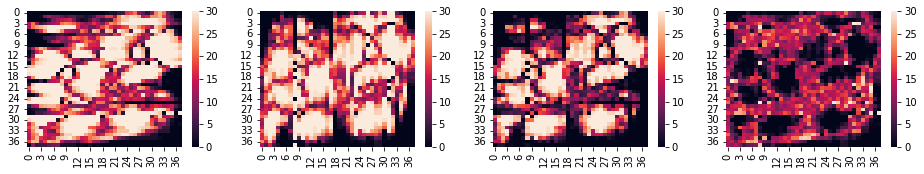

max fitness:  22.077041454268972 7.311305286431644
max fitness:  22.320582323883908 7.067764416816708
max fitness:  22.256352370673895 7.131994370026721
max fitness:  22.053966647139486 7.33438009356113
max fitness:  22.227512249798412 7.160834490902204
max fitness:  22.16972647157417 7.218620269126447
max fitness:  22.110907089625307 7.2774396510753085
max fitness:  22.46812947046143 6.920217270239185
max fitness:  22.168255730899386 7.22009100980123
max fitness:  22.23958123929712 7.148765501403496
max fitness:  22.23350909935651 7.1548376413441055
max fitness:  22.368787771903023 7.019558968797593
max fitness:  22.160301125530772 7.228045615169844
max fitness:  22.141463026448065 7.246883714252551
max fitness:  22.092268314649292 7.296078426051324
max fitness:  21.983430277803926 7.40491646289669
max fitness:  22.330549792363158 7.057796948337458
max fitness:  22.044292062630255 7.344054678070361
max fitness:  22.032383007647265 7.3559637330533505
max fitness:  22.05458251036353 7.3

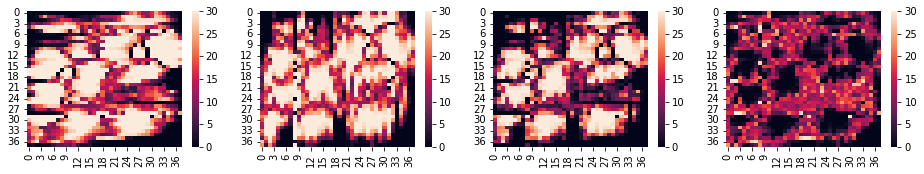

max fitness:  22.152120815754998 7.236225924945618
max fitness:  22.29267591843506 7.095670822265557
max fitness:  22.069481850315427 7.318864890385189
max fitness:  22.059223029340124 7.3291237113604915
max fitness:  22.241284847822293 7.147061892878323
max fitness:  22.06308666793555 7.325260072765065
max fitness:  22.197392275721608 7.190954464979008
max fitness:  22.102858043649714 7.285488697050901
max fitness:  22.066577061109225 7.321769679591391
max fitness:  22.32488538483264 7.063461355867975
max fitness:  22.545913839979455 6.84243290072116
max fitness:  22.361740129636104 7.026606611064512
max fitness:  22.09097594529768 7.297370795402937
max fitness:  22.234310673862367 7.154036066838248
max fitness:  22.121762492326496 7.266584248374119
max fitness:  22.31815911762063 7.070187623079985
max fitness:  22.06600549530647 7.322341245394146
max fitness:  22.081216861366464 7.307129879334152
max fitness:  22.099539770983256 7.28880696971736
max fitness:  22.12712052971249 7.2612

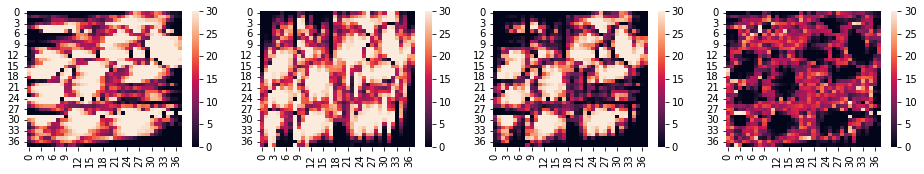

max fitness:  21.89464069206859 7.493706048632024
max fitness:  21.874204737150418 7.514142003550198
max fitness:  22.058084491543735 7.330262249156881
max fitness:  21.86156714629773 7.5267795944028855
max fitness:  21.997507757894798 7.390838982805818
max fitness:  21.9301431852488 7.458203555451817
max fitness:  22.46818902456041 6.920157716140206
max fitness:  22.336145664284913 7.052201076415702
max fitness:  22.02603531349441 7.362311427206205
max fitness:  22.012606326322715 7.375740414377901
max fitness:  21.95086336276652 7.437483377934097
max fitness:  21.850505649405193 7.537841091295423
max fitness:  21.6552671009387 7.733079639761915
max fitness:  21.664503961741783 7.723842778958833
max fitness:  21.974489315393036 7.4138574253075795
max fitness:  21.810673976111758 7.577672764588858
max fitness:  21.771871438042574 7.616475302658042
max fitness:  21.795989251284023 7.592357489416592
max fitness:  21.769915089576518 7.618431651124098
max fitness:  21.839837712667574 7.548

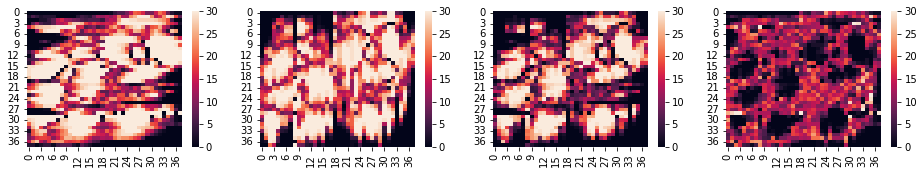

max fitness:  22.016049994237786 7.37229674646283
max fitness:  21.975638586162013 7.412708154538603
max fitness:  22.06179444013449 7.326552300566124
max fitness:  21.926904577997675 7.461442162702941
max fitness:  22.22939779816352 7.158948942537094
max fitness:  21.98553617555636 7.402810565144257
max fitness:  22.087962493653283 7.300384247047333
max fitness:  22.260774862218824 7.127571878481792
max fitness:  21.82713484860421 7.561211892096406
max fitness:  22.038367347517102 7.349979393183514
max fitness:  22.096880127586495 7.291466613114121
max fitness:  22.117956776912116 7.270389963788499
max fitness:  22.204570156145795 7.1837765845548205
max fitness:  22.115975984742335 7.272370755958281
max fitness:  22.069297785543085 7.31904895515753
max fitness:  21.980570291636603 7.407776449064013
max fitness:  21.98778165008287 7.4005650906177465
max fitness:  22.149389780405762 7.238956960294853
max fitness:  22.052358393831618 7.335988346868998
max fitness:  22.144271183812183 7.2

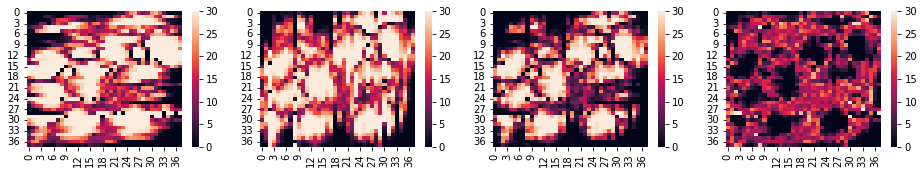

max fitness:  22.03681107525081 7.351535665449806
max fitness:  21.717652317664218 7.670694423036398
max fitness:  21.9025647843783 7.485781956322317
max fitness:  21.85978269266409 7.528564048036525
max fitness:  21.83365965077022 7.554687089930397
max fitness:  22.017059244516194 7.371287496184422
max fitness:  22.12389261084661 7.2644541298540055
max fitness:  21.94718858888062 7.4411581518199945
max fitness:  21.764533483459587 7.623813257241029
max fitness:  21.87306716594175 7.515279574758864
max fitness:  22.05440205385973 7.333944686840887
max fitness:  22.016133026071355 7.372213714629261
max fitness:  22.149736814519194 7.238609926181422
max fitness:  22.221518212485627 7.166828528214989
max fitness:  22.36217142559199 7.0261753151086275
max fitness:  22.047893165151798 7.340453575548818
max fitness:  22.166490704765913 7.221856035934703
max fitness:  21.968198262245846 7.42014847845477
max fitness:  22.165101132705107 7.2232456079955085
max fitness:  22.150425663214204 7.237

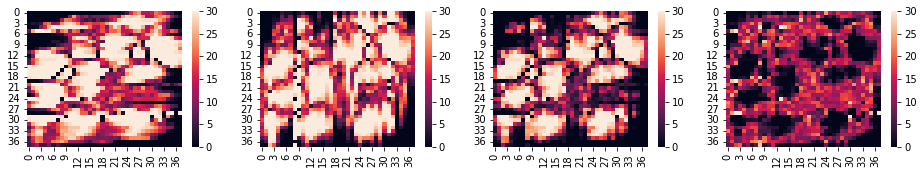

max fitness:  22.200240293311367 7.188106447389249
max fitness:  21.939612325109042 7.448734415591574
max fitness:  22.015305308801185 7.373041431899431
max fitness:  21.900974669546216 7.4873720711544
max fitness:  22.113683327877112 7.274663412823504
max fitness:  22.021698326154425 7.366648414546191
max fitness:  22.134255457105645 7.2540912835949705
max fitness:  22.296367528285657 7.091979212414959
max fitness:  22.14159348587345 7.246753254827166
max fitness:  22.132718475778148 7.255628264922468
max fitness:  22.24628661092286 7.142060129777757
max fitness:  22.126642320333154 7.261704420367462
max fitness:  22.271142768311165 7.117203972389451
max fitness:  22.156413095096074 7.231933645604542
max fitness:  22.293702668370138 7.094644072330478
max fitness:  22.12880378391388 7.259542956786735
max fitness:  21.828338720483575 7.56000802021704
max fitness:  21.996281422919953 7.392065317780663
max fitness:  22.08073553407087 7.307611206629744
max fitness:  22.175137204668726 7.21

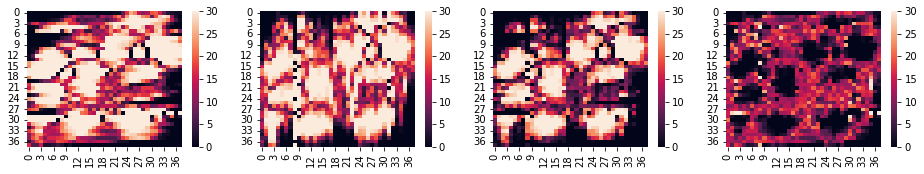

max fitness:  22.471104076924973 6.917242663775642
max fitness:  22.31881113050317 7.069535610197445
max fitness:  22.164774654111913 7.223572086588703
max fitness:  22.103041332440863 7.285305408259752
max fitness:  22.252550084885108 7.135796655815508
max fitness:  22.265910723321454 7.122436017379162
max fitness:  22.054212304453685 7.334134436246931
max fitness:  22.087761385012662 7.300585355687954
max fitness:  22.227726122047088 7.160620618653528
max fitness:  21.942890336130123 7.445456404570493
max fitness:  22.14940238634504 7.238944354355574
max fitness:  22.034495453558307 7.353851287142309
max fitness:  22.129615836219486 7.25873090448113
max fitness:  22.251830327006843 7.136516413693773
max fitness:  22.08866115222206 7.299685588478557
max fitness:  21.969686336379194 7.418660404321422
max fitness:  21.941002887248214 7.447343853452402
max fitness:  21.875026570189103 7.513320170511513
max fitness:  21.902105266120035 7.486241474580581
max fitness:  22.051864699764916 7.

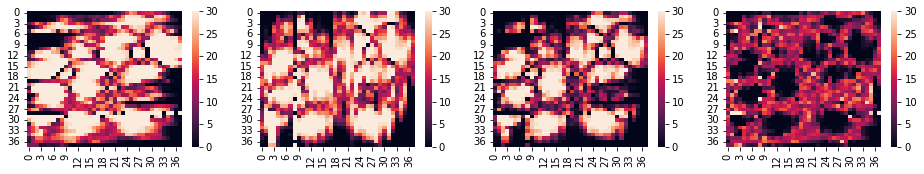

max fitness:  22.022785750942774 7.365560989757842
max fitness:  21.780859699089966 7.60748704161065
max fitness:  21.872459928869176 7.5158868118314395
max fitness:  21.828528236977803 7.559818503722813
max fitness:  21.952011933979392 7.436334806721224
max fitness:  21.84676090296947 7.541585837731144
max fitness:  21.792461156674893 7.595885584025723
max fitness:  21.914907527868806 7.47343921283181
max fitness:  21.818793206117327 7.569553534583289
max fitness:  22.49097326084096 6.897373479859656
max fitness:  21.787978000666335 7.6003687400342805
max fitness:  22.140064819673373 7.2482819210272424
max fitness:  22.00663710478411 7.381709635916504
max fitness:  21.934358670105716 7.4539880705948995
max fitness:  22.01973601611868 7.368610724581934
max fitness:  21.868955144647714 7.519391596052902
max fitness:  21.952761196801163 7.435585543899453
max fitness:  21.940079187779098 7.448267552921518
max fitness:  22.01922224902503 7.369124491675585
max fitness:  21.723742618181 7.66

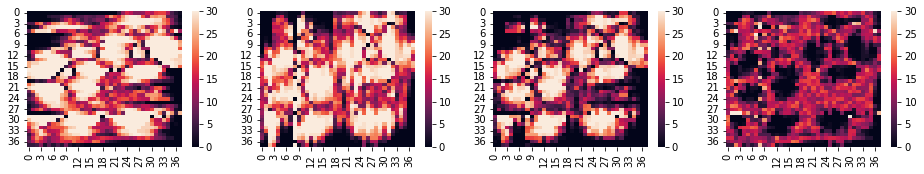

max fitness:  21.918213033485934 7.470133707214682
max fitness:  22.135943901143186 7.25240283955743
max fitness:  21.830262517621414 7.558084223079202
max fitness:  21.935661837986242 7.452684902714374
max fitness:  21.954382010141998 7.433964730558618
max fitness:  22.0288833324892 7.359463408211415
max fitness:  22.157306096644533 7.231040644056083
max fitness:  21.824334609899964 7.564012130800652
max fitness:  21.80079697770198 7.587549762998634
max fitness:  21.988415869160484 7.399930871540132
max fitness:  21.893607520084323 7.494739220616292
max fitness:  21.841254402899196 7.54709233780142
max fitness:  21.83877593765675 7.549570803043867
max fitness:  21.872693410205372 7.515653330495244
max fitness:  21.79480153738473 7.5935452033158874
max fitness:  21.879667687597525 7.508679053103091
max fitness:  22.112624331692885 7.275722409007731
max fitness:  22.399984219541743 6.988362521158873
max fitness:  22.053071124896544 7.335275615804072
max fitness:  22.175773835325533 7.21

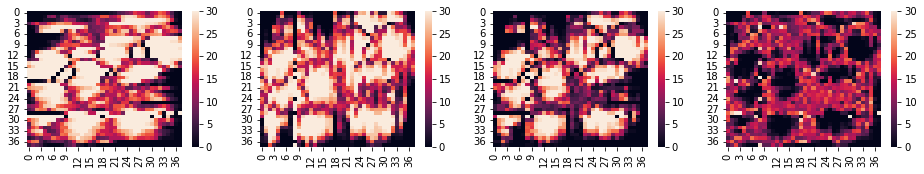

max fitness:  21.90063418968029 7.487712551020326
max fitness:  21.760889191619857 7.627457549080759
max fitness:  21.78226768293886 7.606079057761757
max fitness:  21.817500303390126 7.57084643731049
max fitness:  21.759676436666194 7.628670304034422
max fitness:  21.900068302534144 7.488278438166471
max fitness:  21.86937694928735 7.518969791413266
max fitness:  21.881103468293965 7.507243272406651
max fitness:  22.030462885587383 7.357883855113233
max fitness:  22.045030257030984 7.343316483669632
max fitness:  22.005102339407426 7.38324440129319
max fitness:  21.97726591277585 7.411080827924767
max fitness:  21.937880202489993 7.450466538210623
max fitness:  22.174539237292052 7.213807503408564
max fitness:  22.00846491518386 7.379881825516755
max fitness:  21.861629432532894 7.526717308167722
max fitness:  22.02134750613387 7.3669992345667445
max fitness:  22.12801159261927 7.260335148081346
max fitness:  22.09406100038875 7.294285740311867
max fitness:  22.099211621887715 7.28913

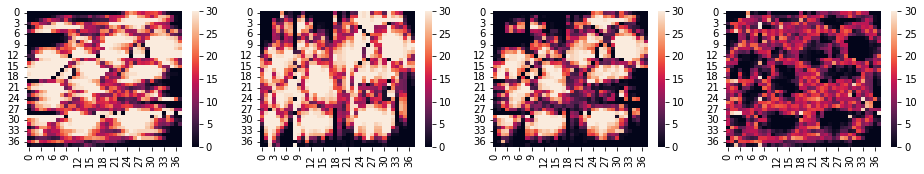

max fitness:  21.72149172977142 7.666855010929197
max fitness:  21.80339353567721 7.584953205023407
max fitness:  22.18251676986664 7.205829970833975
max fitness:  22.00635794916115 7.381988791539467
max fitness:  21.936168200660752 7.4521785400398635
max fitness:  21.988617823818785 7.3997289168818305
max fitness:  21.839847996396358 7.548498744304258
max fitness:  21.87787907889826 7.510467661802355
max fitness:  22.07689632371612 7.311450416984496
max fitness:  21.927551650889747 7.460795089810869
max fitness:  21.84619780105637 7.542148939644246
max fitness:  21.872010522609404 7.516336218091212
max fitness:  21.691066984546012 7.697279756154604
max fitness:  21.894074435991353 7.494272304709263
max fitness:  21.93237057230627 7.455976168394347
max fitness:  22.195429006717838 7.192917733982778
max fitness:  22.049196175489026 7.33915056521159
max fitness:  21.829382754457583 7.5589639862430325
max fitness:  22.005874885935867 7.3824718547647485
max fitness:  21.715729730319516 7.6

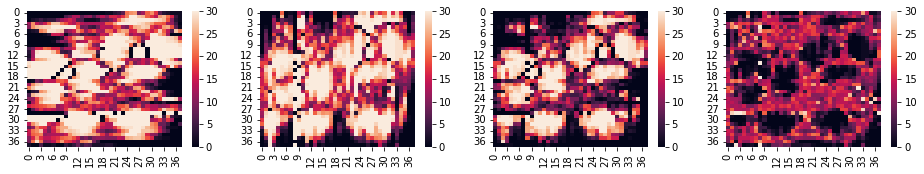

max fitness:  22.034008929658818 7.354337811041798
max fitness:  21.926769602025566 7.46157713867505
max fitness:  21.696074323402474 7.692272417298142
max fitness:  21.833253358820016 7.555093381880599
max fitness:  21.757320778231662 7.631025962468954
max fitness:  21.64625351641823 7.742093224282385
max fitness:  21.94360762888706 7.444739111813554
max fitness:  22.01855490872201 7.369791831978606
max fitness:  21.9113397544738 7.477006986226815
max fitness:  22.04739295189229 7.340953788808324
max fitness:  21.76763554441979 7.620711196280826
max fitness:  21.96282909524601 7.425517645454605
max fitness:  21.750341154519163 7.638005586181453
max fitness:  21.91235923572704 7.475987504973578
max fitness:  22.028108285175477 7.360238455525138
max fitness:  21.86088448964493 7.527462251055685
max fitness:  21.817006593381027 7.571340147319589
max fitness:  21.758646930367558 7.629699810333058
max fitness:  21.813451660606408 7.574895080094208
max fitness:  21.68132103504957 7.70702570

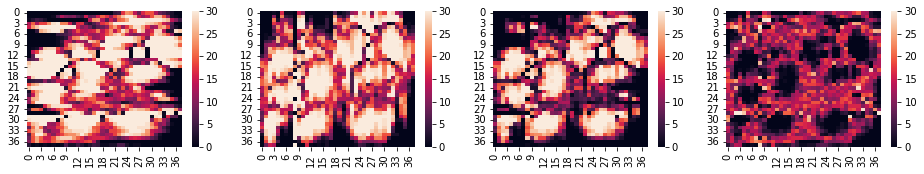

max fitness:  21.7863682530121 7.601978487688516
max fitness:  22.07892359597142 7.309423144729195
max fitness:  21.7879937328007 7.6003530078999155
max fitness:  21.704755539972822 7.683591200727793
max fitness:  21.68855827313503 7.699788467565586
max fitness:  21.951611886641547 7.436734854059068
max fitness:  21.81692059793028 7.571426142770335
max fitness:  21.709368938420077 7.678977802280539
max fitness:  21.827865574908813 7.560481165791803
max fitness:  21.705857640452862 7.6824891002477536
max fitness:  21.827292867448705 7.561053873251911
max fitness:  21.95887619853002 7.429470542170595
max fitness:  21.60208093557477 7.786265805125847
max fitness:  21.6530216560548 7.735325084645815
max fitness:  21.784423668664814 7.603923072035801
max fitness:  21.717403771435556 7.6709429692650595
max fitness:  21.801708957742605 7.586637782958011
max fitness:  21.656027164809892 7.732319575890724
max fitness:  21.821836810381757 7.566509930318858
max fitness:  21.96042198855617 7.42792

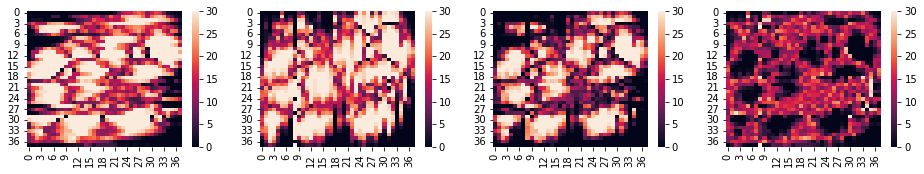

max fitness:  21.77442790141089 7.6139188392897275
max fitness:  21.575943573384865 7.81240316731575
max fitness:  21.7502295200822 7.638117220618415
max fitness:  21.78443196418997 7.603914776510646
max fitness:  21.817443161332616 7.570903579368
max fitness:  21.6921796507949 7.6961670899057175
max fitness:  21.729747816983256 7.65859892371736
max fitness:  21.749476245795616 7.6388704949049995
max fitness:  21.925532562180905 7.462814178519711
max fitness:  21.912808576619355 7.475538164081261
max fitness:  21.72741430057158 7.660932440129034
max fitness:  21.98969836951415 7.398648371186464
max fitness:  21.859451188245764 7.528895552454852
max fitness:  21.97585427313234 7.412492467568274
max fitness:  21.734294112124815 7.654052628575801
max fitness:  22.017267047204747 7.371079693495869
max fitness:  22.009923444520517 7.378423296180099
max fitness:  21.579960908988944 7.808385831711671
max fitness:  21.94358373325199 7.444763007448625
max fitness:  21.975901416085364 7.41244532

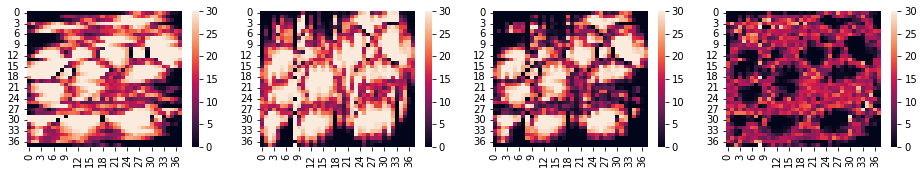

max fitness:  21.975130260250268 7.413216480450348
max fitness:  21.865369188831085 7.5229775518695305
max fitness:  21.702367408254098 7.685979332446518
max fitness:  21.87688261237256 7.511464128328054
max fitness:  21.864754668858502 7.523592071842113
max fitness:  21.7006248772651 7.687721863435517
max fitness:  21.78190253305238 7.606444207648234
max fitness:  21.840389445223252 7.547957295477364
max fitness:  21.879282397281283 7.5090643434193325
max fitness:  22.035619327300658 7.352727413399958
max fitness:  21.977129472203508 7.411217268497108
max fitness:  21.678088481059724 7.7102582596408915
max fitness:  21.914759816414126 7.47358692428649
max fitness:  21.965737581945028 7.422609158755588
max fitness:  21.961717995321894 7.426628745378721
max fitness:  21.88984549152609 7.498501249174527
max fitness:  21.926348988277994 7.461997752422622
max fitness:  21.868462554402715 7.519884186297901
max fitness:  21.91145301685037 7.476893723850246
max fitness:  21.74794431602545 7.6

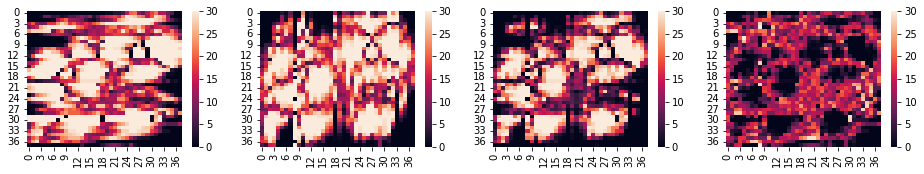

max fitness:  21.743196479841 7.645150260859616
max fitness:  21.759520762576745 7.628825978123871
max fitness:  21.995511481483465 7.392835259217151
max fitness:  21.90318243893035 7.485164301770265
max fitness:  21.957806110218403 7.430540630482213
max fitness:  21.740700684789765 7.647646055910851
max fitness:  21.79542858287354 7.592918157827075
max fitness:  22.225763732198427 7.162583008502189
max fitness:  21.777235656916726 7.611111083783889
max fitness:  21.95652161594424 7.431825124756376
max fitness:  22.092370392794024 7.295976347906592
max fitness:  21.826760859797066 7.56158588090355
max fitness:  21.809532700508115 7.578814040192501
max fitness:  22.023101058442553 7.365245682258063
max fitness:  21.8408209180889 7.547525822611714
max fitness:  21.873758212169925 7.514588528530691
max fitness:  21.795042511440244 7.593304229260372
max fitness:  21.75046086899971 7.637885871700906
max fitness:  21.974565121949773 7.413781618750843
max fitness:  22.066009331151214 7.322337

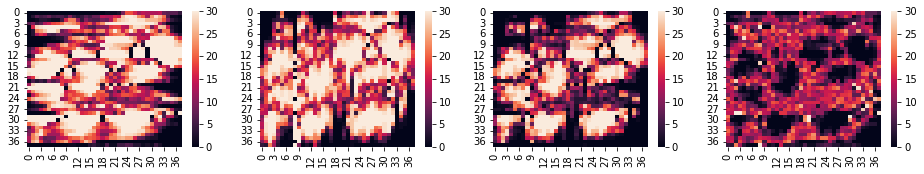

max fitness:  22.012342034237218 7.376004706463398
max fitness:  22.044458236339302 7.343888504361313
max fitness:  21.989970904551637 7.398375836148979
max fitness:  21.704898152915945 7.683448587784671
max fitness:  21.83414093912727 7.554205801573346
max fitness:  21.917156487224403 7.4711902534762125
max fitness:  21.9332069508431 7.455139789857515
max fitness:  21.627528852158544 7.760817888542071
max fitness:  21.78467921549278 7.603667525207836
max fitness:  21.959408647325063 7.428938093375553
max fitness:  21.853823049655517 7.534523691045099
max fitness:  21.885322112886218 7.503024627814398
max fitness:  21.79862465698524 7.589722083715376
max fitness:  21.992033303910702 7.396313436789914
max fitness:  21.97700950397114 7.4113372367294765
max fitness:  21.814612574081742 7.573734166618873
max fitness:  21.979726791972457 7.408619948728159
max fitness:  21.730185037220206 7.65816170348041
max fitness:  21.918767353232695 7.46957938746792
max fitness:  21.823355808918414 7.56

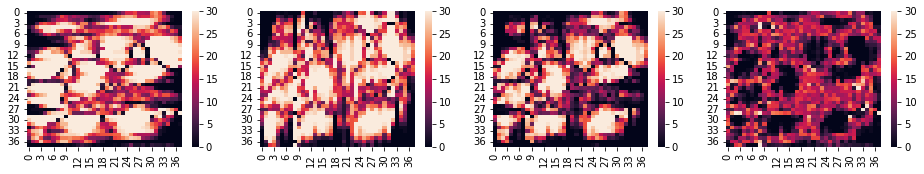

max fitness:  21.92683689639056 7.461509844310054
max fitness:  21.988459525985675 7.399887214714941
max fitness:  22.17057404792584 7.217772692774776
max fitness:  22.02052028398991 7.367826456710706
max fitness:  22.066778433949715 7.321568306750901
max fitness:  22.20659724539295 7.181749495307667
max fitness:  21.93119230808017 7.457154432620445
max fitness:  21.952374066397184 7.435972674303432
max fitness:  22.02943979118 7.358906949520616
max fitness:  21.92783716723597 7.460509573464645
max fitness:  22.198260936326268 7.190085804374348
max fitness:  22.36575444398342 7.022592296717196
max fitness:  22.152958326798867 7.235388413901749
max fitness:  21.93370788506053 7.454638855640084
max fitness:  22.127658847921445 7.2606878927791705
max fitness:  21.987660011472297 7.400686729228319
max fitness:  22.207199138103757 7.181147602596859
max fitness:  22.03644137704225 7.351905363658364
max fitness:  22.07002699531259 7.3183197453880275
max fitness:  22.038025588113832 7.35032115

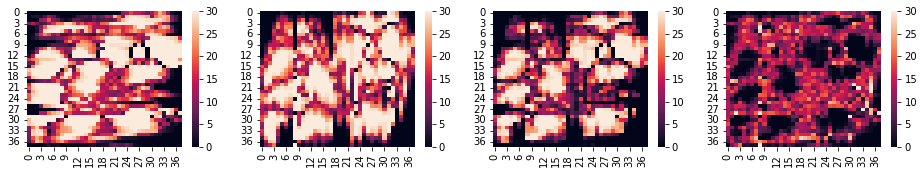

max fitness:  22.001724452852688 7.386622287847928
max fitness:  22.20309179812089 7.185254942579725
max fitness:  22.0675706513653 7.320776089335315
max fitness:  21.947709243216245 7.440637497484371
max fitness:  21.956556050709484 7.431790689991132
max fitness:  22.184247331290216 7.2040994094104
max fitness:  22.088710433433505 7.299636307267111
max fitness:  21.990970771431385 7.3973759692692305
max fitness:  21.837994111525806 7.55035262917481
max fitness:  21.725157165917445 7.663189574783171
max fitness:  21.87698014143318 7.511366599267436
max fitness:  22.06735899151866 7.320987749181956
max fitness:  21.89984869246212 7.4884980482384975
max fitness:  21.81755934701841 7.570787393682206
max fitness:  21.744880812728134 7.643465927972482
max fitness:  22.09383584765166 7.294510893048955
max fitness:  21.789089247562245 7.599257493138371
max fitness:  21.909278770705306 7.4790679699953095
max fitness:  21.774673044832564 7.6136736958680515
max fitness:  21.73956481500084 7.6487

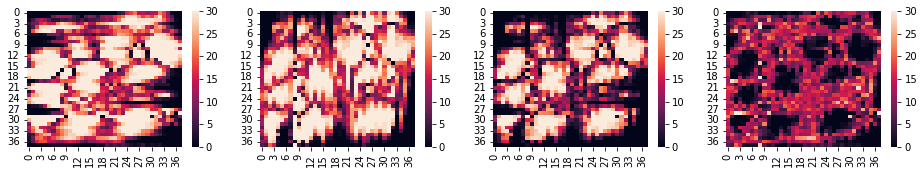

max fitness:  21.673847769559096 7.71449897114152
max fitness:  21.841791091676683 7.546555649023933
max fitness:  21.785959058606384 7.602387682094232
max fitness:  22.174044764358413 7.2143019763422025
max fitness:  22.122756156062977 7.265590584637639
max fitness:  22.09176510969968 7.296581631000937
max fitness:  22.09866063329065 7.289686107409967
max fitness:  21.825866237121076 7.56248050357954
max fitness:  21.788176059324975 7.600170681375641
max fitness:  21.858452324831497 7.529894415869119
max fitness:  21.94966290117278 7.438683839527837
max fitness:  21.77402384936387 7.6143228913367444
max fitness:  21.76263475102212 7.625711989678496
max fitness:  21.743346458658174 7.645000282042442
max fitness:  21.734142127556538 7.654204613144078
max fitness:  21.86647332058565 7.521873420114964
max fitness:  21.932597576653706 7.45574916404691
max fitness:  22.13526348428025 7.253083256420364
max fitness:  21.868683487731694 7.519663252968922
max fitness:  22.19217899832105 7.19616

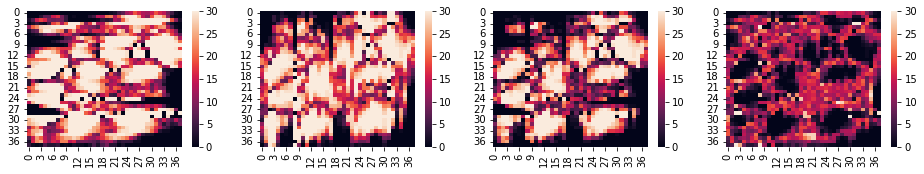

max fitness:  21.848359903465337 7.539986837235279
max fitness:  22.146227289540864 7.242119451159752
max fitness:  21.952414701581446 7.4359320391191694
max fitness:  21.865373390109013 7.522973350591602
max fitness:  21.878553220988028 7.509793519712588
max fitness:  21.885221301925217 7.503125438775399
max fitness:  22.043872396366456 7.344474344334159
max fitness:  21.9695649229732 7.418781817727417
max fitness:  22.24202989574183 7.146316844958786
max fitness:  22.122303529266475 7.266043211434141
max fitness:  21.953435494547925 7.434911246152691
max fitness:  21.97820012385397 7.410146616846646
max fitness:  22.23083367779884 7.157513062901774
max fitness:  21.84810469881149 7.540242041889126
max fitness:  22.108437159571942 7.279909581128674
max fitness:  22.19206905934368 7.196277681356936
max fitness:  22.1443377779808 7.244008962719814
max fitness:  22.191354208928605 7.196992531772011
max fitness:  22.202120162278547 7.186226578422069
max fitness:  22.108753653075418 7.2795

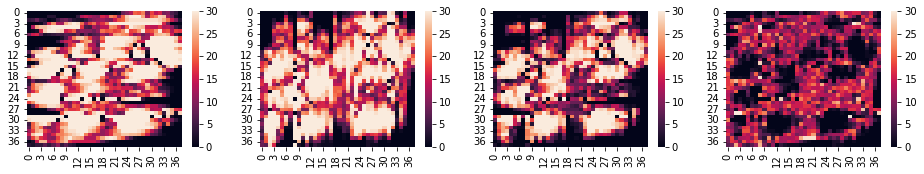

max fitness:  22.13255581920434 7.255790921496274
max fitness:  22.12427305084247 7.264073689858147
max fitness:  22.229096845412986 7.15924989528763
max fitness:  22.691321870170974 6.697024870529642
max fitness:  22.067989221612102 7.320357519088514
max fitness:  22.063431036276334 7.324915704424281
max fitness:  22.01192474576868 7.376421994931935
max fitness:  21.977684681900513 7.410662058800103
max fitness:  21.941877136524393 7.446469604176222
max fitness:  21.97800836449959 7.410338376201025
max fitness:  21.90286391948615 7.485482821214465
max fitness:  22.008881663701096 7.379465076999519
max fitness:  22.08371210468875 7.3046346360118655
max fitness:  21.98481960276499 7.403527137935626
max fitness:  21.983316821881914 7.405029918818702
max fitness:  21.994124530155588 7.394222210545028
max fitness:  22.19759553541436 7.190751205286254
max fitness:  22.339772394639844 7.0485743460607715
max fitness:  22.004600575520367 7.3837461651802485
max fitness:  22.239493000904123 7.14

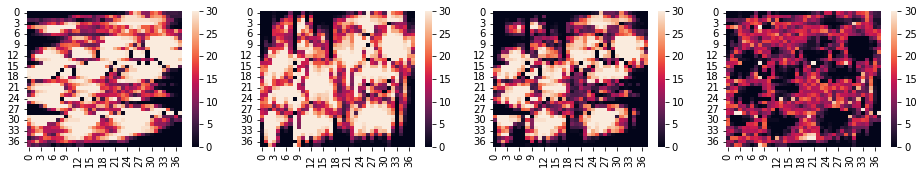

max fitness:  22.178096557584524 7.2102501831160914
max fitness:  22.109654033579755 7.278692707120861
max fitness:  22.013754955757193 7.374591784943423
max fitness:  22.174031624453853 7.2143151162467625
max fitness:  22.031692149578646 7.35665459112197
max fitness:  22.22993853411056 7.158408206590057
max fitness:  21.998184416656315 7.390162324044301
max fitness:  22.01425389949857 7.374092841202046
max fitness:  22.113139824437486 7.27520691626313
max fitness:  22.08191796935436 7.306428771346255
max fitness:  22.2473959371057 7.140950803594915
max fitness:  22.122326383189154 7.2660203575114615
max fitness:  22.479344279716727 6.9090024609838885
max fitness:  22.268210781039095 7.120135959661521
max fitness:  22.06873117284031 7.319615567860307
max fitness:  22.1436494220071 7.244697318693515
max fitness:  21.949355815442946 7.43899092525767
max fitness:  22.008255800791375 7.380090939909241
max fitness:  22.279498710396076 7.108848030304539
max fitness:  22.277318371258534 7.111

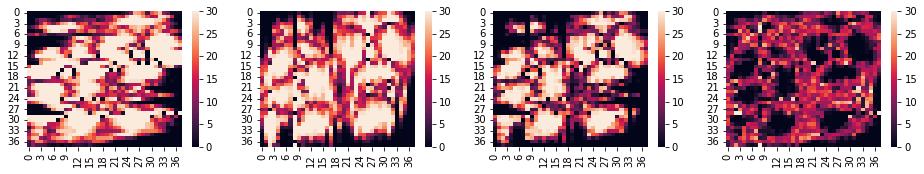

max fitness:  22.415275024012082 6.973071716688533
max fitness:  22.187288729925278 7.201058010775338
max fitness:  22.42441685501675 6.963929885683864
max fitness:  22.13291646194869 7.255430278751927
max fitness:  22.154563242740988 7.233783497959628
max fitness:  22.315848683520713 7.072498057179903
max fitness:  22.268196333673384 7.120150407027232
max fitness:  22.4569996530049 6.931347087695716
max fitness:  22.08851356445703 7.299833176243585
max fitness:  22.415024622024877 6.973322118675739
max fitness:  22.320585064758678 7.067761675941938
max fitness:  22.238654972877775 7.149691767822841
max fitness:  22.34737065107668 7.0409760896239355
max fitness:  22.18253128713493 7.2058154535656875
max fitness:  22.15234829898462 7.235998441715996
max fitness:  22.285050073049213 7.103296667651403
max fitness:  22.26867806940345 7.119668671297166
max fitness:  22.269655924296693 7.118690816403923
max fitness:  22.38173059983751 7.006616140863105
max fitness:  22.101820186427595 7.2865

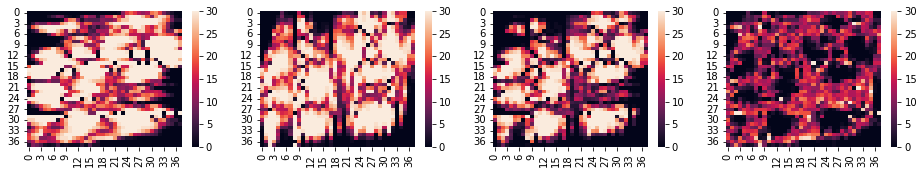

max fitness:  22.44251455003124 6.945832190669375
max fitness:  22.20277026448344 7.185576476217175
max fitness:  22.245491971937092 7.142854768763524
max fitness:  22.44294007637499 6.945406664325624
max fitness:  22.319996793779495 7.068349946921121
max fitness:  22.59119725313288 6.7971494875677365
max fitness:  22.08211276040332 7.306233980297296
max fitness:  22.234714944604626 7.15363179609599
max fitness:  22.205029636282408 7.183317104418208
max fitness:  22.421040301195987 6.967306439504629
max fitness:  22.408397412576946 6.97994932812367
max fitness:  22.150723936797128 7.237622803903488
max fitness:  22.09562369563274 7.292723045067877
max fitness:  22.30412094664249 7.084225794058124
max fitness:  22.23207087725526 7.156275863445355
max fitness:  22.251746293147697 7.136600447552919
max fitness:  22.219872476890636 7.16847426380998
max fitness:  22.470925172322396 6.91742156837822
max fitness:  22.44859814831333 6.939748592387286
max fitness:  22.462846896318354 6.92549984

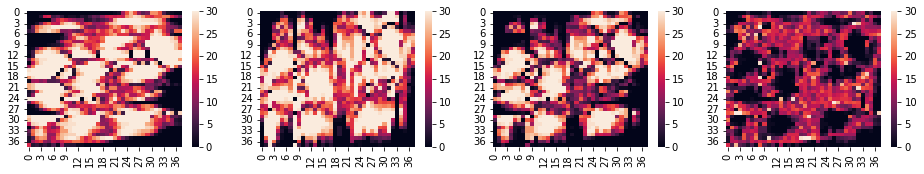

max fitness:  22.007033966533086 7.3813127741675295
max fitness:  22.270464871607878 7.117881869092738
max fitness:  22.180300490755652 7.208046249944964
max fitness:  22.10792109817174 7.280425642528876
max fitness:  21.9619639824978 7.426382758202816
max fitness:  22.270737968009904 7.117608772690712
max fitness:  22.02114369336965 7.3672030473309675
max fitness:  22.105034927901613 7.283311812799003
max fitness:  22.208913032746217 7.179433707954399
max fitness:  22.18262897606495 7.205717764635665
max fitness:  22.031962193574177 7.356384547126439
max fitness:  22.223948877324787 7.164397863375829
max fitness:  22.131020099636864 7.257326641063752
max fitness:  21.96262159381197 7.425725146888645
max fitness:  22.04770424263511 7.340642498065506
max fitness:  22.069008256681023 7.3193384840195925
max fitness:  22.439211190003036 6.94913555069758
max fitness:  22.11035596657916 7.277990774121456
max fitness:  22.098551416239367 7.289795324461249
max fitness:  22.19030972641286 7.198

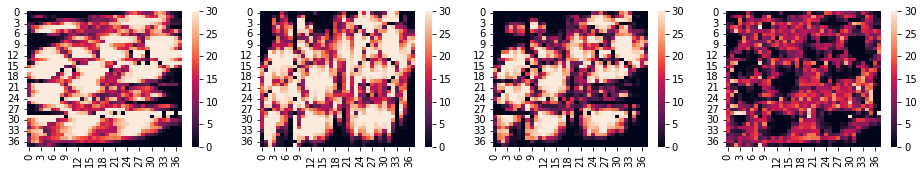

max fitness:  21.81436066113575 7.573986079564865
max fitness:  21.86340411855256 7.524942622148057
max fitness:  21.928697029492113 7.4596497112085025
max fitness:  22.102520522418306 7.28582621828231
max fitness:  22.03100127793639 7.357345462764226
max fitness:  22.043639193597834 7.344707547102782
max fitness:  22.641147004031225 6.7471997366693905
max fitness:  22.0583271267273 7.330019613973317
max fitness:  22.200488066745933 7.187858673954683
max fitness:  21.930686682827787 7.457660057872829
max fitness:  22.356943973902844 7.031402766797772
max fitness:  22.059737412800757 7.3286093278998585
max fitness:  22.16240140723418 7.225945333466434
max fitness:  21.849890980752356 7.53845575994826
max fitness:  21.755507119868035 7.632839620832581
max fitness:  21.703833671449566 7.68451306925105
max fitness:  21.835381892506035 7.552964848194581
max fitness:  22.09355015604241 7.294796584658204
max fitness:  21.79825944074563 7.5900872999549875
max fitness:  22.083638042770126 7.304

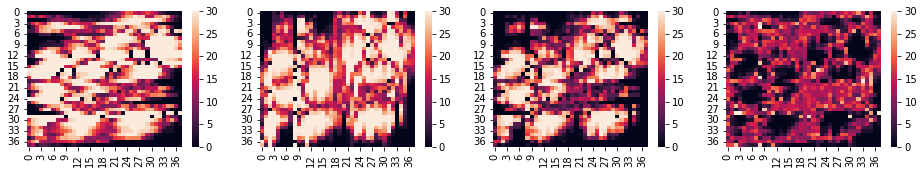

max fitness:  21.632643657185678 7.755703083514938
max fitness:  21.83961714652351 7.548729594177107
max fitness:  21.83998956842126 7.548357172279356
max fitness:  21.807486530645853 7.580860210054762
max fitness:  21.98500098716008 7.403345753540535
max fitness:  21.89345694063077 7.494889800069846
max fitness:  21.818674183345593 7.569672557355023
max fitness:  21.822999804561668 7.565346936138948
max fitness:  22.094639213846648 7.293707526853968
max fitness:  21.78865763528917 7.599689105411446
max fitness:  21.749605581965362 7.638741158735254
max fitness:  21.91644263864977 7.471904102050846
max fitness:  22.047875765222393 7.3404709754782225
max fitness:  21.82029661342296 7.568050127277655
max fitness:  21.668329964310043 7.7200167763905725
max fitness:  21.9539588645864 7.434387876114215
max fitness:  22.01036667724634 7.377980063454277
max fitness:  21.940391567342722 7.447955173357894
max fitness:  21.88653465166403 7.501812089036587
max fitness:  21.81802295080123 7.570323

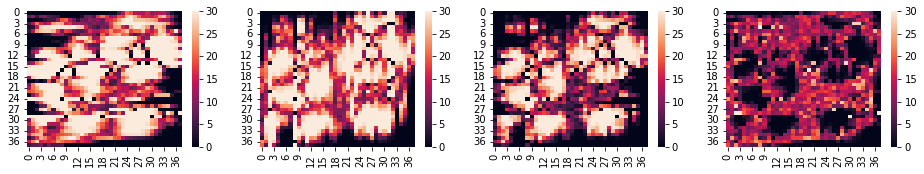

max fitness:  22.480612166172993 6.907734574527623
max fitness:  21.93653057928992 7.451816161410697
max fitness:  21.979403530802024 7.408943209898592
max fitness:  21.828589451673732 7.559757289026884
max fitness:  22.011393902663354 7.376952838037262
max fitness:  21.817132481398748 7.571214259301868
max fitness:  21.944977893323216 7.4433688473774
max fitness:  21.654138123253983 7.734208617446633
max fitness:  21.96487459376118 7.423472146939435
max fitness:  21.75464741819341 7.633699322507205
max fitness:  22.467853285016595 6.920493455684021
max fitness:  22.133564574293292 7.254782166407324
max fitness:  22.21122839965833 7.177118341042284
max fitness:  22.110105419132296 7.27824132156832
max fitness:  21.906520332604206 7.48182640809641
max fitness:  21.992287347194278 7.396059393506338
max fitness:  21.9859107534248 7.402435987275815
max fitness:  22.085651862229476 7.30269487847114
max fitness:  21.992086829612177 7.396259911088439
max fitness:  21.892506961555135 7.4958397

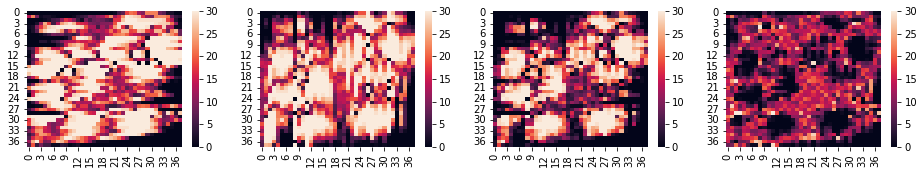

max fitness:  22.0986796761539 7.289667064546716
max fitness:  21.681225602844282 7.707121137856333
max fitness:  21.723153711518307 7.6651930291823085
max fitness:  21.794569521084227 7.593777219616388
max fitness:  21.85294294581308 7.535403794887536
max fitness:  21.55149430805143 7.836852432649184
max fitness:  21.81490249877829 7.573444241922324
max fitness:  21.905321896742528 7.483024843958088
max fitness:  21.871226498343596 7.51712024235702
max fitness:  21.59125144247568 7.797095298224935
max fitness:  21.786640603328944 7.6017061373716714
max fitness:  21.729711752789612 7.658634987911004
max fitness:  22.24786041876459 7.140486321936027
max fitness:  21.993333477374676 7.395013263325939
max fitness:  22.02011120749723 7.368235533203386
max fitness:  21.901515864603034 7.4868308760975815
max fitness:  22.009484316514744 7.378862424185872
max fitness:  21.81851009206226 7.569836648638354
max fitness:  21.811235753182146 7.57711098751847
max fitness:  21.993876128152117 7.3944

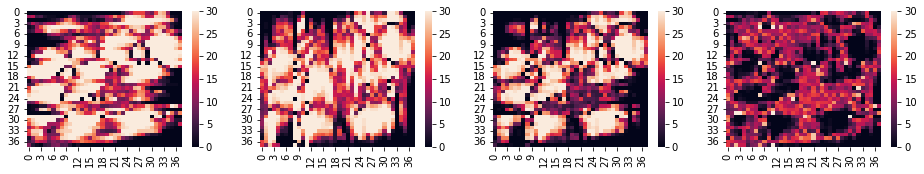

max fitness:  21.94553657799921 7.442810162701406
max fitness:  21.92688519992128 7.461461540779336
max fitness:  21.896839388867946 7.49150735183267
max fitness:  21.963424254636767 7.424922486063849
max fitness:  21.993304665607553 7.3950420750930626
max fitness:  21.80513978476187 7.583206955938746
max fitness:  21.925207251681407 7.463139489019209
max fitness:  22.07436109771546 7.3139856429851555
max fitness:  22.00994448210581 7.378402258594807
max fitness:  22.213364464869027 7.174982275831589
max fitness:  21.967132513495734 7.4212142272048816
max fitness:  21.922673490762154 7.465673249938462
max fitness:  21.969686146502063 7.418660594198553
max fitness:  21.883162313740236 7.50518442696038
max fitness:  22.102337306217024 7.286009434483592
max fitness:  21.92641966062605 7.461927080074567
max fitness:  21.676121362369273 7.712225378331343
max fitness:  21.835193000424905 7.553153740275711
max fitness:  22.170700443682875 7.21764629701774
max fitness:  21.90933007426235 7.479

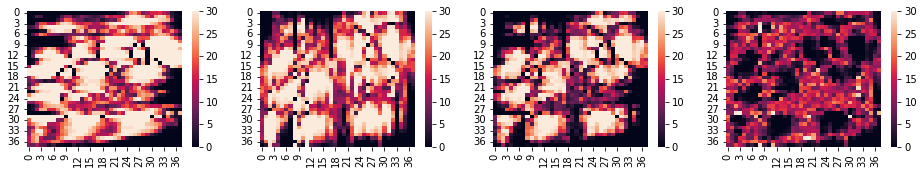

max fitness:  22.20107841595286 7.187268324747755
max fitness:  22.091303215873026 7.29704352482759
max fitness:  22.124757568038955 7.263589172661661
max fitness:  22.09751917754638 7.2908275631542345
max fitness:  22.094721929067568 7.293624811633048
max fitness:  21.90483394631371 7.4835127943869075
max fitness:  22.0050892194786 7.383257521222017
max fitness:  22.070707994066023 7.317638746634593
max fitness:  22.064267061548705 7.324079679151911
max fitness:  22.014472941725543 7.3738737989750724
max fitness:  22.176209675167485 7.212137065533131
max fitness:  22.005499735665033 7.3828470050355826
max fitness:  22.036018709376858 7.352328031323758
max fitness:  22.20661030291685 7.181736437783766
max fitness:  22.120965251821424 7.267381488879192
max fitness:  21.985469760888627 7.402876979811989
max fitness:  22.035210021362303 7.353136719338313
max fitness:  22.125535235675237 7.262811505025379
max fitness:  22.166840263294034 7.221506477406582
max fitness:  22.3675509859359 7.0

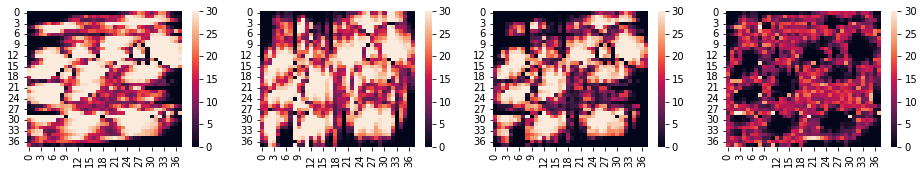

max fitness:  22.064568245468273 7.323778495232343
max fitness:  21.892252198409757 7.496094542290859
max fitness:  21.937317950833613 7.451028789867003
max fitness:  22.198655756384674 7.189690984315941
max fitness:  21.890949904514308 7.497396836186308
max fitness:  22.087120696200664 7.301226044499952
max fitness:  21.866658319799384 7.521688420901231
max fitness:  21.807857812895932 7.580488927804684
max fitness:  21.914332176284216 7.4740145644164
max fitness:  21.864487098790438 7.523859641910178
max fitness:  21.81161970346245 7.5767270372381645
max fitness:  21.77807478512114 7.610271955579474
max fitness:  22.115014333109926 7.27333240759069
max fitness:  21.8646504826199 7.523696258080715
max fitness:  22.07125785656043 7.317088884140187
max fitness:  21.94106035785382 7.447286382846794
max fitness:  21.98774439013311 7.400602350567507
max fitness:  21.972673705947514 7.415673034753102
max fitness:  21.82526969065902 7.563077050041596
max fitness:  21.736966682592964 7.651380

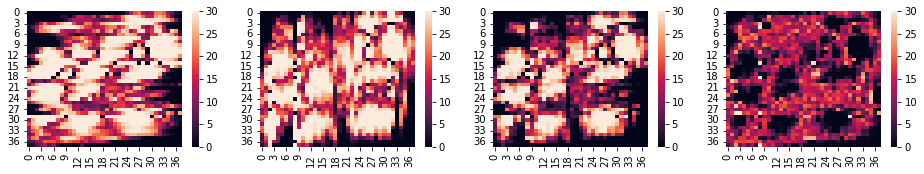

max fitness:  21.934993094896228 7.453353645804388
max fitness:  21.883978780654896 7.50436796004572
max fitness:  21.90354919603655 7.484797544664065
max fitness:  21.893150272020563 7.495196468680053
max fitness:  21.906856709617323 7.481490031083293
max fitness:  21.894752211813618 7.493594528886998
max fitness:  21.79009213604928 7.598254604651334
max fitness:  21.756046727920626 7.632300012779989
max fitness:  21.791309361202572 7.597037379498044
max fitness:  21.932871210965498 7.455475529735118
max fitness:  22.023102453431942 7.365244287268673
max fitness:  21.756510560927374 7.6318361797732415
max fitness:  21.96768979403879 7.4206569466618255
max fitness:  21.944406114006213 7.443940626694403
max fitness:  21.94566875604729 7.442677984653326
max fitness:  21.967046486076583 7.4213002546240325
max fitness:  22.211334149956244 7.177012590744372
max fitness:  22.03402531241931 7.354321428281306
max fitness:  22.065085796016973 7.323260944683643
max fitness:  21.869024771026503 7

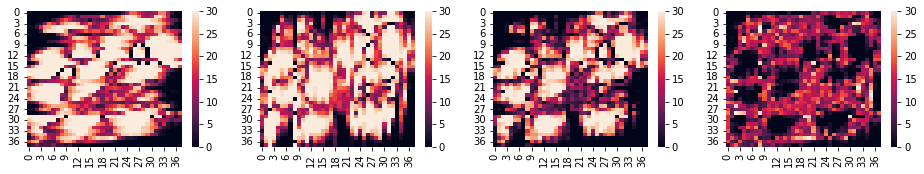

max fitness:  21.889182499517975 7.4991642411826405
max fitness:  21.928161040900044 7.460185699800572
max fitness:  21.900986201675387 7.487360539025229
max fitness:  21.93663135124806 7.451715389452556
max fitness:  21.909685274926154 7.4786614657744614
max fitness:  21.97993839831043 7.408408342390185
max fitness:  21.977312188975937 7.411034551724679
max fitness:  21.984932527994008 7.403414212706608
max fitness:  22.400250194051665 6.988096546648951
max fitness:  22.03319225075363 7.355154489946987
max fitness:  21.964433140214034 7.423913600486582
max fitness:  21.972188094582584 7.416158646118031
max fitness:  22.0073323278094 7.381014412891215
max fitness:  22.235747389094282 7.152599351606334
max fitness:  22.014210129232012 7.374136611468604
max fitness:  21.906794240526224 7.481552500174391
max fitness:  21.920609367026024 7.467737373674591
max fitness:  22.079039227343 7.309307513357616
max fitness:  21.953219891480458 7.435126849220158
max fitness:  21.911505230647748 7.47

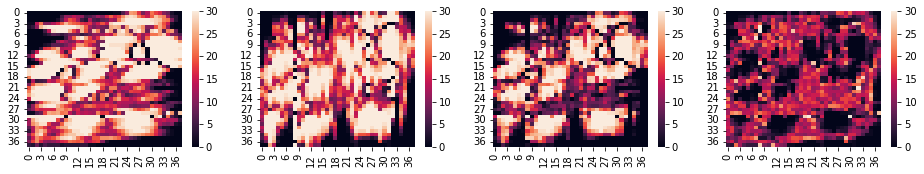

max fitness:  21.833008585612387 7.555338155088229
max fitness:  21.78219475484112 7.606151985859494
max fitness:  21.8316206507938 7.556726089906817
max fitness:  21.785318039206615 7.603028701494001
max fitness:  21.928829182294237 7.459517558406379
max fitness:  22.196300136256454 7.192046604444162
max fitness:  21.786633654783646 7.60171308591697
max fitness:  21.75314374621497 7.635202994485645
max fitness:  22.05282001837935 7.335526722321266
max fitness:  21.917015133870247 7.471331606830368
max fitness:  21.93490780759686 7.4534389331037545
max fitness:  21.955105911322285 7.433240829378331
max fitness:  22.07112100324774 7.317225737452876
max fitness:  21.740270397820666 7.64807634287995
max fitness:  21.836106403107678 7.552240337592938
max fitness:  21.942957305505324 7.445389435195292
max fitness:  21.99926888178168 7.3890778589189345
max fitness:  22.113039910734972 7.275306829965643
max fitness:  22.158044613325046 7.23030212737557
max fitness:  21.802578098117927 7.58576

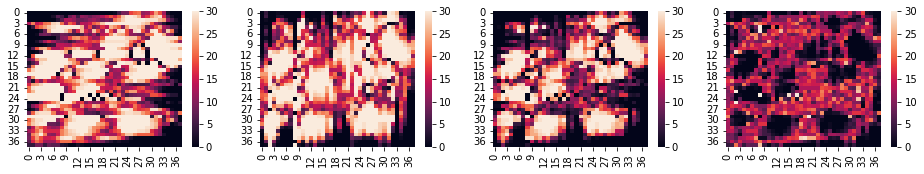

max fitness:  21.783898720914117 7.604448019786499
max fitness:  21.95691718190325 7.431429558797365
max fitness:  22.003262191547726 7.385084549152889
max fitness:  21.986070398120113 7.402276342580503
max fitness:  22.127425386695336 7.26092135400528
max fitness:  22.45964389582313 6.928702844877485
max fitness:  22.23068819186188 7.157658548838736
max fitness:  21.935941258427178 7.452405482273438
max fitness:  22.15183822170286 7.236508518997756
max fitness:  21.695560319674655 7.692786421025961
max fitness:  21.85206136637913 7.536285374321487
max fitness:  21.920583543367144 7.467763197333472
max fitness:  21.752199214167586 7.63614752653303
max fitness:  21.77090400537658 7.617442735324037
max fitness:  21.797228527489906 7.591118213210709
max fitness:  21.708754217020214 7.679592523680402
max fitness:  21.809700562214935 7.5786461784856805
max fitness:  22.061340861256856 7.32700587944376
max fitness:  21.90734009117232 7.481006649528297
max fitness:  21.81087456773307 7.577472

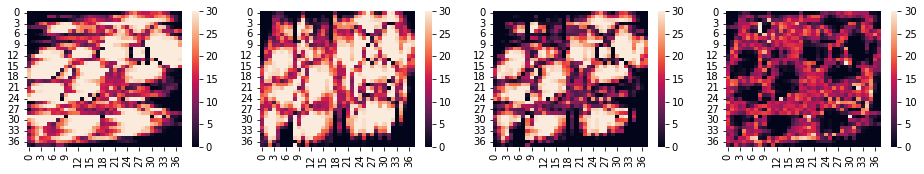

max fitness:  22.100594943102372 7.2877517975982435
max fitness:  21.940508751835296 7.44783798886532
max fitness:  21.978866957483415 7.409479783217201
max fitness:  22.25749386398835 7.1308528767122645
max fitness:  22.142649331913873 7.245697408786743
max fitness:  22.071872695534175 7.316474045166441
max fitness:  22.12478017967519 7.263566561025424
max fitness:  21.9955205237085 7.392826216992116
max fitness:  22.040403366734402 7.347943373966213
max fitness:  22.469122010092622 6.9192247306079935
max fitness:  22.061871583941972 7.326475156758644
max fitness:  22.19082007106129 7.197526669639327
max fitness:  21.87342060710568 7.514926133594937
max fitness:  21.772146069011413 7.616200671689203
max fitness:  21.969455163110226 7.41889157759039
max fitness:  21.92764611737462 7.4607006233259945
max fitness:  21.945394142133395 7.442952598567221
max fitness:  22.028746149004228 7.359600591696388
max fitness:  21.925715963043118 7.462630777657498
max fitness:  21.790498107883387 7.5

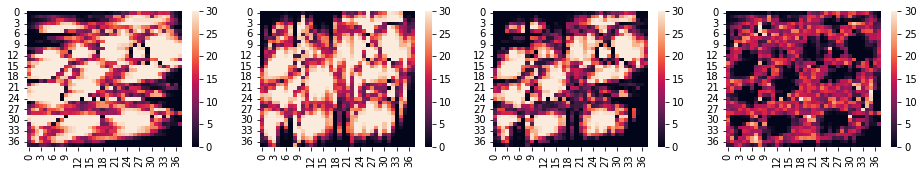

max fitness:  22.038183642541153 7.350163098159463
max fitness:  21.848559935524637 7.539786805175979
max fitness:  21.823436494064087 7.564910246636529
max fitness:  21.86119411937848 7.527152621322134
max fitness:  21.99848124154056 7.389865499160056
max fitness:  22.09326469361158 7.295082047089036
max fitness:  21.86523650830553 7.523110232395087
max fitness:  21.9609920667586 7.427354673942016
max fitness:  22.265171867957505 7.12317487274311
max fitness:  22.254945101367856 7.13340163933276
max fitness:  21.923099195011865 7.465247545688751
max fitness:  21.83122438253713 7.557122358163486
max fitness:  22.015609745327186 7.37273699537343
max fitness:  22.078937036104914 7.309409704595701
max fitness:  22.157013026051917 7.231333714648699
max fitness:  22.198992507785782 7.189354232914834
max fitness:  22.075010078465183 7.313336662235432
max fitness:  22.130890380107658 7.257456360592958
max fitness:  21.966128969512113 7.422217771188503
max fitness:  22.229130837379838 7.159215

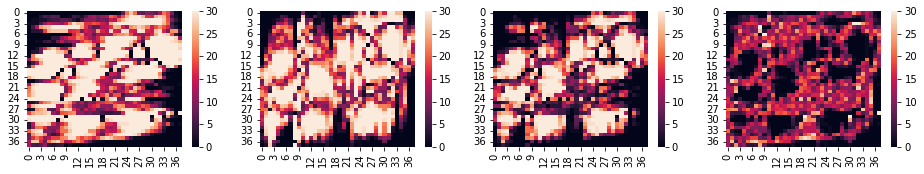

max fitness:  22.15008045966465 7.2382662810359655
max fitness:  22.486871649189858 6.901475091510758
max fitness:  22.082434251508285 7.30591248919233
max fitness:  22.097853119235545 7.290493621465071
max fitness:  22.30804856228882 7.080298178411795
max fitness:  22.27520395065644 7.113142790044176
max fitness:  22.292766448248692 7.095580292451924
max fitness:  22.310844512437242 7.0775022282633735
max fitness:  22.1941866604068 7.194160080293816
max fitness:  22.30357243066431 7.084774310036305
max fitness:  22.302071397911604 7.086275342789012
max fitness:  22.356411011593444 7.031935729107172
max fitness:  22.343752603001043 7.044594137699573
max fitness:  22.34985794608381 7.038488794616807
max fitness:  22.253519275331556 7.13482746536906
max fitness:  22.36442218678726 7.023924553913357
max fitness:  22.383800553595037 7.0045461871055785
max fitness:  22.210646148877302 7.177700591823314
max fitness:  22.082034500904435 7.306312239796181
max fitness:  22.079667061107422 7.308

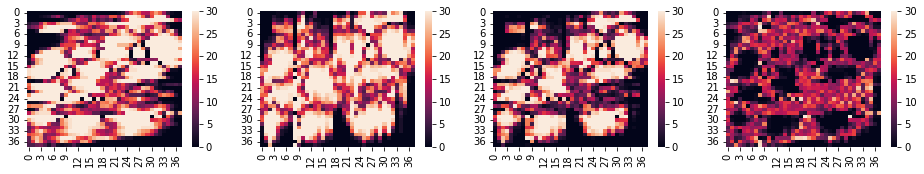

max fitness:  22.58846129663123 6.799885444069385
max fitness:  22.211828246957097 7.176518493743519
max fitness:  22.130633162626665 7.25771357807395
max fitness:  22.515053083762666 6.87329365693795
max fitness:  22.115163203006098 7.273183537694518
max fitness:  22.139319796049897 7.249026944650719
max fitness:  22.060941794835497 7.327404945865119
max fitness:  22.25781391867831 7.130532822022307
max fitness:  22.01931799820222 7.369028742498397
max fitness:  22.164601427778123 7.2237453129224924
max fitness:  22.378125387732773 7.010221352967843
max fitness:  22.35142574777288 7.036920992927737
max fitness:  22.235393911259663 7.152952829440952
max fitness:  22.22137645350095 7.166970287199664
max fitness:  22.52470341270759 6.8636433279930245
max fitness:  22.330871289015498 7.057475451685118
max fitness:  22.22387624872237 7.164470491978246
max fitness:  22.25341208945818 7.134934651242435
max fitness:  22.090572769995084 7.297773970705531
max fitness:  22.1010248484967 7.287321

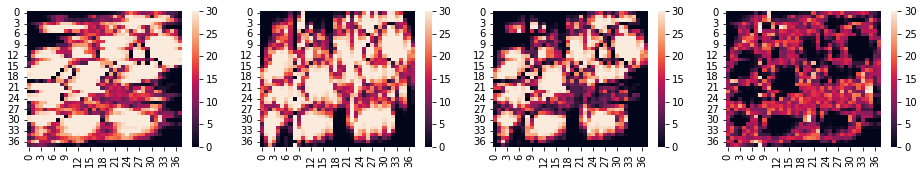

max fitness:  21.852453833888298 7.535892906812318
max fitness:  21.881344705049482 7.5070020356511336
max fitness:  21.855125121026855 7.5332216196737605
max fitness:  22.011147611727637 7.377199128972979
max fitness:  22.573674513007255 6.814672227693361
max fitness:  22.12194091479769 7.266405825902925
max fitness:  22.019108376765228 7.369238363935388
max fitness:  21.8858419896096 7.502504751091017
max fitness:  21.925286552710496 7.46306018799012
max fitness:  21.940613907865767 7.447732832834848
max fitness:  22.052169230987943 7.336177509712673
max fitness:  21.972485657799876 7.41586108290074
max fitness:  22.08454318086682 7.303803559833796
max fitness:  22.161697605060528 7.226649135640088
max fitness:  22.07427503488813 7.314071705812484
max fitness:  22.019763835045183 7.368582905655433
max fitness:  22.242934734818412 7.1454120058822035
max fitness:  22.08830926022334 7.300037480477275
max fitness:  22.306746576100984 7.081600164599632
max fitness:  22.053817940961785 7.3

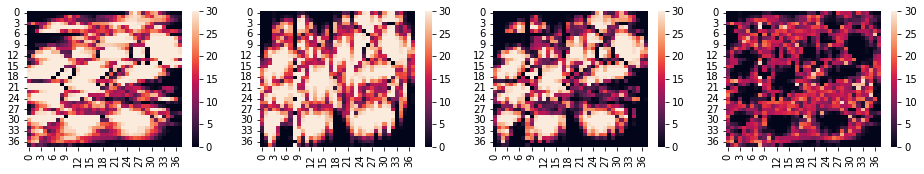

max fitness:  22.20167831099111 7.186668429709506
max fitness:  22.05321796374149 7.335128776959127
max fitness:  22.037001555814506 7.35134518488611
max fitness:  22.128820730332833 7.259526010367782
max fitness:  22.25338349626753 7.134963244433084
max fitness:  22.12938274101453 7.258963999686085
max fitness:  22.09849001914654 7.289856721554077
max fitness:  22.041108065914585 7.3472386747860305
max fitness:  22.565050304998106 6.82329643570251
max fitness:  21.850086006087608 7.538260734613008
max fitness:  21.887653680525457 7.500693060175159
max fitness:  21.995370601120875 7.392976139579741
max fitness:  21.856329939758332 7.532016800942284
max fitness:  22.065656813586212 7.3226899271144035
max fitness:  21.992595467333544 7.395751273367072
max fitness:  22.282277061432346 7.10606967926827
max fitness:  22.144164789405266 7.244181951295349
max fitness:  22.38536506737714 7.002981673323475
max fitness:  22.06412183497705 7.324224905723565
max fitness:  22.31237067760613 7.07597

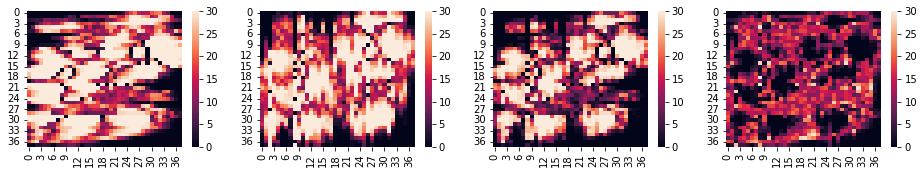

max fitness:  21.86981994446634 7.518526796234276
max fitness:  22.16297049467866 7.2253762460219555
max fitness:  21.886515078664026 7.50183166203659
max fitness:  22.002713715125342 7.385633025575274
max fitness:  21.853046467086138 7.535300273614478
max fitness:  21.85246776146542 7.535878979235196
max fitness:  21.809576911803294 7.578769828897322
max fitness:  21.86432174311704 7.524024997583577
max fitness:  21.882177497439635 7.506169243260981
max fitness:  22.113691915107264 7.274654825593352
max fitness:  22.058579113938656 7.32976762676196
max fitness:  21.827751940602724 7.560594800097892
max fitness:  21.81443126516492 7.573915475535696
max fitness:  21.928264720340565 7.460082020360051
max fitness:  21.936960236189634 7.451386504510982
max fitness:  21.947982374450426 7.44036436625019
max fitness:  22.155937001933545 7.232409738767071
max fitness:  22.28724281015135 7.1011039305492645
max fitness:  22.033181239408414 7.355165501292202
max fitness:  22.24041327840549 7.1479

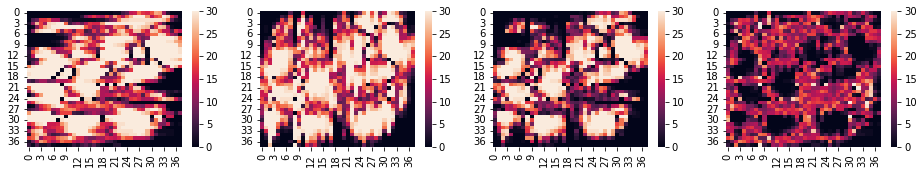

max fitness:  21.95985057290223 7.428496167798386
max fitness:  21.947546709914825 7.440800030785791
max fitness:  22.062979342048216 7.3253673986524
max fitness:  21.857830597254264 7.530516143446352
max fitness:  21.887935029993578 7.500411710707038
max fitness:  21.82300928711094 7.565337453589677
max fitness:  22.058712511260705 7.329634229439911
max fitness:  22.08488460056538 7.303462140135235
max fitness:  22.133855511943423 7.2544912287571925
max fitness:  22.066301851461112 7.322044889239503
max fitness:  21.91290691383659 7.475439826864026
max fitness:  22.05239053667649 7.335956204024125
max fitness:  22.01364810042324 7.374698640277376
max fitness:  22.216970614057956 7.171376126642659
max fitness:  22.17260552456289 7.215741216137726
max fitness:  22.06490407502295 7.323442665677664
max fitness:  22.14084094272964 7.247505797970977
max fitness:  22.34189926261812 7.046447478082495
max fitness:  21.791798002827406 7.59654873787321
max fitness:  22.045161256662304 7.34318548

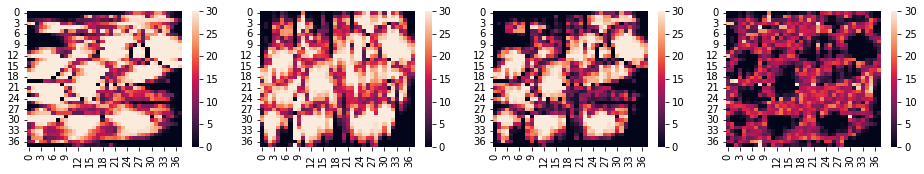

max fitness:  22.104966654760798 7.283380085939818
max fitness:  22.020436582718567 7.367910157982049
max fitness:  21.79419568917153 7.594151051529085
max fitness:  21.917119635867646 7.47122710483297
max fitness:  21.98470413395159 7.4036426067490275
max fitness:  21.933258899814675 7.455087840885941
max fitness:  21.88076835036783 7.507578390332785
max fitness:  21.63373612981667 7.754610610883947
max fitness:  22.02499737338804 7.363349367312576
max fitness:  21.975162274432236 7.41318446626838
max fitness:  21.743235063778187 7.645111676922429
max fitness:  21.659591710835233 7.728755029865383
max fitness:  21.865739835157555 7.522606905543061
max fitness:  22.067330048719228 7.321016691981388
max fitness:  21.803796451412886 7.58455028928773
max fitness:  21.805297338714638 7.583049401985978
max fitness:  22.14457704287051 7.243769697830107
max fitness:  21.843660239186335 7.544686501514281
max fitness:  22.096297837759074 7.292048902941541
max fitness:  22.101861173736175 7.2864

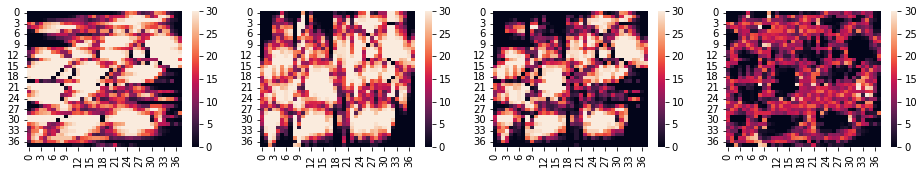

max fitness:  22.071627909127464 7.3167188315731515
max fitness:  21.91237272542832 7.475974015272296
max fitness:  22.000750598655994 7.387596142044622
max fitness:  21.861235081826283 7.5271116588743325
max fitness:  21.77389000650973 7.614456734190885
max fitness:  21.763226912660727 7.625119828039889
max fitness:  21.78092692965955 7.607419811041066
max fitness:  21.97703362814464 7.411313112555977
max fitness:  22.024904174075907 7.363442566624709
max fitness:  21.964184802453286 7.42416193824733
max fitness:  22.044910642186217 7.343436098514399
max fitness:  21.850183159709555 7.5381635809910605
max fitness:  21.867391709108606 7.52095503159201
max fitness:  21.995691396564794 7.392655344135822
max fitness:  22.23963484720376 7.148711893496856
max fitness:  22.005279084128706 7.38306765657191
max fitness:  22.386077813715534 7.0022689269850815
max fitness:  21.995972430480535 7.392374310220081
max fitness:  21.907754065281953 7.480592675418663
max fitness:  22.048658751934177 7.

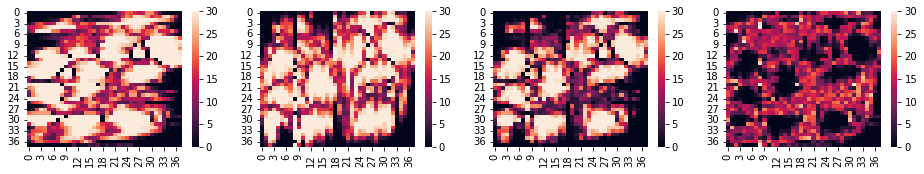

max fitness:  22.68076758146112 6.707579159239497
max fitness:  22.197228970235866 7.19111777046475
max fitness:  21.923902009722795 7.464444730977821
max fitness:  22.233019554510573 7.155327186190043
max fitness:  22.073257354124358 7.315089386576258
max fitness:  21.95906114110919 7.429285599591427
max fitness:  22.094956686141543 7.293390054559072
max fitness:  22.120323080922706 7.26802365977791
max fitness:  22.18813289658817 7.200213844112447
max fitness:  22.12583122000482 7.262515520695796
max fitness:  22.224226469687018 7.164120271013598
max fitness:  21.852421048322554 7.535925692378061
max fitness:  22.026729941939543 7.361616798761073
max fitness:  22.014763146676636 7.37358359402398
max fitness:  21.913044787624845 7.475301953075771
max fitness:  22.116069927983105 7.272276812717511
max fitness:  22.284290702021146 7.10405603867947
max fitness:  21.909583376855796 7.47876336384482
max fitness:  22.20052777398486 7.187818966715756
max fitness:  22.010240865970477 7.378105

In [ ]:
aic = AIC(M)
air = AIR(M)
Fitness.setup(aic,air)

nai = 30
nchildren = 100
niteration = 10000
nshuffle = 10
mrate = 0.975

ais = np.array([AI(M,aic,air) for _ in range(nai)])
goal = ais[0].goal
print('***goal**** ')
print(goal)


for n in range(niteration):
    
    S1, S2 = np.vstack([np.random.choice(ais,2,replace=False) for _ in range(nchildren)]).T    
    ais = AI.crossover(S1, S2,mrate = mrate)

    for _ in range(nshuffle):
        s1,s2 = np.random.choice(ais,2,replace=False)
        s1._C, s2._C = s2._C, s1._C        
        
    fitness = list(map(lambda x: x.fitness,ais))
    ais = ais[np.argsort(fitness)[::-1][:nai]]
    print('max fitness: ',np.max(fitness), goal - np.max(fitness))
    if(not n%30):
        fig, (ax1,ax2,ax3,ax4) = plt.subplots(1,4,figsize = (16,2.5))
        sns.heatmap(np.sum(np.array([ai.C for ai in ais]),0),ax = ax1)
        sns.heatmap(np.sum(np.array([ai.R for ai in ais]),0),ax = ax2)
        sns.heatmap(np.sum(np.array([ai.C & ai.R for ai in ais]),0),ax = ax3)
        sns.heatmap(np.sum(np.array([ai.C ^ ai.R for ai in ais]),0),ax = ax4)
        plt.show()


In [118]:
M.solution

'http://static.nonograms.org/files/nonograms/large/fialki10_12_1_1p.png'

In [73]:
A = np.array([1,0,0,1,0,1,1,0])

In [74]:
Max=np.array([5,6,7,8])
A = np.array([0,4,9,10])
B = np.array([1,5,6,8])

In [86]:
B + np.round((A-B) * np.random.rand(4))

array([0., 4., 9., 9.])

In [89]:
A = np.array([4,4,5,6,6,7])

In [108]:
s = np.sort(A, axis=None)
A[np.flatnonzero(s[1:] == s[:-1])+1]+=1

In [109]:
A

array([4, 5, 6, 7, 8, 9])

In [ ]:
np.array([0,0,0,1,1,1,1,1,1])